# EDA (Análisis Exploratorio de los Datos)

## Importación de las librerías

In [2]:
# API
import requests
import io
# Lectura de los csv y modificaciones
import pandas as pd
import numpy as np
import re
# Visualizaciones
import matplotlib.pyplot as plt
import geopandas as gpd
from pyproj import CRS
import seaborn as sns
sns.set()
sns.set_palette('pastel')

# Acceso a Internet

A continuación se cargaran, exploraran y analizaran los datasets proporcionados por la ENACOM correspondientes a la información del mercado, oferta, demanda y cobertura del servicio de internet (Primer Trimestre 2014 - Tercer Trimestre 2022)

La extracción de los datos se realizará a través de la API de ENACOM, así como a través de la lectura de unos archivos del tipo .xlsx obtenidos de la misma página.



## Penetración nacional del Internet fijo

Series trimestrales de la penetración del Internet fijo en las métricas por cada 100 habitantes y por cada 100 hogares

In [6]:
# Definir la URL de la API y tu API key
url = "http://api.datosabiertos.enacom.gob.ar/api/v2/datastreams/PENET-NACIO-DEL-INTER-FIJO/data.csv"
api_key = "5EBQMGTfMImArsNkwhQIuatPXtYfRNlAuSTuybbB"

# Realizar la solicitud a la API
response = requests.get(url, params={"auth_key": api_key, "limit": 900})

# Verificar si la solicitud fue exitosa
if response.status_code == 200:
  # Leer el contenido del archivo CSV en memoria como una cadena de texto
  csv_data = response.content.decode("utf-8")

  # Crear un objeto DataFrame a partir de la cadena de texto
  penetracion_internet_fijo = pd.read_csv(io.StringIO(csv_data), decimal = ",")

else:
  # Mostrar un mensaje de error si la solicitud falló
  print("Error al hacer la solicitud a la API")

In [7]:
# Imprimir las primeras 5 filas de "penetracion_internet_fijo"
penetracion_internet_fijo.head()

,Año,Trimestre,Accesos por cada 100 hogares,Accesos por cada 100 hab,Periodo
0,2022,4,77.21,24.15,Oct-Dic 2022
1,2022,3,76.64,23.95,Jul-Sept 2022
2,2022,2,75.97,23.72,Abr-Jun 2022
3,2022,1,73.88,23.05,Ene-Mar 2022
4,2021,4,73.18,22.81,Oct-Dic 2021


In [8]:
# Mostrar información del número de columnas, filas, tipos de datos y valores faltantes en "penetracion_internet_fijo"
penetracion_internet_fijo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36 entries, 0 to 35
Data columns (total 5 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Año                           36 non-null     int64  
 1   Trimestre                     36 non-null     int64  
 2   Accesos por cada 100 hogares  36 non-null     float64
 3   Accesos por cada 100 hab      36 non-null     float64
 4   Periodo                       36 non-null     object 
dtypes: float64(2), int64(2), object(1)
memory usage: 1.5+ KB


Las variables parecen estar en el formato correcto y no hay valores nulos.

In [9]:
# Cantidad de valores únicos por columna en "penetracion_internet_fijo"
penetracion_internet_fijo.nunique()

Año                              9
Trimestre                        4
Accesos por cada 100 hogares    36
Accesos por cada 100 hab        36
Periodo                         36
dtype: int64

In [10]:
# Valores únicos en la columna "Año"
penetracion_internet_fijo['Año'].unique()

array([2022, 2021, 2020, 2019, 2018, 2017, 2016, 2015, 2014])

In [11]:
# Valores únicos en la columna "Periodo"
penetracion_internet_fijo['Periodo'].unique()

array(['Oct-Dic 2022', 'Jul-Sept 2022', 'Abr-Jun 2022', 'Ene-Mar 2022',
       'Oct-Dic 2021', 'Jul-Sept 2021', 'Abr-Jun 2021', 'Ene-Mar 2021',
       'Oct-Dic 2020', 'Jul-Sept 2020', 'Abr-Jun 2020', 'Ene-Mar 2020',
       'Oct-Dic 2019', 'Jul-Sept 2019', 'Abr-Jun 2019', 'Ene-Mar 2019',
       'Oct-Dic 2018', 'Jul-Sept 2018', 'Abr-Jun 2018', 'Ene-Mar 2018',
       'Oct-Dic 2017', 'Jul-Sept 2017', 'Abr-Jun 2017', 'Ene-Mar 2017',
       'Oct-Dic 2016', 'Jul-Sept 2016', 'Abr-Jun 2016', 'Ene-Mar 2016',
       'Oct-Dic 2015', 'Jul-Sept 2015', 'Abr-Jun 2015', 'Ene-Mar 2015',
       'Oct-Dic 2014', 'Jul-Sept 2014', 'Abr-Jun 2014', 'Ene-Mar 2014'],
      dtype=object)

In [12]:
# Se crea una columna 'Fecha' combinando 'Año' y 'Trimestre' en un objeto de fecha
penetracion_internet_fijo['Fecha'] = pd.to_datetime(penetracion_internet_fijo['Año'].astype(str) + 'Q' + penetracion_internet_fijo['Trimestre'].astype(str))

### Resumen Estadístico

In [13]:
# Mostrar un resumen estadístico de las columnas numériocas de "penetracion_internet_fijo"
penetracion_internet_fijo.describe()

,Año,Trimestre,Accesos por cada 100 hogares,Accesos por cada 100 hab
count,36.000000,36.000000,36.000000,36.000000
mean,2018.000000,2.500000,60.745833,18.760278
std,2.618615,1.133893,8.513140,2.782531
min,2014.000000,1.000000,49.550000,15.050000
25%,2016.000000,1.750000,53.162500,16.307500
50%,2018.000000,2.500000,59.925000,18.485000
75%,2020.000000,3.250000,66.637500,20.695000
max,2022.000000,4.000000,77.210000,24.150000


**Apreciaciones:**

La estadística descriptiva muestra que,
- En promedio, la penetración del Internet fijo es mayor por hogar que por habitante. El promedio de accesos por cada 100 hogares es de 60.74, mientras que el promedio de accesos por cada 100 habitantes es de 18.76.

- La desviación estándar indica una variabilidad en los datos, lo que sugiere que hay una amplia gama de niveles de penetración en diferentes regiones del país.

Estas cifras pueden ser útiles para tener una idea general de la penetración de Internet fijo en Argentina. Pero sin duda hace falta más información ya que la penetración real varía en diferentes regiones y ciudades, y también puede variar según el proveedor de servicios de Internet.


### Análisis Univariable

A continuación, se realizarán algunas visualizaciones para explorar el conjunto de datos con más detalle. Primero, se observará la distribución de la cantidad de accesos por cada 100 hogares y por cada 100 habitantes:

#### ```Accesos por cada 100 hogares```, ```Accesos por cada 100 hab```

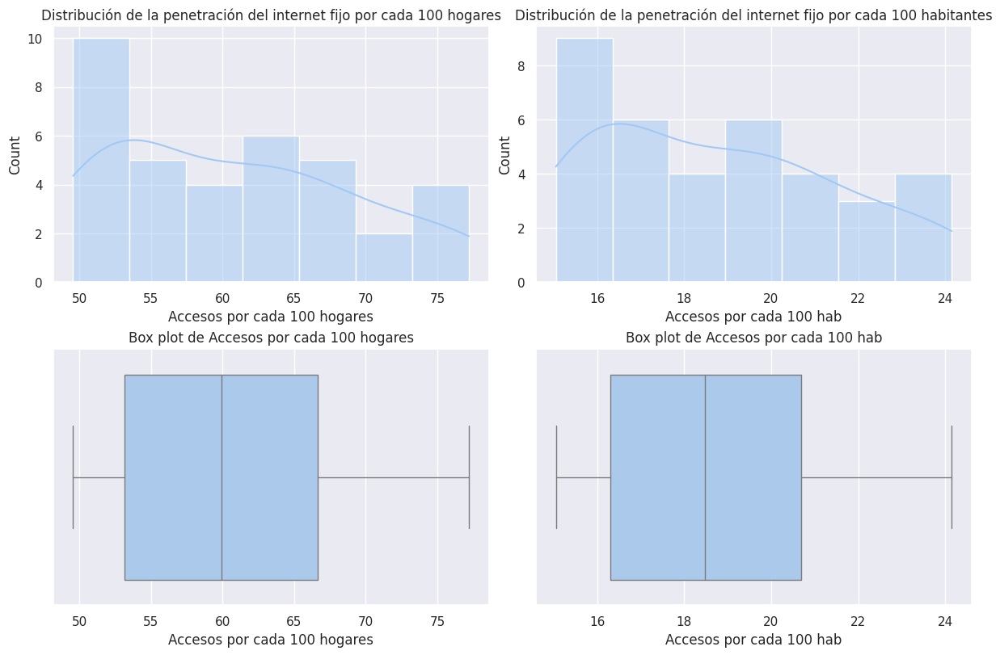

In [14]:
# Observando la distribución de los datos
fig, axes = plt.subplots(2, 2, figsize = (12, 8), constrained_layout = True)

# Histograma y boxplot de la columna 'Accesos por cada 100 hogares'
sns.histplot(data = penetracion_internet_fijo, x = 'Accesos por cada 100 hogares', kde = True, ax = axes[0,0])
ax = axes[0,0].set_title('Distribución de la penetración del internet fijo por cada 100 hogares')
sns.boxplot(data = penetracion_internet_fijo, x='Accesos por cada 100 hogares', linewidth = 1, ax = axes[1,0])
axes[1,0].set_title('Box plot de Accesos por cada 100 hogares')
# Histograma y boxplot de la columna 'Accesos por cada 100 hab'
sns.histplot(data = penetracion_internet_fijo, x='Accesos por cada 100 hab', kde = True, ax = axes[0,1])
axes[0,1].set_title('Distribución de la penetración del internet fijo por cada 100 habitantes')
sns.boxplot(data = penetracion_internet_fijo, x='Accesos por cada 100 hab', linewidth = 1, ax = axes[1,1])
axes[1,1].set_title('Box plot de Accesos por cada 100 hab')

# Mostrar grafico completo
plt.show()

**Apreciaciones:**

- La penetración del internet fijo por cada 100 hogares tiene una distribución cercana a la normal, con una media alrededor del 63% y una mediana alrededor del 65%.
- La distribución de la penetración del internet fijo por cada 100 habitantes tiene una forma similar a la de la penetración por hogares, pero con una media y mediana más bajas, alrededor del 20%.
- Para ambos atributos, no se observa valores atípicos en las colas de su respectivos boxplot
- La mayoría de los trimestres tienen una penetración del internet fijo por cada 100 hogares/habitantes dentro del rango intercuartílico (IQR), lo que significa que la mayoría de los trimestres tienen una penetración del internet fijo relativamente similar

#### ```Trimestre```

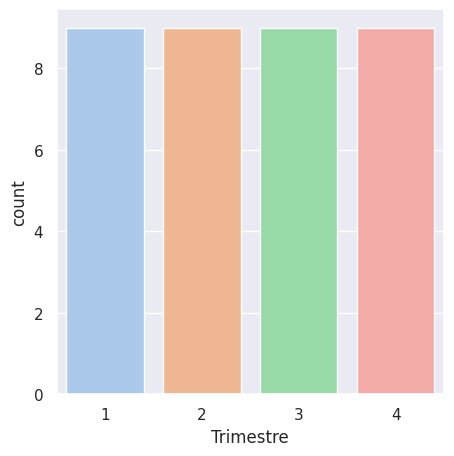

In [15]:
# Gráfico de barras de los trimestres
plt.figure(figsize = (5,5))
sns.countplot(data = penetracion_internet_fijo, x = 'Trimestre')
# Mostrar la figura
plt.show()

**Apreciación:**

- El número de registros está distribuido de manera equitativa entre los cuatro trimestres para cada año.

### Análisis Bivariable

#### ```Año``` vs ```Accesos por cada 100 hogares```

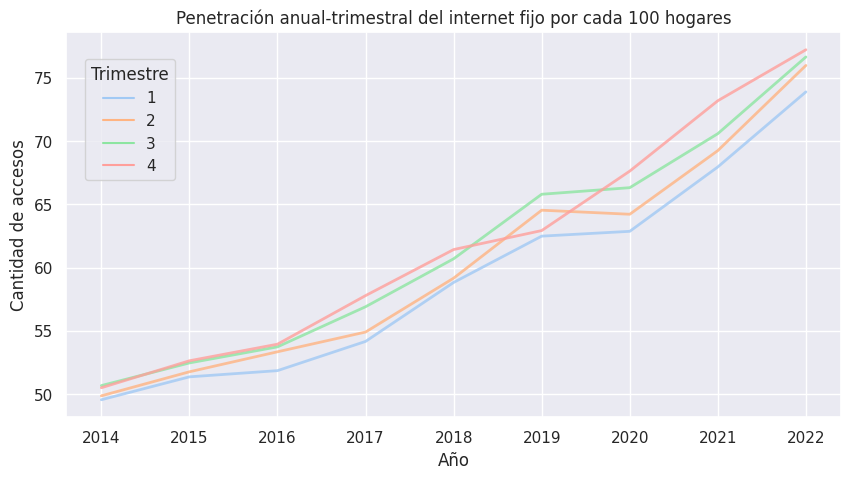

In [16]:
# Tamaño del gráfico
plt.figure(figsize  = (10, 5))

# Crear un gráfico de línea de la penetración del internet fijo por año y trimestre
sns.lineplot(x = 'Año', y = 'Accesos por cada 100 hogares', hue = 'Trimestre', data = penetracion_internet_fijo,
             palette = 'pastel', linewidth = 2, alpha = 0.8)

# Agregar etiquetas y leyenda
plt.title('Penetración anual-trimestral del internet fijo por cada 100 hogares')
plt.xlabel('Año')
plt.ylabel('Cantidad de accesos')
plt.legend(title = 'Trimestre', loc = 'upper right', bbox_to_anchor = (0.15, 0.95))

# Mostrar el gráfico completo
plt.show()

**Apreaciones:**

- Hay una cierta estacionalidad en la penetración del internet fijo, con un patrón de aumento y disminución a lo largo de los años que se repite cada año. En particular, se puede observar que la penetración del internet fijo tiende a ser más baja en los primeros trimestres de cada año y más alta en los últimos trimestres

- El trimestre con la menor penetración del internet fijo por cada 100 hogares fue el Trimestre 1 de 2014, mientras que el trimestre con la mayor penetración del internet fijo por cada 100 hogares fue el Trimestre 4 de 2022

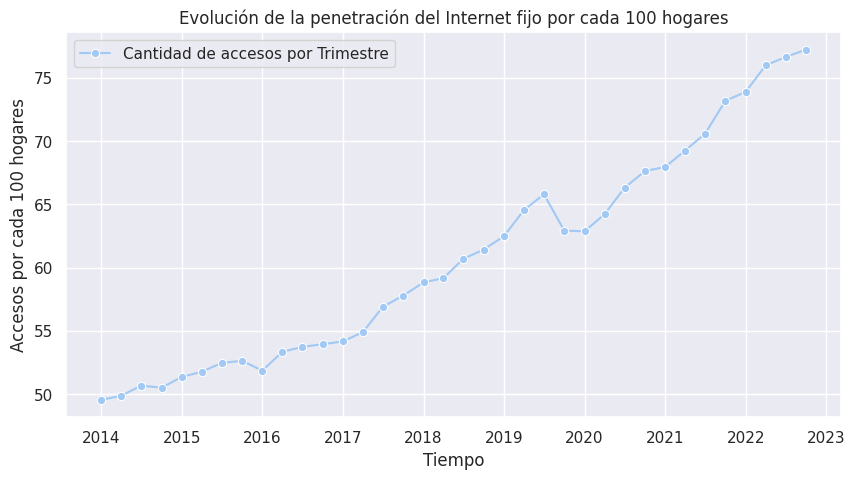

In [17]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(10, 5))

# Graficar la evolución de la penetración del Internet fijo por cada 100 hogares
sns.lineplot(x = 'Fecha', y = 'Accesos por cada 100 hogares', data = penetracion_internet_fijo,
             label = 'Cantidad de accesos por Trimestre', marker = 'o')

# Agregar etiquetas de eje y títulos del gráfico
plt.xlabel("Tiempo")
plt.ylabel("Accesos por cada 100 hogares")
plt.title("Evolución de la penetración del Internet fijo por cada 100 hogares")
# Mostrar grafico completo
plt.show()

- El aumento en la penetración del Internet fijo no ha sido uniforme, con algunas fluctuaciones en la tasa de crecimiento a lo largo del tiempo. Las cuales pudieron ser causadas por una variedad de factores, como cambios en la economía, política y tecnología.

- En general, el gráfico muestra un crecimiento constante en la penetración del Internet fijo por cada 100 hogares en Argentina desde el primer trimestre de 2014 hasta el segundo trimestre de 2019. Luego, en el tercer trimestre de 2019, hay una disminución en la penetración del Internet fijo, que se recupera en el primer trimestre de 2020 y continúa aumentando después de ese período.

- La penetración del Internet fijo por cada 100 hogares en Argentina ha seguido aumentando en general, especialmente en el contexto de la pandemia de COVID-19, que ha aumentado la demanda de conexión a Internet en todo el mundo.

#### ```Año``` vs ```Acessos por cada 100 hab```

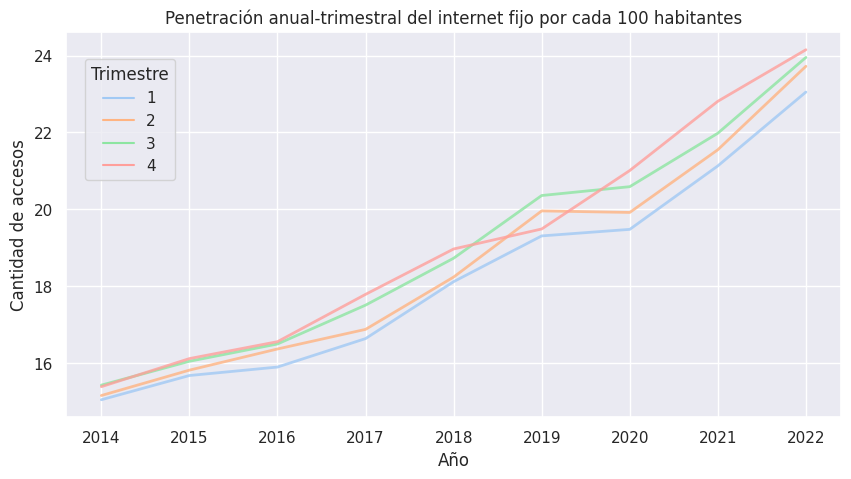

In [18]:
# Tamaño del gráfico
plt.figure(figsize  = (10, 5))

# Crear un gráfico de línea de la penetración del internet fijo por año y trimestre
sns.lineplot(x = 'Año', y = 'Accesos por cada 100 hab', hue = 'Trimestre', data = penetracion_internet_fijo,
             palette = 'pastel', linewidth = 2, alpha = 0.8)

# Agregar etiquetas y leyenda
plt.title('Penetración anual-trimestral del internet fijo por cada 100 habitantes')
plt.xlabel('Año')
plt.ylabel('Cantidad de accesos')
plt.legend(title = 'Trimestre', loc = 'upper right', bbox_to_anchor = (0.15, 0.95))

# Mostrar el gráfico completo
plt.show()

**Apreciaciones:**

- La tasa de crecimiento en la penetración del internet fijo parece ser más alta en los últimos trimestres de cada año, lo que sugiere que hay un aumento en la demanda de acceso a Internet durante los meses más fríos del año, posiblemente debido a que las personas pasan más tiempo en interiores y utilizan más servicios de Internet.
- En general, la tasa de crecimiento en la penetración del internet fijo parece ser más baja en los primeros trimestres de cada año, aunque aún hay un aumento constante en la cantidad de accesos.
- El gráfico también muestra que la penetración del internet fijo fue más baja en los primeros años del período representado (2014-2016), pero desde entonces ha aumentado constantemente.


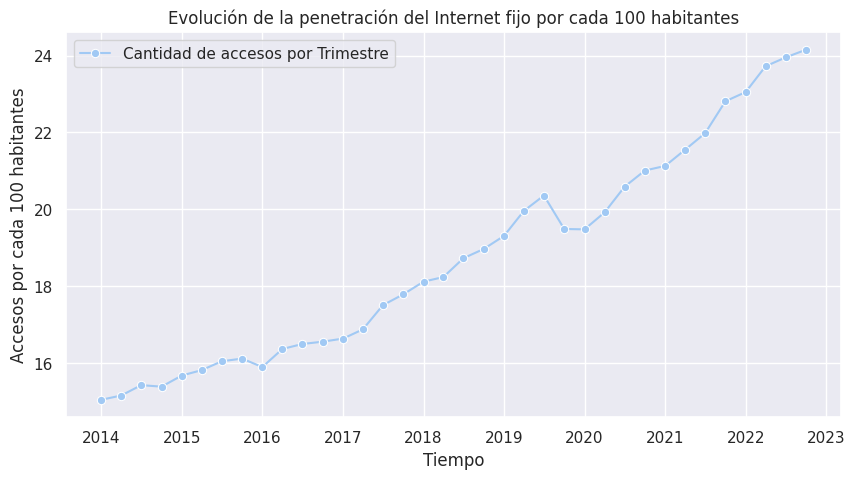

In [19]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(10, 5))

# Graficar la evolución de la penetración del Internet fijo por cada 100 habitantes
sns.lineplot(x = 'Fecha', y = 'Accesos por cada 100 hab', data = penetracion_internet_fijo,
             label = 'Cantidad de accesos por Trimestre', marker = 'o')

# Agregar etiquetas de eje y títulos del gráfico
plt.xlabel("Tiempo")
plt.ylabel("Accesos por cada 100 habitantes")
plt.title("Evolución de la penetración del Internet fijo por cada 100 habitantes")
# Mostrar grafico completo
plt.show()

**Apreciaciones:**

- El aumento en la penetración del internet fijo no ha sido uniforme, con algunas fluctuaciones en la tasa de crecimiento a lo largo del tiempo.
- El gráfico muestra una tendencia positiva en la penetración del internet fijo por cada 100 habitantes en Argentina, lo que indica que cada vez más personas tienen acceso a internet fijo en el país. También sugiere que la pandemia de COVID-19 pudo haber impulsado aún más la demanda de acceso a internet fijo en Argentina, lo que resalta la importancia del acceso a internet en la vida cotidiana en el país.

#### ```Accesos por cada 100 hogares``` vs ```Accesos por cada 100 hab```

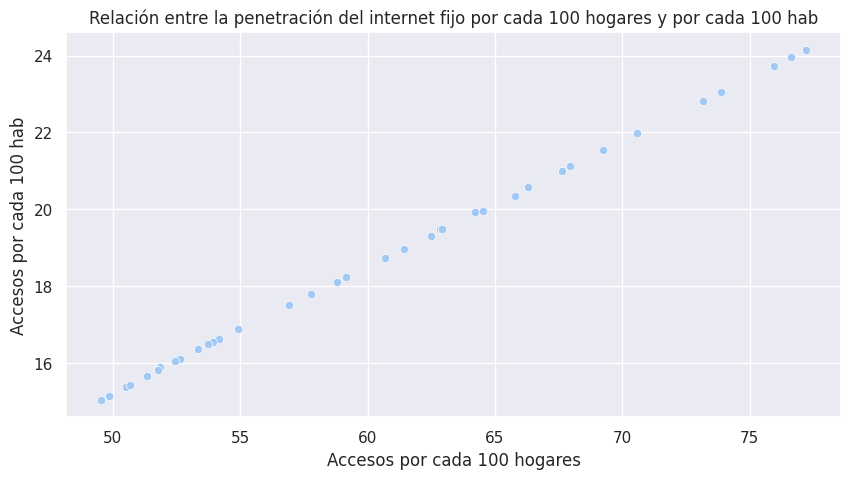

In [20]:
# Tamaño del gráfico
plt.figure(figsize = (10, 5))

# Graficar la relación entre la penetración del internet fijo por cada 100 hogares y por cada 100 hab
sns.scatterplot(x = 'Accesos por cada 100 hogares', y = 'Accesos por cada 100 hab', data = penetracion_internet_fijo)
plt.title('Relación entre la penetración del internet fijo por cada 100 hogares y por cada 100 hab')
plt.show()

**Apreciación:**

- El gráfico de dispersión muestra una relación positiva entre las dos variables, lo que indica que los hogares con una mayor penetración de internet fijo también tienen una mayor penetración de internet por habitante.

In [21]:
df = penetracion_internet_fijo[['Trimestre', 'Accesos por cada 100 hogares', 'Accesos por cada 100 hab']].copy()

# Calcular el promedio de penetración del internet fijo por trimestre y el cambio porcentual trimestral
df['Promedio trimestral'] = df[['Accesos por cada 100 hogares', 'Accesos por cada 100 hab']].mean(axis=1)
df['Cambio trimestral'] = df['Promedio trimestral'].pct_change()

# Encontrar los valores máximos y mínimos de la columna 'Accesos por cada 100 hogares' y 'Accesos por cada 100 hab'
max_hogares = df['Accesos por cada 100 hogares'].max()
min_hogares = df['Accesos por cada 100 hogares'].min()
max_hab = df['Accesos por cada 100 hab'].max()
min_hab = df['Accesos por cada 100 hab'].min()

# Imprimir las conclusiones
print('La penetración del internet fijo en Argentina ha aumentado progresivamente durante los últimos años, con un incremento promedio del {:.2f}% por trimestre.'.format(df['Cambio trimestral'].mean()*100*-1))
print('El trimestre con la mayor penetración de internet fijo por cada 100 hogares fue el {} con {:.2f} accesos.'.format(df.loc[df['Accesos por cada 100 hogares'] == max_hogares, 'Trimestre'].values[0], max_hogares))
print('El trimestre con la menor penetración de internet fijo por cada 100 hogares fue el {} con {:.2f} accesos.'.format(df.loc[df['Accesos por cada 100 hogares'] == min_hogares, 'Trimestre'].values[0], min_hogares))
print('El trimestre con la mayor penetración de internet fijo por cada 100 hab fue el {} con {:.2f} accesos.'.format(df.loc[df['Accesos por cada 100 hab'] == max_hab, 'Trimestre'].values[0], max_hab))
print('El trimestre con la menor penetración de internet fijo por cada 100 hab fue el {} con {:.2f} accesos.'.format(df.loc[df['Accesos por cada 100 hab'] == min_hab, 'Trimestre'].values[0], min_hab))

La penetración del internet fijo en Argentina ha aumentado progresivamente durante los últimos años, con un incremento promedio del 1.27% por trimestre.
El trimestre con la mayor penetración de internet fijo por cada 100 hogares fue el 4 con 77.21 accesos.
El trimestre con la menor penetración de internet fijo por cada 100 hogares fue el 1 con 49.55 accesos.
El trimestre con la mayor penetración de internet fijo por cada 100 hab fue el 4 con 24.15 accesos.
El trimestre con la menor penetración de internet fijo por cada 100 hab fue el 1 con 15.05 accesos.


**Apreciaciones finales:**

Los datos correspondientes a Argentina muestran la evolución de la penetración del internet fijo en el país durante los últimos años. Algunas conclusiones que se pueden sacar de estos datos son:

- La penetración del internet fijo en Argentina ha aumentado progresivamente durante los últimos años, pasando de un 49.55% en el primer trimestre de 2014 a un 77.64% en el tercer trimestre de 2022.

- Durante los últimos años, la penetración del internet fijo ha aumentado de forma constante, con un incremento promedio del 1.27% por trimestre.

- En términos absolutos, el mayor aumento en la penetración del internet fijo se produjo entre el cuarto trimestre de 2014 y el primer trimestre de 2015, cuando la penetración aumentó de un 50.5% a un 51.36%.

- En términos relativos, el mayor aumento en la penetración del internet fijo se produjo entre el segundo trimestre de 2020 y el tercer trimestre de 2020, cuando la penetración aumentó de un 64.21% a un 66.31%, lo que representa un incremento del 3.28%.

- Algunas posibles explicaciones de por qué la penetración del Internet fijo es mayor por hogar que por habitante en Argentina:

  1. Hogares con múltiples usuarios: Una posible explicación es que muchos hogares en Argentina tienen múltiples usuarios que comparten una única conexión de Internet fijo.

  2. Hogares con mayores ingresos: Otra posible explicación es que los hogares con mayores ingresos tienden a tener una mayor penetración de Internet fijo.

  3. Diferencias geográficas: La penetración del Internet fijo puede variar significativamente según la ubicación geográfica.

  4. Diferentes necesidades de los usuarios: Los hogares tienen diferentes necesidades de Internet fijo dependiendo de su uso.

## Penetración de Internet fijo (accesos por cada 100 hogares)
Número de accesos al servicio de Internet fijo por cada 100 hogares por provincia

In [ ]:
# Definir la URL de la API y tu API key
url = "http://api.datosabiertos.enacom.gob.ar/api/v2/datastreams/PENET-DEL-INTER-FIJO-51614/data.csv"
api_key = "5EBQMGTfMImArsNkwhQIuatPXtYfRNlAuSTuybbB"

# Realizar la solicitud a la API
response = requests.get(url, params={"auth_key": api_key, "limit": 900})

# Verificar si la solicitud fue exitosa
if response.status_code == 200:
  # Leer el contenido del archivo CSV en memoria como una cadena de texto
  csv_data = response.content.decode("utf-8")

  # Crear un objeto DataFrame a partir de la cadena de texto
  penetracion_hogares_prov = pd.read_csv(io.StringIO(csv_data), decimal = ",")

else:
  # Mostrar un mensaje de error si la solicitud falló
  print("Error al hacer la solicitud a la API")

In [ ]:
# Imprimir las primeras 5 filas de "penetracion_hogares_prov"
penetracion_hogares_prov.head()

,Año,Trimestre,Provincia,Accesos por cada 100 hogares
0,2022,4,Buenos Aires,78.94
1,2022,4,Capital Federal,122.73
2,2022,4,Catamarca,65.77
3,2022,4,Chaco,43.62
4,2022,4,Chubut,85.57


In [ ]:
# Mostrar información del número de columnas, filas, tipos de datos y valores faltantes en "penetracion_hogares_prov"
penetracion_hogares_prov.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 864 entries, 0 to 863
Data columns (total 4 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Año                           864 non-null    int64  
 1   Trimestre                     864 non-null    int64  
 2   Provincia                     864 non-null    object 
 3   Accesos por cada 100 hogares  864 non-null    float64
dtypes: float64(1), int64(2), object(1)
memory usage: 27.1+ KB


Las variables parecen estar en el formato correcto y no hay valores nulos.

In [ ]:
# Cantidad de valores únicos por columna en "penetracion_hogares_prov"
penetracion_hogares_prov.nunique()

Año                               9
Trimestre                         4
Provincia                        24
Accesos por cada 100 hogares    801
dtype: int64

In [ ]:
# Valores únicos en la columna "Año"
penetracion_hogares_prov['Año'].unique()

array([2022, 2021, 2020, 2019, 2018, 2017, 2016, 2015, 2014])

In [ ]:
# Valores únicos en la columna "Provincia"
penetracion_hogares_prov['Provincia'].unique()

array(['Buenos Aires', 'Capital Federal', 'Catamarca', 'Chaco', 'Chubut',
       'Córdoba', 'Corrientes', 'Entre Ríos', 'Formosa', 'Jujuy',
       'La Pampa', 'La Rioja', 'Mendoza', 'Misiones', 'Neuquén',
       'Río Negro', 'Salta', 'San Juan', 'San Luis', 'Santa Cruz',
       'Santa Fe', 'Santiago Del Estero', 'Tierra Del Fuego', 'Tucumán'],
      dtype=object)

In [ ]:
# Se crea una columna 'Fecha' combinando 'Año' y 'Trimestre' en un objeto de fecha
penetracion_hogares_prov['Fecha'] = pd.to_datetime(penetracion_hogares_prov['Año'].astype(str) + 'Q' + penetracion_hogares_prov['Trimestre'].astype(str))

### Transformaciones en los datos

In [ ]:
# Modificar algunos nombres de las provincias para mantener la uniformidad con los demás Dataframes
penetracion_hogares_prov['Provincia'] = penetracion_hogares_prov['Provincia'].str.replace('Santiago Del', 'Santiago del')
penetracion_hogares_prov['Provincia'] = penetracion_hogares_prov['Provincia'].str.replace('Tierra Del', 'Tierra del')
# Verificar que los cambios se aplicaron correctamente
penetracion_hogares_prov['Provincia'].unique()

array(['Buenos Aires', 'Capital Federal', 'Catamarca', 'Chaco', 'Chubut',
       'Córdoba', 'Corrientes', 'Entre Ríos', 'Formosa', 'Jujuy',
       'La Pampa', 'La Rioja', 'Mendoza', 'Misiones', 'Neuquén',
       'Río Negro', 'Salta', 'San Juan', 'San Luis', 'Santa Cruz',
       'Santa Fe', 'Santiago del Estero', 'Tierra del Fuego', 'Tucumán'],
      dtype=object)

### Resumen estadístico:

In [ ]:
# Mostrar un resumen estadístico de las columnas numériocas de "penetracion_internet_fijo"
penetracion_hogares_prov.describe()

,Año,Trimestre,Accesos por cada 100 hogares
count,864.000000,864.000000,864.000000
mean,2018.000000,2.500000,49.620301
std,2.583484,1.118682,23.319150
min,2014.000000,1.000000,9.350000
25%,2016.000000,1.750000,32.220000
50%,2018.000000,2.500000,46.390000
75%,2020.000000,3.250000,62.442500
max,2022.000000,4.000000,124.060000


**Apreciaciones:**

- La media de accesos por cada 100 hogares en el periodo de tiempo considerado es de 49.07, lo que indica que, en promedio, hay menos de 50 accesos a internet por cada 100 hogares en Argentina. Sin embargo, el valor máximo de 124.06 sugiere que hay algunas provincias con una alta penetración de acceso a internet en hogares.
- La desviación estándar de la variable "Accesos por cada 100 hogares" es de 23.15, lo que indica que hay una gran variabilidad en los datos. Esto sugiere que algunas provincias pueden tener una cantidad significativamente mayor o menor de accesos a internet en hogares que otras.
- El valor mínimo de la variable "Accesos por cada 100 hogares" es de 9.35, lo que sugiere que hay algunas provincias con una penetración de acceso a internet en hogares muy baja.
- El hecho de que el valor mínimo de la variable "Año" sea 2014 indica que los datos abarcan un período de tiempo de al menos 8 años, lo que puede permitir el análisis de tendencias a lo largo del tiempo.

### Análisis Univariable

A continuación, se realizarán algunas visualizaciones para explorar el conjunto de datos con más detalle. Primero, se observará la distribución de la cantidad de accesos por cada 100 hogares:

#### ```Accesos por cada 100 hogares```

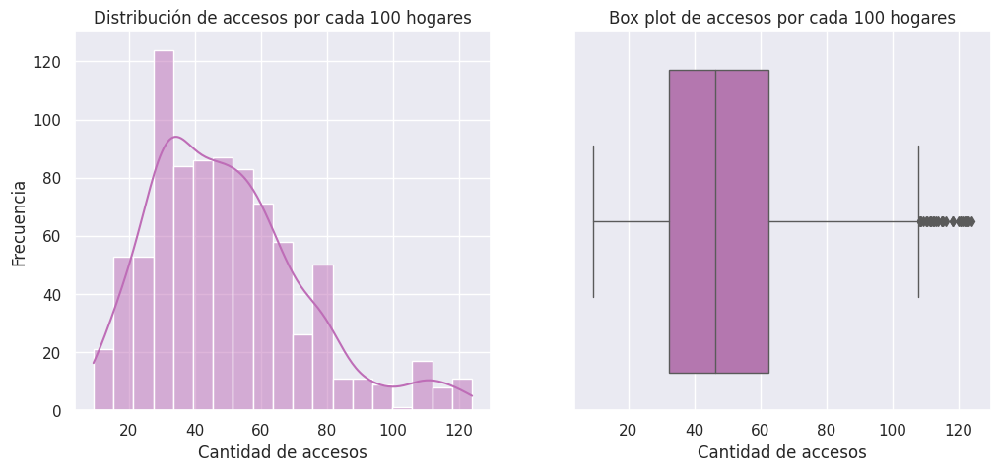

In [ ]:
# Crear la figura con dos subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

# Histograma en el subplot de la izquierda "Accesos por cada 100 hogares"
sns.histplot(data = penetracion_hogares_prov, x = 'Accesos por cada 100 hogares',
             kde =  True, color = '#BE6DB7', ax = ax1)
ax1.set_title('Distribución de accesos por cada 100 hogares')
ax1.set_xlabel('Cantidad de accesos')
ax1.set_ylabel('Frecuencia')

# Box plot en el subplot de la derecha
sns.boxplot(data = penetracion_hogares_prov, x = 'Accesos por cada 100 hogares', color = '#BE6DB7',
            linewidth = 1, ax = ax2)
ax2.set_title('Box plot de accesos por cada 100 hogares')
ax2.set_xlabel('Cantidad de accesos')

# Mostrar la figura
plt.show()

**Apreciaciones:**

- La distribución de la variable "Accesos por cada 100 hogares" está sesgada hacia la derecha, lo que sugiere que la mayoría de las provincias tienen una baja penetración de acceso a internet en hogares.

- El boxplot muestra algunos valores atípicos en la parte superior de la distribución, lo que sugiere que hay algunas provincias con una alta penetración de acceso a internet en hogares.

#### ```Trimestre```

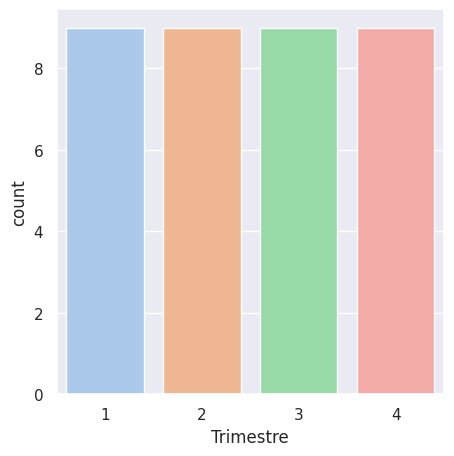

In [ ]:
# Gráfico de barras de los trimestres
plt.figure(figsize = (5,5))
sns.countplot(data = penetracion_internet_fijo, x = 'Trimestre')
# Mostrar la figura
plt.show()

**Apreciación**:

- El número de registros no está distribuido de manera equitativa entre los cuatro trimestres, ya que los datos se han actualizado hasta el tercer trimestre del año 2022. Por lo tanto, al analizar los datos de este año, es necesario considerar esta falta de distribución en los registros.

### Análisis Bivariable

#### ```Provincia``` vs ```Accesos cada 100 hogares```

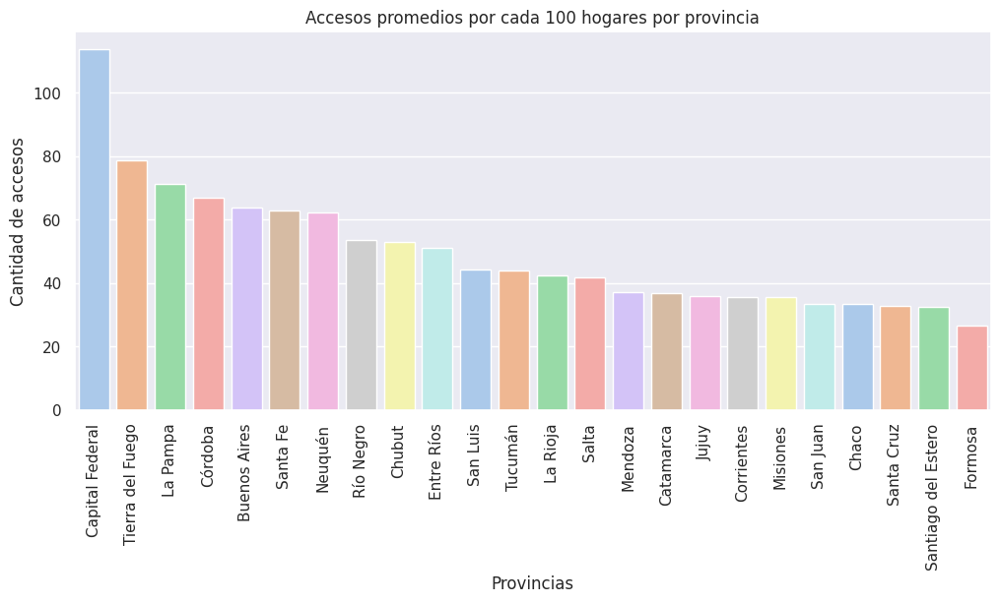

In [ ]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(12, 5))

# Gráfico de barras de la columna "Provincia" vs "Accesos por cada 100 hogares"
df_provincias = penetracion_hogares_prov.groupby('Provincia')['Accesos por cada 100 hogares'].mean().reset_index()
df_provincias = df_provincias.sort_values('Accesos por cada 100 hogares', ascending = False)
sns.barplot(data=df_provincias, x='Provincia', y='Accesos por cada 100 hogares', palette = 'pastel')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Accesos promedios por cada 100 hogares por provincia')
plt.xlabel('Provincias')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar la figura
plt.show()

**Apreciaciones:**

- Capital Federal y Tierra de Fuego tienen la mayor cantidad promedio de accesos a internet por cada 100 hogares, con aproximadamente 70 accesos por cada 100 hogares.
- Las provincias que desde Mendoza hasta Formosa en el gráfico tienen la menor cantidad promedio de accesos a internet por cada 100 hogares, con menos de 40 accesos por cada 100 hogares.
- Varias provincias tienen una cantidad promedio de accesos a internet por cada 100 hogares cercana a la media nacional de 49.07 accesos por cada 100 hogares, como Río Negro, Chubut y Entre Ríos.
- El gráfico también muestra una gran variabilidad en la cantidad promedio de accesos a internet por cada 100 hogares entre las diferentes provincias.

#### ```Año``` vs ```Accesos por cada 100 hogares```

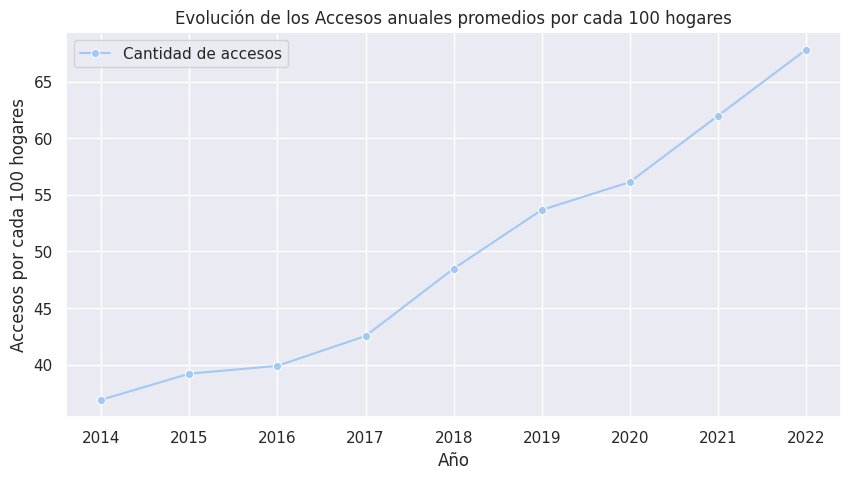

In [ ]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(10, 5))

# Gráfico de línea de la columna "Accesos por cada 100 hogares" vs "Año"
df_anual = penetracion_hogares_prov.groupby('Año')['Accesos por cada 100 hogares'].mean().reset_index()
sns.lineplot(x = 'Año', y = 'Accesos por cada 100 hogares', data = df_anual,
             label = 'Cantidad de accesos', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los Accesos anuales promedios por cada 100 hogares')
plt.xlabel('Año')
plt.ylabel('Accesos por cada 100 hogares')
# Mostrar la figura
plt.show()

**Apreciaciones:**

- La cantidad promedio de accesos a internet por cada 100 hogares ha aumentado de manera constante a lo largo del tiempo. Este aumento sugiere que se están realizando esfuerzos para mejorar el acceso a internet en hogares en todo el país.

- Se puede ver que hay una ligera disminución en la cantidad promedio de accesos a internet por cada 100 hogares desde 2019 hasta 2020, seguida de un aumento en 2021.

- Esta disminución en 2020 puede estar relacionada con la pandemia de COVID-19 y las dificultades que muchas personas enfrentaron para acceder a internet debido a la pérdida de empleo, la falta de recursos económicos o la necesidad de compartir internet en hogares con más personas que antes. También es posible que se hayan implementado medidas para reducir el costo de los servicios de internet en hogares, lo que podría haber afectado la cantidad promedio de accesos a internet por cada 100 hogares.

### Análisis Multivariable

#### Penetración promedio anual-trimestral del Internet fijo por hogares a nivel regional

```Año``` vs ```Trimestre``` vs ```Provincia``` vs ```Accesos por cada 100 hogares```

Para facilitar el análisis en cada una de las provincias, se procede a explorar los datos por regiones. Es importante tener en cuenta que, aunque estas divisiones se utilizarán para fines estadísticos y de análisis, no son necesariamente oficiales y pueden variar según la fuente que se consulte. Además que cada una de estas regiones tienen sus propias características y particularidades, y que pueden haber diferencias significativas en términos de acceso a la tecnología y otros indicadores socioeconómicos entre las provincias y regiones dentro de cada una de ellas.

In [ ]:
# Región Patagonia de Argentina
patagonia = penetracion_hogares_prov[penetracion_hogares_prov['Provincia'].isin(['Tierra del Fuego', 'Santa Cruz',
                                                                                 'Chubut', 'Neuquén', 'Río Negro'])]

# Región de Cuyo de Argentina
cuyo = penetracion_hogares_prov[penetracion_hogares_prov['Provincia'].isin(['Mendoza', 'San Luis', 'San Juan'])]

# Región Pampeana de Argentina
pampeana = penetracion_hogares_prov[penetracion_hogares_prov['Provincia'].isin(['Buenos Aires', 'Capital Federal',
                                                                                'Santa Fe', 'Córdoba', 'La Pampa'])]

# Región Noroeste de Argentina
noroeste = penetracion_hogares_prov[penetracion_hogares_prov['Provincia'].isin(['La Rioja', 'Catamarca', 'Tucumán',
                                                                                'Santiago del Estero', 'Salta', 'Jujuy'])]

# Región Noreste de Argentina
noreste = penetracion_hogares_prov[penetracion_hogares_prov['Provincia'].isin(['Chaco', 'Formosa', 'Corrientes',
                                                                               'Entre Ríos', 'Misiones'])]

##### Región Patagonia

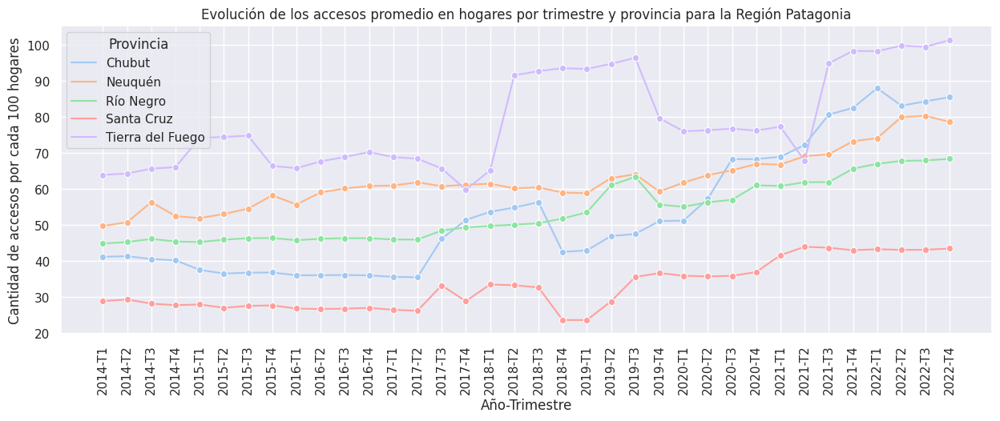

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Accesos por cada 100 hogares"
df_promedio = patagonia.groupby(['Año','Trimestre','Provincia'], as_index=False)['Accesos por cada 100 hogares'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y =  'Accesos por cada 100 hogares', hue = 'Provincia',
             style = 'Provincia', dashes =  False, marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedio en hogares por trimestre y provincia para la Región Patagonia')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos por cada 100 hogares')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
plt.show()

**Apreciaciones:**

- El gráfico muestra una tendencia general al alza en la cantidad promedio de accesos a internet por cada 100 hogares en todas las provincias de la región, con algunas fluctuaciones a corto plazo.
- Tierra del Fuego tiene la mayor cantidad promedio de accesos a internet por cada 100 hogares en la región, seguida de cerca por Neuquén y Chubut desde el tercer trimestre año 2021.
- Río Negro y Santa Cruz tienen la menor cantidad promedio de accesos a internet por cada 100 hogares en la región, pero también muestran una tendencia al alza a lo largo del tiempo.
- El gráfico también muestra una variabilidad en la cantidad promedio de accesos a internet por cada 100 hogares entre las diferentes provincias y trimestres, lo que sugiere que puede haber factores externos que afectan la disponibilidad de acceso a internet en hogares en la región.

##### Región de Cuyo

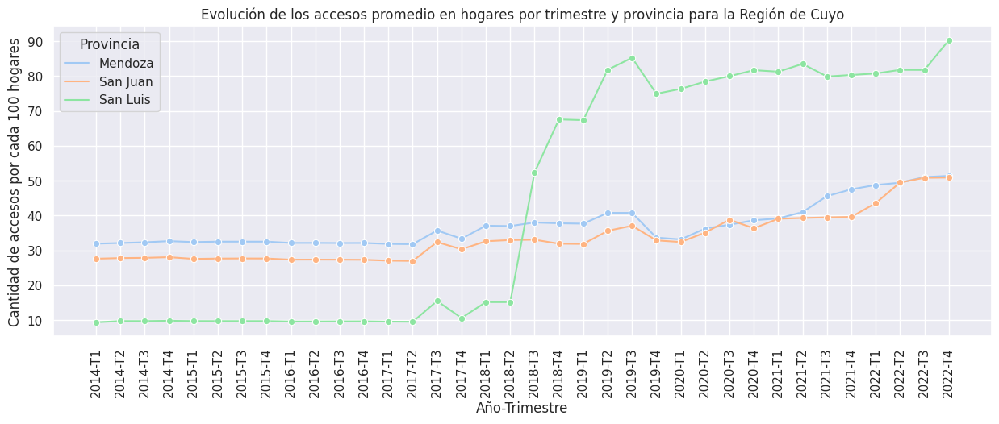

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Accesos por cada 100 hogares"
df_promedio = cuyo.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Accesos por cada 100 hogares'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Accesos por cada 100 hogares', hue = 'Provincia',
             style = 'Provincia', dashes = False, marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedio en hogares por trimestre y provincia para la Región de Cuyo')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos por cada 100 hogares')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
plt.show()

**Apreciaciones:**

- El gráfico muestra una tendencia general al alza en la cantidad promedio de accesos a internet por cada 100 hogares en las tres provincias de la región, con algunas fluctuaciones a corto plazo.
- San Juan tiene la mayor cantidad promedio de accesos a internet por cada 100 hogares en la región, seguida por Mendoza y San Luis.
- Aunque todas las provincias muestran una tendencia al alza en la cantidad promedio de accesos a internet por cada 100 hogares, San Juan muestra la mayor tasa de crecimiento en la cantidad promedio de accesos a internet por cada 100 hogares en la región.

##### Región Pampeana

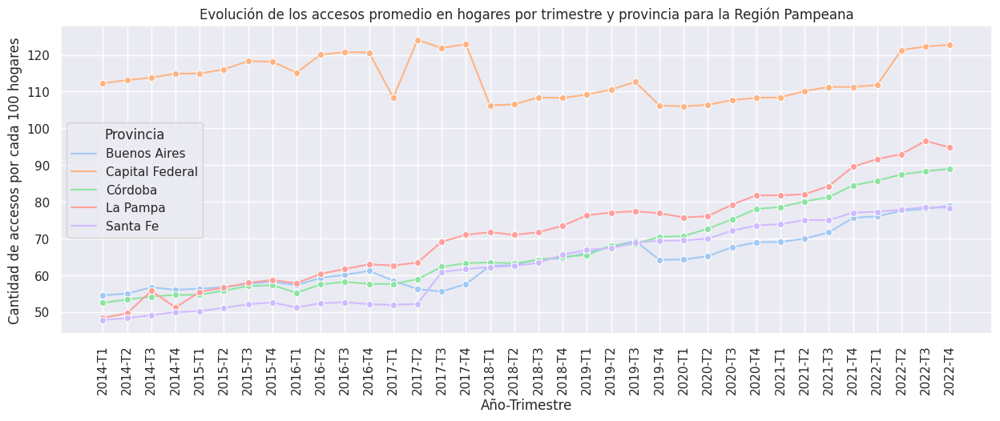

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Accesos por cada 100 hogares"
df_promedio = pampeana.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Accesos por cada 100 hogares'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Accesos por cada 100 hogares', hue = 'Provincia',
             style = 'Provincia', dashes = False, marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedio en hogares por trimestre y provincia para la Región Pampeana')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos por cada 100 hogares')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
plt.show()

**Apreciaciones:**

- Capital Federal y La Pampa tienen la mayor cantidad promedio de accesos a internet por cada 100 hogares en la región, seguidas por Córdoba, Buenos Aires y Santa Fe.
- La Capital Federal muestra una mayor variabilidad en la cantidad promedio de accesos a internet por cada 100 hogares a lo largo del tiempo, con algunas fluctuaciones más pronunciadas en comparación con otras provincias.

##### Región Noroeste

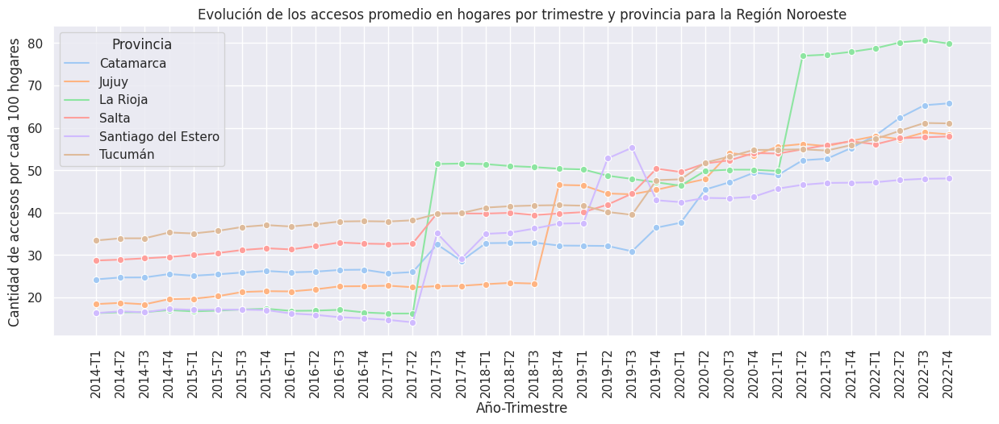

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Accesos por cada 100 hogares"
df_promedio = noroeste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Accesos por cada 100 hogares'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Accesos por cada 100 hogares', hue = 'Provincia',
             style = 'Provincia', dashes = False, marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedio en hogares por trimestre y provincia para la Región Noroeste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos por cada 100 hogares')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
plt.show()

**Apreciaciones:**

- El gráfico muestra una tendencia general al alza en la cantidad promedio de accesos a internet por cada 100 hogares en todas las provincias de la Región Noroeste, aunque esta tendencia es menos pronunciada que en otras regiones como la Región Pampeana.
- Desde el segundo trimestre del año 2022 La Rioja, Catamarca y Tucumán tienen la mayor cantidad promedio de accesos a internet por cada 100 hogares en la región, seguidas por Jujuy, Salta y Santiago Del Estero
- La variabilidad en la cantidad promedio de accesos a internet por cada 100 hogares a lo largo del tiempo es menor en la Región Noroeste en comparación con otras regiones.
- En general, el gráfico muestra que la Región Noroeste ha experimentado un aumento en la cantidad promedio de accesos a internet por cada 100 hogares a lo largo del tiempo, aunque en un ritmo menor en comparación con otras regiones de Argentina.

##### Región Noreste

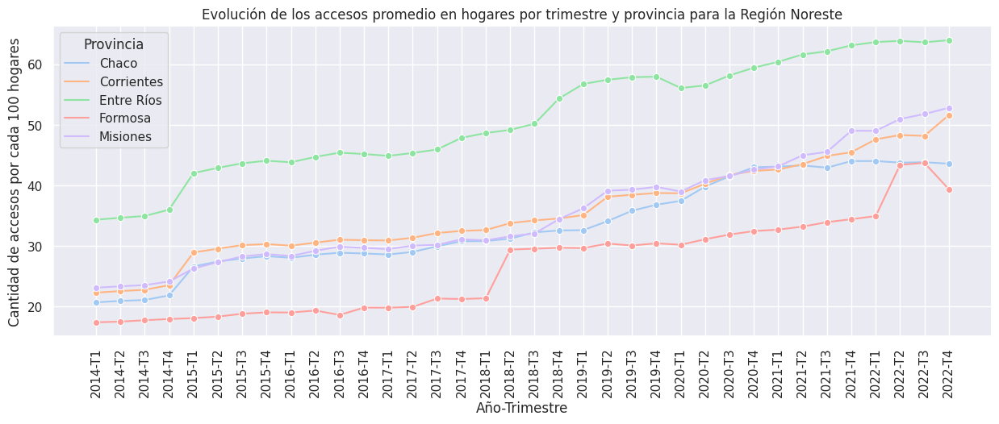

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Accesos por cada 100 hogares"
df_promedio = noreste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Accesos por cada 100 hogares'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Accesos por cada 100 hogares', hue = 'Provincia',
             style = 'Provincia', dashes = False, marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedio en hogares por trimestre y provincia para la Región Noreste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos por cada 100 hogares')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
plt.show()

**Apreciaciones:**

- El gráfico muestra una tendencia general al alza en la cantidad promedio de accesos a internet por cada 100 hogares en todas las provincias de la Región Noreste, aunque la tendencia es menos pronunciada que en otras regiones como la Región Pampeana.
- Entre Ríos y Misiones tienen la mayor cantidad promedio de accesos a internet por cada 100 hogares en la región, seguidas por Corrientes, Chaco y Formosa.
- La variabilidad en la cantidad promedio de accesos a internet por cada 100 hogares a lo largo del tiempo es menor en la Región Noreste en comparación con otras regiones.
- En general, el gráfico muestra que la Región Noreste ha experimentado un aumento en la cantidad promedio de accesos a internet por cada 100 hogares a lo largo del tiempo, aunque en un ritmo menor en comparación con otras regiones de Argentina.

#### Mapa de accesos por cada 100 hogares

Este mapa proporcionará un resumen de los años más recientes, específicamente 2021 y 2022. Aunque solo se tienen datos hasta el tercer trimestre del año 2022, estos años pueden brindar una imagen más precisa de la situación actual del mercado. Se presentará información clave sobre los niveles de acceso por cada 100 hogares en Argentina para ambos años, lo que permitirá visualizar mejor la distribución del acceso a lo largo del país.

In [ ]:
# Leer un archivo .csv con las latitudes y longitudes de cada una de las provincias de Argentina
geo_arg = pd.read_csv('geo_argentina.csv', encoding = 'ISO 8859-1')
# Imprimir las primeras 5 filas de "geo_arg"
geo_arg.head()

,Provincia,Latitud,Longitud,País
0,Buenos Aires,-36.6769,-60.5588,Argentina
1,Capital Federal,-34.6037,-58.3816,Argentina
2,Catamarca,-28.4696,-65.7850,Argentina
3,Chaco,-26.3869,-60.7658,Argentina
4,Chubut,-43.7886,-68.5197,Argentina


In [ ]:
# Se crea un dataframe con los datos correspondientes a los años 2021 y 2022
df_accesos = penetracion_hogares_prov[penetracion_hogares_prov['Año'] >= 2021][['Provincia', 'Año',
                                                                                'Accesos por cada 100 hogares']]

# Se unen los Dataframes "geo_arg" y "df_accesos" utilizando la columna "provincia" con punto de unión
data = pd.merge(geo_arg, df_accesos, on = 'Provincia')

# Se agrupan los datos por provincia y año conservando la latitud y longitud de cada provincia
mapa_hogares = data.groupby(['Provincia','Año'], as_index = False).agg({'Accesos por cada 100 hogares': 'mean',
                                                                        'Latitud': 'first', 'Longitud': 'first'})

In [ ]:
# Cargar el archivo geojson de provincias de Argentina
mapa = gpd.read_file('ProvinciasArgentina.geojson')

# Se fusionan los datos de acceso a las tecnologías por provincia con el archivo GeoJSON de las provincias de Argentina
provincias_accesos = mapa.merge(mapa_hogares, left_on = 'nombre',
                                           right_on = 'Provincia', how = 'outer')
# Se convierte el sistema de coordenadas a uno proyectado
provincias_accesos = provincias_accesos.to_crs(epsg = 3857)

In [ ]:
# Se crean dos Dataframes con la data respectiva para cada año
data_2021 = provincias_accesos[provincias_accesos['Año'] == 2021].copy()
data_2022 = provincias_accesos[provincias_accesos['Año'] == 2022].copy()

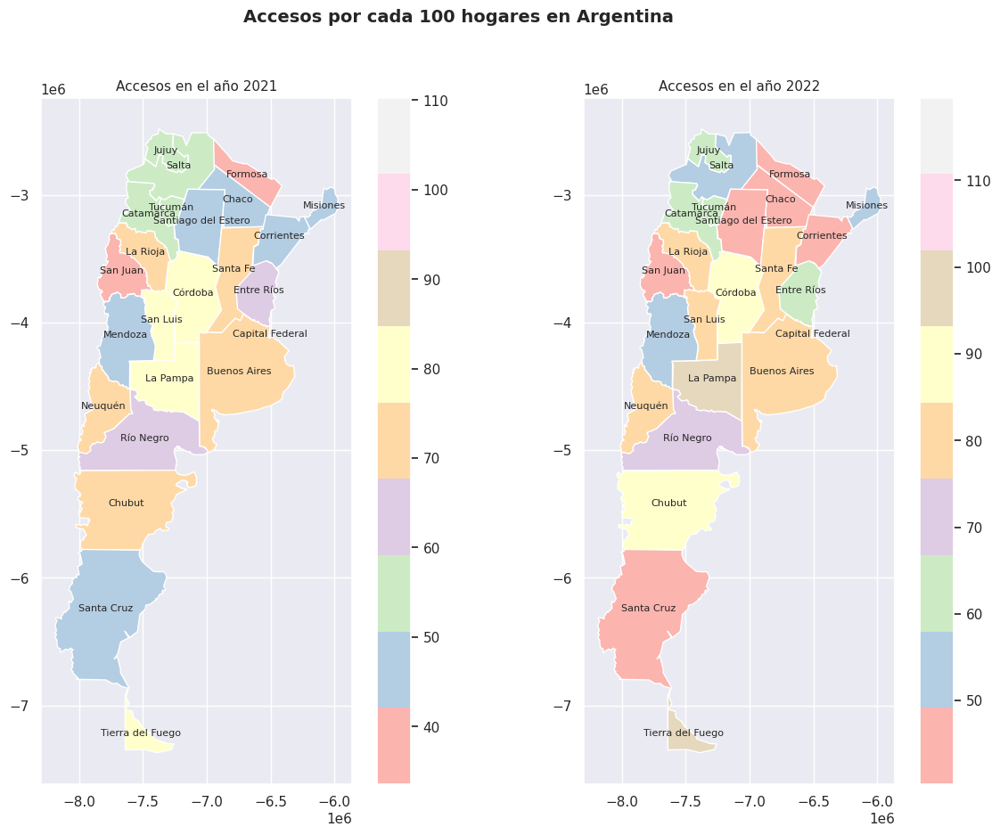

In [ ]:
# Crear una figura con dos ejes
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (15, 10))

# Trazar el mapa para la columna Accesos por cada 100 hogares en el eje izquierdo
data_2021.plot(column = 'Accesos por cada 100 hogares', cmap = 'Pastel1', legend = True, ax = ax1)
ax1.set_title('Accesos en el año 2021', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Accesos por cada 100 hogares
data_2021['coords'] = data_2021['geometry'].centroid
for idx, row in data_2021.iterrows():
  ax1.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Trazar el mapa para la columna Accesos por cada 100 hogares en el eje derecho
data_2022.plot(column = 'Accesos por cada 100 hogares', cmap = 'Pastel1', legend = True, ax = ax2)
ax2.set_title('Accesos en el año 2022', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Accesos por cada 100 hogares
data_2022['coords'] = data_2022['geometry'].centroid
for idx, row in data_2022.iterrows():
  ax2.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Ajustar el espaciado entre los dos ejes
fig.subplots_adjust(wspace = 0.1)

# Agregar un título general a la figura
fig.suptitle('Accesos por cada 100 hogares en Argentina', fontsize = 14, fontweight = 'bold')

# Mostrar la figura
plt.show()

**Apreciaciones:**

- Se puede observar un aumento en la cantidad de accesos al internet fijo por cada 100 hogares en todas las provincias del sur de Argentina.

- Para el año año 2022, 18 provincias junto con la Capital Federal superaron el promedio de accesos al internet fijo por cada 100 hogares.

- Durante el período comprendido entre el año 2021 y año 2022, 18 provincias más la Capital Federal presentaron un aumento en la cantidad de accesos. Mientras que las provincias de Santiago del Estero, Entre Ríos, La Pampa, San Luis y Santa Cruz no registraron un aumento en la cantidad de accesos al internet fijo por cada 100 hogares.

#### ```Provincia``` vs ```Año``` vs ```Accesos por cada 100 hogares```


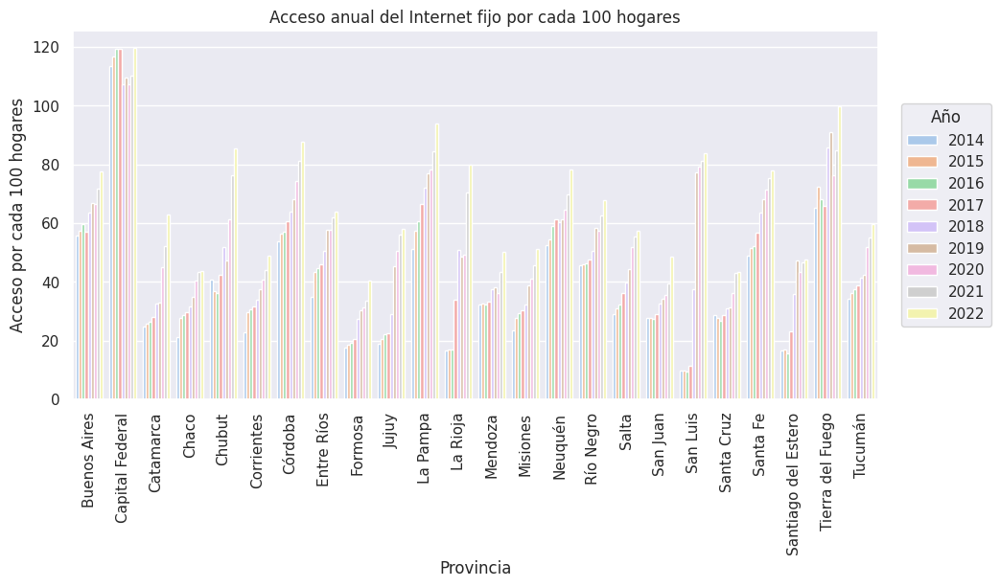

In [ ]:
# Agrupar los datos por provincia y año y calcular la media del acceso por cada 100 hogares
df_resumen = penetracion_hogares_prov.groupby(['Provincia', 'Año'])['Accesos por cada 100 hogares'].mean().reset_index()

# Generar el gráfico de barras agrupadas con Seaborn
fig, ax = plt.subplots(figsize = (12, 5))
sns.barplot(x = 'Provincia', y = 'Accesos por cada 100 hogares', hue = 'Año', data = df_resumen, ax = ax)

# Actualizar las opciones del diseño del gráfico
ax.set_title('Acceso anual del Internet fijo por cada 100 hogares')
ax.set_xlabel('Provincia')
ax.set_ylabel('Acceso por cada 100 hogares')
ax.tick_params(axis = 'x', rotation = 90)

# Agregar título a la leyenda
ax.legend(title = 'Año', ncol = 1, bbox_to_anchor = (1.15, 0.5), loc = 'center right')
# Ajustar el espacio entre el gráfico y la leyenda
plt.subplots_adjust(left = 0.2)
# Mostrar el gráfico
plt.show()

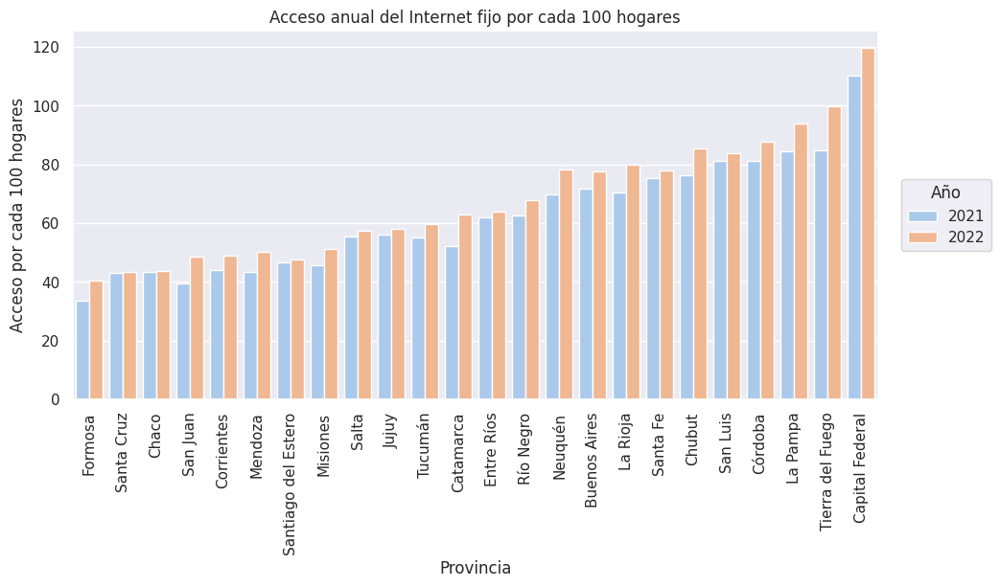

In [ ]:
# Filtrar los datos para incluir solo los años 2021 y 2022
df_resumen_filtrado = df_resumen[df_resumen['Año'].isin([2021, 2022])]

# Obtener el orden de las provincias basado en la media de acceso por cada 100 hogares
provincias_ordenadas = df_resumen_filtrado.groupby('Provincia')['Accesos por cada 100 hogares'].mean().sort_values().index

# Generar el gráfico de barras agrupadas con Seaborn
fig, ax = plt.subplots(figsize=(12, 5))
sns.barplot(x='Provincia', y='Accesos por cada 100 hogares', hue='Año', data=df_resumen_filtrado, ax=ax, order=provincias_ordenadas)

# Actualizar las opciones del diseño del gráfico
ax.set_title('Acceso anual del Internet fijo por cada 100 hogares')
ax.set_xlabel('Provincia')
ax.set_ylabel('Acceso por cada 100 hogares')
ax.tick_params(axis='x', rotation=90)

# Agregar título a la leyenda
ax.legend(title='Año', ncol=1, bbox_to_anchor=(1.15, 0.5), loc='center right')
# Ajustar el espacio entre el gráfico y la leyenda
plt.subplots_adjust(left=0.2)

# Mostrar el gráfico
plt.show()

**Apreciaciones finales:**

- Los diagramas de barras por año muestran que la penetración del Internet fijo por hogares ha aumentado en las provincias argentinas desde 2014 hasta 2022. En 2014, solo 9 de las 24 provincias tenían una penetración del Internet fijo por hogares del 40%, mientras que para 2022, todas las provincias garantizaban un mínimo del 40% de hogares con acceso a Internet.

- Cabe destacar que en la Ciudad Autónoma de Buenos Aires, la penetración del Internet fijo por hogares superó el 100% desde 2014 hasta 2022, lo que indica que, en promedio, cada hogar en esa área tiene más de un acceso al Internet fijo. Esto puede deberse a una combinación de una alta densidad poblacional, una infraestructura de telecomunicaciones bien desarrollada, una demanda alta de servicios de internet y un acceso rápido a las tecnologías de última generación pueden contribuir a la mayor cantidad de accesos a internet por cada 100 hogares en la CABA en comparación con otras provincias de Argentina.

- Sin embargo, en 2022, las provincias de Santa Cruz, Santiago del Estero, Chaco, Formosa y Corrientes aún tienen una penetración del Internet fijo por hogares por debajo del promedio. Esto puede deberse a factores como la infraestructura limitada, el bajo poder adquisitivo de los hogares, la falta de competencia y la falta de inversión en estas áreas. **Estas provincias pueden ser un área de enfoque para mejorar la accesibilidad a internet en hogares y reducir la brecha digital en Argentina.**



## Total nacional de accesos a Internet fijo por banda ancha y banda angosta

Número total de accesos al servicio de Internet fijo por banda ancha y banda angosta (trimestral)

In [ ]:
# Definir la URL de la API y tu API key
url = "http://api.datosabiertos.enacom.gob.ar/api/v2/datastreams/TOTAL-NACIO-DE-ACCES-48866/data.csv"
api_key = "5EBQMGTfMImArsNkwhQIuatPXtYfRNlAuSTuybbB"

# Realizar la solicitud a la API
response = requests.get(url, params = {"auth_key": api_key})

# Verificar si la solicitud fue exitosa
if response.status_code == 200:
  # Leer el contenido del archivo CSV en memoria como una cadena de texto
  csv_data = response.content.decode("utf-8")

  # Crear un objeto DataFrame a partir de la cadena de texto
  internet_baf = pd.read_csv(io.StringIO(csv_data))

else:
  # Mostrar un mensaje de error si la solicitud falló
  print("Error al hacer la solicitud a la API")

In [ ]:
# Imprimir las primeras 5 filas de "internet_baf"
internet_baf.head()

,Año,Trimestre,Banda ancha fija,Dial up,Total,Periodo
0,2022,4,11.195.668,12.446,11.208.114,Oct-Dic 2022
1,2022,3,11.078.691,12.437,11.091.128,Jul-Sept 2022
2,2022,2,10.946.248,12.436,10.958.684,Abr-Jun 2022
3,2022,1,10.611.390,12.619,10.624.009,Ene-Mar 2022
4,2021,4,10.476.933,12.861,10.489.794,Oct-Dic 2021


In [ ]:
# Mostrar información del número de columnas, filas, tipos de datos y valores faltantes en "internet_baf"
internet_baf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36 entries, 0 to 35
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Año               36 non-null     int64  
 1   Trimestre         36 non-null     int64  
 2   Banda ancha fija  36 non-null     object 
 3   Dial up           36 non-null     float64
 4   Total             36 non-null     object 
 5   Periodo           36 non-null     object 
dtypes: float64(1), int64(2), object(3)
memory usage: 1.8+ KB


Las variables no parecen estar en el formato correcto y no hay valores nulos.

### Transformación de los datos

In [ ]:
# Mostrar un resumen estadístico de la columna "Dial up"
internet_baf['Dial up'].describe()

count    36.000000
mean     23.079556
std      10.107978
min       9.991000
25%      12.436750
50%      26.861500
75%      32.491750
max      39.324000
Name: Dial up, dtype: float64

In [ ]:
# Convertir la columna "Banda ancha fija" a numérica
internet_baf['Banda ancha fija'] = internet_baf['Banda ancha fija'].replace('[^0-9]', '', regex=True).astype(int)
# Convertir la columna "Dial up" a tipo de dato int
internet_baf['Dial up'] = (internet_baf['Dial up'] * 1000).astype(int)
# Convertir la columna "Total" a numérica
internet_baf['Total'] = internet_baf['Total'].replace('[^0-9]', '', regex=True).astype(int)

In [ ]:
# Verificando que los cambios se han aplicado correctamente
internet_baf[['Banda ancha fija', 'Dial up', 'Total']].head()

,Banda ancha fija,Dial up,Total
0,11195668,12446,11208114
1,11078691,12437,11091128
2,10946248,12436,10958684
3,10611390,12619,10624009
4,10476933,12861,10489794


In [ ]:
# Cantidad de valores únicos por columna en "internet_baf"
internet_baf.nunique()

Año                  9
Trimestre            4
Banda ancha fija    36
Dial up             33
Total               36
Periodo             36
dtype: int64

In [ ]:
# Se crea una columna 'Fecha' combinando 'Año' y 'Trimestre' en un objeto de fecha
internet_baf['Fecha'] = pd.to_datetime(internet_baf['Año'].astype(str) + 'Q' + internet_baf['Trimestre'].astype(str))

### Resumen estadístico:

In [ ]:
# Mostrar un resumen estadístico de las columnas numériocas de "internet_baf"
internet_baf.describe()

,Año,Trimestre,Banda ancha fija,Dial up,Total
count,36.000000,36.000000,3.600000e+01,36.000000,3.600000e+01
mean,2018.000000,2.500000,8.355563e+06,23079.555556,8.378642e+06
std,2.618615,1.133893,1.471390e+06,10107.978375,1.462265e+06
min,2014.000000,1.000000,6.362108e+06,9991.000000,6.398398e+06
25%,2016.000000,1.750000,7.061275e+06,12436.750000,7.093767e+06
50%,2018.000000,2.500000,8.201878e+06,26861.500000,8.228740e+06
75%,2020.000000,3.250000,9.400024e+06,32491.750000,9.410040e+06
max,2022.000000,4.000000,1.119567e+07,39324.000000,1.120811e+07


**Apreciaciones:**

- El número de accesos al Internet fijo por ```Banda ancha fija``` es significativamente mayor que el número de accesos por ```Dial up```. La media de accesos por ```Banda ancha fija``` es de 8.35 millones, mientras que la media de accesos por ```Dial up``` es de tan solo de 23 mil

- La cantidad de accesos al Internet fijo por ```Banda ancha fija``` ha aumentado de forma constante a lo largo del tiempo. Por otro lado, el número de accesos por ```Dial up``` ha disminuido considerablemente y se mantiene en niveles muy bajos.

- La desviación estándar de la columna de ```Banda ancha fija``` es de 1.47 millones, lo que indica que hay una variación relativamente baja en los datos. Por otro lado, la desviación estándar de la columna de ```Dial up``` es de 10108, lo que indica una variación mucho mayor en estos datos. Esto sugiere que la columna de ```Dial up``` es más volátil y puede estar sujeta a fluctuaciones más significativas.

### Análisis Univariable

A continuación, se realizarán algunas visualizaciones para explorar el conjunto de datos con más detalle. Primero, se observará la distribución de la cantidad de accesos por Banda ancha fija, Dial up y el Total:

#### ```Banda ancha fija```, ```Dial up```, ```Total```

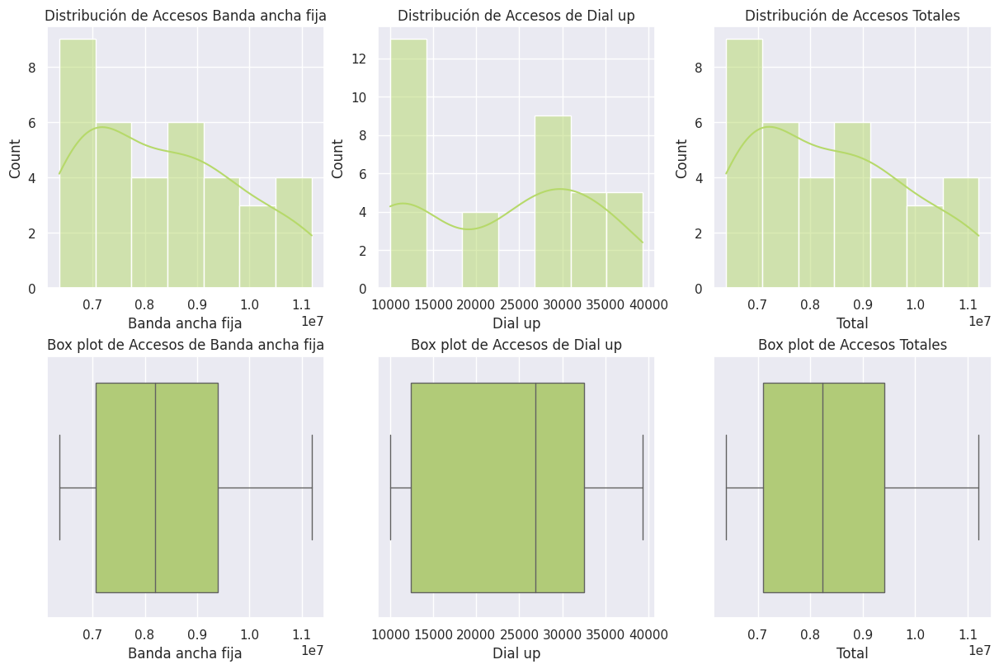

In [ ]:
# Observando la distribución de los datos
fig, axes = plt.subplots(2, 3, figsize=(12, 8), constrained_layout = True)

# Histograma y boxplot de la columna 'Banda ancha fija'
sns.histplot(data = internet_baf, x = 'Banda ancha fija', kde = True, color = '#B6D96A', ax = axes[0,0])
ax = axes[0,0].set_title('Distribución de Accesos Banda ancha fija')
sns.boxplot(data = internet_baf, x='Banda ancha fija', linewidth = 1, color = '#B6D96A', ax = axes[1,0])
axes[1,0].set_title('Box plot de Accesos de Banda ancha fija')
# Histograma y boxplot de la columna 'Dial up'
sns.histplot(data = internet_baf, x='Dial up', kde = True, color = '#B6D96A', ax = axes[0,1])
axes[0,1].set_title('Distribución de Accesos de Dial up')
sns.boxplot(data = internet_baf, x='Dial up', linewidth = 1, color = '#B6D96A', ax = axes[1,1])
axes[1,1].set_title('Box plot de Accesos de Dial up')
# Histograma y boxplot de la columna 'Total'
sns.histplot(data = internet_baf, x = 'Total', kde = True, color = '#B6D96A', ax = axes[0,2])
axes[0,2].set_title('Distribución de Accesos Totales')
sns.boxplot(data = internet_baf, x='Total', linewidth = 1, color = '#B6D96A', ax = axes[1,2])
axes[1,2].set_title('Box plot de Accesos Totales')

# Mostrar grafico completo
plt.show()

**Apreciaciones:**

- Se observa que para el caso de Banda ancha fija hay un leve sesgo hacia la derecha en la distribución de los datos. Lo que indica que hay observaciones concentradas en valores altos.

- Además, se puede observar que la banda ancha fija tiene valores más altos que el dial-up en todas las mediciones de resumen, incluyendo la mediana, el primer cuartil y el tercer cuartil.

- No se observan valores atípicos en los diagramas de caja para ninguna de las tres variables, lo que sugiere que los datos están dentro del rango esperado y que no hay observaciones extremas o inusuales.

#### ```Trimestre```

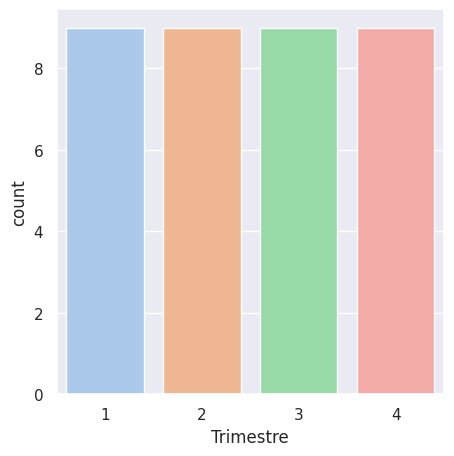

In [ ]:
# Gráfico de barras de los trimestres
plt.figure(figsize = (5,5))
sns.countplot(data = internet_baf, x = 'Trimestre')
# Mostrar la figura
plt.show()

**Apreciación**:

- El número de registros está distribuido de manera equitativa entre los cuatro trimestres para cada año.

### Análisis Bivariable

#### ```Año``` vs ```Banda ancha fija```

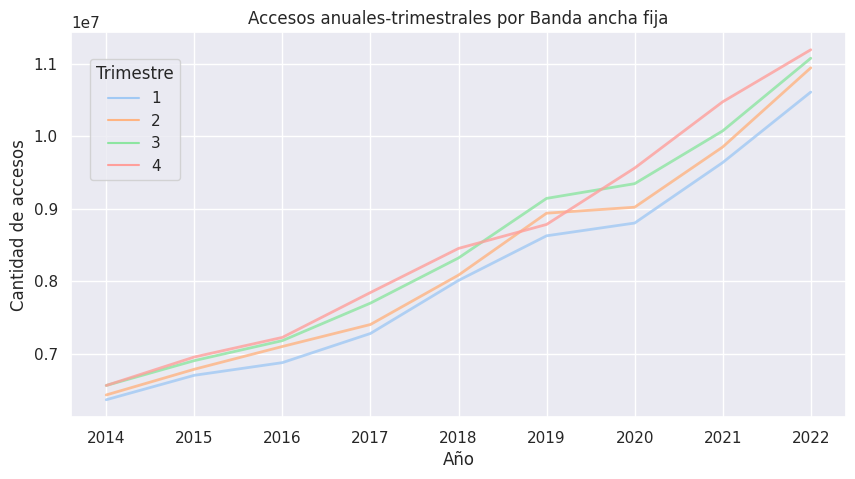

In [ ]:
# Tamaño del gráfico
plt.figure(figsize  = (10, 5))

# Crear un gráfico de línea de los accesos por banda ancha fija por año y trimestre
sns.lineplot(x = 'Año', y = 'Banda ancha fija', hue = 'Trimestre', data = internet_baf,
             palette = 'pastel', linewidth = 2, alpha = 0.8)

# Agregar etiquetas y leyenda
plt.title('Accesos anuales-trimestrales por Banda ancha fija')
plt.xlabel('Año')
plt.ylabel('Cantidad de accesos')
plt.legend(title = 'Trimestre', loc = 'upper right', bbox_to_anchor = (0.15, 0.95))

# Mostrar el gráfico completo
plt.show()

- En primer lugar, se puede observar una tendencia general de aumento en la cantidad de accesos por banda ancha fija desde 2014. Este aumento sugiere que la banda ancha fija se está volviendo cada vez más popular como opción de acceso a Internet en el conjunto de datos.

- En segundo lugar, como se puede ver en el gráfico de línea, hay una variación en la cantidad de accesos por trimestre, con un aumento en el cuarto trimestre en la mayoría de los años. Esta variación puede estar relacionada con factores estacionales o con la forma en que se recopilaron los datos.

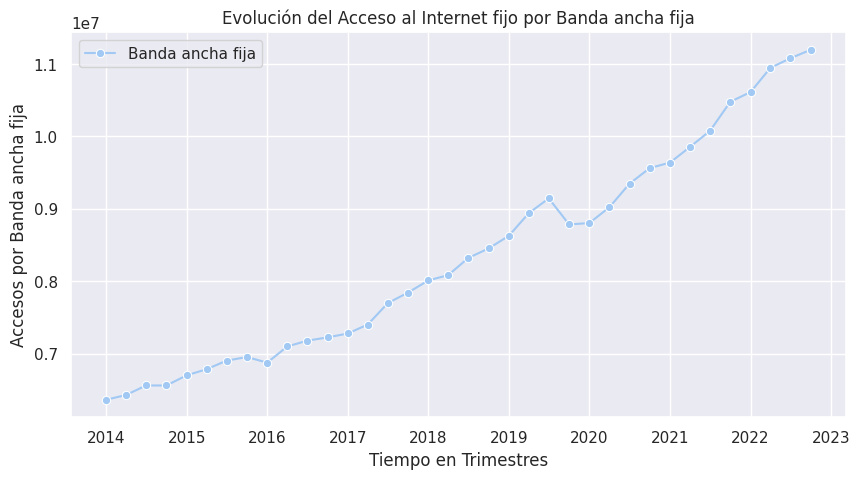

In [ ]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(10, 5))

# Graficar la evolución del Acceso al Internet fijo por Banda ancha fija
sns.lineplot(x='Fecha', y='Banda ancha fija', data=internet_baf, label='Banda ancha fija', marker='o')
# Rotar los nombres del eje x en 45 grados
plt.xticks(rotation=0)
# Agregar etiquetas de eje y título del gráfico
plt.xlabel("Tiempo en Trimestres")
plt.ylabel("Accesos por Banda ancha fija")
plt.title("Evolución del Acceso al Internet fijo por Banda ancha fija")

# Mostrar la figura
plt.show()

#### ```Año``` vs ```Dial up```

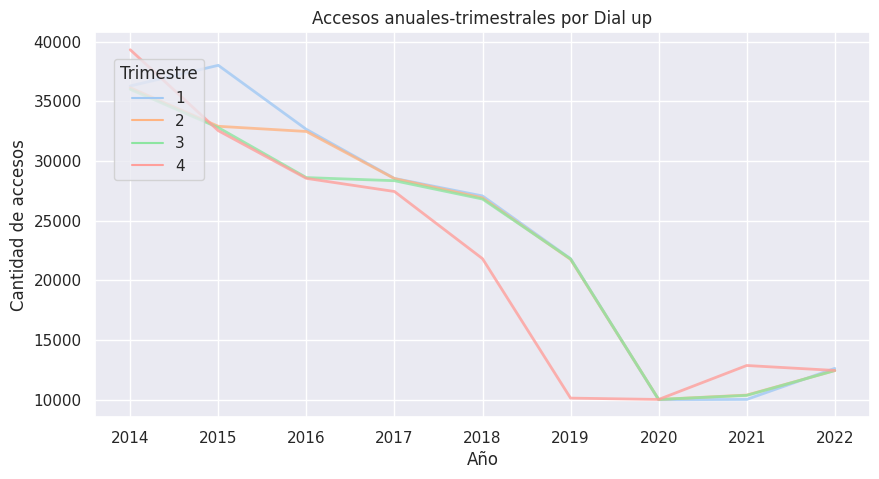

In [ ]:
# Tamaño del gráfico
plt.figure(figsize  = (10, 5))

# Crear un gráfico de línea de los accesos por Dial up por año y trimestre
sns.lineplot(x = 'Año', y = 'Dial up', hue = 'Trimestre', data = internet_baf,
             palette = 'pastel', linewidth = 2, alpha = 0.8)

# Agregar etiquetas y leyenda
plt.title('Accesos anuales-trimestrales por Dial up')
plt.xlabel('Año')
plt.ylabel('Cantidad de accesos')
plt.legend(title = 'Trimestre', loc = 'upper right', bbox_to_anchor = (0.15, 0.95))

# Mostrar el gráfico completo
plt.show()

**Apreciaciones:**

- En el gráfico de línea, se puede observar que la cantidad de accesos por Dial up ha disminuido significativamente desde 2014. Sin embargo, se aprecia como hubo un estancamiento a partir del cuarto trimestre del año desde el año 2019 hasta el año 2020 donde los 4 trimestres convergen hacia el mismo valor (10000 accesos). A partir de este año la cantidad de accesos a Dial up comienza levemente a subir.

- Sólo para los años 2014 y 2021 el cuarto trimestre fue el que mayor acceso en comparación con el resto de los trimestres presentó.

- A nivel general esta disminución en la cantidad de accesos por Dial up, sugiere que esta opción de acceso a Internet se está volviendo cada vez menos popular entre los usuarios en el conjunto de datos, y que la banda ancha fija y otras opciones de acceso a Internet están ganando terreno.

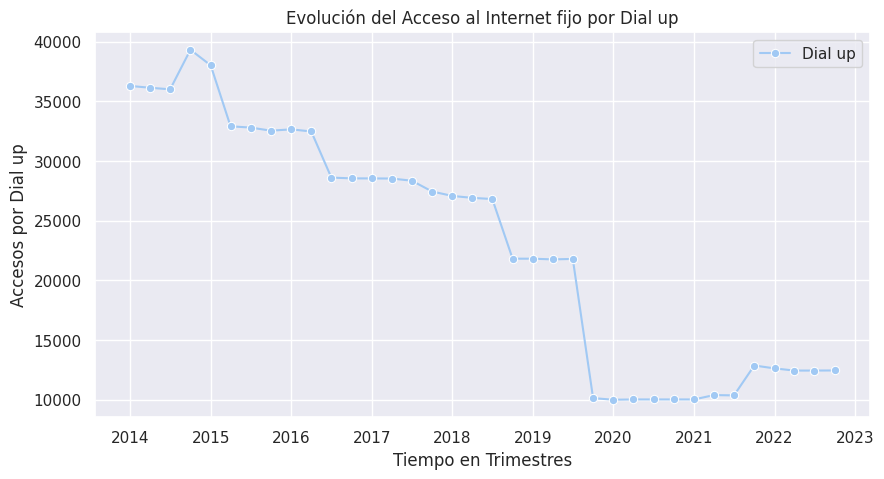

In [ ]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(10, 5))

# Graficar la evolución del Acceso al Internet fijo por Dial up
sns.lineplot(x = 'Fecha', y = 'Dial up', data = internet_baf, label = 'Dial up', marker = 'o')
# Rotar los nombres del eje x en 45 grados
plt.xticks(rotation = 0)
# Agregar etiquetas de eje y título del gráfico
plt.xlabel("Tiempo en Trimestres")
plt.ylabel("Accesos por Dial up")
plt.title("Evolución del Acceso al Internet fijo por Dial up")

# Mostrar la figura
plt.show()

- Por otro lado, en este gráfico se puede ver claramente que hubo una disminución significativa en la cantidad de accesos por Dial up desde 2019 hasta 2020. Esta disminución puede deberse a la creciente popularidad de las opciones de acceso a Internet más rápidas y económicas, como la banda ancha fija. Además, que refleja que se trata de una tendencia real y no solo un efecto temporal.

- Luego se aprecia como desde el 2020 al 2021 hubo un estancamiento en la cantidad de accesos y es posible que esta disminución en la cantidad de accesos por Dial up esté relacionada con la pandemia del COVID-19.

- Es interesante observar que hubo un leve crecimiento en la cantidad de accesos por Dial up a partir del tercer trimestre del año 2021 en comparación con el año previo. Este crecimiento puede deberse a factores como la falta de infraestructura de banda ancha fija en algunas áreas o la necesidad de opciones de acceso a Internet más económicas para algunos usuarios.

#### ```Banda ancha fija``` - ```Dial up``` vs ```Total```

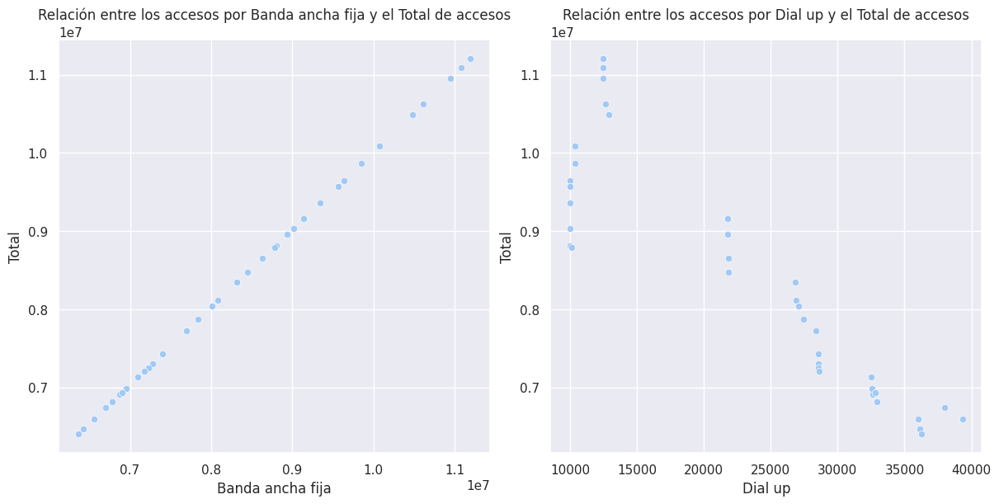

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6), constrained_layout = True)

# Se grafica la relación entre los accesos por Banda ancha fija y el Total de accesos
sns.scatterplot(x = 'Banda ancha fija', y = 'Total', data = internet_baf, ax = axes[0])
axes[0].set_title('Relación entre los accesos por Banda ancha fija y el Total de accesos')

# Se grafica la relación entre los accesos por Dial up y el Total de accesos
sns.scatterplot(x = 'Dial up', y = 'Total', data = internet_baf, ax = axes[1])
axes[1].set_title('Relación entre los accesos por Dial up y el Total de accesos')

# Mostraer las relaciones
plt.show()

**Apreciaciones:**

- Se observa como hay una correlación positiva fuerte (0.99) entre la banda ancha fija y el total de conexiones a internet, lo cual ya con los análisis previos era de esperarse. Además, la correlación entre dial-up y el total de conexiones a internet es negativa y débil (-0.12). Esto sugiere que el dial-up no es una opción popular entre los usuarios de Internet en este conjunto de datos.

#### ```Año``` vs ```Banda ancha fija``` - ```Dial up```

Se calcula el porcentaje de cambio entre cada año y el año anterior

In [ ]:
# Agrupar los datos por año y calcular la suma de los accesos a Dial up y Banda ancha fija en cada año
accesos_por_año = internet_baf.groupby('Año').agg({'Banda ancha fija': 'sum', 'Dial up': 'sum'})

# Calcular el porcentaje de cambio entre cada año y el año anterior para los accesos a Dial up y Banda ancha fija
accesos_por_año['Cambio Banda ancha fija'] = accesos_por_año['Banda ancha fija'].pct_change() * 100
accesos_por_año['Cambio Dial up'] = accesos_por_año['Dial up'].pct_change() * 100

# Imprimir los resultados
accesos_por_año

,Banda ancha fija,Dial up,Cambio Banda ancha fija,Cambio Dial up
Año,,,,
2014,25908873,147760,NaN,NaN
2015,27337549,136270,5.514234,-7.776123
2016,28373776,122282,3.790490,-10.264915
2017,30217820,112863,6.499114,-7.702687
2018,32865578,102609,8.762240,-9.085351
2019,35490694,75487,7.987433,-26.432379
2020,36731204,40039,3.495311,-46.959079
2021,40042775,43616,9.015689,8.933790
2022,43831997,49938,9.462936,14.494681


**Apreciaciones:**

- Podemos observar que el número de accesos de banda ancha fija ha aumentado constantemente a lo largo de los años, con un crecimiento promedio anual del 8.1% entre 2014 y 2021. Por otro lado, el número de accesos de dial-up ha disminuido significativamente a lo largo de los años, con una tasa de disminución promedio anual del 29.4% entre 2014 y 2021.

- Para el caso de Dial up, se aprecia como que en los años 2021 y 2022 se registró un aumento en lugar de una disminución. Registrando para el año 2022 un aumento del 14%. Esto indica que la tendencia a la baja en el número de accesos de dial-up se ha revertido en esos años. Sería importante analizar más a fondo las razones detrás de este cambio, ya que podría estar relacionado con factores como la disponibilidad de servicios alternativos o cambios en la demanda de conectividad.

- En cuanto a Banda ancha fija, se observa un mayor crecimiento en los años 2021 y 2022 en comparación con los años anteriores. Esto respalda la apreciación de que el número de accesos de banda ancha fija ha aumentado constantemente a lo largo de los años. El crecimiento acelerado en estos años podría estar relacionado con una mayor demanda de conectividad debido a la pandemia de COVID-19, que ha impulsado la necesidad de trabajar y estudiar desde casa.

### Análisis Multivariable

#### ```Año``` vs ```Banda ancha fija``` vs ```Dial up``` vs ```Total```

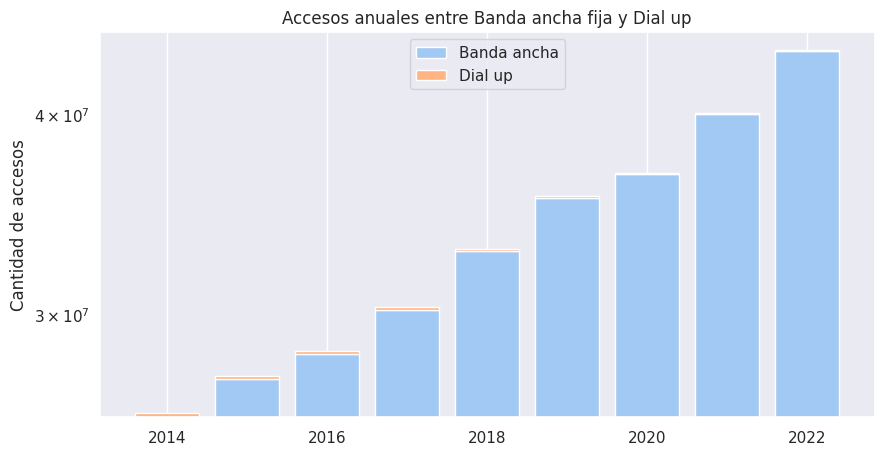

In [ ]:
# Tamaño del gráfico
fig, ax = plt.subplots(figsize  = (10, 5))

# Agrupar los datos por año y calcular la suma de los accesos a Dial up y Banda ancha fija en cada año
accesos_por_año = internet_baf.groupby('Año').agg({'Banda ancha fija': 'sum', 'Dial up': 'sum', 'Total': 'sum'})
accesos_por_año = accesos_por_año.reset_index()

# Datos
year = accesos_por_año['Año']
banda_ancha = accesos_por_año['Banda ancha fija']
dial_up = accesos_por_año['Dial up']
total = accesos_por_año['Total']

# Gráfico de barras apiladas
ax.bar(year, banda_ancha, label = 'Banda ancha')
ax.bar(year, dial_up, bottom = banda_ancha, label = 'Dial up')
#ax.bar(year, total, bottom = np.add(banda_ancha, dial_up))

# Agregar etiquetas y leyenda
plt.title('Accesos anuales entre Banda ancha fija y Dial up')
ax.legend(loc = 'upper center')
ax.set_ylabel('Cantidad de accesos')

# Aplicar escala logarítmica al eje y
ax.set_yscale('log')

plt.show()

## Accesos a banda ancha y banda angosta por provincia
Número de accesos al servicio de Internet fijo por banda ancha y banda angosta en cada provincia (trimestral)

In [ ]:
# Definir la URL de la API y tu API key
url = "https://api.datosabiertos.enacom.gob.ar/api/v2/datastreams/BANDA-ANCHA-Y-BANDA-ANGOS/data.csv"
api_key = "5EBQMGTfMImArsNkwhQIuatPXtYfRNlAuSTuybbB"

# Realizar la solicitud a la API
response = requests.get(url, params = {"auth_key": api_key, "limit": 900})

# Verificar si la solicitud fue exitosa
if response.status_code == 200:
  # Leer el contenido del archivo CSV en memoria como una cadena de texto
  csv_data = response.content.decode("utf-8")

  # Crear un objeto DataFrame a partir de la cadena de texto
  inter_baf_provincia = pd.read_csv(io.StringIO(csv_data))

else:
  # Mostrar un mensaje de error si la solicitud falló
  print("Error al hacer la solicitud a la API")

In [ ]:
# Imprimir las primeras 5 filas de "inter_baf_provincia"
inter_baf_provincia.head()

,Año,Trimestre,Provincia,Banda ancha fija,Dial up,Total
0,2022,4,Buenos Aires,4.788.466,6.199,4.794.665
1,2022,4,Capital Federal,1.549.781,2.145,1.551.926
2,2022,4,Catamarca,70.908,1.000,70.909
3,2022,4,Chaco,143.658,5.000,143.663
4,2022,4,Chubut,167.855,904.000,168.759


In [ ]:
# Mostrar información del número de columnas, filas, tipos de datos y valores faltantes en "inter_baf_provincia"
inter_baf_provincia.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 864 entries, 0 to 863
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Año               864 non-null    int64  
 1   Trimestre         864 non-null    int64  
 2   Provincia         864 non-null    object 
 3   Banda ancha fija  864 non-null    object 
 4   Dial up           862 non-null    float64
 5   Total             864 non-null    object 
dtypes: float64(1), int64(2), object(3)
memory usage: 40.6+ KB


Las variables no parecen estar en el formato correcto y hay valores nulos.

In [ ]:
# Cantidad de valores únicos por columna en "inter_baf_provincia"
inter_baf_provincia.nunique()

Año                   9
Trimestre             4
Provincia            24
Banda ancha fija    857
Dial up             306
Total               855
dtype: int64

In [ ]:
# Valores únicos en la columna "Provincia"
inter_baf_provincia['Provincia'].unique()

array(['Buenos Aires', 'Capital Federal', 'Catamarca', 'Chaco', 'Chubut',
       'Córdoba', 'Corrientes', 'Entre Ríos', 'Formosa', 'Jujuy',
       'La Pampa', 'La Rioja', 'Mendoza', 'Misiones', 'Neuquén',
       'Río Negro', 'Salta', 'San Juan', 'San Luis', 'Santa Cruz',
       'Santa Fe', 'Santiago Del Estero', 'Tierra Del Fuego', 'Tucumán'],
      dtype=object)

In [ ]:
# Cantidad de valores faltantes por columna en "inter_baf_provincia"
missing_values_count = inter_baf_provincia.isnull().sum()
columns = inter_baf_provincia.shape[1]
missing_values_count[0:columns]

Año                 0
Trimestre           0
Provincia           0
Banda ancha fija    0
Dial up             2
Total               0
dtype: int64

In [ ]:
# Mostrar las filas que tienen valores faltantes para identificar a que año-trimestre corresponden
filas_con_faltantes = inter_baf_provincia.isna().sum(axis=1) > 0
inter_baf_provincia[filas_con_faltantes]

,Año,Trimestre,Provincia,Banda ancha fija,Dial up,Total
440,2018,2,Formosa,44.554,NaN,44.554
445,2018,2,Misiones,106.147,NaN,106.147


### Transformaciones en los datos

In [ ]:
# Modificar algunos nombres de las provincias para mantener la uniformidad con los demás Dataframes
inter_baf_provincia['Provincia'] = inter_baf_provincia['Provincia'].str.replace('Santiago Del', 'Santiago del')
inter_baf_provincia['Provincia'] = inter_baf_provincia['Provincia'].str.replace('Tierra Del', 'Tierra del')
# Verificar que los cambios se aplicaron correctamente
inter_baf_provincia['Provincia'].unique()

array(['Buenos Aires', 'Capital Federal', 'Catamarca', 'Chaco', 'Chubut',
       'Córdoba', 'Corrientes', 'Entre Ríos', 'Formosa', 'Jujuy',
       'La Pampa', 'La Rioja', 'Mendoza', 'Misiones', 'Neuquén',
       'Río Negro', 'Salta', 'San Juan', 'San Luis', 'Santa Cruz',
       'Santa Fe', 'Santiago del Estero', 'Tierra del Fuego', 'Tucumán'],
      dtype=object)

In [ ]:
# Filtrar las filas de "inter_baf_provincia" en las que la columna 'Dial up' tengan '-'
inter_baf_provincia[inter_baf_provincia['Dial up'] < 0]

,Año,Trimestre,Provincia,Banda ancha fija,Dial up,Total


In [ ]:
# Convertir la columna "Banda ancha fija" a numérica
inter_baf_provincia['Banda ancha fija'] = inter_baf_provincia['Banda ancha fija'].replace('[^0-9]', '',
                                                                                          regex=True).astype(int)
                                                                                          # Convertir la columna "Total" a numérica
inter_baf_provincia['Total'] = inter_baf_provincia['Total'].replace('[^0-9]', '', regex=True).astype(int)

In [ ]:
# Reemplazar los faltantes por cero y convertir la colunmna a str
inter_baf_provincia['Dial up'] = inter_baf_provincia['Dial up'].fillna(0)
inter_baf_provincia['Dial up'] = inter_baf_provincia['Dial up'].astype(str)

def eliminar_punto_cero(valor):
  patron = r'\.0$'  # Patrón para encontrar el punto seguido de un cero al final
  if re.search(patron, valor):
    return re.sub(patron, '', valor)  # Eliminar el punto y el cero al final
  elif '.' in valor:
    return valor.replace('.', '')  # Eliminar solo el punto
  else:
    return valor

# Aplicar la función a la columna
inter_baf_provincia['Dial up'] = inter_baf_provincia['Dial up'].apply(eliminar_punto_cero)
# Reemplazar los valores de cadena vacía por 0
inter_baf_provincia['Dial up'] = inter_baf_provincia['Dial up'].replace('', '0')
# Convertir la columna a tipo int
inter_baf_provincia['Dial up'] = inter_baf_provincia['Dial up'].astype(int)

A continuación se comparará el total de accesos para Dial up correspondientes al segundo trimestre del año 2018 tanto en el Dataframe "inter_baf_provincia" y "inter_baf". El objetivo es verificar que ambas cifras coincidan y que la desición de susituir los valores faltantes por 0 fue correcta

In [ ]:
# Cantidad total de accesos en 'Dial up' correspondientes al segundo trimestre del año 2018 en "inter_baf_provincia"
inter_baf_provincia[(inter_baf_provincia['Año'] == 2018) & (inter_baf_provincia['Trimestre'] == 2)]['Dial up'].sum()

26911

In [ ]:
# Cantidad total de accesos en 'Dial up' correspondientes al segundo trimestre del año 2018 en "internet_baf"
internet_baf[(internet_baf['Año'] == 2018) & (internet_baf['Trimestre'] == 2)]['Dial up'].sum()

26911

In [ ]:
# Se crea una columna 'Fecha' combinando 'Año' y 'Trimestre' en un objeto de fecha
inter_baf_provincia['Fecha'] = pd.to_datetime(inter_baf_provincia['Año'].astype(str) + 'Q' + inter_baf_provincia['Trimestre'].astype(str))

### Resumen estadístico:

In [ ]:
# Mostrar un resumen estadístico de las columnas numériocas de "inter_baf_provincia"
inter_baf_provincia.describe()

,Año,Trimestre,Banda ancha fija,Dial up,Total
count,864.000000,864.000000,8.640000e+02,864.000000,8.640000e+02
mean,2018.000000,2.500000,3.481485e+05,884.533565,3.491101e+05
std,2.583484,1.118682,7.476219e+05,2320.777175,7.494854e+05
min,2014.000000,1.000000,1.219300e+04,0.000000,1.255700e+04
25%,2016.000000,1.750000,5.221525e+04,7.000000,5.232900e+04
50%,2018.000000,2.500000,1.044120e+05,137.000000,1.045965e+05
75%,2020.000000,3.250000,1.791568e+05,564.000000,1.801745e+05
max,2022.000000,4.000000,4.788466e+06,15229.000000,4.794665e+06


**Apreciaciones**:

- Estas estadísticas indican que, en promedio, hay alrededor de 348 mil conexiones de ```Banda ancha fija``` y 884.53 conexiones de ```Dial-up``` para cada provincia en Argentina. Además, el total de conexiones de Internet en cada provincia promedia alrededor de 349 mil conexiones.

- También se puede observar que hay una gran variabilidad en el número de conexiones de Internet entre las diferentes provincias, con un mínimo de 12 mil conexiones de banda ancha fija en una provincia y un máximo de 4.7 millones conexiones en otra provincia. Esto sugiere que hay diferencias significativas en la penetración de Internet en las diferentes regiones de Argentina.

### Análisis Univariable

A continuación, se realizarán algunas visualizaciones para explorar el conjunto de datos con más detalle. Primero, se observará la distribución de la cantidad de accesos por Banda ancha fija, Dial up y el Total:

#### ```Banda ancha fija```, ```Dial up```, ```Total```

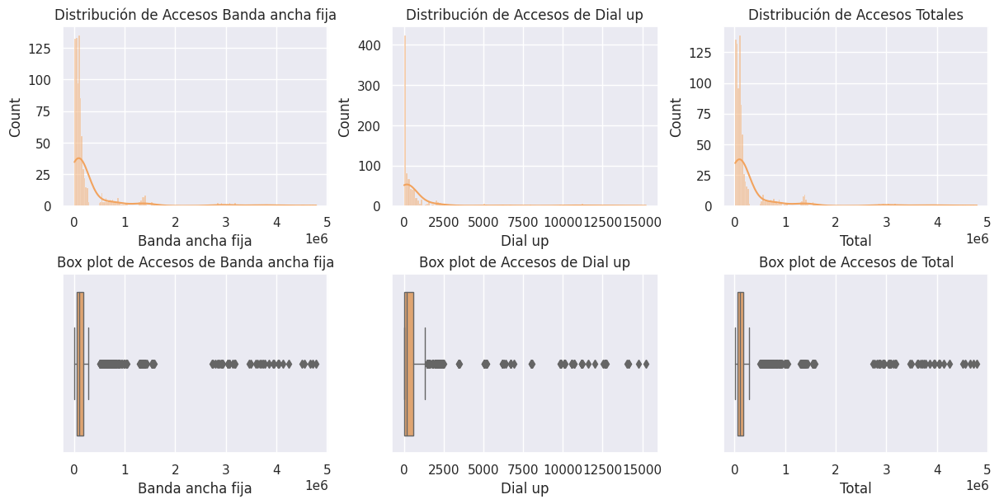

In [ ]:
# Observando la distribución de los datos
fig, axes = plt.subplots(2, 3, figsize=(12, 6), constrained_layout = True)

# Histograma y boxplot de la columna 'Banda ancha fija'
sns.histplot(data = inter_baf_provincia, x = 'Banda ancha fija', kde = True, color = '#F2A35E', ax = axes[0,0])
ax = axes[0,0].set_title('Distribución de Accesos Banda ancha fija')
sns.boxplot(data = inter_baf_provincia, x='Banda ancha fija', linewidth = 1, color = '#F2A35E', ax = axes[1,0])
axes[1,0].set_title('Box plot de Accesos de Banda ancha fija')
# Histograma y boxplot de la columna 'Dial up'
sns.histplot(data = inter_baf_provincia, x='Dial up', kde = True, color = '#F2A35E', ax = axes[0,1])
axes[0,1].set_title('Distribución de Accesos de Dial up')
sns.boxplot(data = inter_baf_provincia, x='Dial up', linewidth = 1, color = '#F2A35E', ax = axes[1,1])
axes[1,1].set_title('Box plot de Accesos de Dial up')
# Histograma y boxplot de la columna 'Total'
sns.histplot(data = inter_baf_provincia, x = 'Total', kde = True, color = '#F2A35E', ax = axes[0,2])
axes[0,2].set_title('Distribución de Accesos Totales')
sns.boxplot(data = inter_baf_provincia, x='Total', linewidth = 1, color = '#F2A35E', ax = axes[1,2])
axes[1,2].set_title('Box plot de Accesos de Total')

# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- El histograma y el boxplot de la columna 'Banda ancha fija' sugieren que la mayoría de las provincias tienen un número relativamente bajo de conexiones de banda ancha fija, con una media de alrededor de 300000 conexiones. Sin embargo, también hay algunas provincias con un número significativamente mayor de conexiones de banda ancha fija, como la provincia con un valor máximo de alrededor de 4.7 millones de conexiones.

- El histograma y el boxplot de la columna 'Dial up' indican que la mayoría de las provincias tienen un número muy bajo de conexiones de dial-up, con una media de alrededor de 1000 conexiones. Sin embargo, hay algunas provincias con un número relativamente alto de conexiones de dial-up, como la provincia con un valor máximo de alrededor de 15000 conexiones.

- El histograma y el boxplot de la columna 'Total' sugieren que la mayoría de las provincias tienen un número relativamente bajo de conexiones de Internet en general, con una media de alrededor de 340000 conexiones. Sin embargo, hay algunas provincias con un número significativamente mayor de conexiones de Internet en general, como la provincia con un valor máximo de alrededor de 4.7 millones de conexiones.

#### ```Trimestre```

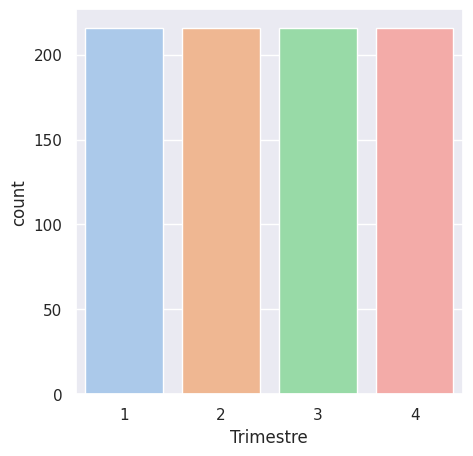

In [ ]:
# Gráfico de barras de los trimestres
plt.figure(figsize = (5,5))
sns.countplot(data = inter_baf_provincia, x = 'Trimestre')
plt.show()

**Apreciación:**

- El número de registros está distribuido de manera equitativa entre los cuatro trimestres para cada año.

### Análisis Bivariable

#### ```Provincia``` vs ```Banda ancha fija```

In [ ]:
# Se calcula el promedio de los accesos a la banda ancha fija por provincias
inter_baf_provincia.groupby(['Provincia'])['Banda ancha fija'].mean().sort_values(ascending=False).head()

Provincia
Buenos Aires       3.550078e+06
Capital Federal    1.400456e+06
Córdoba            7.586412e+05
Santa Fe           6.897670e+05
Entre Ríos         2.088981e+05
Name: Banda ancha fija, dtype: float64

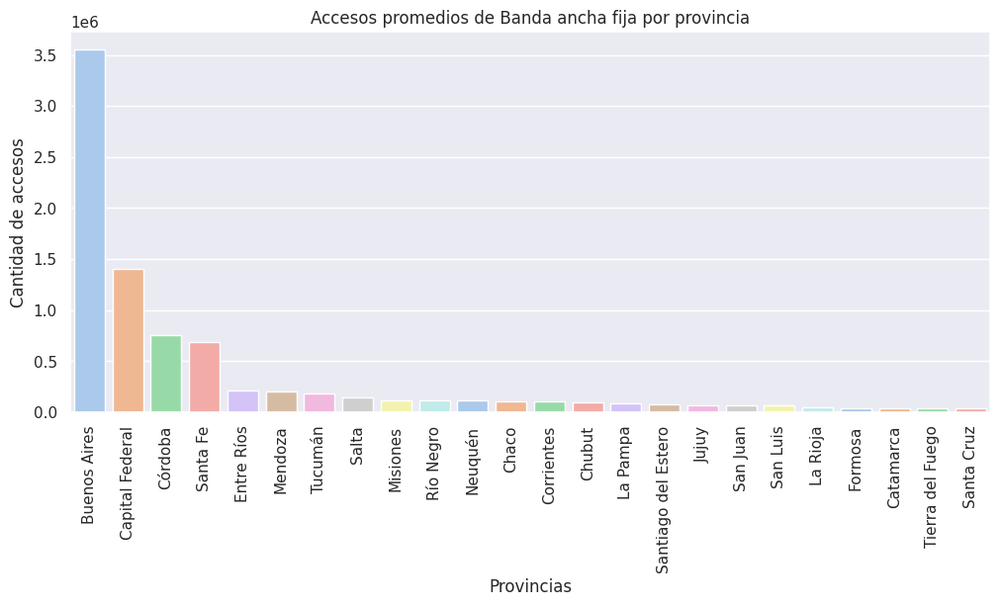

In [ ]:
# Cambiar el tamaño del gráfico
plt.figure(figsize = (12, 5))

# Gráfico de barras de la columna "Provincia" vs "Accesos por Banda ancha fija"
df_provincias = inter_baf_provincia.groupby('Provincia')['Banda ancha fija'].mean().reset_index()
df_provincias = df_provincias.sort_values('Banda ancha fija', ascending = False)
sns.barplot(data = df_provincias, x = 'Provincia', y = 'Banda ancha fija', palette = 'pastel')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Accesos promedios de Banda ancha fija por provincia')
plt.xlabel('Provincias')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

A partir de este gráfico, podemos observar que hay una variabilidad significativa en el número de conexiones de banda ancha fija en las diferentes provincias del país.

- Las provincias con la mayor cantidad promedio de conexiones de banda ancha fija son Buenos Aires y la Capital Federal superando el 1000000 de conexiones. Seguidas de Córdoba y Santa Fe teniendo estas provincias un promedio por encima de las 500 mil conexiones de banda ancha fija.

- Por otro lado, las provincias con la menor cantidad promedio de conexiones de banda ancha fija son Santa Cruz, Tierra del Fuego, y Catamarca, seguidas de Formosa y La Rioja. Estas provincias tienen un promedio de menos de 100000 conexiones de banda ancha fija.

En general, este gráfico sugiere que hay una brecha significativa en la cantidad de conexiones de banda ancha fija entre las diferentes provincias de Argentina, y que algunas provincias tienen un acceso limitado a Internet en comparación con otras provincias.

#### ```Provincia``` vs ```Dial up```

In [ ]:
# Se calcula el promedio de los accesos a Dial up por provincias
inter_baf_provincia.groupby(['Provincia'])['Dial up'].mean().sort_values(ascending=False).head()

Provincia
Buenos Aires       9354.694444
Capital Federal    4857.944444
Neuquén            1468.055556
Chubut             1136.472222
Mendoza            1069.888889
Name: Dial up, dtype: float64

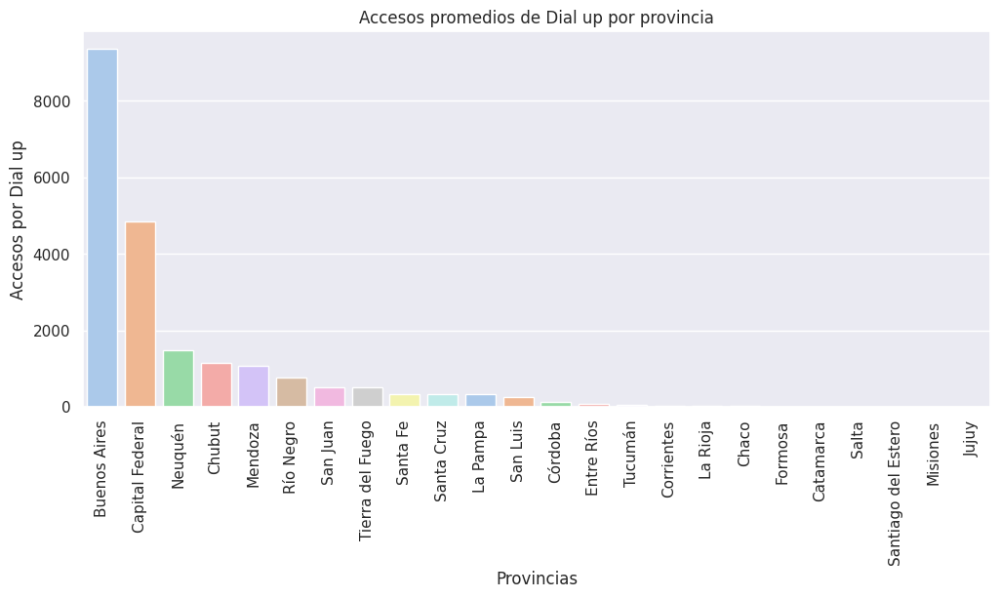

In [ ]:
# Cambiar el tamaño del gráfico
plt.figure(figsize = (12, 5))

# Gráfico de barras de la columna "Provincia" vs "Accesos por Dial up"
df_provincias = inter_baf_provincia.groupby('Provincia')['Dial up'].mean().reset_index()
df_provincias = df_provincias.sort_values('Dial up', ascending = False)
sns.barplot(data = df_provincias, x = 'Provincia', y = 'Dial up', palette = 'pastel')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Accesos promedios de Dial up por provincia')
plt.xlabel('Provincias')
plt.ylabel('Accesos por Dial up')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

A partir de este gráfico, se puede observar que la mayoría de las provincias tienen un número muy bajo de conexiones de Dial up, con un promedio cercano a cero.

- Hay algunas provincias con un número significativamente mayor de conexiones de Dial up en comparación con otras provincias. Las provincias con el mayor número promedio de conexiones de Dial up son Buenos Aires y la Capital Federal superando las 4000 conexiones. Seguidas de Neuquén y Chubut teniendo un promedio de entre 1200 y 1500 conexiones de Dial up.

- Por otro lado, las provincias con la menor cantidad promedio de conexiones de Dial up son Jujuy, Misiones y Santiago del Estero, seguidas de Salta, Catamarca, y Formosa. Estas provincias tienen un promedio cercano a cero conexiones de Dial up.

En general, este gráfico sugiere que el acceso a Dial up es muy limitado en la mayoría de las provincias de Argentina, y que solo algunas provincias todavía tienen un número significativo de conexiones de Dial up.

#### ```Año``` vs ```Banda ancha fija``` - ```Dial up```

Se calcula el porcentaje de cambio entre cada año y el año anterior

In [ ]:
# Agrupar los datos por año y calcular la suma de los accesos a Dial up y Banda ancha fija en cada año
accesos_por_año = inter_baf_provincia.groupby('Año').agg({'Banda ancha fija': 'sum', 'Dial up': 'sum'})

# Calcular el porcentaje de cambio entre cada año y el año anterior para los accesos a Dial up y Banda ancha fija
accesos_por_año['Cambio Banda ancha fija'] = accesos_por_año['Banda ancha fija'].pct_change() * 100
accesos_por_año['Cambio Dial up'] = accesos_por_año['Dial up'].pct_change() * 100

# Imprimir los resultados
accesos_por_año

,Banda ancha fija,Dial up,Cambio Banda ancha fija,Cambio Dial up
Año,,,,
2014,25908873,135538,NaN,NaN
2015,27337549,129556,5.514234,-4.413522
2016,28373776,103553,3.790490,-20.070857
2017,30217820,91425,6.499114,-11.711877
2018,32865578,102609,8.762240,12.232978
2019,35490694,74218,7.987433,-27.669113
2020,36731204,35035,3.495311,-52.794470
2021,40042775,42365,9.015689,20.921935
2022,43831997,49938,9.462936,17.875605


**Apreaciones:**

- La cantidad de accesos de Dial up ha disminuido constantemente cada año, con excepción del año 2021 y 2022.

- En términos porcentuales, el cambio anual en la cantidad de accesos de Dial up ha sido mucho más dramático que el cambio en la cantidad de accesos de Banda ancha fija. En particular, la cantidad de accesos de Dial up disminuyó en un 52.79% en 2020 en comparación con 2019, y en un 27.66% en 2019 en comparación con 2018.

- El año 2021 fue un año atípico en términos de cambios anuales: la cantidad de accesos de Dial up aumentó en un 20.92% en comparación con 2020, mientras que la cantidad de accesos de Banda ancha fija aumentó en un 9.01% en comparación con 2020.

- El año 2022 muestra una aumento en la cantidad de accesos tanto de Banda ancha fija (9.46%) como de Dial up (17.87%) en comparación con 2021. Reflejando que para este año si bien la cantidad de accesos para Dial up sigue en aumento el % fue menor con respecto al año 2021.

- Se observa como estos datos coinciden con los analizados en el Dataframe anterior respecto al total nacional. Corroborando las conclusiones obtenidas que indica una clara tendencia hacia la adopción de la banda ancha fija como tecnología de conexión a internet. Además, los cambios anuales en la cantidad de accesos muestran que tanto Banda ancha fija como Dial up son sensibles a factores externos como la pandemia, la economía y los avances tecnológicos.


#### Análisis de la correlación entre variables

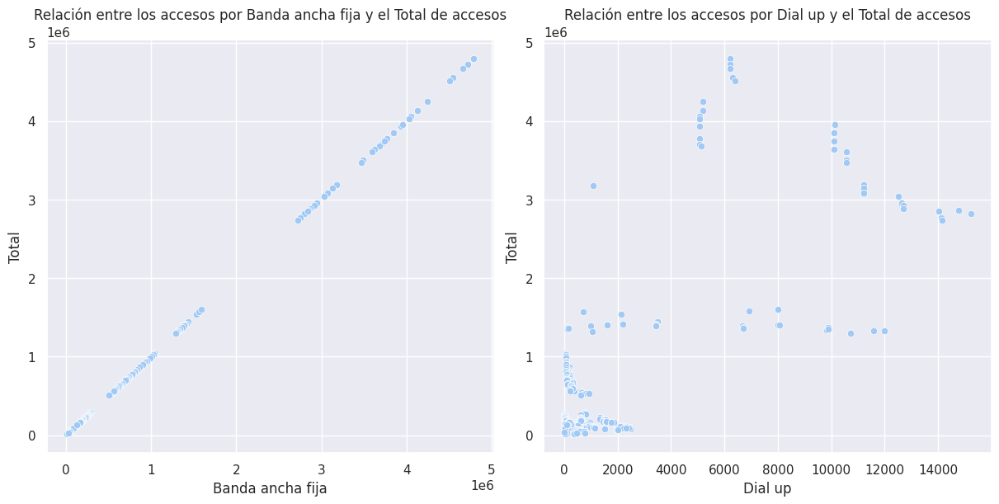

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6), constrained_layout = True)

# Se grafica la relación entre los accesos por Banda ancha fija y el Total de accesos
sns.scatterplot(x = 'Banda ancha fija', y = 'Total', data = inter_baf_provincia, ax = axes[0])
axes[0].set_title('Relación entre los accesos por Banda ancha fija y el Total de accesos')

# Se grafica la relación entre los accesos por Dial up y el Total de accesos
sns.scatterplot(x = 'Dial up', y = 'Total', data = inter_baf_provincia, ax = axes[1])
axes[1].set_title('Relación entre los accesos por Dial up y el Total de accesos')

# Mostraer las relaciones
plt.show()

### Análisis Multivariable

#### Penetración promedio anual-trimestral del Internet fijo por Banda ancha fija

```Año``` vs ```Trimestre``` vs ```Provincia``` vs ```Banda ancha fija```

Para facilitar el análisis en cada una de las provincias, se procede a explorar los datos por regiones. Es importante tener en cuenta que, aunque estas divisiones se utilizarán para fines estadísticos y de análisis, no son necesariamente oficiales y pueden variar según la fuente que se consulte. Además que cada una de estas regiones tienen sus propias características y particularidades, y que pueden haber diferencias significativas en términos de acceso a la tecnología y otros indicadores socioeconómicos entre las provincias y regiones dentro de cada una de ellas.

In [ ]:
# Región Patagonia de Argentina
patagonia = inter_baf_provincia[inter_baf_provincia['Provincia'].isin(['Tierra del Fuego', 'Santa Cruz', 'Chubut',
                                                                       'Neuquén', 'Río Negro'])]

# Región de Cuyo de Argentina
cuyo = inter_baf_provincia[inter_baf_provincia['Provincia'].isin(['Mendoza', 'San Luis', 'San Juan'])]

# Región Pampeana de Argentina
pampeana = inter_baf_provincia[inter_baf_provincia['Provincia'].isin(['Buenos Aires', 'Capital Federal' ,'Santa Fe',
                                                                      'Córdoba', 'La Pampa'])]

# Región Noroeste de Argentina
noroeste = inter_baf_provincia[inter_baf_provincia['Provincia'].isin(['La Rioja', 'Catamarca', 'Tucumán',
                                                                      'Santiago del Estero', 'Salta', 'Jujuy'])]

# Región Noreste de Argentina
noreste = inter_baf_provincia[inter_baf_provincia['Provincia'].isin(['Chaco', 'Formosa', 'Corrientes', 'Entre Ríos',
                                                                     'Misiones'])]

##### Región Patagonia

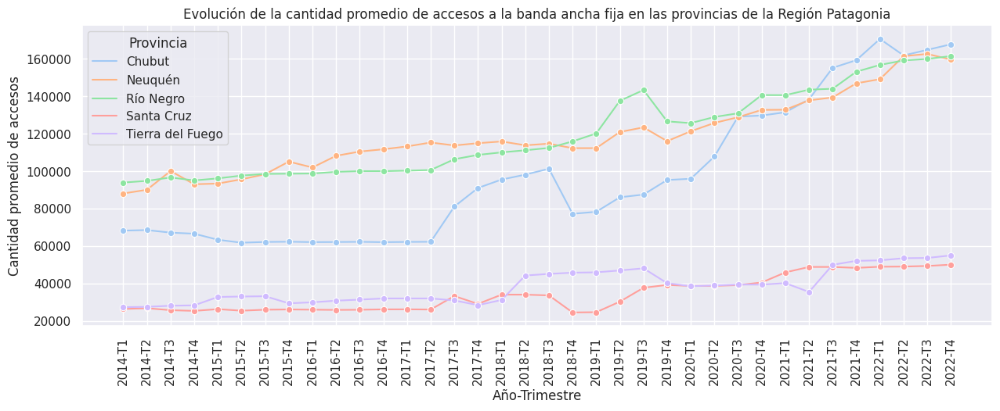

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Banda ancha fija"
df_promedio = patagonia.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Banda ancha fija'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Banda ancha fija', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de la cantidad promedio de accesos a la banda ancha fija en las provincias de la Región Patagonia')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

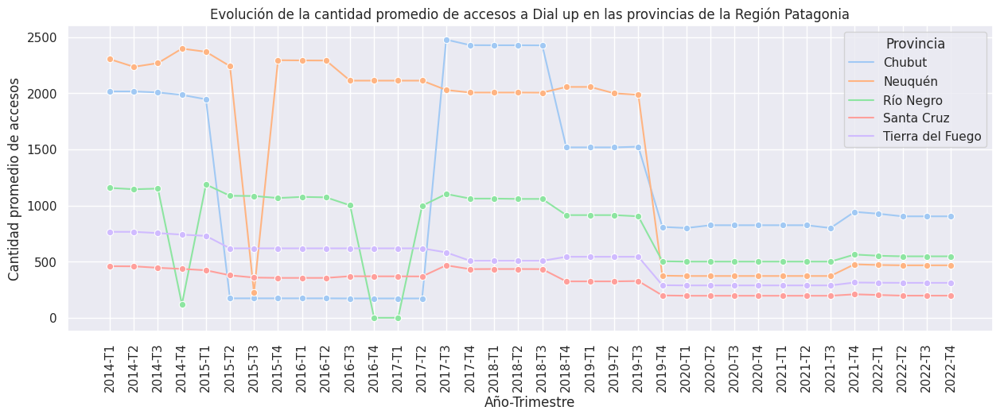

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Dial up"
df_promedio = patagonia.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Dial up'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Dial up', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de la cantidad promedio de accesos a Dial up en las provincias de la Región Patagonia')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Filtrar los datos para obtener solo los accesos a banda ancha fija de los años 2014 y 2022
datos_2014 = patagonia[(patagonia['Año'] == 2014) & (patagonia['Banda ancha fija'].notnull())]
datos_2022 = patagonia[(patagonia['Año'] == 2022) & (patagonia['Banda ancha fija'].notnull())]
# Filtrar los datos para obtener solo los accesos a Dial up de los años 2014 y 2022
datos_2014_dialup = patagonia[(patagonia['Año'] == 2014) & (patagonia['Dial up'].notnull())]
datos_2022_dialup = patagonia[(patagonia['Año'] == 2022) & (patagonia['Dial up'].notnull())]

# Agrupar los datos por provincia y calcular el promedio de los accesos a banda ancha fija en cada año
accesos_2014_banda_ancha = datos_2014.groupby(['Provincia']).agg({'Banda ancha fija': 'mean'})
accesos_2022_banda_ancha = datos_2022.groupby(['Provincia']).agg({'Banda ancha fija': 'mean'})
# Agrupar los datos por provincia y calcular el promedio de los accesos a Dial up en cada año
accesos_2014_dialup = datos_2014_dialup.groupby(['Provincia']).agg({'Dial up': 'mean'})
accesos_2022_dialup = datos_2022_dialup.groupby(['Provincia']).agg({'Dial up': 'mean'})

# Calcular el porcentaje de cambio entre los accesos de 2014 y 2022 para cada provincia
cambio_banda_ancha = ((accesos_2022_banda_ancha - accesos_2014_banda_ancha) / accesos_2014_banda_ancha) * 100
cambio_banda_ancha.rename(columns={'Banda ancha fija': 'Cambio porcentual Banda ancha fija'}, inplace=True)
# Calcular el porcentaje de cambio entre los accesos de 2014 y 2022 para cada provincia
cambio_dialup = ((accesos_2022_dialup - accesos_2014_dialup) / accesos_2014_dialup) * 100
cambio_dialup.rename(columns={'Dial up': 'Cambio porcentual Dial up'}, inplace=True)

# Combinar los resultados de los cambios porcentuales de Dial up y Banda ancha fija por provincia
cambio_patagonia = cambio_banda_ancha.join(cambio_dialup, how='outer')
# Imprimir los resultados
cambio_patagonia

,Cambio porcentual Banda ancha fija,Cambio porcentual Dial up
Provincia,,
Chubut,146.058914,-54.648554
Neuquén,70.545595,-79.626209
Río Negro,67.610673,-38.528260
Santa Cruz,89.699389,-55.691283
Tierra del Fuego,93.050513,-58.751651


**Apreciaciones:**

```Banda ancha fija```

- Se puede observar que las provincia de Chubut, Neuquén y Río Negro son las que tienen la mayor cantidad de accesos promedios a la banda ancha fija.

- Mientras que las provincias de Santa Cruz y Tierra de Fuego tiene la menor cantidad de accesos promedios en comparación con las otras provincias seleccionadas.

- La provincias que mayor porcentaje de crecimiento han experimentado del 2014 al 2022 han sido Chubut y Tierra de Fuego, mientras que Río Negro pese a estar cerca de la mayor cantidad de accesos de la región es la que menor porcentaje de accesos a obtenido a lo largo de esos años.

```Dial up```

- Hay una tendencia negativa en la cantidad de accesos a Dial up en las cinco provincias de la Región Patagonia, estando por debajo de los 1000 accesos. Siendo Neuquén la que mayor % de caida ha experimentado.

##### Región de Cuyo

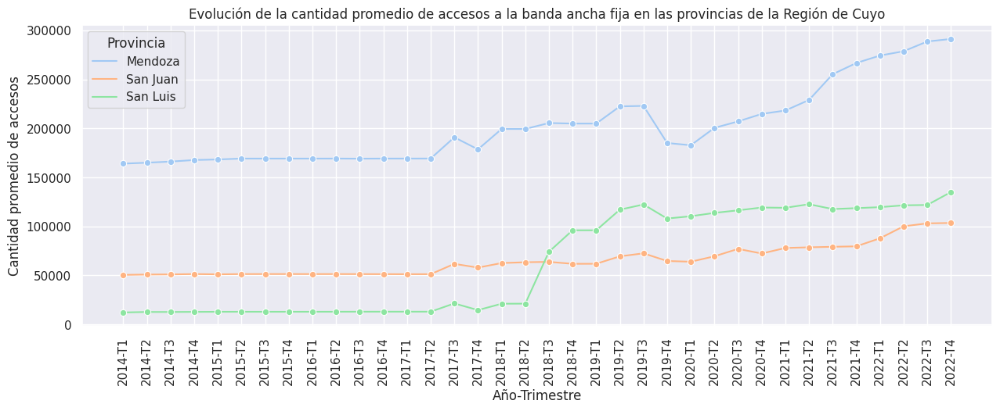

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Banda ancha fija"
df_promedio = cuyo.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Banda ancha fija'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Banda ancha fija', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de la cantidad promedio de accesos a la banda ancha fija en las provincias de la Región de Cuyo')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

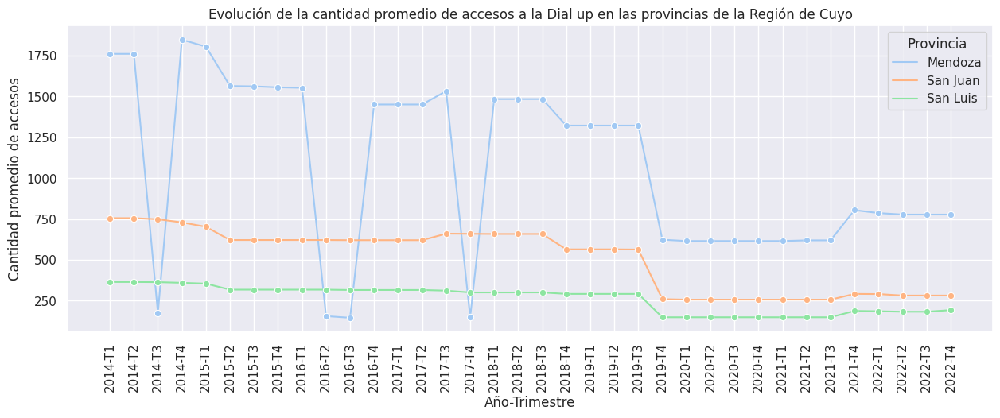

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Dial up"
df_promedio = cuyo.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Dial up'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Dial up', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de la cantidad promedio de accesos a la Dial up en las provincias de la Región de Cuyo')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Filtrar los datos para obtener solo los accesos a banda ancha fija de los años 2014 y 2022
datos_2014 = cuyo[(cuyo['Año'] == 2014) & (cuyo['Banda ancha fija'].notnull())]
datos_2022 = cuyo[(cuyo['Año'] == 2022) & (cuyo['Banda ancha fija'].notnull())]
# Filtrar los datos para obtener solo los accesos a Dial up de los años 2014 y 2022
datos_2014_dialup = cuyo[(cuyo['Año'] == 2014) & (cuyo['Dial up'].notnull())]
datos_2022_dialup = cuyo[(cuyo['Año'] == 2022) & (cuyo['Dial up'].notnull())]

# Agrupar los datos por provincia y calcular el promedio de los accesos a banda ancha fija en cada año
accesos_2014_banda_ancha = datos_2014.groupby(['Provincia']).agg({'Banda ancha fija': 'mean'})
accesos_2022_banda_ancha = datos_2022.groupby(['Provincia']).agg({'Banda ancha fija': 'mean'})
# Agrupar los datos por provincia y calcular el promedio de los accesos a Dial up en cada año
accesos_2014_dialup = datos_2014_dialup.groupby(['Provincia']).agg({'Dial up': 'mean'})
accesos_2022_dialup = datos_2022_dialup.groupby(['Provincia']).agg({'Dial up': 'mean'})

# Calcular el porcentaje de cambio entre los accesos de 2014 y 2022 para cada provincia
cambio_banda_ancha = ((accesos_2022_banda_ancha - accesos_2014_banda_ancha) / accesos_2014_banda_ancha) * 100
cambio_banda_ancha.rename(columns={'Banda ancha fija': 'Cambio porcentual Banda ancha fija'}, inplace=True)
# Calcular el porcentaje de cambio entre los accesos de 2014 y 2022 para cada provincia
cambio_dialup = ((accesos_2022_dialup - accesos_2014_dialup) / accesos_2014_dialup) * 100
cambio_dialup.rename(columns={'Dial up': 'Cambio porcentual Dial up'}, inplace=True)

# Combinar los resultados de los cambios porcentuales de Dial up y Banda ancha fija por provincia
cambio_cuyo = cambio_banda_ancha.join(cambio_dialup, how='outer')
# Imprimir los resultados
cambio_cuyo

,Cambio porcentual Banda ancha fija,Cambio porcentual Dial up
Provincia,,
Mendoza,70.908035,-43.777056
San Juan,93.606730,-62.068966
San Luis,889.244365,-48.896552


**Apreciaciones:**

```Banda ancha fija```

- Se puede observar que la provincia de Mendoza es la que tiene la mayor cantidad de accesos promedios a la banda ancha fija, siendo mayor que las de la región de Patagonia.

- Mientras que las provincias de San Juan y San Luis tiene la menor cantidad de accesos promedios en comparación con Mendoza. Pero siendo mayor que las de las provincias de San Cruz y Tierra del Fuego de la región Patagonia.

- La provincia que mayor porcentaje de crecimiento ha experimentado del 2014 al 2022 ha sido San Luis, mientras que Mendoza pese a ser la que mayor cantidad de acceso en la región tiene es la que menor porcentaje de accesos a obtenido a lo largo de esos años.

```Dial up```

- Hay una tendencia negativa en la cantidad de accesos a Dial up en las tres provincias de la Región de Cuyo, estando por debajo de los 750 accesos. Siendo San Juan la que mayor % de caida ha experimentado.

##### Región Pampeana

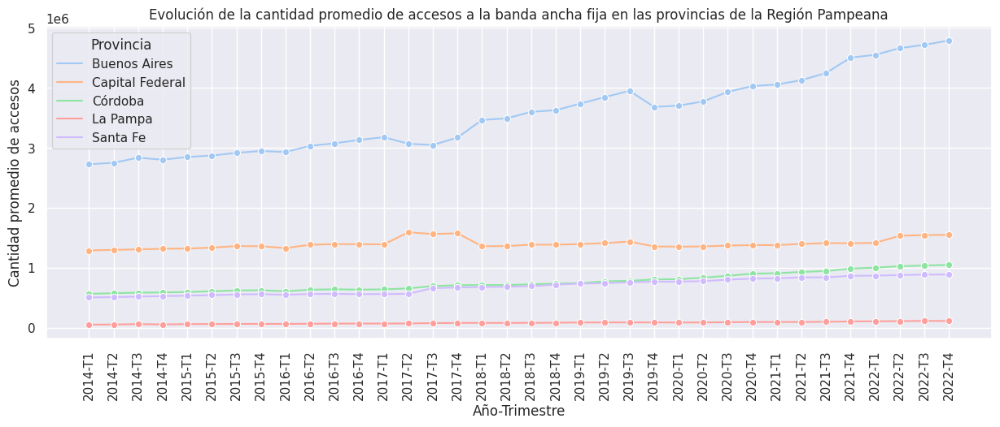

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Banda ancha fija"
df_promedio = pampeana.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Banda ancha fija'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Banda ancha fija', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de la cantidad promedio de accesos a la banda ancha fija en las provincias de la Región Pampeana')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
x = pampeana.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Banda ancha fija'].mean()
min_lapampa = x[x['Provincia'] == 'La Pampa'].min()[3]
max_lapampa = x[x['Provincia'] == 'La Pampa'].max()[3]
print(f'Valor mínimo: {min_lapampa}\nValor máximo: {max_lapampa}')

Valor mínimo: 53601.0
Valor máximo: 115921.0


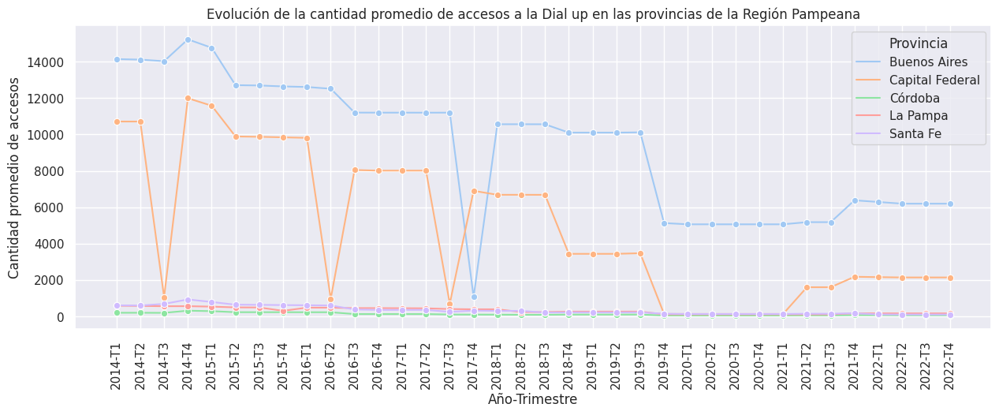

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Dial up"
df_promedio = pampeana.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Dial up'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Dial up', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de la cantidad promedio de accesos a la Dial up en las provincias de la Región Pampeana')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
x = pampeana.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Dial up'].mean()
min_santafe = x[x['Provincia'] == 'Santa Fe'].min()[3]
max_santafe = x[x['Provincia'] == 'Santa Fe'].max()[3]
print(f'Santa Fe: {min_santafe}\nValor máximo: {max_santafe}')

Santa Fe: 110.0
Valor máximo: 938.0


In [ ]:
# Filtrar los datos para obtener solo los accesos a banda ancha fija de los años 2014 y 2022
datos_2014 = pampeana[(pampeana['Año'] == 2014) & (pampeana['Banda ancha fija'].notnull())]
datos_2022 = pampeana[(pampeana['Año'] == 2022) & (pampeana['Banda ancha fija'].notnull())]
# Filtrar los datos para obtener solo los accesos a Dial up de los años 2014 y 2022
datos_2014_dialup = pampeana[(pampeana['Año'] == 2014) & (pampeana['Dial up'].notnull())]
datos_2022_dialup = pampeana[(pampeana['Año'] == 2022) & (pampeana['Dial up'].notnull())]

# Agrupar los datos por provincia y calcular el promedio de los accesos a banda ancha fija en cada año
accesos_2014_banda_ancha = datos_2014.groupby(['Provincia']).agg({'Banda ancha fija': 'mean'})
accesos_2022_banda_ancha = datos_2022.groupby(['Provincia']).agg({'Banda ancha fija': 'mean'})
# Agrupar los datos por provincia y calcular el promedio de los accesos a Dial up en cada año
accesos_2014_dialup = datos_2014_dialup.groupby(['Provincia']).agg({'Dial up': 'mean'})
accesos_2022_dialup = datos_2022_dialup.groupby(['Provincia']).agg({'Dial up': 'mean'})

# Calcular el porcentaje de cambio entre los accesos de 2014 y 2022 para cada provincia
cambio_banda_ancha = ((accesos_2022_banda_ancha - accesos_2014_banda_ancha) / accesos_2014_banda_ancha) * 100
cambio_banda_ancha.rename(columns={'Banda ancha fija': 'Cambio porcentual Banda ancha fija'}, inplace=True)
# Calcular el porcentaje de cambio entre los accesos de 2014 y 2022 para cada provincia
cambio_dialup = ((accesos_2022_dialup - accesos_2014_dialup) / accesos_2014_dialup) * 100
cambio_dialup.rename(columns={'Dial up': 'Cambio porcentual Dial up'}, inplace=True)

# Combinar los resultados de los cambios porcentuales de Dial up y Banda ancha fija por provincia
cambio_pampeana = cambio_banda_ancha.join(cambio_dialup, how='outer')
# Imprimir los resultados
cambio_pampeana

,Cambio porcentual Banda ancha fija,Cambio porcentual Dial up
Provincia,,
Buenos Aires,68.399686,-56.725838
Capital Federal,15.934483,-75.066698
Córdoba,77.604584,-70.075350
La Pampa,98.321331,-70.256188
Santa Fe,70.556541,-84.364020


**Apreciaciones:**

```Banda ancha fija```
- Se puede observar que la provincia de Buenos Aires es la que tiene la mayor cantidad de accesos promedios a la banda ancha fija superando los 4 millones. Mientras que la Capital Federal y Córdoba le siguen superando el millón.

- Por su parte, las provincias de Santa Fe y La Pampa tienen la menor cantidad de accesos promedios en comparación con las otras provincias seleccionadas.

- La provincia que mayor porcentaje de crecimiento ha experimentado del 2014 al 2022 ha sido La Pampa, a pesar de ser la que menor cantidad de accesos promedios tiene de la región. Entre tanto la Capital Federal pese superar el millón de accesos promedios es la que menor porcentaje de accesos a obtenido a lo largo de esos años.

```Dial up```

- Hay una tendencia negativa en la cantidad de accesos a Dial up en las cinco provincias de la Región Pampeana, estando por debajo de los 1000 accesos al igual que en la región de Patagonia. Siendo Santa Fe la que mayor % de caida ha experimentado.

##### Región Noroeste

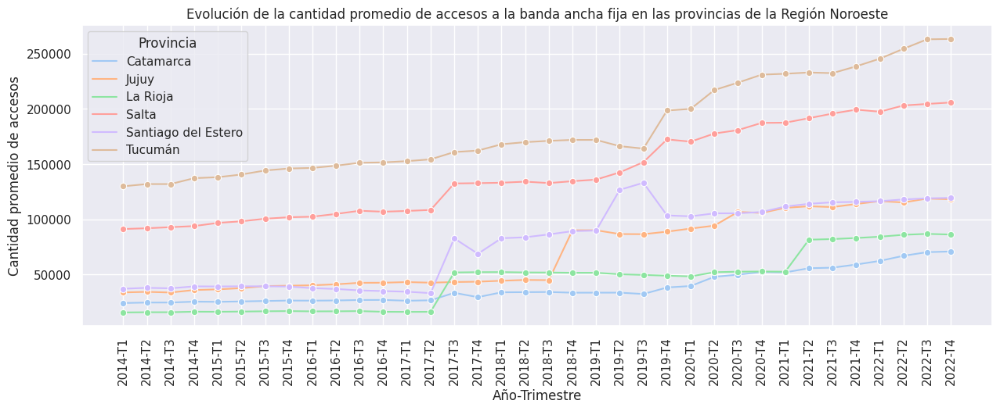

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Banda ancha fija"
df_promedio = noroeste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Banda ancha fija'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Banda ancha fija', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de la cantidad promedio de accesos a la banda ancha fija en las provincias de la Región Noroeste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

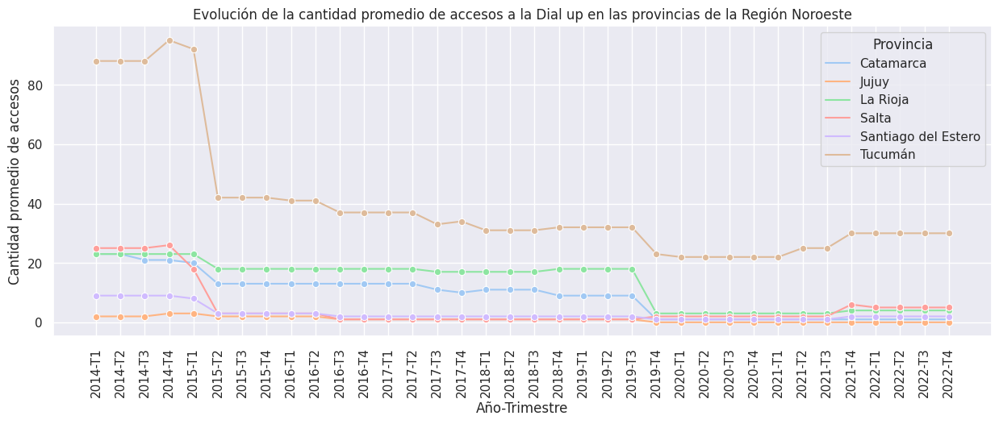

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Dial up"
df_promedio = noroeste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Dial up'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Dial up', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de la cantidad promedio de accesos a la Dial up en las provincias de la Región Noroeste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
valor = noroeste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Dial up'].mean()
min_salta = valor[valor['Provincia'] == 'Salta'].min()[3]
max_salta = valor[valor['Provincia'] == 'Salta'].max()[3]
print(f'Valor mínimo: {min_salta}\nValor máximo: {max_salta}')

Valor mínimo: 1.0
Valor máximo: 26.0


In [ ]:
# Filtrar los datos para obtener solo los accesos a banda ancha fija de los años 2014 y 2022
datos_2014 = noroeste[(noroeste['Año'] == 2014) & (noroeste['Banda ancha fija'].notnull())]
datos_2022 = noroeste[(noroeste['Año'] == 2022) & (noroeste['Banda ancha fija'].notnull())]
# Filtrar los datos para obtener solo los accesos a Dial up de los años 2014 y 2022
datos_2014_dialup = noroeste[(noroeste['Año'] == 2014) & (noroeste['Dial up'].notnull())]
datos_2022_dialup = noroeste[(noroeste['Año'] == 2022) & (noroeste['Dial up'].notnull())]

# Agrupar los datos por provincia y calcular el promedio de los accesos a banda ancha fija en cada año
accesos_2014_banda_ancha = datos_2014.groupby(['Provincia']).agg({'Banda ancha fija': 'mean'})
accesos_2022_banda_ancha = datos_2022.groupby(['Provincia']).agg({'Banda ancha fija': 'mean'})
# Agrupar los datos por provincia y calcular el promedio de los accesos a Dial up en cada año
accesos_2014_dialup = datos_2014_dialup.groupby(['Provincia']).agg({'Dial up': 'mean'})
accesos_2022_dialup = datos_2022_dialup.groupby(['Provincia']).agg({'Dial up': 'mean'})

# Calcular el porcentaje de cambio entre los accesos de 2014 y 2022 para cada provincia
cambio_banda_ancha = ((accesos_2022_banda_ancha - accesos_2014_banda_ancha) / accesos_2014_banda_ancha) * 100
cambio_banda_ancha.rename(columns={'Banda ancha fija': 'Cambio porcentual Banda ancha fija'}, inplace=True)
# Calcular el porcentaje de cambio entre los accesos de 2014 y 2022 para cada provincia
cambio_dialup = ((accesos_2022_dialup - accesos_2014_dialup) / accesos_2014_dialup) * 100
cambio_dialup.rename(columns={'Dial up': 'Cambio porcentual Dial up'}, inplace=True)

# Combinar los resultados de los cambios porcentuales de Dial up y Banda ancha fija por provincia
cambio_noroeste = cambio_banda_ancha.join(cambio_dialup, how='outer')
# Imprimir los resultados
cambio_noroeste

,Cambio porcentual Banda ancha fija,Cambio porcentual Dial up
Provincia,,
Catamarca,173.300608,-95.454545
Jujuy,239.948667,-100.000000
La Rioja,437.898792,-82.608696
Salta,119.171008,-80.198020
Santiago del Estero,211.254631,-77.777778
Tucumán,93.235724,-66.573816


**Apreciaciones:**

```Banda ancha fija```

- Se puede observar que la provincia de Tucumán es la que tiene la mayor cantidad de accesos promedios a la banda ancha fija superando los 250 mil, siendo mayor que las provincias de la región Patagonia pero por debajo de la mayoría de las provincias Pampeana. Mientras que le sigue la provincia Salta con 200 mil.

- Por su parte, las provincias de La Rioja y Catamarca tienen la menor cantidad de accesos promedios en comparación con las otras provincias seleccionadas.

- La provincia que mayor porcentaje de crecimiento ha experimentado del 2014 al 2022 ha sido La Rioja, a pesar de ser una de las que menor cantidad de accesos promedios tiene de la región. Entre tanto la provincia de Tucumán es la que menor porcentaje de accesos a obtenido a lo largo de esos años.

```Dial up```

- Hay una tendencia negativa en la cantidad de accesos a Dial up en las seis provincias de la Región Noroeste, estando cinco de ellas por debajo de los 10 accesos siendo una de las regiones con menor cantidad de accesos a esta tecnología. La provincia de Jujuy es la que mayor % de caida ha experimentado.

##### Región Noreste

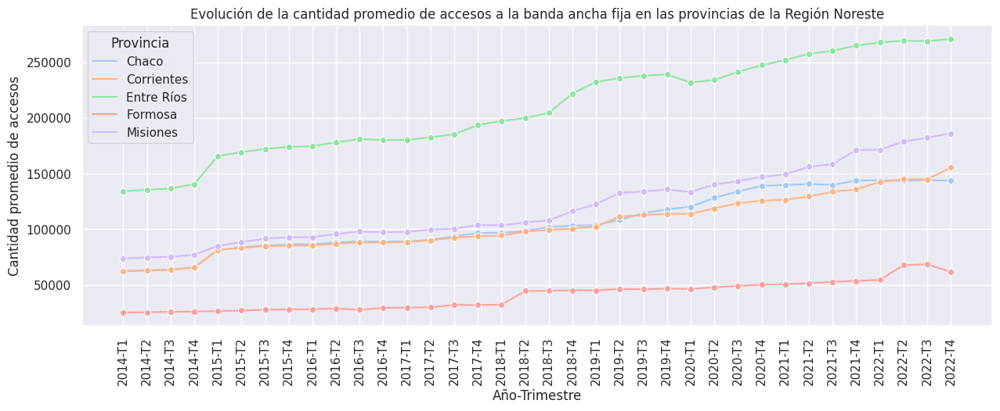

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Banda ancha fija"
df_promedio = noreste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Banda ancha fija'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Banda ancha fija', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de la cantidad promedio de accesos a la banda ancha fija en las provincias de la Región Noreste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

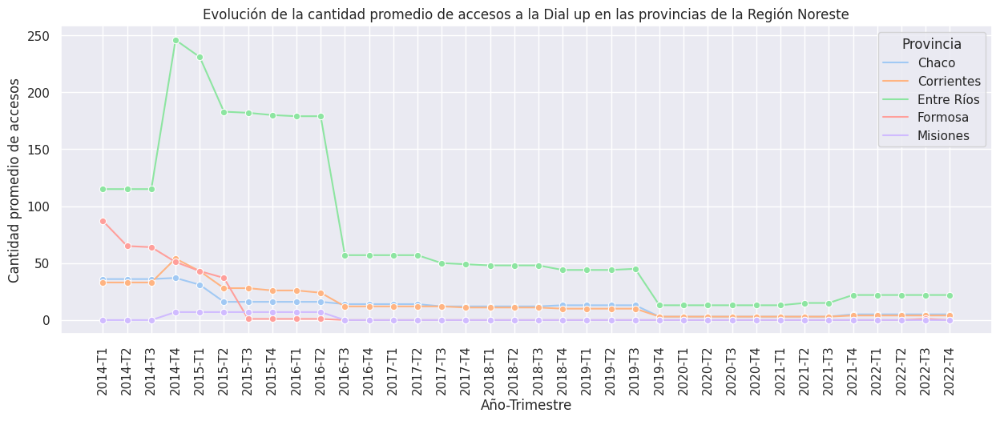

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Dial up"
df_promedio = noreste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Dial up'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Dial up', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de la cantidad promedio de accesos a la Dial up en las provincias de la Región Noreste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
valor = noreste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Dial up'].mean()
min_entrerios = valor[valor['Provincia'] == 'Entre Ríos'].min()[3]
max_entrerios = valor[valor['Provincia'] == 'Entre Ríos'].max()[3]
print(f'Valor mínimo: {min_entrerios}\nValor máximo: {max_entrerios}')

Valor mínimo: 13.0
Valor máximo: 246.0


In [ ]:
# Filtrar los datos para obtener solo los accesos a banda ancha fija de los años 2014 y 2022
datos_2014 = noreste[(noreste['Año'] == 2014) & (noreste['Banda ancha fija'].notnull())]
datos_2022 = noreste[(noreste['Año'] == 2022) & (noreste['Banda ancha fija'].notnull())]
# Filtrar los datos para obtener solo los accesos a Dial up de los años 2014 y 2022
datos_2014_dialup = noreste[(noreste['Año'] == 2014) & (noreste['Dial up'].notnull())]
datos_2022_dialup = noreste[(noreste['Año'] == 2022) & (noreste['Dial up'].notnull())]

# Agrupar los datos por provincia y calcular el promedio de los accesos a banda ancha fija en cada año
accesos_2014_banda_ancha = datos_2014.groupby(['Provincia']).agg({'Banda ancha fija': 'mean'})
accesos_2022_banda_ancha = datos_2022.groupby(['Provincia']).agg({'Banda ancha fija': 'mean'})
# Agrupar los datos por provincia y calcular el promedio de los accesos a Dial up en cada año
accesos_2014_dialup = datos_2014_dialup.groupby(['Provincia']).agg({'Dial up': 'mean'})
accesos_2022_dialup = datos_2022_dialup.groupby(['Provincia']).agg({'Dial up': 'mean'})

# Calcular el porcentaje de cambio entre los accesos de 2014 y 2022 para cada provincia
cambio_banda_ancha = ((accesos_2022_banda_ancha - accesos_2014_banda_ancha) / accesos_2014_banda_ancha) * 100
cambio_banda_ancha.rename(columns={'Banda ancha fija': 'Cambio porcentual Banda ancha fija'}, inplace=True)
# Calcular el porcentaje de cambio entre los accesos de 2014 y 2022 para cada provincia
cambio_dialup = ((accesos_2022_dialup - accesos_2014_dialup) / accesos_2014_dialup) * 100
cambio_dialup.rename(columns={'Dial up': 'Cambio porcentual Dial up'}, inplace=True)

# Combinar los resultados de los cambios porcentuales de Dial up y Banda ancha fija por provincia
cambio_noreste = cambio_banda_ancha.join(cambio_dialup, how='outer')
# Imprimir los resultados
cambio_noreste

,Cambio porcentual Banda ancha fija,Cambio porcentual Dial up
Provincia,,
Chaco,125.259227,-86.206897
Corrientes,131.167125,-89.542484
Entre Ríos,96.961795,-85.109983
Formosa,145.683632,-99.625468
Misiones,138.637330,-100.000000


**Apreciaciones:**

```Banda ancha fija```

- Se puede observar que la provincia de Entre Ríos es la que tiene la mayor cantidad de accesos promedios a la banda ancha fija superando los 250 mil, siendo mayor que las provincias de la región Patagonia pero por debajo de la mayoría de las provincias de la región Pampeana. Mientras que le sigue la provincia Misiones con 150 mil.

- Por su parte, la provincia de Formosa tiene la menor cantidad de accesos promedios en comparación con las otras provincias seleccionadas.

- La provincia que mayor porcentaje de crecimiento ha experimentado del 2014 al 2022 ha sido Formosa, a pesar de ser una de las que menor cantidad de accesos promedios tiene de la región. Entre tanto la provincia de Entre Ríos es la que menor porcentaje de accesos a obtenido a lo largo de esos años.

```Dial up```

- Hay una tendencia negativa en la cantidad de accesos a Dial up en las cinco provincias de la Región Noreste, estando todas ellas por debajo de los 50 accesos siendo una de las regiones junto con la de Noroeste con menor cantidad de accesos a esta tecnología. La provincia de Misiones es la que mayor % de caida ha experimentado.

#### ```Año``` vs ```Provincia``` vs ```Banda ancha fija```

**Mapa de accesos por Banda ancha fija**

Este mapa proporcionará un resumen de los años más recientes, específicamente 2021 y 2022. Aunque solo se tienen datos hasta el tercer trimestre del año 2022, estos años pueden brindar una imagen más precisa de la situación actual del mercado. Se presentará información clave sobre los niveles de acceso a la Banda ancha fija en Argentina para ambos años, lo que permitirá visualizar mejor la distribución del acceso a lo largo del país.

In [ ]:
# Leer un archivo .csv con las latitudes y longitudes de cada una de las provincias de Argentina
geo_arg = pd.read_csv('geo_argentina.csv', encoding = 'ISO 8859-1')
# Se crea un dataframe con los datos correspondientes a los años 2021 y 2022
banda_ancha = inter_baf_provincia[inter_baf_provincia['Año'] >= 2021][['Provincia', 'Año', 'Banda ancha fija']]

# Se unen los Dataframes "geo_arg" y "banda_ancha" utilizando la columna "provincia" con punto de unión
data = pd.merge(geo_arg, banda_ancha, on = 'Provincia')

# Se agrupan los datos por provincia y año conservando la latitud y longitud de cada provincia
mapa_hogares = data.groupby(['Provincia','Año'], as_index = False).agg({'Banda ancha fija': 'mean',
                                                                        'Latitud': 'first', 'Longitud': 'first'})
# Cargar el archivo geojson de provincias de Argentina
mapa = gpd.read_file('ProvinciasArgentina.geojson')

# Se fusionan los datos de acceso a las tecnologías por provincia con el archivo GeoJSON de las provincias de Argentina
provincias_accesos = mapa.merge(mapa_hogares, left_on = 'nombre',
                                           right_on = 'Provincia', how = 'outer')
# Se convierte el sistema de coordenadas a uno proyectado
provincias_accesos = provincias_accesos.to_crs(epsg = 3857)

# Se crean dos Dataframes con la data respectiva para cada año
data_2021_ba = provincias_accesos[provincias_accesos['Año'] == 2021].copy()
data_2022_ba = provincias_accesos[provincias_accesos['Año'] == 2022].copy()

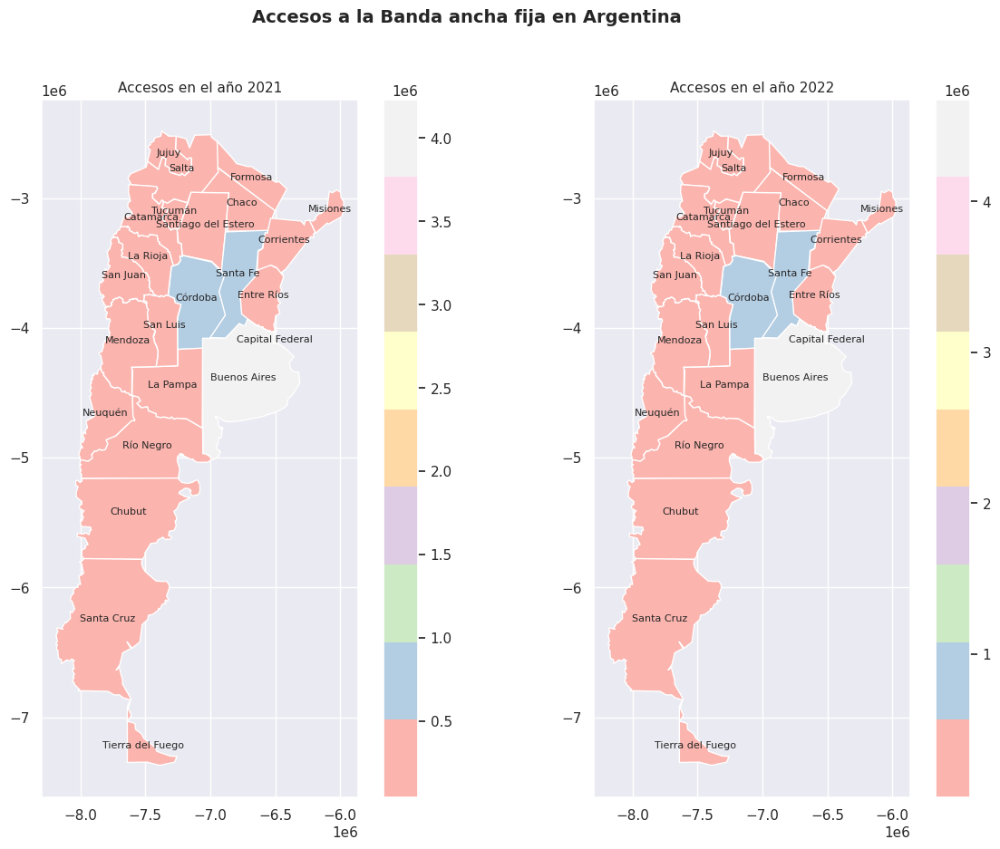

In [ ]:
# Crear una figura con dos ejes
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (15, 10))

# Trazar el mapa para la columna Banda ancha fija en el eje izquierdo
data_2021_ba.plot(column = 'Banda ancha fija', cmap = 'Pastel1', legend = True, ax = ax1)
ax1.set_title('Accesos en el año 2021', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Banda ancha fija
data_2021_ba['coords'] = data_2021_ba['geometry'].centroid
for idx, row in data_2021_ba.iterrows():
  ax1.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Trazar el mapa para la columna Banda ancha fija en el eje derecho
data_2022_ba.plot(column = 'Banda ancha fija', cmap = 'Pastel1', legend = True, ax = ax2)
ax2.set_title('Accesos en el año 2022', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Banda ancha fija
data_2022_ba['coords'] = data_2022_ba['geometry'].centroid
for idx, row in data_2022_ba.iterrows():
  ax2.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Ajustar el espaciado entre los dos ejes
fig.subplots_adjust(wspace = 0.1)

# Agregar un título general a la figura
fig.suptitle('Accesos a la Banda ancha fija en Argentina', fontsize = 14, fontweight = 'bold')

# Mostrar la figura
plt.show()

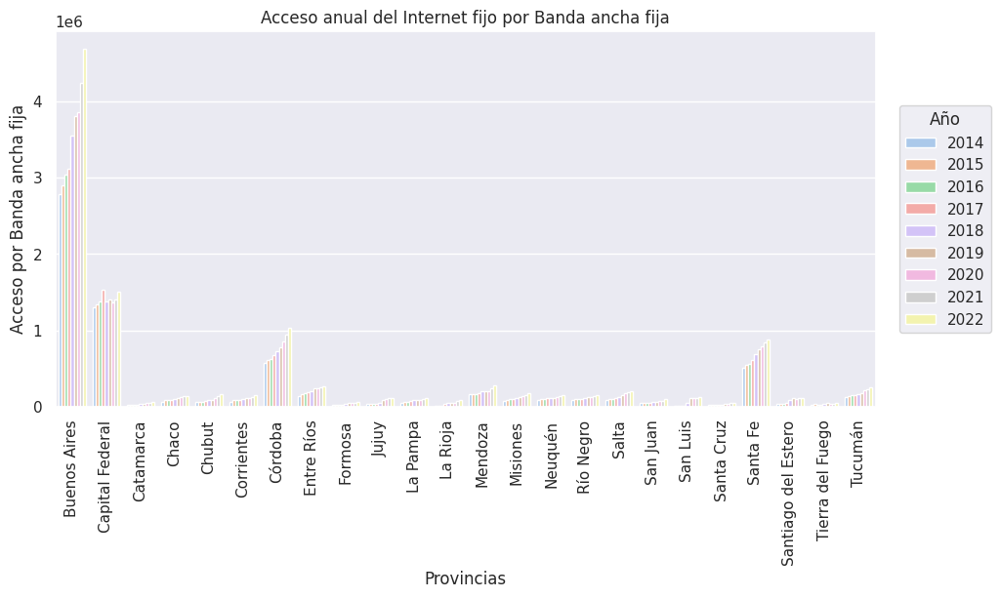

In [ ]:
# Agrupar los datos por provincia y año y calcular la media del acceso por banda ancha fija
df_resumen = inter_baf_provincia.groupby(['Provincia', 'Año'])['Banda ancha fija'].mean().reset_index()

# Generar el gráfico de barras agrupadas con Seaborn
fig, ax = plt.subplots(figsize = (12, 5))
sns.barplot(x = 'Provincia', y = 'Banda ancha fija', hue = 'Año', data = df_resumen, ax = ax)

# Actualizar las opciones del diseño del gráfico
ax.set_title('Acceso anual del Internet fijo por Banda ancha fija')
ax.set_xlabel('Provincias')
ax.set_ylabel('Acceso por Banda ancha fija')
ax.tick_params(axis = 'x', rotation = 90)

# Agregar título a la leyenda
ax.legend(title = 'Año', ncol = 1, bbox_to_anchor = (1.15, 0.5), loc = 'center right')
# Ajustar el espacio entre el gráfico y la leyenda
plt.subplots_adjust(left = 0.2)
# Mostrar el gráfico
plt.show()

**Apreciaciones:**

- Se ratifica lo analizado en los gráficos anteriores, las provincias de Buenos Aires, Córdoba, Santa Fe y la Capital Federal son las que tienen mayor cantidad de accesos a la Banda ancha fija.

- Mientras que las provincias de Catamarca, Formosa, Santa Cruz y Tierra del Fuego son las que menor acceso a la Banda ancha fija tienen.

#### ```Año``` vs ```Provincia``` vs ```Dial up```

Mapa de accesos por Dial up

Este mapa proporcionará un resumen de los años más recientes, específicamente 2021 y 2022. Aunque solo se tienen datos hasta el tercer trimestre del año 2022, estos años pueden brindar una imagen más precisa de la situación actual del mercado. Se presentará información clave sobre los niveles de acceso a Dial up en Argentina para ambos años, lo que permitirá visualizar mejor la distribución del acceso a lo largo del país.

In [ ]:
# Leer un archivo .csv con las latitudes y longitudes de cada una de las provincias de Argentina
geo_arg = pd.read_csv('geo_argentina.csv', encoding = 'ISO 8859-1')
# Se crea un dataframe con los datos correspondientes a los años 2021 y 2022
banda_ancha = inter_baf_provincia[inter_baf_provincia['Año'] >= 2021][['Provincia', 'Año', 'Dial up']]

# Se unen los Dataframes "geo_arg" y "banda_ancha" utilizando la columna "provincia" con punto de unión
data = pd.merge(geo_arg, banda_ancha, on = 'Provincia')

# Se agrupan los datos por provincia y año conservando la latitud y longitud de cada provincia
mapa_hogares = data.groupby(['Provincia','Año'], as_index = False).agg({'Dial up': 'mean',
                                                                        'Latitud': 'first', 'Longitud': 'first'})
# Cargar el archivo geojson de provincias de Argentina
mapa = gpd.read_file('ProvinciasArgentina.geojson')

# Se fusionan los datos de acceso a las tecnologías por provincia con el archivo GeoJSON de las provincias de Argentina
provincias_accesos = mapa.merge(mapa_hogares, left_on = 'nombre',
                                           right_on = 'Provincia', how = 'outer')
# Se convierte el sistema de coordenadas a uno proyectado
provincias_accesos = provincias_accesos.to_crs(epsg = 3857)

# Se crean dos Dataframes con la data respectiva para cada año
data_2021_du = provincias_accesos[provincias_accesos['Año'] == 2021].copy()
data_2022_du = provincias_accesos[provincias_accesos['Año'] == 2022].copy()

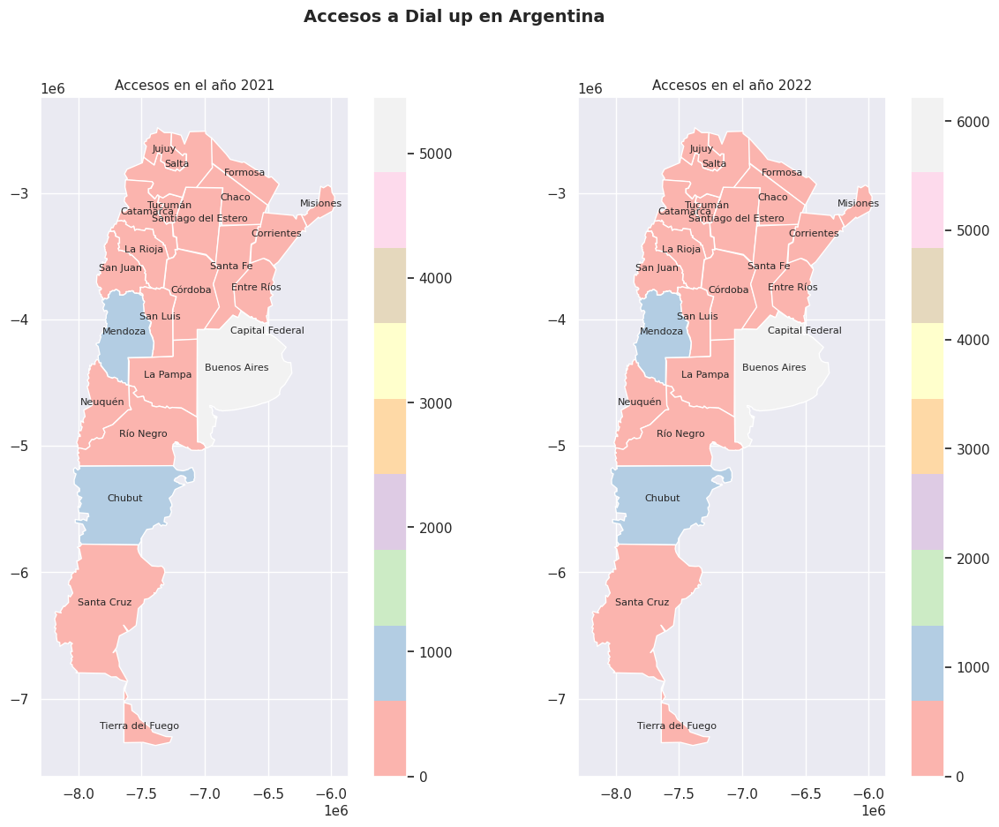

In [ ]:
# Crear una figura con dos ejes
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (15, 10))

# Trazar el mapa para la columna Dial up en el eje izquierdo
data_2021_du.plot(column = 'Dial up', cmap = 'Pastel1', legend = True, ax = ax1)
ax1.set_title('Accesos en el año 2021', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Dial up
data_2021_du['coords'] = data_2021_du['geometry'].centroid
for idx, row in data_2021_du.iterrows():
  ax1.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Trazar el mapa para la columna Dial up en el eje derecho
data_2022_du.plot(column = 'Dial up', cmap = 'Pastel1', legend = True, ax = ax2)
ax2.set_title('Accesos en el año 2022', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Dial up
data_2022_du['coords'] = data_2022_du['geometry'].centroid
for idx, row in data_2022_du.iterrows():
  ax2.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Ajustar el espaciado entre los dos ejes
fig.subplots_adjust(wspace = 0.1)

# Agregar un título general a la figura
fig.suptitle('Accesos a Dial up en Argentina', fontsize = 14, fontweight = 'bold')

# Mostrar la figura
plt.show()

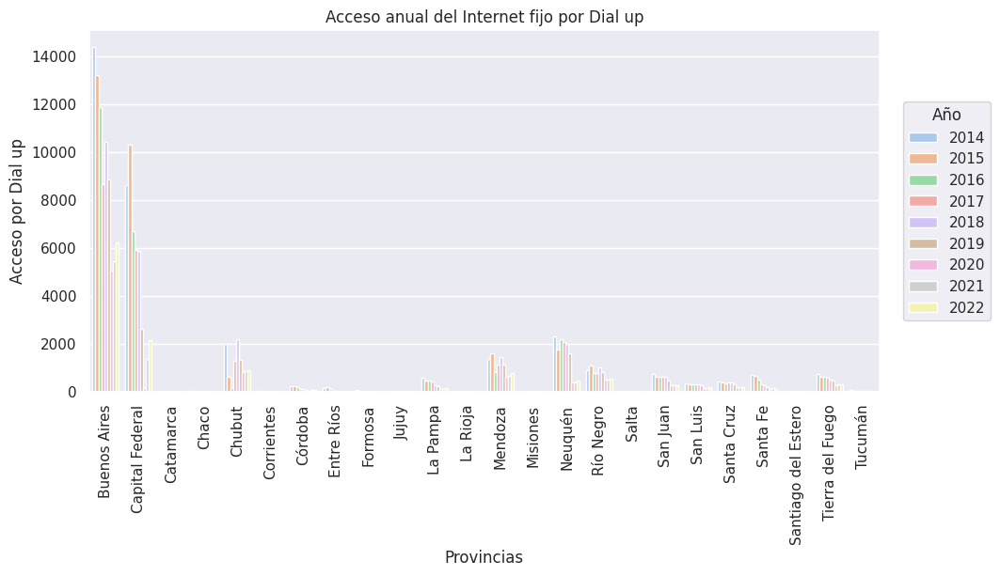

In [ ]:
# Agrupar los datos por provincia y año y calcular la media del acceso por Dial up
df_resumen = inter_baf_provincia.groupby(['Provincia', 'Año'])['Dial up'].mean().reset_index()

# Generar el gráfico de barras agrupadas con Seaborn
fig, ax = plt.subplots(figsize = (12, 5))
sns.barplot(x = 'Provincia', y = 'Dial up', hue = 'Año', data = df_resumen, ax = ax)

# Actualizar las opciones del diseño del gráfico
ax.set_title('Acceso anual del Internet fijo por Dial up')
ax.set_xlabel('Provincias')
ax.set_ylabel('Acceso por Dial up')
ax.tick_params(axis = 'x', rotation = 90)

# Agregar título a la leyenda
ax.legend(title = 'Año', ncol = 1, bbox_to_anchor = (1.15, 0.5), loc = 'center right')
# Ajustar el espacio entre el gráfico y la leyenda
plt.subplots_adjust(left = 0.2)
# Mostrar el gráfico
plt.show()

**Apreciaciones:**

- La provincia de Buenos Aires y la Capital Federal son las que mayor acceso a Dial up tienen para el año 2022. Mientras que le siguen con menos de 1000 accesos las provincias de Chubut, Mendoza, Neuquén y Río Negro.

- Por su parte para las provincias de Catamarca, Chaco, Corrientes, Formosa, Jujuy, La Rioja, Misiones, Salta, Santiago del Estero y Tucumán las que menor acceso tienen.

#### Mapa ```Banda ancha fija``` vs ```Dial up``` año 2022

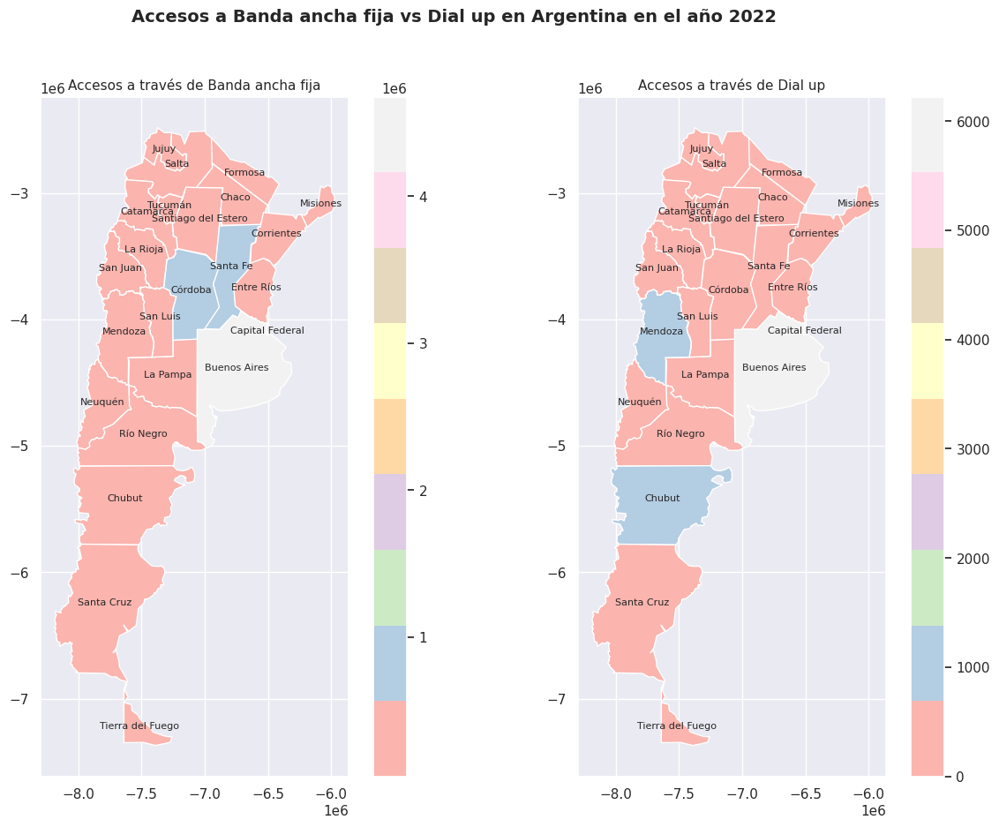

In [ ]:
# Crear una figura con dos ejes
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (15, 10))

# Trazar el mapa para la columna Banda ancha fija en el eje izquierdo
data_2022_ba.plot(column = 'Banda ancha fija', cmap = 'Pastel1', legend = True, ax = ax1)
ax1.set_title('Accesos a través de Banda ancha fija', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Banda ancha fija
data_2022_ba['coords'] = data_2022_ba['geometry'].centroid
for idx, row in data_2022_ba.iterrows():
  ax1.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Trazar el mapa para la columna Banda ancha fija en el eje derecho
data_2022_du.plot(column = 'Dial up', cmap = 'Pastel1', legend = True, ax = ax2)
ax2.set_title('Accesos a través de Dial up', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Dial up
data_2022_du['coords'] = data_2022_du['geometry'].centroid
for idx, row in data_2022_du.iterrows():
  ax2.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Ajustar el espaciado entre los dos ejes
fig.subplots_adjust(wspace = 0.1)

# Agregar un título general a la figura
fig.suptitle('Accesos a Banda ancha fija vs Dial up en Argentina en el año 2022', fontsize = 14, fontweight = 'bold')

# Mostrar la figura
plt.show()

## Total nacional de accesos a Internet fijo por tipo de tecnología

Número total de accesos al servicio de Internet fijo por tipo de tecnología (trimestral)

Datos de la Visualización: Serie trimestral de accesos a Internet fijo por tecnología

In [19]:
# Definir la URL de la API y tu API key
url = "http://api.datosabiertos.enacom.gob.ar/api/v2/datastreams/TOTAL-NACIO-DE-ACCES-A/data.csv"
api_key = "5EBQMGTfMImArsNkwhQIuatPXtYfRNlAuSTuybbB"

# Realizar la solicitud a la API
response = requests.get(url, params = {"auth_key": api_key})

# Verificar si la solicitud fue exitosa
if response.status_code == 200:
  # Leer el contenido del archivo CSV en memoria como una cadena de texto
  csv_data = response.content.decode("utf-8")

  # Crear un objeto DataFrame a partir de la cadena de texto
  acceso_internet_tecnologia = pd.read_csv(io.StringIO(csv_data))

else:
  # Mostrar un mensaje de error si la solicitud falló
  print("Error al hacer la solicitud a la API")

In [20]:
# Imprimir las primeras 5 filas de "acceso_internet_tecnologia"
acceso_internet_tecnologia.head()

,Año,Trimestre,ADSL,Cablemodem,Fibra óptica,Wireless,Otros,Total,Periodo
0,2022,4,1.315.373,6.037.457,3.060.575,572.969,221.740,11.208.114,Oct-Dic 2022
1,2022,3,1.395.277,6.031.970,2.871.541,557.110,235.230,11.091.128,Jul-Sept 2022
2,2022,2,1.468.333,5.979.214,2.723.285,556.243,231.609,10.958.684,Abr-Jun 2022
3,2022,1,1.533.240,6.073.426,2.219.533,545.814,251.996,10.624.009,Ene-Mar 2022
4,2021,4,1.657.615,5.984.240,2.072.236,523.107,252.596,10.489.794,Oct-Dic 2021


In [21]:
# Mostrar información del número de columnas, filas, tipos de datos y valores faltantes en "acceso_internet_tecnologia"
acceso_internet_tecnologia.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36 entries, 0 to 35
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Año           36 non-null     int64  
 1   Trimestre     36 non-null     int64  
 2   ADSL          36 non-null     object 
 3   Cablemodem    36 non-null     object 
 4   Fibra óptica  36 non-null     object 
 5   Wireless      36 non-null     float64
 6   Otros         36 non-null     float64
 7   Total         36 non-null     object 
 8   Periodo       36 non-null     object 
dtypes: float64(2), int64(2), object(5)
memory usage: 2.7+ KB


Hay variables que no parecen estar en el formato correcto pero sin embargo, no hay valores nulos.

### Correción de los tipos de datos

In [22]:
# Convertir la columna "ADSL" a numérica
acceso_internet_tecnologia['ADSL'] = acceso_internet_tecnologia['ADSL'].replace('[^0-9]', '', regex=True).astype(int)
# Convertir la columna "Cablemodem" a numérica
acceso_internet_tecnologia['Cablemodem'] = acceso_internet_tecnologia['Cablemodem'].replace('[^0-9]', '',
                                                                                            regex=True).astype(int)
# Convertir la columna "Fibra óptica" a numérica
acceso_internet_tecnologia['Fibra óptica'] = acceso_internet_tecnologia['Fibra óptica'].replace('[^0-9]', '',
                                                                                                regex=True).astype(int)
# Convertir la columna "Wireless" a tipo de dato int
acceso_internet_tecnologia['Wireless'] = (acceso_internet_tecnologia['Wireless'] * 1000).astype(int)
# Convertir la columna "Otros" a tipo de dato int
acceso_internet_tecnologia['Otros'] = (acceso_internet_tecnologia['Otros'] * 1000).astype(int)
# Convertir la columna "Total" a numérica
acceso_internet_tecnologia['Total'] = acceso_internet_tecnologia['Total'].replace('[^0-9]', '', regex=True).astype(int)

In [23]:
# Verificar que los cambios se aplicaron correctamente
acceso_internet_tecnologia.head(1)

,Año,Trimestre,ADSL,Cablemodem,Fibra óptica,Wireless,Otros,Total,Periodo
0,2022,4,1315373,6037457,3060575,572969,221740,11208114,Oct-Dic 2022


In [24]:
# Se crea una columna 'Fecha' combinando 'Año' y 'Trimestre' en un objeto de fecha
acceso_internet_tecnologia['Fecha'] = pd.to_datetime(acceso_internet_tecnologia['Año'].astype(str) + 'Q' + acceso_internet_tecnologia['Trimestre'].astype(str))

### Resumen estadístico

In [25]:
# Mostrar un resumen estadístico de las columnas numériocas de "acceso_internet_tecnologia"
acceso_internet_tecnologia.describe()

,Año,Trimestre,ADSL,Cablemodem,Fibra óptica,Wireless,Otros,Total
count,36.000000,36.000000,3.600000e+01,3.600000e+01,3.600000e+01,36.000000,36.000000,3.600000e+01
mean,2018.000000,2.500000,2.992507e+06,4.175792e+06,8.035492e+05,257299.166667,149495.222222,8.378642e+06
std,2.618615,1.133893,8.721436e+05,1.249104e+06,8.660955e+05,180164.589451,85534.499745,1.462265e+06
min,2014.000000,1.000000,1.315373e+06,2.407330e+06,1.391870e+05,70749.000000,54300.000000,6.398398e+06
25%,2016.000000,1.750000,2.251404e+06,3.001010e+06,1.680880e+05,85113.250000,64404.250000,7.093767e+06
50%,2018.000000,2.500000,3.539332e+06,4.138156e+06,2.368255e+05,220224.000000,116147.000000,8.228740e+06
75%,2020.000000,3.250000,3.722975e+06,5.287469e+06,1.205959e+06,415332.750000,247467.250000,9.410040e+06
max,2022.000000,4.000000,3.803024e+06,6.073426e+06,3.060575e+06,572969.000000,265328.000000,1.120811e+07


**Apreciaciones:**

- En cuanto a la cantidad de accesos a internet en Argentina, los datos muestran que ha habido un aumento constante en el número total de accesos desde 2014 hasta 2022. El promedio del número total de accesos es de 8.37 millones lo que sugiere que una cantidad significativa de personas tiene acceso a internet en Argentina.

- En cuanto a las tecnologías de acceso, el resumen estadístico indica que Cablemodem es la tecnología de acceso más popular en Argentina, con un promedio de 4.1 millones de accesos. Mientras que ADSL y Fibra óptica son las siguientes tecnologías de acceso más populares, con promedios de 3 millones y 803 mil accesos respectivamente.

- Además, los datos muestran que la variabilidad en el número de accesos ha disminuido con el tiempo, lo que sugiere que el acceso a internet en Argentina se ha vuelto más estable.

### Análisis Univariable

A continuación, se realizarán algunas visualizaciones para explorar el conjunto de datos con más detalle. Primero, se observará la distribución de la cantidad de accesos pora las tecnologías:

#### ```ADSL```, ```Cablemodem```, ```Fibra óptica```

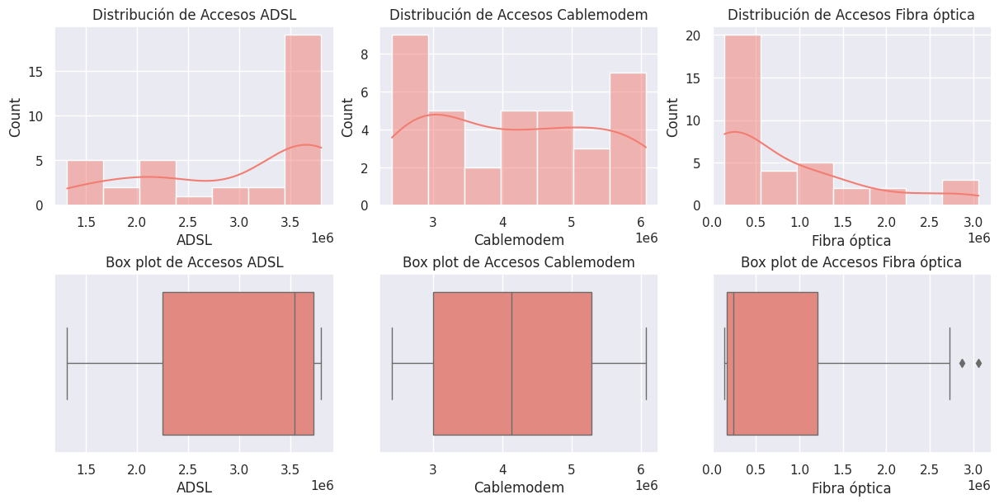

In [26]:
# Observando la distribución de los datos
fig, axes = plt.subplots(2, 3, figsize=(12, 6), constrained_layout = True)

# Histograma y boxplot de la columna 'ADSL'
sns.histplot(data = acceso_internet_tecnologia, x = 'ADSL', kde = True, color = '#F27D72', ax = axes[0,0])
ax = axes[0,0].set_title('Distribución de Accesos ADSL')
sns.boxplot(data = acceso_internet_tecnologia, x='ADSL', linewidth = 1, color = '#F27D72', ax = axes[1,0])
axes[1,0].set_title('Box plot de Accesos ADSL')
# Histograma y boxplot de la columna 'Cablemodem'
sns.histplot(data = acceso_internet_tecnologia, x='Cablemodem', kde = True, color = '#F27D72', ax = axes[0,1])
axes[0,1].set_title('Distribución de Accesos Cablemodem')
sns.boxplot(data = acceso_internet_tecnologia, x='Cablemodem', linewidth = 1, color = '#F27D72', ax = axes[1,1])
axes[1,1].set_title('Box plot de Accesos Cablemodem')
# Histograma y boxplot de la columna 'Fibra óptica'
sns.histplot(data = acceso_internet_tecnologia, x = 'Fibra óptica', kde = True, color = '#F27D72',
             ax = axes[0,2])
axes[0,2].set_title('Distribución de Accesos Fibra óptica')
sns.boxplot(data = acceso_internet_tecnologia, x='Fibra óptica', linewidth = 1, color = '#F27D72', ax = axes[1,2])
axes[1,2].set_title('Box plot de Accesos Fibra óptica')

# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- La distribución de los datos para las tecnologías ADSL y Fibra Óptica están sesgadas. Por un lado, para la tecnología ADSL hay un sesgo hacia la izquierda  lo que sugiere que hay años en lo que hubo menor acceso a ella. Mientras que para el caso de la Fibra Óptica el sesgo ocurre hacia la derecha lo que indica que el acceso a esta tecnología ha ido en aumento.

- Por otro lado, la distribución para el caso de la tecnología Cablemodem está parcialmente normal con ciertos picos y valles lo que sugiere que no hay una brecha tan grande entre los accesos para los distintos años.

#### ```Wireless```, ```Otros```, ```Total```

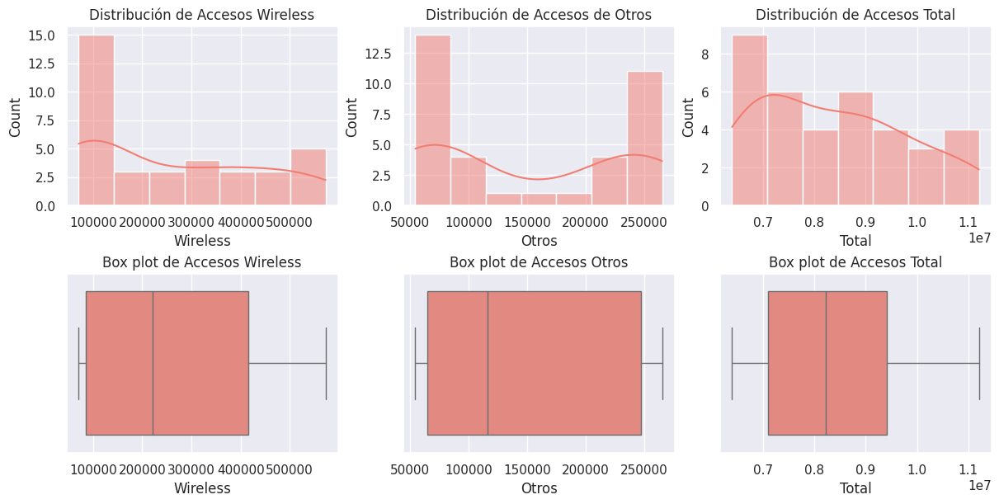

In [27]:
# Observando la distribución de los datos
fig, axes = plt.subplots(2, 3, figsize=(12, 6), constrained_layout = True)

# Histograma y boxplot de la columna 'Wireless'
sns.histplot(data = acceso_internet_tecnologia, x = 'Wireless', kde = True, color = '#F27D72', ax = axes[0,0])
ax = axes[0,0].set_title('Distribución de Accesos Wireless')
sns.boxplot(data = acceso_internet_tecnologia, x='Wireless', linewidth = 1, color = '#F27D72', ax = axes[1,0])
axes[1,0].set_title('Box plot de Accesos Wireless')
# Histograma y boxplot de la columna 'Otros'
sns.histplot(data = acceso_internet_tecnologia, x='Otros', kde = True, color = '#F27D72', ax = axes[0,1])
axes[0,1].set_title('Distribución de Accesos de Otros')
sns.boxplot(data = acceso_internet_tecnologia, x='Otros', linewidth = 1, color = '#F27D72', ax = axes[1,1])
axes[1,1].set_title('Box plot de Accesos Otros')
# Histograma y boxplot de la columna 'Total'
sns.histplot(data = acceso_internet_tecnologia, x = 'Total', kde = True, color = '#F27D72', ax = axes[0,2])
axes[0,2].set_title('Distribución de Accesos Total')
sns.boxplot(data = acceso_internet_tecnologia, x='Total', linewidth = 1, color = '#F27D72', ax = axes[1,2])
axes[1,2].set_title('Box plot de Accesos Total')

# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- La distribución de los datos para la tecnología Wireless muestra una distribución casi uniforme, con una mayor cantidad de datos concentrados en el rango de menor cantidad de accesos. Esto sugiere que el acceso a esta tecnología se ha mantenido estable a lo largo de los años.

- En el caso del uso de otras tecnologías (variable "Otros"), se observa una distribución bimodal leve, lo que indica que los accesos de 50,000 y 250,000 son los más comunes a lo largo de los años. No obstante, se observa que su uso es menor que el de las otras tecnologías especificadas en este conjunto de datos.

- La distribución correspondiente a la totalidad de accesos a internet, independientemente de las tecnologías utilizadas, muestra una distribución levemente sesgada hacia la derecha, lo que indica que la conexión a internet en Argentina ha aumentado con el tiempo.

#### ```Trimestre```

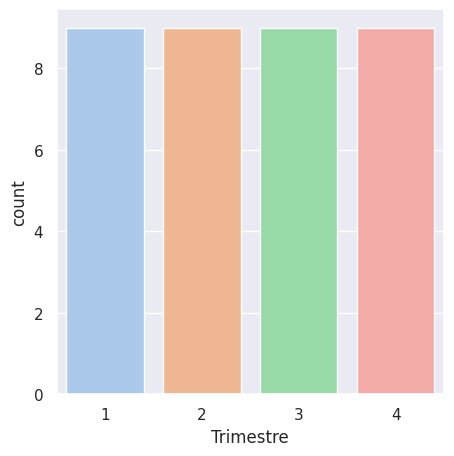

In [28]:
# Gráfico de barras de los trimestres
plt.figure(figsize = (5,5))
sns.countplot(data = acceso_internet_tecnologia, x = 'Trimestre')
# Mostrar la figura
plt.show()

**Apreciación:**

- El número de registros está distribuido de manera equitativa entre los cuatro trimestres, para cada año.

### Análisis Bivariable

#### ```Año``` vs Tecnologías

In [29]:
# Calcular la suma total de accesos a cada tipo de tecnología
sumas_por_tecnologia = acceso_internet_tecnologia[['ADSL', 'Cablemodem', 'Fibra óptica', 'Wireless', 'Otros']].sum()

# Obtener el nombre de la columna con la suma total más alta
tecnologia_mas_utilizada = sumas_por_tecnologia.idxmax()

# Imprimir el resultado
print("La tecnología más utilizada es:", tecnologia_mas_utilizada)

La tecnología más utilizada es: Cablemodem


In [30]:
# Agrupar los datos por año y sumar los accesos a cada tipo de tecnología
acceso_internet_tecnologia.groupby(['Año'])[['ADSL', 'Cablemodem', 'Fibra óptica', 'Wireless', 'Otros', 'Total']].sum()

,ADSL,Cablemodem,Fibra óptica,Wireless,Otros,Total
Año,,,,,,
2014,14884750,9975087,604862,305234,286700,26056633
2015,15115694,11162971,620877,331431,242846,27473819
2016,15073814,12177088,680127,337396,227633,28496058
2017,14639302,14148063,766312,432844,344162,30330683
2018,13981984,16571272,1079124,870047,465760,32968187
2019,11447626,18754974,3191409,1262831,909341,35566181
2020,9072828,20539964,4636620,1563813,958018,36771243
2021,7802044,22877010,6473506,1927038,1006793,40086391
2022,5712223,24122067,10874934,2232136,940575,43881935


**Apreciones:**

- La cantidad total de accesos a Internet ha aumentado constantemente a lo largo de los años, pasando de 26.05 millones en 2014 a 43.8 millones en 2022.

- La tecnología ADSL ha disminuido constantemente desde 2014, mientras que las tecnologías de acceso a Internet de alta velocidad, como la fibra óptica y el cablemódem, han aumentado constantemente. En particular, la fibra óptica ha experimentado un crecimiento significativo, pasando de 604 mil accesos en 2014 a 10.87 millones en 2022.

- A partir de 2018, la tecnología de cablemódem superó a la tecnología ADSL en términos de cantidad de accesos, y en 2022 la fibra óptica superó al ADSL en cantidad de accesos.

- La tecnología inalámbrica (Wireless) ha mantenido un nivel constante de accesos a lo largo de los años, lo que sugiere que su uso se ha mantenido estable.

- La variable "Otros" ha experimentado variaciones significativas a lo largo de los años, aunque su uso ha sido menor que el de las otras tecnologías especificadas.

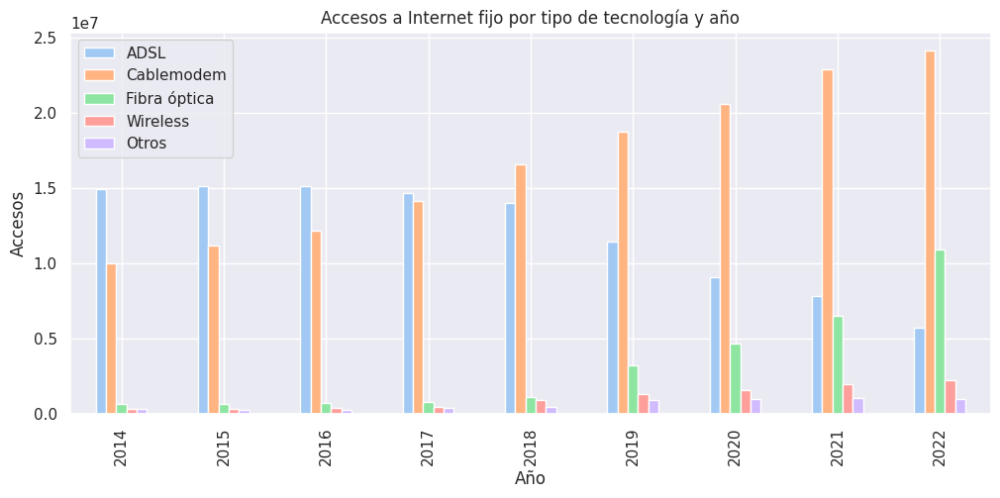

In [31]:
# Agrupar los datos por año y sumar los accesos a cada tipo de tecnología
datos_agrupados_por_año = acceso_internet_tecnologia.groupby('Año')[['ADSL', 'Cablemodem', 'Fibra óptica', 'Wireless', 'Otros']].sum()

# Crear el gráfico de barras con las columnas una al lado de la otra
sns.set_palette('pastel')
ax = datos_agrupados_por_año.plot(kind='bar', figsize=(12, 5))

# Agregar el título y los nombres de los ejes
ax.set_title('Accesos a Internet fijo por tipo de tecnología y año')
ax.set_xlabel('Año')
ax.set_ylabel('Accesos')

# Mostrar el gráfico
plt.show()

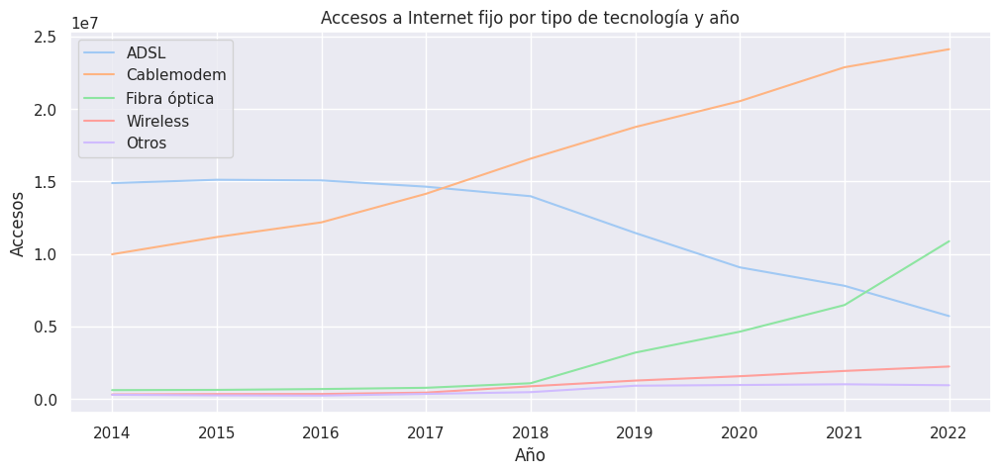

In [32]:
# Agrupar los datos por año y sumar los accesos a cada tipo de tecnología
datos_agrupados_por_año = acceso_internet_tecnologia.groupby('Año')[['ADSL', 'Cablemodem', 'Fibra óptica', 'Wireless', 'Otros']].sum()

# Crear el gráfico de líneas
sns.set_palette('pastel')
ax = datos_agrupados_por_año.plot(kind='line', figsize=(12, 5))

# Agregar el título y los nombres de los ejes
ax.set_title('Accesos a Internet fijo por tipo de tecnología y año')
ax.set_xlabel('Año')
ax.set_ylabel('Accesos')

# Mostrar el gráfico
plt.show()

**Apreciación:**

- Esta visualización permite esclarecer todos los datos y conclusiones recientemente obtenidas. En general, se puede observar claramente que la fibra óptica y el cablemodem son las tecnologías que más han crecido en los últimos años, mientras que el ADSL ha disminuido en términos de cantidad de accesos. Donde de los años 2014 al 2017 el ADSL fue la tecnología más utlizada hasta que a partir del año 2018 fue superada por el cablemodem, y la fibra óptica respectivamente para el año 2022.

In [33]:
# Filtrar los datos para obtener solo los del año 2021 y 2022 respectivamente
df_2021_2022 = acceso_internet_tecnologia[acceso_internet_tecnologia["Año"].isin([2021, 2022])]

# Agrupar los datos por año y tecnología y sumar los valores
grupo_tecno_año = df_2021_2022.groupby(['Año'])[['Fibra óptica', 'Cablemodem', 'ADSL', 'Wireless', 'Otros']].sum()

# Calcular el total de accesos a Internet fijo en Argentina en 2021 y 2022
total_accesos_2021 = grupo_tecno_año.loc[2021].sum()
total_accesos_2022 = grupo_tecno_año.loc[2022].sum()

# Calcular el porcentaje de accesos por cada tecnología en 2021 y en 2022
porcentaje_tecno_2021 = grupo_tecno_año.loc[2021] / total_accesos_2021 * 100
porcentaje_tecno_2022 = grupo_tecno_año.loc[2022] / total_accesos_2022 * 100

# Imprimir los resultados
print("Año 2021")
for tecno in porcentaje_tecno_2021.index:
    print("Porcentaje de accesos por {} en 2021: {:.2f}%".format(tecno, porcentaje_tecno_2021.loc[tecno]))
print("\nAño 2022")
for tecno in porcentaje_tecno_2022.index:
    print("Porcentaje de accesos por {} en 2022: {:.2f}%".format(tecno, porcentaje_tecno_2022.loc[tecno]))

Año 2021
Porcentaje de accesos por Fibra óptica en 2021: 16.15%
Porcentaje de accesos por Cablemodem en 2021: 57.07%
Porcentaje de accesos por ADSL en 2021: 19.46%
Porcentaje de accesos por Wireless en 2021: 4.81%
Porcentaje de accesos por Otros en 2021: 2.51%

Año 2022
Porcentaje de accesos por Fibra óptica en 2022: 24.78%
Porcentaje de accesos por Cablemodem en 2022: 54.97%
Porcentaje de accesos por ADSL en 2022: 13.02%
Porcentaje de accesos por Wireless en 2022: 5.09%
Porcentaje de accesos por Otros en 2022: 2.14%


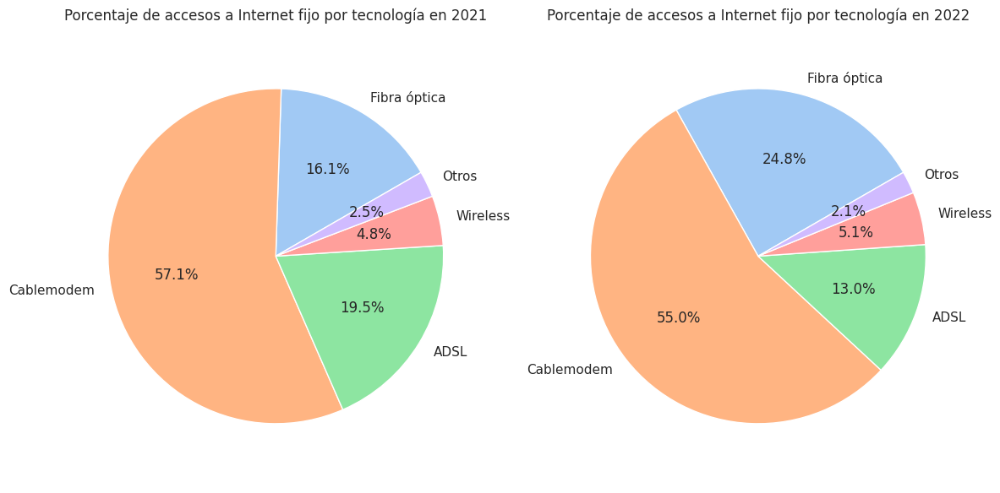

In [34]:
# Crear una figura y ejes para los gráficos
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

# Gráfico de torta para el año 2021
ax1 = axes[0]
porcentaje_tecno_2021.plot(kind='pie', ax=ax1, autopct='%1.1f%%', startangle=30)
ax1.set_title('Porcentaje de accesos a Internet fijo por tecnología en 2021')
ax1.set_ylabel('')

# Gráfico de torta para el año 2022
ax2 = axes[1]
porcentaje_tecno_2022.plot(kind='pie', ax=ax2, autopct='%1.1f%%', startangle=30)
ax2.set_title('Porcentaje de accesos a Internet fijo por tecnología en 2022')
ax2.set_ylabel('')

# Eliminar etiquetas de ejes y leyendas
ax1.legend().remove()
ax2.legend().remove()
ax1.axis('equal')
ax2.axis('equal')

# Ajustar el espaciado entre subplots
plt.tight_layout()

# Mostrar los gráficos
plt.show()

**Apreciación:**

- Los datos muestran que la fibra óptica y el cablemodem representan más del 75% del total de accesos a Internet fijo en Argentina para el año 2022. Además, se observa un aumento significativo en el uso de la fibra óptica, que pasó del 16.15% en 2021 al 23.92% en 2022.

- Estos hallazgos sugieren que en Argentina hay una tendencia hacia el uso de tecnologías de acceso a Internet fijo de alta velocidad, como la fibra óptica y el cablemodem, mientras que el ADSL y el wireless están disminuyendo en términos de cantidad de accesos. La fibra óptica ha experimentado un importante crecimiento en los últimos años, lo que sugiere una transición hacia tecnologías de acceso a Internet de mayor capacidad y velocidad. Se espera que esta tendencia continúe debido a los beneficios que ofrece la fibra óptica en términos de velocidad, capacidad y estabilidad de conexión en comparación con otras tecnologías

#### ```Fecha``` vs ```ADSL```

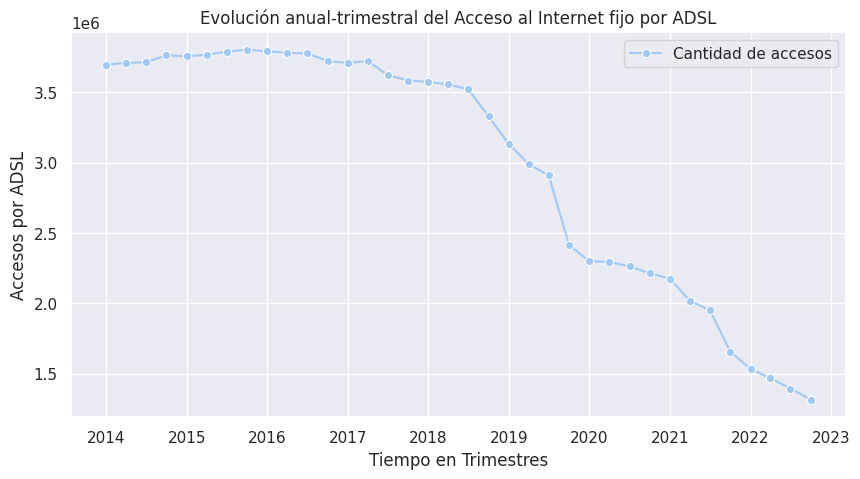

In [35]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(10, 5))

# Graficar la evolución del Acceso al Internet fijo por ADSL
sns.lineplot(x = 'Fecha', y = 'ADSL', data = acceso_internet_tecnologia, label = 'Cantidad de accesos', marker = 'o')
# Agregar etiquetas de eje y título del gráfico
plt.xlabel("Tiempo en Trimestres")
plt.ylabel("Accesos por ADSL")
plt.title("Evolución anual-trimestral del Acceso al Internet fijo por ADSL")
# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- Desde el tercer trimestre de 2018, se ha observado una disminución en la cantidad de accesos a la tecnología ADSL, que se ha acentuado de manera abrupta desde 2019 hasta 2020. Aunque no se puede afirmar con certeza las razones detrás de esta disminución, es posible que una de las causas sea la pandemia de COVID-19, que aceleró la transición hacia el trabajo y el aprendizaje remoto, aumentando la demanda de conexiones de Internet de alta velocidad. Como resultado, los usuarios buscaron opciones de acceso a Internet más rápidas y estables, como la fibra óptica y el cablemódem.

- Además, otra razón por la que el ADSL se está volviendo cada vez más obsoleto es el aumento en la accesibilidad y la reducción de costos de las tecnologías de acceso a Internet de alta velocidad, como la fibra óptica. En muchos países, incluyendo Argentina, los proveedores de servicios de Internet están invirtiendo en la construcción de redes de fibra óptica para ofrecer velocidades de conexión más rápidas y estables a sus clientes, lo que hace que el ADSL sea menos atractivo para los usuarios.

#### ```Fecha``` vs ```Cablemodem```

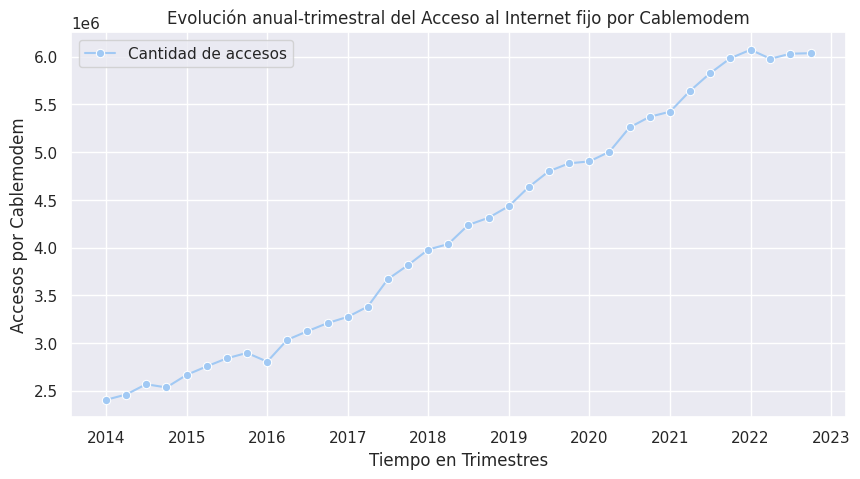

In [36]:
# Cambiar el tamaño del gráfico
plt.figure(figsize = (10, 5))

# Graficar la evolución del Acceso al Internet fijo por Cablemodem
sns.lineplot(x = 'Fecha', y = 'Cablemodem', data = acceso_internet_tecnologia, label='Cantidad de accesos', marker='o')
# Agregar etiquetas de eje y título del gráfico
plt.xlabel("Tiempo en Trimestres")
plt.ylabel("Accesos por Cablemodem")
plt.title("Evolución anual-trimestral del Acceso al Internet fijo por Cablemodem")
# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- Los datos muestran que el cablemodem se volvió la tecnología de acceso a Internet fijo más utilizada en Argentina a partir del año 2018.

El cablemodem utiliza la infraestructura de las compañías de cable para proporcionar acceso a Internet de alta velocidad a los usuarios. En comparación con el ADSL, el cablemodem ofrece una velocidad de conexión más alta y más estable, lo que lo hace más atractivo para los usuarios que necesitan acceso a Internet de alta velocidad.

#### ```Fecha``` vs ```Fibra óptica```

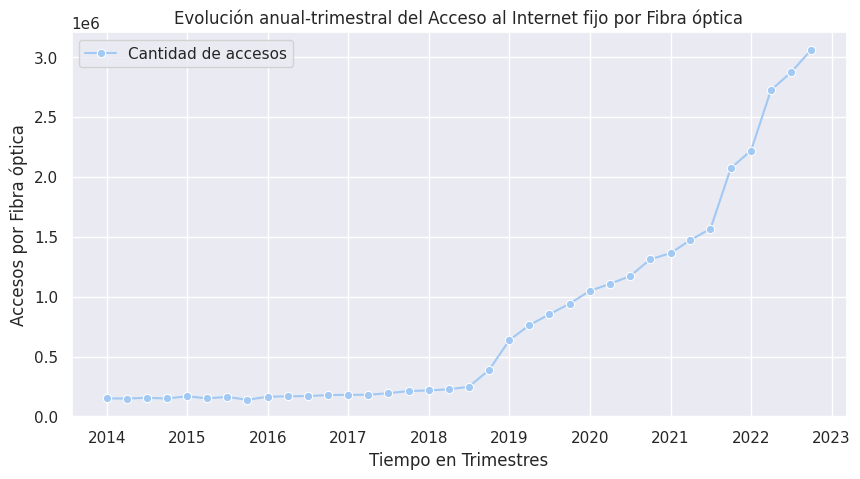

In [37]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(10, 5))

# Graficar la evolución del Acceso al Internet fijo por Fibra óptica
sns.lineplot(x='Fecha', y='Fibra óptica', data = acceso_internet_tecnologia, label='Cantidad de accesos', marker='o')
# Agregar etiquetas de eje y título del gráfico
plt.xlabel("Tiempo en Trimestres")
plt.ylabel("Accesos por Fibra óptica")
plt.title("Evolución anual-trimestral del Acceso al Internet fijo por Fibra óptica")
# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- El gráfico permite apreciar que durante los años 2014 a 2018, la fibra óptica tuvo un acceso limitado en Argentina, posiblemente debido a su alta inversión en infraestructura por parte de los proveedores de servicios de Internet, lo que resultaba en un costo elevado para los usuarios. Además, los usuarios no estaban tan familiarizados con la tecnología de fibra óptica y no veían una necesidad inmediata de cambiar su tecnología de acceso a Internet fijo.

- Sin embargo, a partir de 2019, hubo un aumento significativo en el acceso a la fibra óptica en Argentina, lo que puede deberse a varias razones. En primer lugar, los proveedores de servicios de Internet comenzaron a invertir más en la construcción de redes de fibra óptica debido a la creciente demanda de acceso a Internet de alta velocidad y estabilidad durante la pandemia de COVID-19. En segundo lugar, la fibra óptica se está volviendo más accesible y económica, lo que hace que sea una opción más atractiva para los usuarios. Y en tercer lugar, los usuarios están cada vez más familiarizados con la tecnología y reconocen sus beneficios en términos de velocidad y estabilidad de conexión.

#### ```Fecha``` vs ```Wireless```

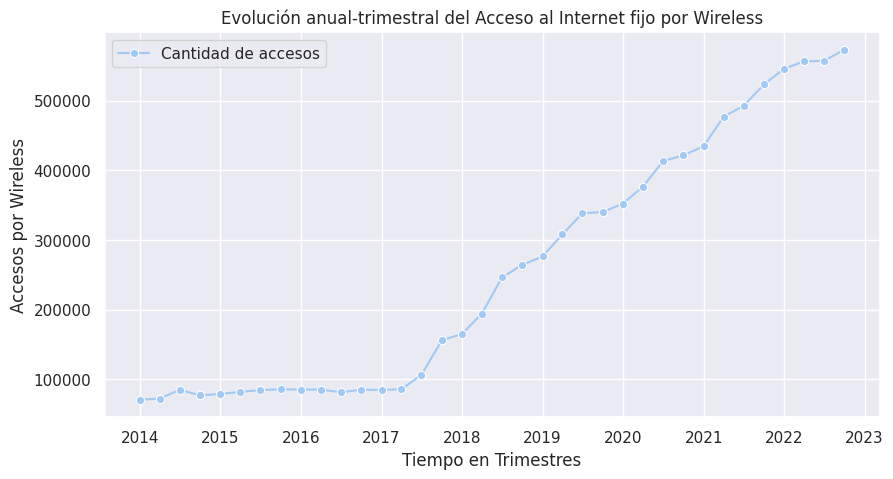

In [38]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(10, 5))

# Graficar la evolución del Acceso al Internet fijo por Wireless
sns.lineplot(x='Fecha', y='Wireless', data = acceso_internet_tecnologia, label='Cantidad de accesos', marker='o')
# Agregar etiquetas de eje y título del gráfico
plt.xlabel("Tiempo en Trimestres")
plt.ylabel("Accesos por Wireless")
plt.title("Evolución anual-trimestral del Acceso al Internet fijo por Wireless")
# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- Los datos muestran que la tecnología Wireless ha experimentado un aumento en popularidad en Argentina en los últimos años. Sin embargo, su porcentaje de accesos sigue siendo relativamente bajo en comparación con otras tecnologías de acceso a Internet fijo, como el cablemodem y la fibra óptica.

- Según la gráfica, se observa un aumento significativo en el acceso a esta tecnología a partir del cuarto trimestre del año 2017. La razón detrás de este aumento es difícil de determinar sin más información sobre el contexto y las condiciones en ese momento. Sin embargo, es posible que haya habido una mayor disponibilidad y accesibilidad de tecnologías inalámbricas en ese momento, o que los proveedores de servicios de Internet hayan ofrecido opciones de acceso a Internet inalámbrico más atractivas para los usuarios.

- Es importante destacar que la tecnología Wireless es una opción popular para aquellos que prefieren la flexibilidad y la movilidad de una conexión inalámbrica. Si bien su uso sigue siendo bajo en comparación con otras tecnologías de acceso a Internet fijo

#### ```Fecha``` vs ```Otros```

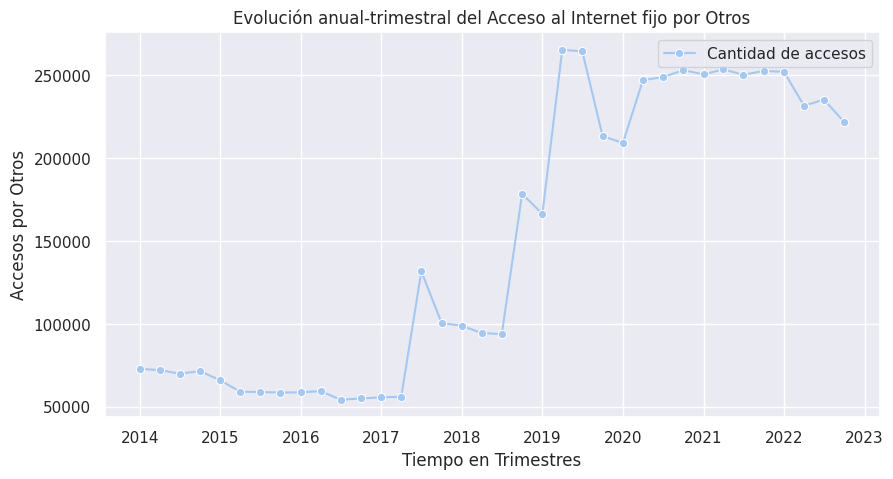

In [39]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(10, 5))

# Graficar la evolución del Acceso al Internet fijo por Otros
sns.lineplot(x = 'Fecha', y = 'Otros', data = acceso_internet_tecnologia, label = 'Cantidad de accesos', marker = 'o')
# Agregar etiquetas de eje y título del gráfico
plt.xlabel("Tiempo en Trimestres")
plt.ylabel("Accesos por Otros")
plt.title("Evolución anual-trimestral del Acceso al Internet fijo por Otros")
# Mostrar gráfico completo
plt.show()

**Apreciación:**

- La categoría "otros" en los datos proporcionados por ENACOM no está claramente definida, lo que dificulta su interpretación precisa. No se especifica qué tipos de tecnologías de acceso a Internet se incluyen en esta categoría. Es importante tener en cuenta que esta categoría podría incluir una variedad de tecnologías de acceso a Internet, tanto de banda ancha como de banda angosta, lo que podría afectar la precisión de las tendencias observadas en los datos.

Sin embargo, es importante tener en cuenta que esta categoría en el transcurso de los años sólo ha representado sólo una pequeña proporción de los accesos a Internet fijo totales.

## Acceso a Internet fijo por tecnología y provincia
Número de accesos al servicio de Internet fijo por tipo de tecnología en cada provincia (trimestral)

In [40]:
# Definir la URL de la API y tu API key
url = "http://api.datosabiertos.enacom.gob.ar/api/v2/datastreams/ACCES-A-INTER-FIJO-POR/data.csv"
api_key = "5EBQMGTfMImArsNkwhQIuatPXtYfRNlAuSTuybbB"

# Realizar la solicitud a la API
response = requests.get(url, params = {"auth_key": api_key})

# Verificar si la solicitud fue exitosa
if response.status_code == 200:
  # Leer el contenido del archivo CSV en memoria como una cadena de texto
  csv_data = response.content.decode("utf-8")

  # Crear un objeto DataFrame a partir de la cadena de texto
  acceso_tecnologia_provincia = pd.read_csv(io.StringIO(csv_data))

else:
  # Mostrar un mensaje de error si la solicitud falló
  print("Error al hacer la solicitud a la API")

In [41]:
# Imprimir las primeras 5 filas de "acceso_tecnologia_provincia"
acceso_tecnologia_provincia.head()

,Año,Trimestre,Provincia,ADSL,Cablemodem,Fibra óptica,Wireless,Otros,Total
0,2022,4,Buenos Aires,325.908,2.767.247,1.499.149,129.910,72.451,4.794.665
1,2022,4,Capital Federal,138.753,1.238.196,138.548,4.603,31.826,1.551.926
2,2022,4,Catamarca,8.952,10.998,47.337,1.379,2.243,70.909
3,2022,4,Chaco,24.582,61.265,47.285,7.957,2.574,143.663
4,2022,4,Chubut,45.450,73.923,9.815,30.721,8.850,168.759


In [42]:
# Mostrar información del número de columnas, filas, tipos de datos y valores faltantes en "acceso_tecnologia_provincia"
acceso_tecnologia_provincia.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 865 entries, 0 to 864
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Año           865 non-null    object 
 1   Trimestre     865 non-null    object 
 2   Provincia     864 non-null    object 
 3   ADSL          864 non-null    object 
 4   Cablemodem    864 non-null    object 
 5   Fibra óptica  864 non-null    object 
 6   Wireless      864 non-null    float64
 7   Otros         864 non-null    float64
 8   Total         864 non-null    object 
dtypes: float64(2), object(7)
memory usage: 60.9+ KB


Hay variables que no parecen estar en el formato correcto y hay valores nulos.

In [43]:
# Cantidad de valores faltantes por columna en "acceso_tecnologia_provincia"
missing_values_count = acceso_tecnologia_provincia.isnull().sum()
columns = acceso_tecnologia_provincia.shape[1]
missing_values_count[0:columns]

Año             0
Trimestre       0
Provincia       1
ADSL            1
Cablemodem      1
Fibra óptica    1
Wireless        1
Otros           1
Total           1
dtype: int64

### Buscando inconsistencias en los datos

In [44]:
# Valores únicos en la columna "Año"
acceso_tecnologia_provincia['Año'].unique()

array(['2022', '2021', '2020', '2019', '2019 *', '2018', '2017', '2016',
       '2015', '2014', '*'], dtype=object)

In [45]:
# Valores únicos en la columna "Trimestre"
acceso_tecnologia_provincia['Trimestre'].unique()

array(['4', '3', '2', '1', '3 *', '2 *', '1 *',
       'Los datos provinciales no coinciden a nivel nacional, ya que se rincorporó información que no contien apertuta a nivel geográfico.'],
      dtype=object)

In [46]:
# Valores únicos en la columna "Provincia"
acceso_tecnologia_provincia['Provincia'].unique()

array(['Buenos Aires', 'Capital Federal', 'Catamarca', 'Chaco', 'Chubut',
       'Córdoba', 'Corrientes', 'Entre Ríos', 'Formosa', 'Jujuy',
       'La Pampa', 'La Rioja', 'Mendoza', 'Misiones', 'Neuquén',
       'Río Negro', 'Salta', 'San Juan', 'San Luis', 'Santa Cruz',
       'Santa Fe', 'Santiago Del Estero', 'Tierra Del Fuego', 'Tucumán',
       nan], dtype=object)

In [47]:
# Mostrar las filas que tienen valores faltantes para identificar a que año-trimestre corresponden
filas_con_faltantes = acceso_tecnologia_provincia.isna().sum(axis=1) > 0
acceso_tecnologia_provincia[filas_con_faltantes]

,Año,Trimestre,Provincia,ADSL,Cablemodem,Fibra óptica,Wireless,Otros,Total
864,*,Los datos provinciales no coinciden a nivel na...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Transformaciones a los datos

In [48]:
# Modificar algunos nombres de las provincias para mantener la uniformidad con los demás Dataframes
acceso_tecnologia_provincia['Provincia'] = acceso_tecnologia_provincia['Provincia'].str.replace('Santiago Del', 'Santiago del')
acceso_tecnologia_provincia['Provincia'] = acceso_tecnologia_provincia['Provincia'].str.replace('Tierra Del', 'Tierra del')
# Verificar que los cambios se aplicaron correctamente
acceso_tecnologia_provincia['Provincia'].unique()

array(['Buenos Aires', 'Capital Federal', 'Catamarca', 'Chaco', 'Chubut',
       'Córdoba', 'Corrientes', 'Entre Ríos', 'Formosa', 'Jujuy',
       'La Pampa', 'La Rioja', 'Mendoza', 'Misiones', 'Neuquén',
       'Río Negro', 'Salta', 'San Juan', 'San Luis', 'Santa Cruz',
       'Santa Fe', 'Santiago del Estero', 'Tierra del Fuego', 'Tucumán',
       nan], dtype=object)

In [49]:
# Eliminar la fila que presenta el registro por columnas como nulo
acceso_tecnologia_provincia.drop(864, inplace = True)

In [50]:
# Convertir la columna "Año" a numérica
acceso_tecnologia_provincia['Año'] = acceso_tecnologia_provincia['Año'].replace('[^0-9]', '', regex=True).astype(int)
# Convertir la columna "Trimestre" a numérica
acceso_tecnologia_provincia['Trimestre'] = acceso_tecnologia_provincia['Trimestre'].replace('[^0-9]', '',
                                                                                            regex=True).astype(int)
# Convertir la columna "ADSL" a numérica
acceso_tecnologia_provincia['ADSL'] = acceso_tecnologia_provincia['ADSL'].replace('[^0-9]', '', regex=True).astype(int)
# Convertir la columna "Cablemodem" a numérica
acceso_tecnologia_provincia['Cablemodem'] = acceso_tecnologia_provincia['Cablemodem'].replace('[^0-9]', '',
                                                                                              regex=True).astype(int)
# Convertir la columna "Fibra óptica" a numérica
acceso_tecnologia_provincia['Fibra óptica'] = acceso_tecnologia_provincia['Fibra óptica'].replace('[^0-9]', '',
                                                                                                  regex=True).astype(int)
# Convertir la columna "Total" a numérica
acceso_tecnologia_provincia['Total'] = acceso_tecnologia_provincia['Total'].replace('[^0-9]', '', regex=True).astype(int)

In [51]:
# Convertir la columna "Wireless" a tipo de dato int
acceso_tecnologia_provincia['Wireless'] = (acceso_tecnologia_provincia['Wireless'] * 1000).astype(int)
# Convertir la columna "Otros" a tipo de dato int
acceso_tecnologia_provincia['Otros'] = (acceso_tecnologia_provincia['Otros'] * 1000).astype(int)

In [52]:
# Veificar que los cambios se aplicaron correctamente
acceso_tecnologia_provincia.head(1)

,Año,Trimestre,Provincia,ADSL,Cablemodem,Fibra óptica,Wireless,Otros,Total
0,2022,4,Buenos Aires,325908,2767247,1499149,129910,72451,4794665


In [53]:
# Se crea una columna 'Fecha' combinando 'Año' y 'Trimestre' en un objeto de fecha
acceso_tecnologia_provincia['Fecha'] = pd.to_datetime(acceso_tecnologia_provincia['Año'].astype(str) + 'Q' + acceso_tecnologia_provincia['Trimestre'].astype(str))

### Resumen Estadístico

In [54]:
# Mostrar un resumen estadístico de las columnas numériocas de "acceso_tecnologia_provincia"
acceso_tecnologia_provincia.describe()

,Año,Trimestre,ADSL,Cablemodem,Fibra óptica,Wireless,Otros,Total
count,864.000000,864.000000,8.640000e+02,8.640000e+02,8.640000e+02,864.000000,864.000000,8.640000e+02
mean,2018.000000,2.500000,1.255457e+05,1.739913e+05,3.262331e+04,57789.415509,102736.525463,3.491101e+05
std,2.583484,1.118682,2.520514e+05,4.276313e+05,1.325430e+05,156009.493896,207407.949293,7.494854e+05
min,2014.000000,1.000000,6.120000e+03,0.000000e+00,0.000000e+00,0.000000,1006.000000,1.255700e+04
25%,2016.000000,1.750000,2.232025e+04,8.912500e+03,2.052500e+02,3582.750000,2934.000000,5.232900e+04
50%,2018.000000,2.500000,4.816100e+04,3.498400e+04,1.233000e+03,9902.000000,15146.000000,1.045965e+05
75%,2020.000000,3.250000,1.025470e+05,7.168325e+04,1.564250e+04,26098.000000,47000.000000,1.801745e+05
max,2022.000000,4.000000,1.586343e+06,2.767247e+06,1.499149e+06,952000.000000,987000.000000,4.794665e+06


**Apreciaciones:**

- Podemos observar que el número de conexiones varía ampliamente según el tipo de tecnología, siendo Cablemodem la tecnología con el mayor número medio de conexiones con 173 mil y Wireless la que tiene el menor número medio de conexiones con 57 mil. Además, la desviación estándar es bastante alta para todas las tecnologías, lo que sugiere que hay una gran variabilidad en el número de conexiones entre los diferentes trimestres y años.

- También podemos observar que la media del número de conexiones de todas las tecnologías ha aumentado a lo largo de los años, aunque la tasa de crecimiento varía según la tecnología. Por ejemplo, la media de conexiones de Fibra óptica ha tenido el mayor crecimiento promedio anual (34,1%) entre 2014 y 2022, mientras que la media de conexiones de Cablemodem ha tenido el menor crecimiento promedio anual (5,4%) durante el mismo período.

### Análisis Univariable

A continuación, se realizarán algunas visualizaciones para explorar el conjunto de datos con más detalle. Primero, se observará la distribución de la cantidad de accesos para cada una de las tecnologías:

#### ```ADSL```, ```Cablemodem```, ```Fibra óptica```

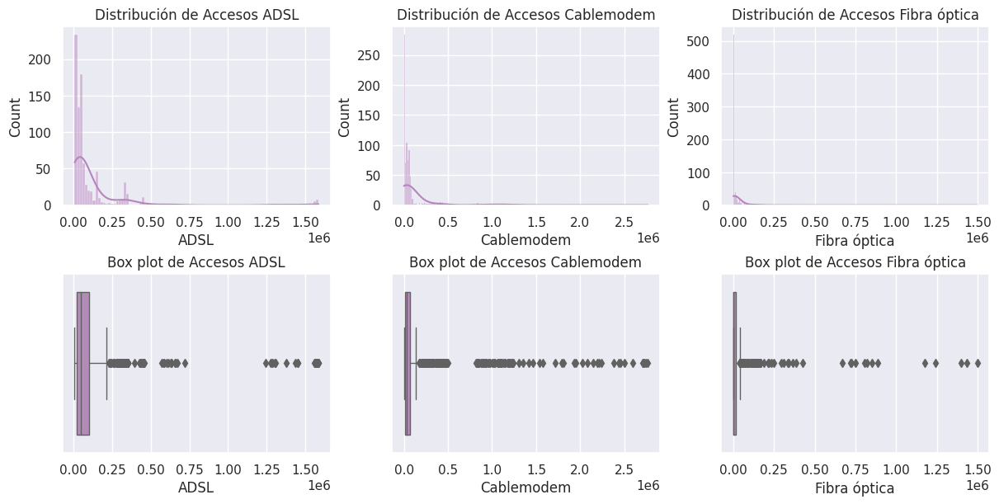

In [55]:
# Observando la distribución de los datos
fig, axes = plt.subplots(2, 3, figsize=(12, 6), constrained_layout = True)

# Histograma y boxplot de la columna 'ADSL'
sns.histplot(data = acceso_tecnologia_provincia, x = 'ADSL', kde = True, color = '#B884BF', ax = axes[0,0])
ax = axes[0,0].set_title('Distribución de Accesos ADSL')
sns.boxplot(data = acceso_tecnologia_provincia, x='ADSL', linewidth = 1, color = '#B884BF', ax = axes[1,0])
axes[1,0].set_title('Box plot de Accesos ADSL')
# Histograma y boxplot de la columna 'Cablemodem'
sns.histplot(data = acceso_tecnologia_provincia, x='Cablemodem', kde = True, color = '#B884BF', ax = axes[0,1])
axes[0,1].set_title('Distribución de Accesos Cablemodem')
sns.boxplot(data = acceso_tecnologia_provincia, x='Cablemodem', linewidth = 1, color = '#B884BF', ax = axes[1,1])
axes[1,1].set_title('Box plot de Accesos Cablemodem')
# Histograma y boxplot de la columna 'Fibra óptica'
sns.histplot(data = acceso_tecnologia_provincia, x = 'Fibra óptica', kde = True, color = '#B884BF', ax = axes[0,2])
axes[0,2].set_title('Distribución de Accesos Fibra óptica')
sns.boxplot(data = acceso_tecnologia_provincia, x='Fibra óptica', linewidth = 1, color = '#B884BF', ax = axes[1,2])
axes[1,2].set_title('Box plot de Accesos Fibra óptica')

# Mostrar gráfico completo
plt.show()

#### ```Wireless```, ```Otros```, ```Total```

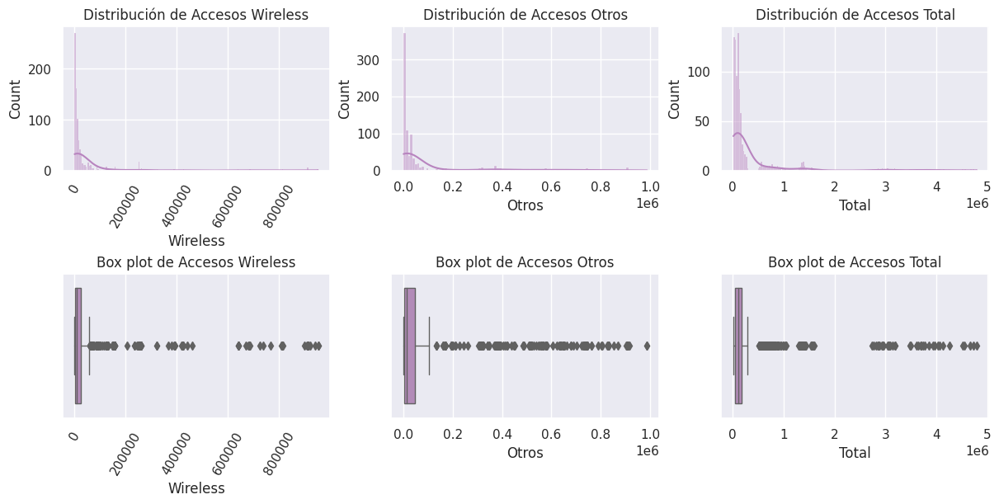

In [56]:
# Observando la distribución de los datos
fig, axes = plt.subplots(2, 3, figsize=(12, 6), constrained_layout = True)

# Histograma y boxplot de la columna 'Wireless'
sns.histplot(data = acceso_tecnologia_provincia, x = 'Wireless', kde = True, color = '#B884BF', ax = axes[0,0])
axes[0,0].set_title('Distribución de Accesos Wireless')
axes[0,0].tick_params(axis='x', rotation=60)
sns.boxplot(data = acceso_tecnologia_provincia, x='Wireless', linewidth = 1, color = '#B884BF', ax = axes[1,0])
axes[1,0].set_title('Box plot de Accesos Wireless')
axes[1,0].tick_params(axis='x', rotation=60)
# Histograma y boxplot de la columna 'Otros'
sns.histplot(data = acceso_tecnologia_provincia, x='Otros', kde = True, color = '#B884BF', ax = axes[0,1])
axes[0,1].set_title('Distribución de Accesos Otros')
sns.boxplot(data = acceso_tecnologia_provincia, x='Otros', linewidth = 1, color = '#B884BF', ax = axes[1,1])
axes[1,1].set_title('Box plot de Accesos Otros')
# Histograma y boxplot de la columna 'Total'
sns.histplot(data = acceso_tecnologia_provincia, x = 'Total', kde = True, color = '#B884BF', ax = axes[0,2])
axes[0,2].set_title('Distribución de Accesos Total')
sns.boxplot(data = acceso_tecnologia_provincia, x='Total', linewidth = 1, color = '#B884BF', ax = axes[1,2])
axes[1,2].set_title('Box plot de Accesos Total')

# Mostrar gráfico completo
plt.show()

**Apreciación general:**

- En comparación con el Dataframe anterior "Total nacional de accesos a Internet fijo por tipo de tecnología", se observa un fuerte sesgo hacia la derecha en todas las tecnologías. Este sesgo podría ser un indicativo de que la mayoría de las provincias presentan un bajo o medio nivel de acceso, mientras que pocas provincias presentan una mayor cantidad de acceso, lo que se confirma con la presencia de valores atípicos.

- Es importante tener en cuenta que este sesgo puede estar influenciado por factores como la densidad poblacional, el desarrollo económico y la disponibilidad de infraestructura de telecomunicaciones en cada provincia.

#### ```Trimestre```

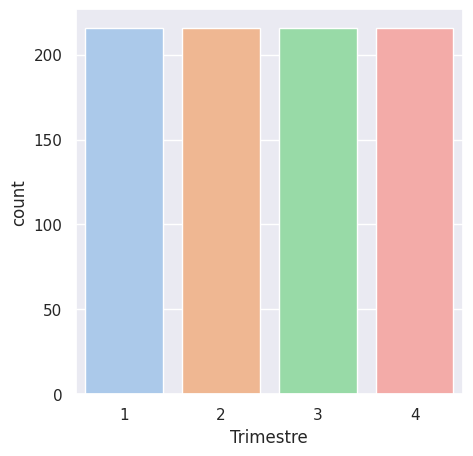

In [57]:
# Gráfico de barras de los trimestres
plt.figure(figsize = (5,5))
sns.countplot(data = acceso_tecnologia_provincia, x = 'Trimestre')
# Mostrar la figura
plt.show()

**Apreciación:**

- El número de registros está distribuido de manera equitativa entre los cuatro trimestres, para cada uno de los años.

### Análisis Bivariable

#### ```Año``` vs Tecnología

Se calcula el porcentaje de cambio entre cada año y el año anterior para cada una de las tecnologías

In [58]:
# Agrupar los datos por año y calcular la suma de los accesos a las tecnologías
accesos_por_año = acceso_tecnologia_provincia.groupby('Año')[['ADSL', 'Cablemodem',
                                                              'Fibra óptica', 'Wireless', 'Otros', 'Total']].sum()

# Calcular el porcentaje de cambio entre cada año y el año anterior para los accesos a las tecnologías
accesos_por_año['Cambio ADSL'] = accesos_por_año['ADSL'].pct_change() * 100
accesos_por_año['Cambio Cablemodem'] = accesos_por_año['Cablemodem'].pct_change() * 100
accesos_por_año['Cambio Fibra óptica'] = accesos_por_año['Fibra óptica'].pct_change() * 100
accesos_por_año['Cambio Cablemodem'] = accesos_por_año['Cablemodem'].pct_change() * 100
accesos_por_año['Cambio Wireless'] = accesos_por_año['Wireless'].pct_change() * 100
accesos_por_año['Cambio Otros'] = accesos_por_año['Otros'].pct_change() * 100
accesos_por_año['Cambio Total'] = accesos_por_año['Total'].pct_change() * 100

# Imprimir los resultados
accesos_por_año[['Cambio ADSL', 'Cambio Cablemodem', 'Cambio Fibra óptica',
                 'Cambio Wireless', 'Cambio Otros', 'Cambio Total']]

,Cambio ADSL,Cambio Cablemodem,Cambio Fibra óptica,Cambio Wireless,Cambio Otros,Cambio Total
Año,,,,,,
2014,NaN,NaN,NaN,NaN,NaN,NaN
2015,1.551548,11.908508,2.647711,-28.831876,-2.663346,5.438868
2016,-0.277063,9.084651,9.542953,7.331993,0.507978,3.720775
2017,-2.882562,16.185930,12.671898,22.513527,-43.292881,6.438171
2018,-4.490091,17.127497,40.820449,51.360892,-34.073304,8.695828
2019,-12.824546,13.177637,127.052405,31.726433,3.986976,7.880306
2020,-25.564577,9.517422,89.236125,-33.397145,128.350105,3.388224
2021,-14.006482,11.378043,39.616919,-61.948932,5.931496,9.015599
2022,-26.785558,5.442394,67.991410,4.158372,-19.377057,9.468410


**Apreciaciones:**

- Se observa que hay una gran variabilidad en los cambios porcentuales en el número de conexiones según la tecnología y el año. Por ejemplo, la tecnología de Fibra óptica ha experimentado un crecimiento muy significativo en 2019 (+127%) y un crecimiento moderado en 2022 (+68%). Por otro lado, la tecnología de Otros experimentó un crecimiento muy revelador en 2020 (+128%), pero una disminución significativa en 2022 (-19.3%).

- También se examina que la tecnología de ADSL presentó una disminución significativa en el número de conexiones en el año 2022 (-26.7%), mientras que
 Cablemodem y Wireless a pesar de que experimentaron un crecimiento para el mismo año (+5.4% y +4.15%, respectivamente) no fue tan significativo como el aumento de la Fibra Óptica, lo que sugiere que estas tecnologías podrían estar perdiendo popularidad en favor de tecnologías más avanzadas.

#### ```Fecha``` vs ```ADSL```

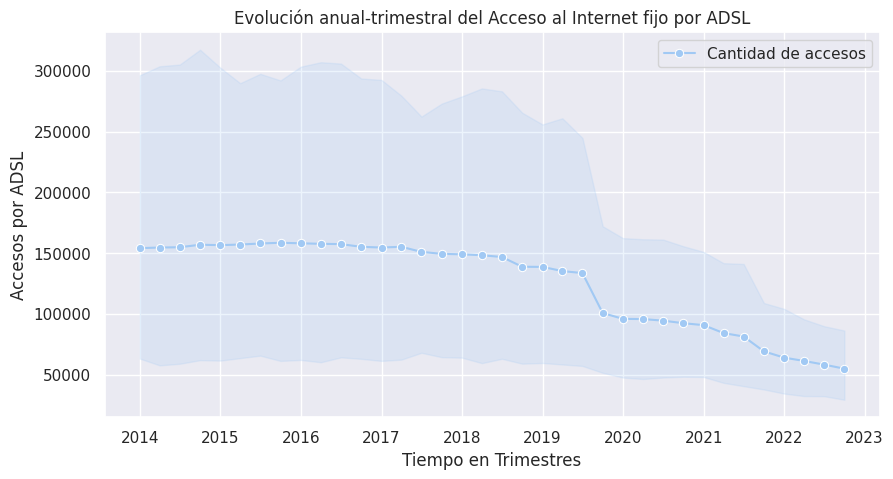

In [59]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(10, 5))

# Graficar la evolución del Acceso al Internet fijo por ADSL
sns.lineplot(x = 'Fecha', y = 'ADSL', data = acceso_tecnologia_provincia,
             label = 'Cantidad de accesos', marker = 'o')
# Agregar etiquetas de eje y título del gráfico
plt.xlabel("Tiempo en Trimestres")
plt.ylabel("Accesos por ADSL")
plt.title("Evolución anual-trimestral del Acceso al Internet fijo por ADSL")
# Mostrar gráfico completo
plt.show()

**Apreciación:**

- Es interesante ver como la cantidad de accesos a esta tecnología se ha mantenido relativamente constante con leves fluctuaciones del año 2014 al 2019 y como a partir del tercer trimestre de este año comienza la disminución en los accesos. Lo que es un indicativo de preferencias hacia otras tecnologías.

#### ```Fecha``` vs ```Cablemodem```

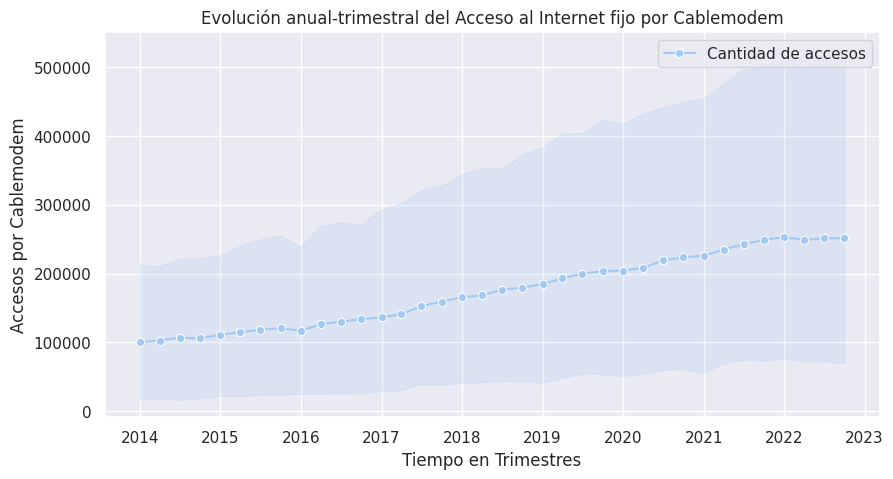

In [60]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(10, 5))

# Graficar la evolución del Acceso al Internet fijo por Cablemodem
sns.lineplot(x = 'Fecha', y = 'Cablemodem', data = acceso_tecnologia_provincia,
             label = 'Cantidad de accesos', marker = 'o')
# Agregar etiquetas de eje y título del gráfico
plt.xlabel("Tiempo en Trimestres")
plt.ylabel("Accesos por Cablemodem")
plt.title("Evolución anual-trimestral del Acceso al Internet fijo por Cablemodem")
# Mostrar gráfico completo
plt.show()

**Apreciación**

- Hay un claro crecimiento constante en la cantidad de accesos a esta tecnología, aunque se observa como la curva comienza aplanarse a partir del año 2022. Lo que podría ser un indicativo de preferencia hacia otro tipo de tecnología. Aún así es la tecnología con mayor cantidad de accesos superando los 200 mil accesos.

#### ```Fecha``` vs ```Fibra óptica```

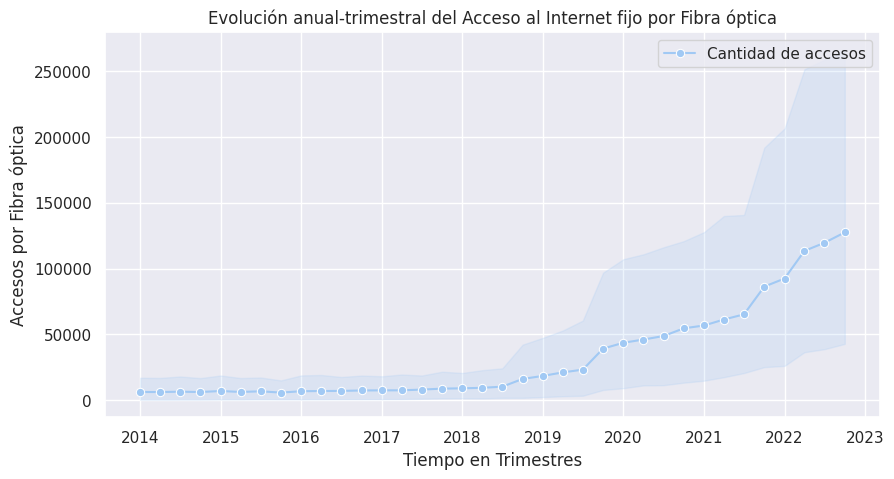

In [61]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(10, 5))

# Graficar la evolución del Acceso al Internet fijo por Fibra óptica
sns.lineplot(x = 'Fecha', y = 'Fibra óptica', data = acceso_tecnologia_provincia,
             label = 'Cantidad de accesos', marker = 'o')
# Agregar etiquetas de eje y título del gráfico
plt.xlabel("Tiempo en Trimestres")
plt.ylabel("Accesos por Fibra óptica")
plt.title("Evolución anual-trimestral del Acceso al Internet fijo por Fibra óptica")
# Mostrar gráfico completo
plt.show()

**Apreciación:**

- Esta tecnología presenta un crecimiento exponencial a raíz del año 2019, logrando del tercer trimestre del año 2020 al primer trimestre del año 2022 más de 50 mil accesos.

#### ```Fecha``` vs ```Wireless```

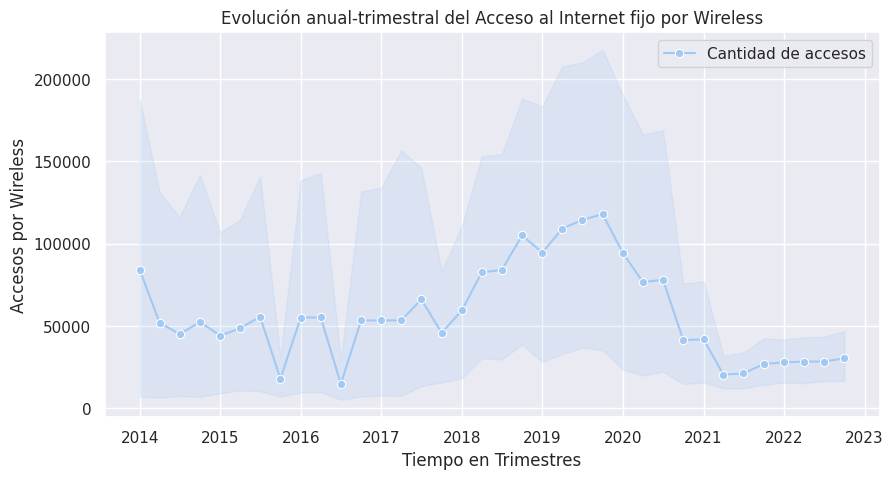

In [62]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(10, 5))

# Graficar la evolución del Acceso al Internet fijo por Wireless
sns.lineplot(x = 'Fecha', y = 'Wireless', data = acceso_tecnologia_provincia,
             label = 'Cantidad de accesos', marker = 'o')
# Agregar etiquetas de eje y título del gráfico
plt.xlabel("Tiempo en Trimestres")
plt.ylabel("Accesos por Wireless")
plt.title("Evolución anual-trimestral del Acceso al Internet fijo por Wireless")
# Mostrar gráfico completo
plt.show()

**Apreciación:**

- Para el caso de Wireless se observa un crecimiento en la cantidad de accesos a esta tecnología a partir del año 2018 superando los 5 mil y aunque se ha aumentando esta cantidad anualmente llegando a estar por encima de los 20 mil accesos para el año 2022, sigue siendo una tecnología con poca cantidad de acceso en comparación con las otras.

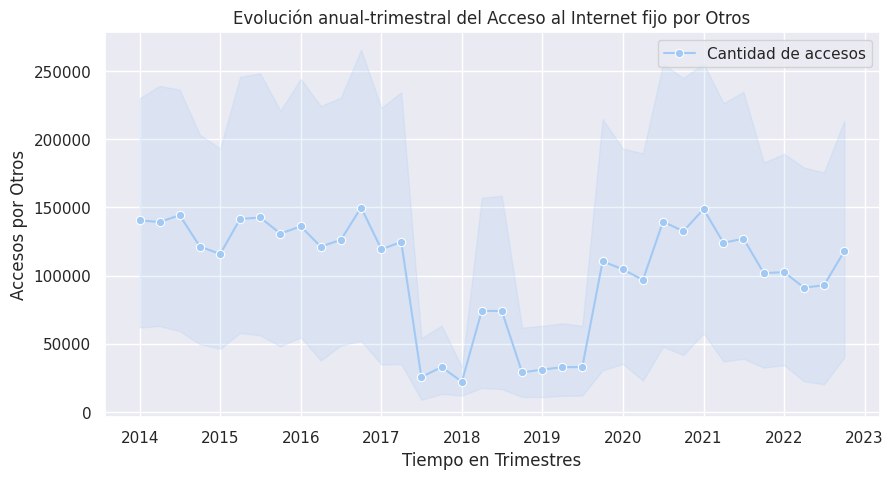

In [63]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(10, 5))

# Graficar la evolución del Acceso al Internet fijo por Otros
sns.lineplot(x = 'Fecha', y = 'Otros', data = acceso_tecnologia_provincia,
             label = 'Cantidad de accesos', marker = 'o')
# Agregar etiquetas de eje y título del gráfico
plt.xlabel("Tiempo en Trimestres")
plt.ylabel("Accesos por Otros")
plt.title("Evolución anual-trimestral del Acceso al Internet fijo por Otros")
# Mostrar gráfico completo
plt.show()

**Apreciación:**

- Aunque para este atributo no hay una clara información con respecto a que tecnologías menores hace referencia se puede observar bastantes fluctuaciones a lo largo del tiempo especialmente del año 2017 al 2020, presantando una caida para el cuarto trimestre de este último año posiblemente debido a la demanda que originó el COVID-19 haciendo que los usuarios tuviesen preferencias hacia otras tecnologías mucho más populares.

- Aún así, se mantiene cerca de los 10 mil accesos lo que convierte a estas tecnologías menores en las menos preferidas por la población Argentina.

### Análisis Multivariable

#### Accesos promedios anules a las tecnologías por provincia

##### ```Provincia``` vs ```Año``` vs ```ADSL```

**Mapa de accesos para tecnología ADSL**

Este mapa proporcionará un resumen de los años más recientes, específicamente 2021 y 2022. Estos años pueden brindar una imagen más precisa de la situación actual del mercado. Se presentará información clave sobre los niveles de acceso para la tecnología ADSL en Argentina para ambos años, lo que permitirá visualizar mejor la distribución del acceso a lo largo del país.

In [64]:
# Leer un archivo .csv con las latitudes y longitudes de cada una de las provincias de Argentina
geo_arg = pd.read_csv('geo_argentina.csv', encoding = 'ISO 8859-1')
# Se crea un dataframe con los datos correspondientes a los años 2021 y 2022
adsl = acceso_tecnologia_provincia[acceso_tecnologia_provincia['Año'] >= 2021][['Provincia', 'Año',
                                                                                       'ADSL']]

# Se unen los Dataframes "geo_arg" y "adsl" utilizando la columna "provincia" con punto de unión
data = pd.merge(geo_arg, adsl, on = 'Provincia')

# Se agrupan los datos por provincia y año conservando la latitud y longitud de cada provincia
mapa_accesos = data.groupby(['Provincia','Año'], as_index = False).agg({'ADSL': 'mean',
                                                                        'Latitud': 'first', 'Longitud': 'first'})
# Cargar el archivo geojson de provincias de Argentina
mapa = gpd.read_file('ProvinciasArgentina.geojson')

# Se fusionan los datos de acceso a las tecnologías por provincia con el archivo GeoJSON de las provincias de Argentina
provincias_accesos = mapa.merge(mapa_accesos, left_on = 'nombre',
                                           right_on = 'Provincia', how = 'outer')
# Se convierte el sistema de coordenadas a uno proyectado
provincias_accesos = provincias_accesos.to_crs(epsg = 3857)

# Se crean dos Dataframes con la data respectiva para cada año
data_2021 = provincias_accesos[provincias_accesos['Año'] == 2021].copy()
data_2022 = provincias_accesos[provincias_accesos['Año'] == 2022].copy()

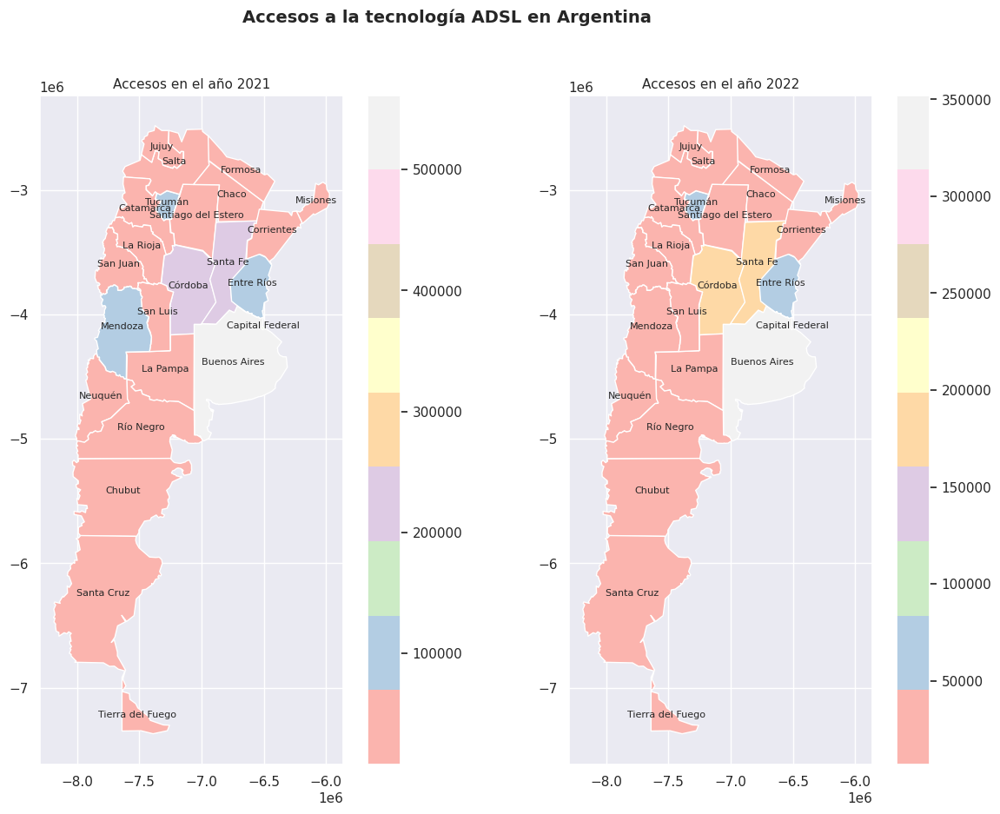

In [65]:
# Crear una figura con dos ejes
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (15, 10))

# Trazar el mapa para la columna ADSL en el eje izquierdo
data_2021.plot(column = 'ADSL', cmap = 'Pastel1', legend = True, ax = ax1)
ax1.set_title('Accesos en el año 2021', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de ADSL
data_2021['coords'] = data_2021['geometry'].centroid
for idx, row in data_2021.iterrows():
  ax1.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Trazar el mapa para la columna ADSL en el eje derecho
data_2022.plot(column = 'ADSL', cmap = 'Pastel1', legend = True, ax = ax2)
ax2.set_title('Accesos en el año 2022', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de ADSL
data_2022['coords'] = data_2022['geometry'].centroid
for idx, row in data_2022.iterrows():
  ax2.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Ajustar el espaciado entre los dos ejes
fig.subplots_adjust(wspace = 0.1)

# Agregar un título general a la figura
fig.suptitle('Accesos a la tecnología ADSL en Argentina', fontsize = 14, fontweight = 'bold')

# Mostrar la figura
plt.show()

**Gráfico de barras agrupadas para los accesos anuales promedios a la tecnología ADSL por provincia**

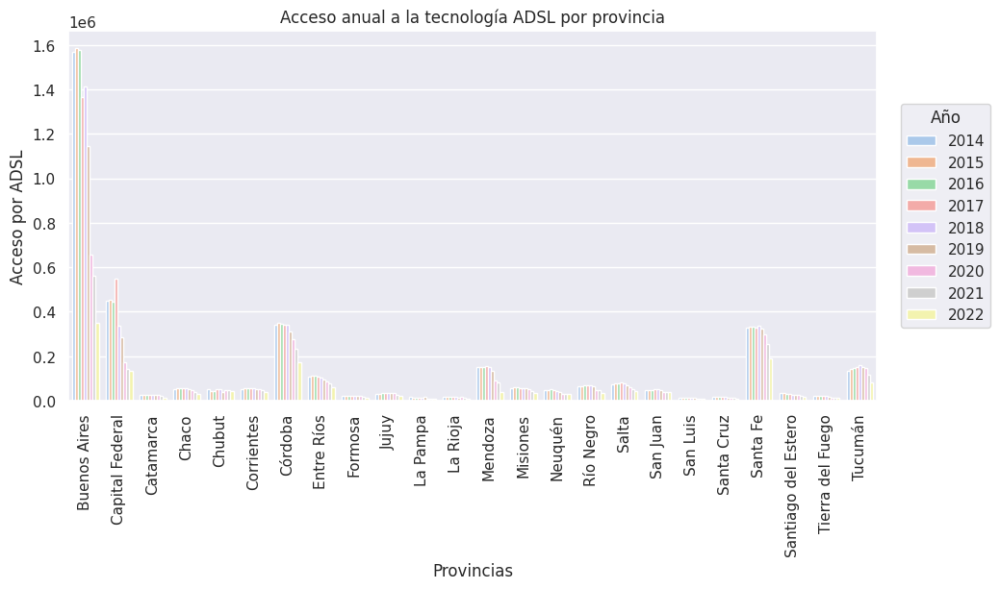

In [66]:
# Agrupar los datos por provincia y año y calcular la media del acceso por ADSL
df_resumen = acceso_tecnologia_provincia.groupby(['Provincia', 'Año'])['ADSL'].mean().reset_index()

# Generar el gráfico de barras agrupadas
fig, ax = plt.subplots(figsize=(12, 5))
sns.barplot(x='Provincia', y='ADSL', hue='Año', data=df_resumen, ax=ax)

# Actualizar las opciones del diseño del gráfico
ax.set_title('Acceso anual a la tecnología ADSL por provincia')
ax.set_xlabel('Provincias')
ax.set_ylabel('Acceso por ADSL')
ax.tick_params(axis='x', rotation=90)

# Agregar título a la leyenda
ax.legend(title='Año', ncol=1, bbox_to_anchor=(1.15, 0.5), loc='center right')

# Ajustar el espacio entre el gráfico y la leyenda
plt.subplots_adjust(left=0.2)

# Mostrar el gráfico
plt.show()

**Apreciación:**

- La preferencia hacia esta tecnología ha ido decreciendo a lo largo de los años para la mayoría de las provincias. Pese a la disminución para el año 2022 sólo las provincias de Buenos Aires y Santa Fe son las que superan los 200 mil accesos. Seguidas de Córdoba y la Capital Federal superando los 120 mil.

##### ```Provincia``` vs ```Año``` vs ```Cablemodem```

**Mapa de accesos para tecnología Cablemodem**

Este mapa proporcionará un resumen de los años más recientes, específicamente 2021 y 2022. Estos años pueden brindar una imagen más precisa de la situación actual del mercado. Se presentará información clave sobre los niveles de acceso para la tecnología Cablemodem en Argentina para ambos años, lo que permitirá visualizar mejor la distribución del acceso a lo largo del país.

In [67]:
# Leer un archivo .csv con las latitudes y longitudes de cada una de las provincias de Argentina
geo_arg = pd.read_csv('geo_argentina.csv', encoding = 'ISO 8859-1')
# Se crea un dataframe con los datos correspondientes a los años 2021 y 2022
cablemodem = acceso_tecnologia_provincia[acceso_tecnologia_provincia['Año'] >= 2021][['Provincia', 'Año',
                                                                                       'Cablemodem']]

# Se unen los Dataframes "geo_arg" y "cablemodem" utilizando la columna "provincia" con punto de unión
data = pd.merge(geo_arg, cablemodem, on = 'Provincia')

# Se agrupan los datos por provincia y año conservando la latitud y longitud de cada provincia
mapa_accesos = data.groupby(['Provincia','Año'], as_index = False).agg({'Cablemodem': 'mean',
                                                                        'Latitud': 'first', 'Longitud': 'first'})
# Cargar el archivo geojson de provincias de Argentina
mapa = gpd.read_file('ProvinciasArgentina.geojson')

# Se fusionan los datos de acceso a las tecnologías por provincia con el archivo GeoJSON de las provincias de Argentina
provincias_accesos = mapa.merge(mapa_accesos, left_on = 'nombre',
                                           right_on = 'Provincia', how = 'outer')
# Se convierte el sistema de coordenadas a uno proyectado
provincias_accesos = provincias_accesos.to_crs(epsg = 3857)

# Se crean dos Dataframes con la data respectiva para cada año
data_2021 = provincias_accesos[provincias_accesos['Año'] == 2021].copy()
data_2022 = provincias_accesos[provincias_accesos['Año'] == 2022].copy()

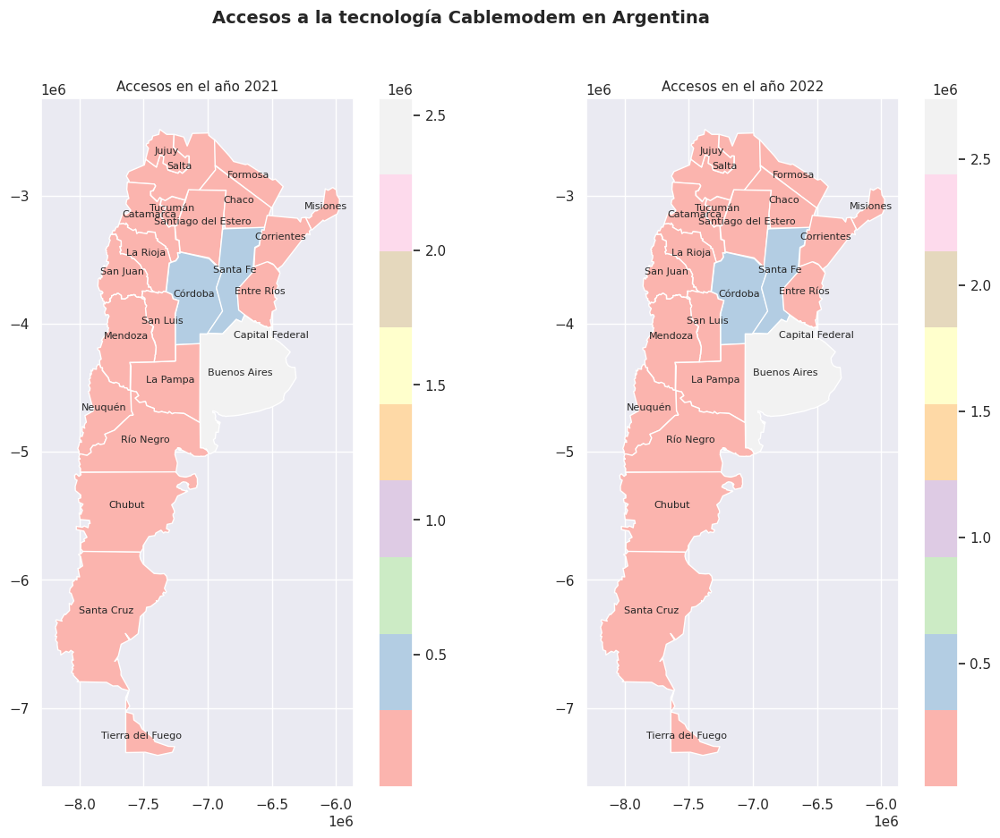

In [68]:
# Crear una figura con dos ejes
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (15, 10))

# Trazar el mapa para la columna Cablemodem en el eje izquierdo
data_2021.plot(column = 'Cablemodem', cmap = 'Pastel1', legend = True, ax = ax1)
ax1.set_title('Accesos en el año 2021', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Cablemodem
data_2021['coords'] = data_2021['geometry'].centroid
for idx, row in data_2021.iterrows():
  ax1.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Trazar el mapa para la columna Cablemodem en el eje derecho
data_2022.plot(column = 'Cablemodem', cmap = 'Pastel1', legend = True, ax = ax2)
ax2.set_title('Accesos en el año 2022', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Cablemodem
data_2022['coords'] = data_2022['geometry'].centroid
for idx, row in data_2022.iterrows():
  ax2.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Ajustar el espaciado entre los dos ejes
fig.subplots_adjust(wspace = 0.1)

# Agregar un título general a la figura
fig.suptitle('Accesos a la tecnología Cablemodem en Argentina', fontsize = 14, fontweight = 'bold')

# Mostrar la figura
plt.show()

**Gráfico de barras agrupadas para los accesos anuales promedios a la tecnología Cablemdem por provincia**

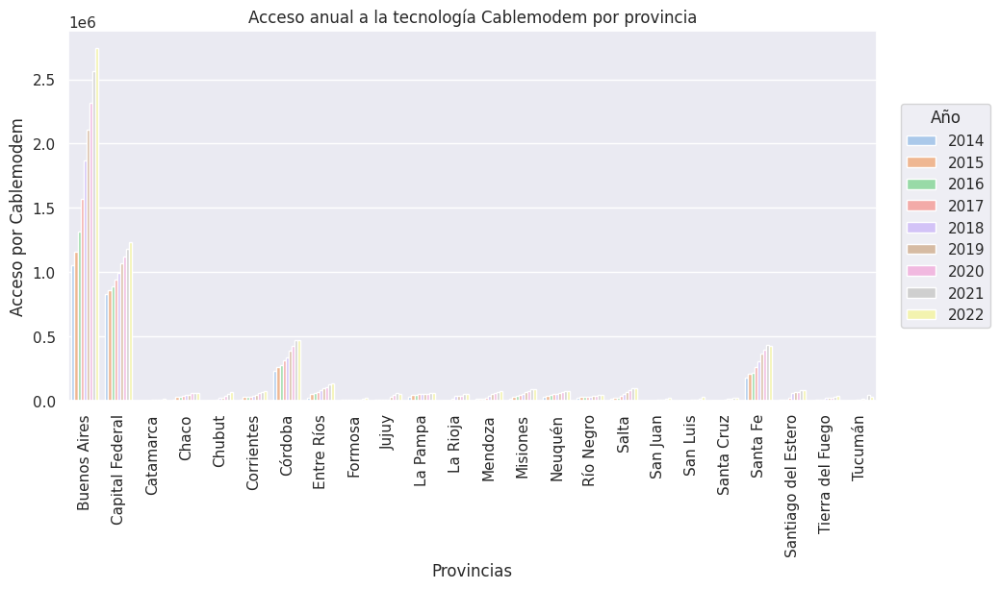

In [69]:
# Agrupar los datos por provincia y año y calcular la media del acceso por Cablemodem
df_resumen = acceso_tecnologia_provincia.groupby(['Provincia', 'Año'])['Cablemodem'].mean().reset_index()

# Generar el gráfico de barras agrupadas con Seaborn
fig, ax = plt.subplots(figsize=(12, 5))
sns.barplot(x='Provincia', y='Cablemodem', hue='Año', data=df_resumen, ax=ax)

# Actualizar las opciones del diseño del gráfico
ax.set_title('Acceso anual a la tecnología Cablemodem por provincia')
ax.set_xlabel('Provincias')
ax.set_ylabel('Acceso por Cablemodem')
ax.tick_params(axis='x', rotation=90)

# Agregar título a la leyenda
ax.legend(title='Año', ncol=1, bbox_to_anchor=(1.15, 0.5), loc='center right')

# Ajustar el espacio entre el gráfico y la leyenda
plt.subplots_adjust(left=0.2)

# Mostrar el gráfico
plt.show()

**Apreciación:**

- En cuanto al Cablemodem, la mayoría de las provincias experimentan un crecimiento en la cantidad de accesos. Sin embargo, en el año 2022, solo cuatro provincias tienen una fuerte preferencia por esta tecnología: Buenos Aires y la Capital Federal, con más de un millón de accesos cada una, y Córdoba y Santa Fe, con más de 400 mil accesos cada una. Es importante destacar que la cantidad de accesos en Buenos Aires y la Capital Federal sesga el análisis sobre la tecnología más empleada en todas las provincias de Argentina. En efecto, la mayoría de los accesos totales para el Cablemodem en 2022 corresponden a estas dos áreas, lo que representa el 65% del total de accesos para esta tecnología en el país. No obstante, cuando se considera el total de accesos nacionales, el Cablemodem representa el 55% de los accesos, lo que indica que su preferencia no es uniforme en todo el territorio nacional.

##### ```Provincia``` vs ```Año``` vs ```Fibra óptica```

**Mapa de accesos para tecnología Fibra óptica**

Este mapa proporcionará un resumen de los años más recientes, específicamente 2021 y 2022. Estos años pueden brindar una imagen más precisa de la situación actual del mercado. Se presentará información clave sobre los niveles de acceso para la tecnología Fibra óptica en Argentina para ambos años, lo que permitirá visualizar mejor la distribución del acceso a lo largo del país.

In [70]:
# Leer un archivo .csv con las latitudes y longitudes de cada una de las provincias de Argentina
geo_arg = pd.read_csv('geo_argentina.csv', encoding = 'ISO 8859-1')
# Se crea un dataframe con los datos correspondientes a los años 2021 y 2022
fibra_optica = acceso_tecnologia_provincia[acceso_tecnologia_provincia['Año'] >= 2021][['Provincia', 'Año',
                                                                                       'Fibra óptica']]

# Se unen los Dataframes "geo_arg" y "fibra_optica" utilizando la columna "provincia" con punto de unión
data = pd.merge(geo_arg, fibra_optica, on = 'Provincia')

# Se agrupan los datos por provincia y año conservando la latitud y longitud de cada provincia
mapa_accesos = data.groupby(['Provincia','Año'], as_index = False).agg({'Fibra óptica': 'mean',
                                                                        'Latitud': 'first', 'Longitud': 'first'})
# Cargar el archivo geojson de provincias de Argentina
mapa = gpd.read_file('ProvinciasArgentina.geojson')

# Se fusionan los datos de acceso a las tecnologías por provincia con el archivo GeoJSON de las provincias de Argentina
provincias_accesos = mapa.merge(mapa_accesos, left_on = 'nombre',
                                           right_on = 'Provincia', how = 'outer')
# Se convierte el sistema de coordenadas a uno proyectado
provincias_accesos = provincias_accesos.to_crs(epsg = 3857)

# Se crean dos Dataframes con la data respectiva para cada año
data_2021 = provincias_accesos[provincias_accesos['Año'] == 2021].copy()
data_2022 = provincias_accesos[provincias_accesos['Año'] == 2022].copy()

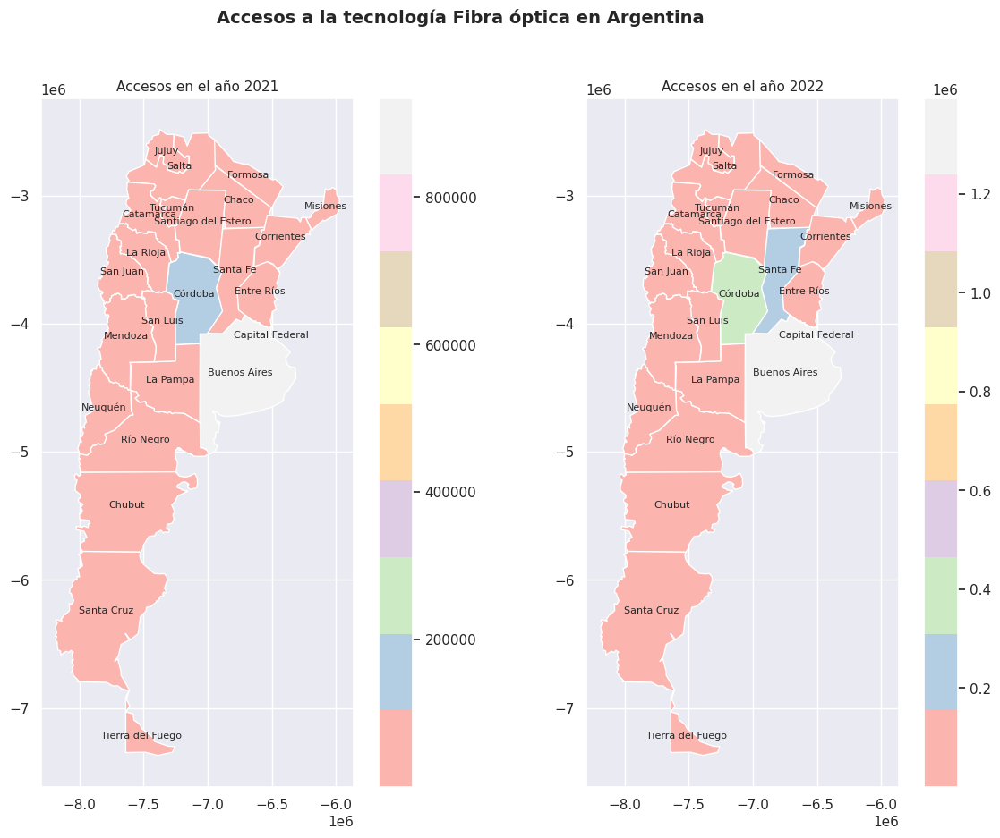

In [71]:
# Crear una figura con dos ejes
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (15, 10))

# Trazar el mapa para la columna Fibra óptica en el eje izquierdo
data_2021.plot(column = 'Fibra óptica', cmap = 'Pastel1', legend = True, ax = ax1)
ax1.set_title('Accesos en el año 2021', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Fibra óptica
data_2021['coords'] = data_2021['geometry'].centroid
for idx, row in data_2021.iterrows():
  ax1.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Trazar el mapa para la columna Fibra óptica en el eje derecho
data_2022.plot(column = 'Fibra óptica', cmap = 'Pastel1', legend = True, ax = ax2)
ax2.set_title('Accesos en el año 2022', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Fibra óptica
data_2022['coords'] = data_2022['geometry'].centroid
for idx, row in data_2022.iterrows():
  ax2.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Ajustar el espaciado entre los dos ejes
fig.subplots_adjust(wspace = 0.1)

# Agregar un título general a la figura
fig.suptitle('Accesos a la tecnología Fibra óptica en Argentina', fontsize = 14, fontweight = 'bold')

# Mostrar la figura
plt.show()

**Gráfico de barras agrupadas para los accesos anuales promedios a la tecnología Fibra óptica por provincia**

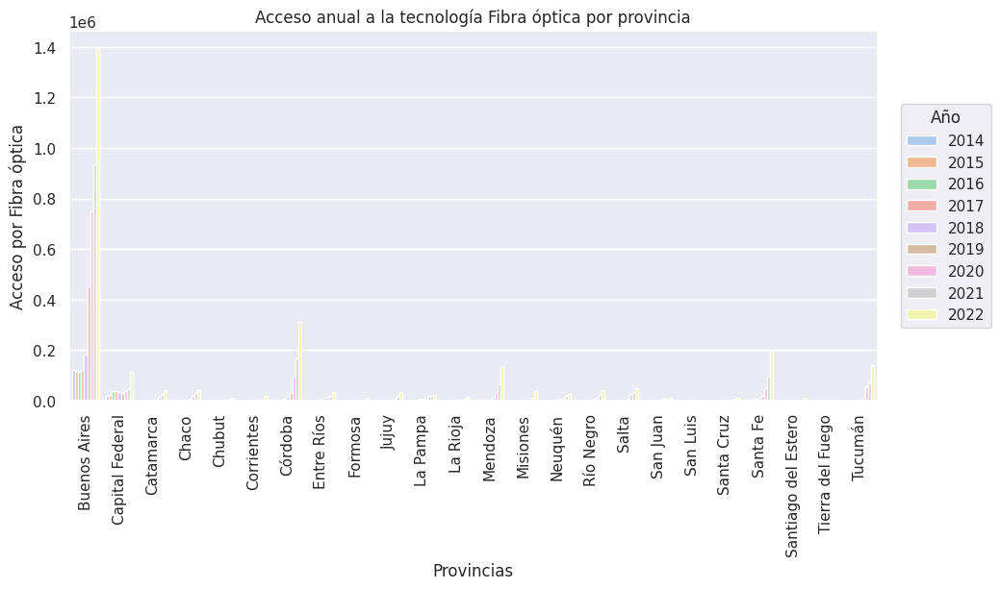

In [72]:
# Agrupar los datos por provincia y año y calcular la media del acceso por Fibra óptica
df_resumen = acceso_tecnologia_provincia.groupby(['Provincia', 'Año'])['Fibra óptica'].mean().reset_index()

# Generar el gráfico de barras agrupadas con Seaborn
fig, ax = plt.subplots(figsize=(12, 5))
sns.barplot(x='Provincia', y='Fibra óptica', hue='Año', data=df_resumen, ax=ax)

# Actualizar las opciones del diseño del gráfico
ax.set_title('Acceso anual a la tecnología Fibra óptica por provincia')
ax.set_xlabel('Provincias')
ax.set_ylabel('Acceso por Fibra óptica')
ax.tick_params(axis='x', rotation=90)

# Agregar título a la leyenda
ax.legend(title='Año', ncol=1, bbox_to_anchor=(1.15, 0.5), loc='center right')

# Ajustar el espacio entre el gráfico y la leyenda
plt.subplots_adjust(left=0.2)

# Mostrar el gráfico
plt.show()

**Apreciación:**

- La presencia de la tecnología de Fibra óptica en la mayoría de las provincias de Argentina es limitada, ya que solo 5 de ellas junto con la Capital Federal superan los 100 mil accesos para el año 2022. No obstante, esta tecnología presenta un fuerte crecimiento, alcanzando el millón de accesos en la provincia de Buenos Aires, seguida de Córdoba con más de 200 mil accesos.

- Por otro lado, en las provincias de Chubut, Tierra del Fuego, Formosa, San Luis y Santa Cruz, la presencia de esta tecnología es aún menor, lo que podría ser un posible insight a considerar. Es posible que en estas provincias la preferencia por otras tecnologías de acceso a internet sea mayor debido a factores como la disponibilidad de infraestructura y la demanda de los consumidores, sin embargo, esto podría representar una oportunidad para el desarrollo de esta tecnología en estas provincias.

##### ```Provincia``` vs ```Año``` vs ```Wireless```

**Mapa de accesos para tecnología Wireless**

Este mapa proporcionará un resumen de los años más recientes, específicamente 2021 y 2022. Estos años pueden brindar una imagen más precisa de la situación actual del mercado. Se presentará información clave sobre los niveles de acceso para la tecnología Wireless en Argentina para ambos años, lo que permitirá visualizar mejor la distribución del acceso a lo largo del país.

In [73]:
# Leer un archivo .csv con las latitudes y longitudes de cada una de las provincias de Argentina
geo_arg = pd.read_csv('geo_argentina.csv', encoding = 'ISO 8859-1')
# Se crea un dataframe con los datos correspondientes a los años 2021 y 2022
wireless = acceso_tecnologia_provincia[acceso_tecnologia_provincia['Año'] >= 2021][['Provincia', 'Año',
                                                                                       'Wireless']]

# Se unen los Dataframes "geo_arg" y "wireless" utilizando la columna "provincia" con punto de unión
data = pd.merge(geo_arg, wireless, on = 'Provincia')

# Se agrupan los datos por provincia y año conservando la latitud y longitud de cada provincia
mapa_accesos = data.groupby(['Provincia','Año'], as_index = False).agg({'Wireless': 'mean',
                                                                        'Latitud': 'first', 'Longitud': 'first'})
# Cargar el archivo geojson de provincias de Argentina
mapa = gpd.read_file('ProvinciasArgentina.geojson')

# Se fusionan los datos de acceso a las tecnologías por provincia con el archivo GeoJSON de las provincias de Argentina
provincias_accesos = mapa.merge(mapa_accesos, left_on = 'nombre',
                                           right_on = 'Provincia', how = 'outer')
# Se convierte el sistema de coordenadas a uno proyectado
provincias_accesos = provincias_accesos.to_crs(epsg = 3857)

# Se crean dos Dataframes con la data respectiva para cada año
data_2021 = provincias_accesos[provincias_accesos['Año'] == 2021].copy()
data_2022 = provincias_accesos[provincias_accesos['Año'] == 2022].copy()

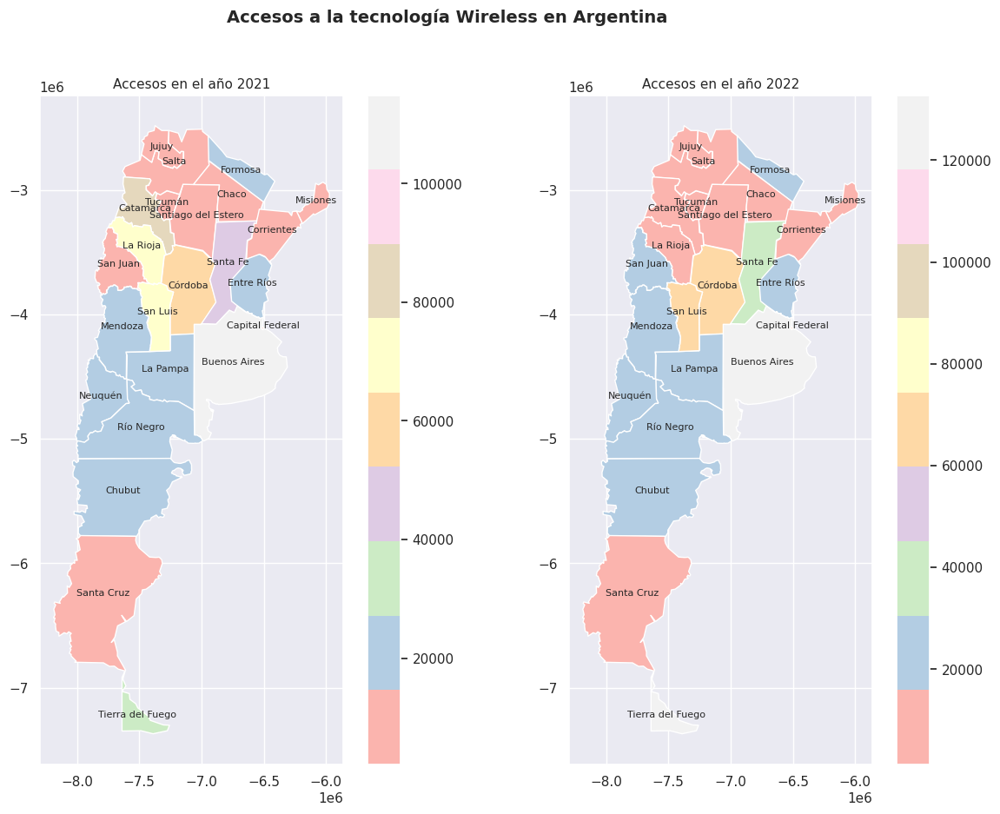

In [74]:
# Crear una figura con dos ejes
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (15, 10))

# Trazar el mapa para la columna Wireless en el eje izquierdo
data_2021.plot(column = 'Wireless', cmap = 'Pastel1', legend = True, ax = ax1)
ax1.set_title('Accesos en el año 2021', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Wireless
data_2021['coords'] = data_2021['geometry'].centroid
for idx, row in data_2021.iterrows():
  ax1.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Trazar el mapa para la columna Wireless en el eje derecho
data_2022.plot(column = 'Wireless', cmap = 'Pastel1', legend = True, ax = ax2)
ax2.set_title('Accesos en el año 2022', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Wireless
data_2022['coords'] = data_2022['geometry'].centroid
for idx, row in data_2022.iterrows():
  ax2.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Ajustar el espaciado entre los dos ejes
fig.subplots_adjust(wspace = 0.1)

# Agregar un título general a la figura
fig.suptitle('Accesos a la tecnología Wireless en Argentina', fontsize = 14, fontweight = 'bold')

# Mostrar la figura
plt.show()

**Gráfico de barras agrupadas para los accesos anuales promedios a la tecnología Wireless por provincia**

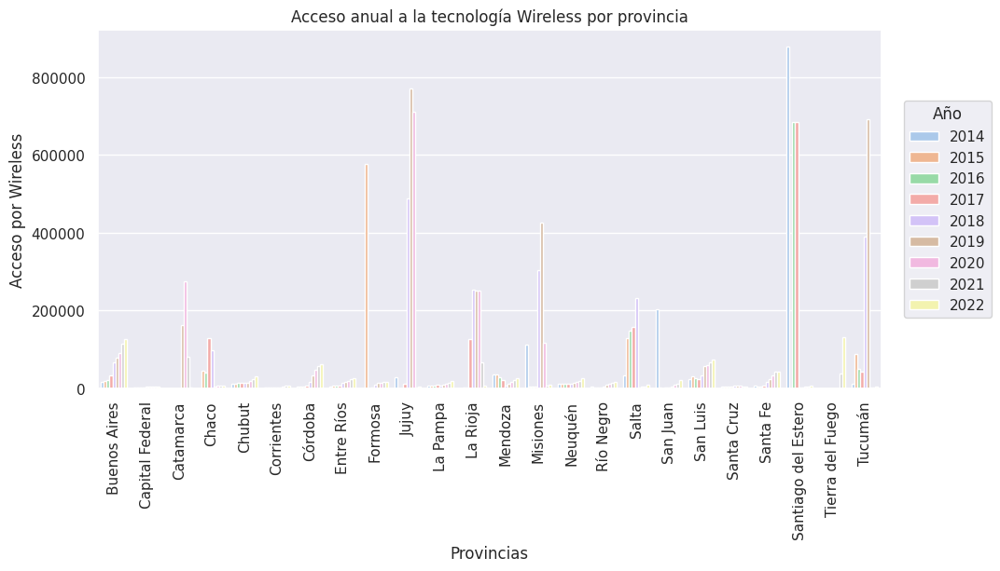

In [75]:
# Agrupar los datos por provincia y año y calcular la media del acceso por Wireless
df_resumen = acceso_tecnologia_provincia.groupby(['Provincia', 'Año'])['Wireless'].mean().reset_index()

# Generar el gráfico de barras agrupadas con Seaborn
fig, ax = plt.subplots(figsize=(12, 5))
sns.barplot(x='Provincia', y='Wireless', hue='Año', data=df_resumen, ax=ax)

# Actualizar las opciones del diseño del gráfico
ax.set_title('Acceso anual a la tecnología Wireless por provincia')
ax.set_xlabel('Provincias')
ax.set_ylabel('Acceso por Wireless')
ax.tick_params(axis='x', rotation=90)

# Agregar título a la leyenda
ax.legend(title='Año', ncol=1, bbox_to_anchor=(1.15, 0.5), loc='center right')

# Ajustar el espacio entre el gráfico y la leyenda
plt.subplots_adjust(left=0.2)

# Mostrar el gráfico
plt.show()

**Apreciaciones:**

- A pesar de que este gráfico muestra una buena presencia de la tecnología Wireless en prácticamente todas las provincias y una tendencia creciente en los últimos años, la cantidad de accesos sigue siendo baja en comparación con otras tecnologías.

- No obstante, es importante resaltar que para el año 2022, las provincias de Buenos Aires, Córdoba y San Luis lideran en cantidad de accesos a la tecnología Wireless, superando los 60 mil accesos, seguidas de Santa Fe con más de 40 mil. Por otro lado, las provincias de Catamarca y Tierra del Fuego tienen una presencia muy limitada de esta tecnología.

- A pesar de estas diferencias en la presencia de la tecnología Wireless en diferentes provincias, es importante tener en cuenta su potencial para mejorar la conectividad y la calidad de vida de los ciudadanos en todas las regiones. La tecnología Wireless permite una conexión a internet de alta velocidad y sin necesidad de cables, lo que puede ser beneficioso para zonas rurales o con dificultades de infraestructura.

##### ```Provincia``` vs ```Año``` vs ```Otros```

**Mapa de accesos para Otras tecnologías**

Este mapa proporcionará un resumen de los años más recientes, específicamente 2021 y 2022. Estos años pueden brindar una imagen más precisa de la situación actual del mercado. Se presentará información clave sobre los niveles de acceso para las otras tecnologías en Argentina para ambos años, lo que permitirá visualizar mejor la distribución del acceso a lo largo del país.

In [76]:
# Leer un archivo .csv con las latitudes y longitudes de cada una de las provincias de Argentina
geo_arg = pd.read_csv('geo_argentina.csv', encoding = 'ISO 8859-1')
# Se crea un dataframe con los datos correspondientes a los años 2021 y 2022
otros = acceso_tecnologia_provincia[acceso_tecnologia_provincia['Año'] >= 2021][['Provincia', 'Año',
                                                                                       'Otros']]

# Se unen los Dataframes "geo_arg" y "otros" utilizando la columna "provincia" con punto de unión
data = pd.merge(geo_arg, otros, on = 'Provincia')

# Se agrupan los datos por provincia y año conservando la latitud y longitud de cada provincia
mapa_accesos = data.groupby(['Provincia','Año'], as_index = False).agg({'Otros': 'mean',
                                                                        'Latitud': 'first', 'Longitud': 'first'})
# Cargar el archivo geojson de provincias de Argentina
mapa = gpd.read_file('ProvinciasArgentina.geojson')

# Se fusionan los datos de acceso a las tecnologías por provincia con el archivo GeoJSON de las provincias de Argentina
provincias_accesos = mapa.merge(mapa_accesos, left_on = 'nombre',
                                           right_on = 'Provincia', how = 'outer')
# Se convierte el sistema de coordenadas a uno proyectado
provincias_accesos = provincias_accesos.to_crs(epsg = 3857)

# Se crean dos Dataframes con la data respectiva para cada año
data_2021 = provincias_accesos[provincias_accesos['Año'] == 2021].copy()
data_2022 = provincias_accesos[provincias_accesos['Año'] == 2022].copy()

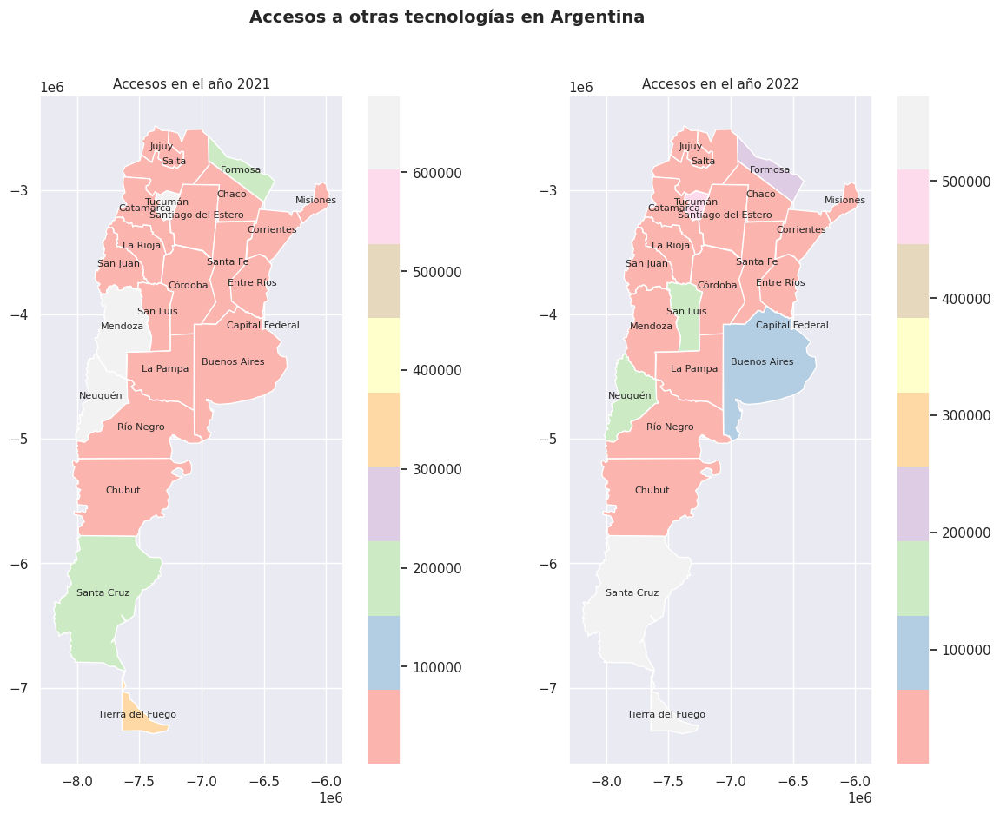

In [77]:
# Crear una figura con dos ejes
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (15, 10))

# Trazar el mapa para la columna Otros en el eje izquierdo
data_2021.plot(column = 'Otros', cmap = 'Pastel1', legend = True, ax = ax1)
ax1.set_title('Accesos en el año 2021', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Otros
data_2021['coords'] = data_2021['geometry'].centroid
for idx, row in data_2021.iterrows():
  ax1.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Trazar el mapa para la columna Otros en el eje derecho
data_2022.plot(column = 'Otros', cmap = 'Pastel1', legend = True, ax = ax2)
ax2.set_title('Accesos en el año 2022', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Otros
data_2022['coords'] = data_2022['geometry'].centroid
for idx, row in data_2022.iterrows():
  ax2.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Ajustar el espaciado entre los dos ejes
fig.subplots_adjust(wspace = 0.1)

# Agregar un título general a la figura
fig.suptitle('Accesos a otras tecnologías en Argentina', fontsize = 14, fontweight = 'bold')

# Mostrar la figura
plt.show()

**Gráfico de barras agrupadas para los accesos anuales promedios a las otras tecnologías por provincia**

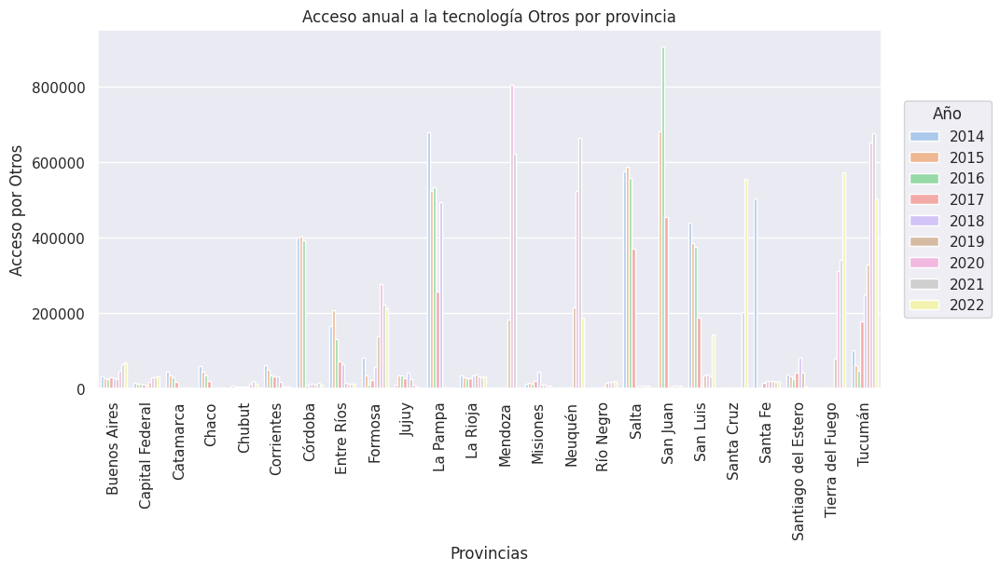

In [78]:
# Agrupar los datos por provincia y año y calcular la media del acceso para Otros
df_resumen = acceso_tecnologia_provincia.groupby(['Provincia', 'Año'])['Otros'].mean().reset_index()

# Generar el gráfico de barras agrupadas con Seaborn
fig, ax = plt.subplots(figsize=(12, 5))
sns.barplot(x='Provincia', y='Otros', hue='Año', data=df_resumen, ax=ax)

# Actualizar las opciones del diseño del gráfico
ax.set_title('Acceso anual a la tecnología Otros por provincia')
ax.set_xlabel('Provincias')
ax.set_ylabel('Acceso por Otros')
ax.tick_params(axis='x', rotation=90)

# Agregar título a la leyenda
ax.legend(title='Año', ncol=1, bbox_to_anchor=(1.15, 0.5), loc='center right')

# Ajustar el espacio entre el gráfico y la leyenda
plt.subplots_adjust(left=0.2)

# Mostrar el gráfico
plt.show()

**Apreciaciones:**

- El análisis de este atributo se dificulta puesta que no se tiene una certeza de cuantas y cuales tecnologías abarca, sin embargo, es destacable como este gráfico refleja diferencias en cuanto al crecimiento y decrecimiento de los accesos para determinadas provincias.

- Para las provincias de Buenos Aires, Río Negro, Santa Fe y la Capital Federal se observa un crecimiento hacia la cantidad de accesos para estas tecnologías menores. Donde la mayor presencia se encuentra en Buenos Aires superando los 60 mil accesos.

- Por su parte, para el resto de las provincias se aprecia un decrecimiento en cuanto a la cantidad de accesos lo que refleja preferencias hacia otras tecnologías más populares.

##### ```Provincia``` vs ```Año (2022)``` vs ```Cablemodem``` vs ```Fibra Óptica```

In [79]:
# Leer un archivo .csv con las latitudes y longitudes de cada una de las provincias de Argentina
geo_arg = pd.read_csv('geo_argentina.csv', encoding = 'ISO 8859-1')
# Se crea un dataframe con los datos correspondientes a los años 2021 y 2022
cablemodem = acceso_tecnologia_provincia[acceso_tecnologia_provincia['Año'] >= 2021][['Provincia', 'Año',
                                                                                       'Cablemodem']]

# Se unen los Dataframes "geo_arg" y "cablemodem" utilizando la columna "provincia" con punto de unión
data = pd.merge(geo_arg, cablemodem, on = 'Provincia')

# Se agrupan los datos por provincia y año conservando la latitud y longitud de cada provincia
mapa_accesos = data.groupby(['Provincia','Año'], as_index = False).agg({'Cablemodem': 'mean',
                                                                        'Latitud': 'first', 'Longitud': 'first'})
# Cargar el archivo geojson de provincias de Argentina
mapa = gpd.read_file('ProvinciasArgentina.geojson')

# Se fusionan los datos de acceso a las tecnologías por provincia con el archivo GeoJSON de las provincias de Argentina
provincias_accesos = mapa.merge(mapa_accesos, left_on = 'nombre',
                                           right_on = 'Provincia', how = 'outer')
# Se convierte el sistema de coordenadas a uno proyectado
provincias_accesos = provincias_accesos.to_crs(epsg = 3857)

# Se crean dos Dataframes con la data respectiva para cada año
data_2022_cm = provincias_accesos[provincias_accesos['Año'] == 2022].copy()

In [80]:
# Leer un archivo .csv con las latitudes y longitudes de cada una de las provincias de Argentina
geo_arg = pd.read_csv('geo_argentina.csv', encoding = 'ISO 8859-1')
# Se crea un dataframe con los datos correspondientes a los años 2021 y 2022
fibra_optica = acceso_tecnologia_provincia[acceso_tecnologia_provincia['Año'] >= 2021][['Provincia', 'Año',
                                                                                       'Fibra óptica']]

# Se unen los Dataframes "geo_arg" y "fibra_optica" utilizando la columna "provincia" con punto de unión
data = pd.merge(geo_arg, fibra_optica, on = 'Provincia')

# Se agrupan los datos por provincia y año conservando la latitud y longitud de cada provincia
mapa_accesos = data.groupby(['Provincia','Año'], as_index = False).agg({'Fibra óptica': 'mean',
                                                                        'Latitud': 'first', 'Longitud': 'first'})
# Cargar el archivo geojson de provincias de Argentina
mapa = gpd.read_file('ProvinciasArgentina.geojson')

# Se fusionan los datos de acceso a las tecnologías por provincia con el archivo GeoJSON de las provincias de Argentina
provincias_accesos = mapa.merge(mapa_accesos, left_on = 'nombre',
                                           right_on = 'Provincia', how = 'outer')
# Se convierte el sistema de coordenadas a uno proyectado
provincias_accesos = provincias_accesos.to_crs(epsg = 3857)

# Se crean dos Dataframes con la data respectiva para cada año
data_2022_fo = provincias_accesos[provincias_accesos['Año'] == 2022].copy()

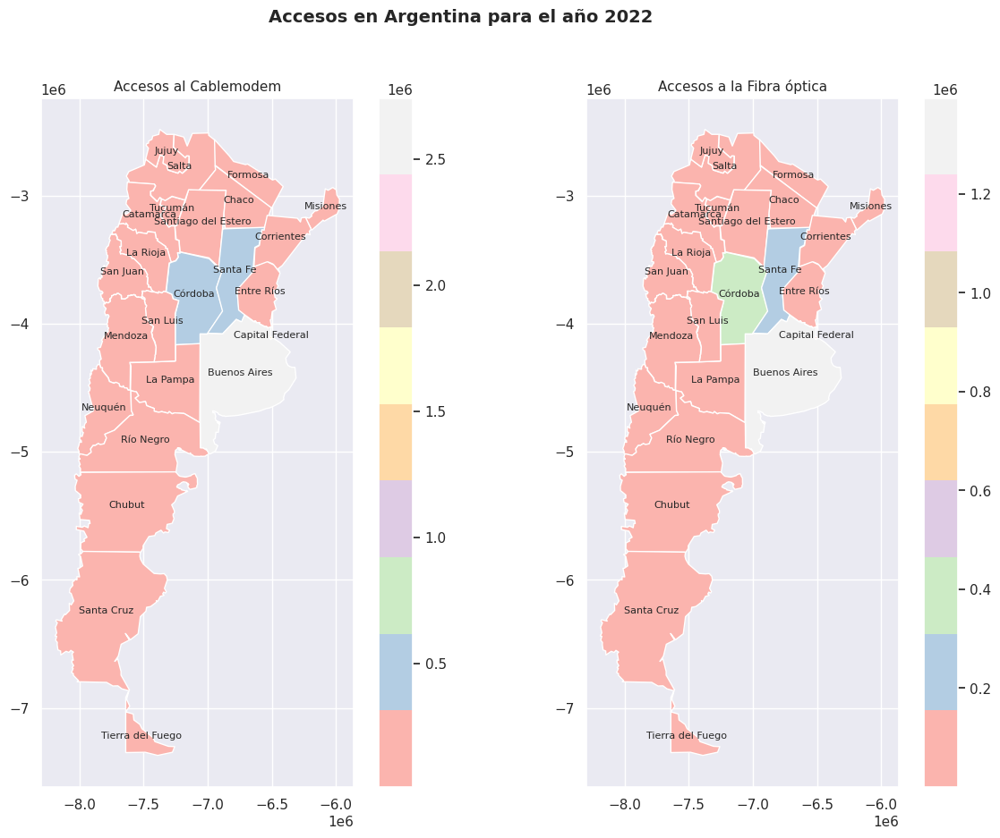

In [81]:
# Crear una figura con dos ejes
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (15, 10))

# Trazar el mapa para la columna Cablemodem en el eje izquierdo
data_2022_cm.plot(column = 'Cablemodem', cmap = 'Pastel1', legend = True, ax = ax1)
ax1.set_title('Accesos al Cablemodem', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Cablemodem
data_2022_cm['coords'] = data_2022_cm['geometry'].centroid
for idx, row in data_2022_cm.iterrows():
  ax1.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Trazar el mapa para la columna Fibra óptica en el eje derecho
data_2022_fo.plot(column = 'Fibra óptica', cmap = 'Pastel1', legend = True, ax = ax2)
ax2.set_title('Accesos a la Fibra óptica', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Fibra óptica
data_2022_fo['coords'] = data_2022_fo['geometry'].centroid
for idx, row in data_2022_fo.iterrows():
  ax2.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Ajustar el espaciado entre los dos ejes
fig.subplots_adjust(wspace = 0.1)

# Agregar un título general a la figura
fig.suptitle('Accesos en Argentina para el año 2022', fontsize = 14, fontweight = 'bold')

# Mostrar la figura
plt.show()

#### Accesos promedios anules-trimestrales a las tecnologías por regiones

Para facilitar el análisis en cada una de las provincias, se procede a explorar los datos por regiones. Es importante tener en cuenta que, aunque estas divisiones se utilizarán para fines estadísticos y de análisis, no son necesariamente oficiales y pueden variar según la fuente que se consulte. Además que cada una de estas regiones tienen sus propias características y particularidades, y que pueden haber diferencias significativas en términos de acceso a la tecnología y otros indicadores socioeconómicos entre las provincias y regiones dentro de cada una de ellas.

##### ```Año``` vs ```Trimestre``` vs ```Provincia``` vs Tecnología

In [82]:
# Región Patagonia de Argentina
patagonia = acceso_tecnologia_provincia[acceso_tecnologia_provincia['Provincia'].isin(['Tierra del Fuego', 'Santa Cruz',
                                                                                       'Chubut', 'Neuquén', 'Río Negro'])]

# Región de Cuyo de Argentina
cuyo = acceso_tecnologia_provincia[acceso_tecnologia_provincia['Provincia'].isin(['Mendoza', 'San Luis', 'San Juan'])]

# Región Pampeana de Argentina
pampeana = acceso_tecnologia_provincia[acceso_tecnologia_provincia['Provincia'].isin(['Buenos Aires', 'Capital Federal' ,
                                                                                      'Santa Fe', 'Córdoba', 'La Pampa'])]

# Región Noroeste de Argentina
noroeste = acceso_tecnologia_provincia[acceso_tecnologia_provincia['Provincia'].isin(['La Rioja', 'Catamarca', 'Tucumán',
                                                                                      'Santiago del Estero', 'Salta',
                                                                                      'Jujuy'])]

# Región Noreste de Argentina
noreste = acceso_tecnologia_provincia[acceso_tecnologia_provincia['Provincia'].isin(['Chaco', 'Formosa', 'Corrientes',
                                                                                     'Entre Ríos', 'Misiones'])]

Como la pandemia de COVID-19 ha tenido un impacto significativo en muchos aspectos de la sociedad y la economía, incluyendo el acceso a la tecnología. No se analizaran los años 2019-2020 ya que se corre el riesgo de caer en un sesgo que no refleje la verdadera situación del mercado. Por lo que las conclusiones que se presentaran acontinuación por región se centraran en los años 2021 y 2022 ya que estos refelejan la verdadera situación del mercado argentino.

#####  Región Patagonia

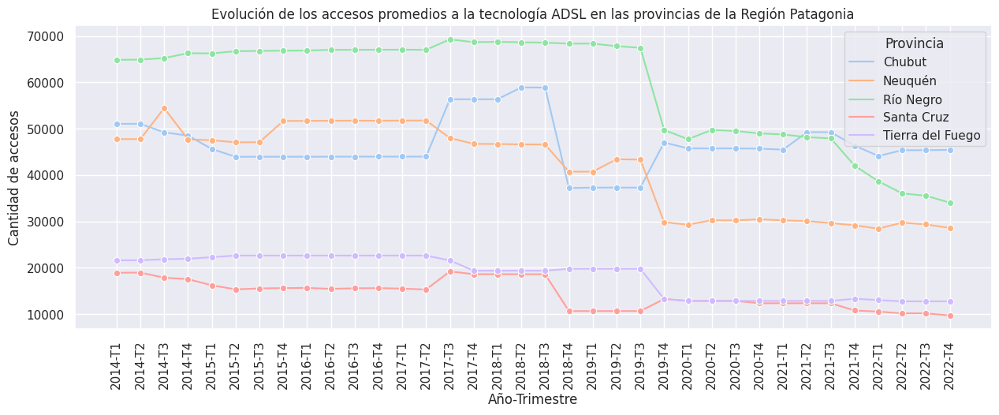

In [83]:
# Agrupar los datos por provincia y trimestre y calcular la media de "ADSL"
df_promedio = patagonia.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['ADSL'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='ADSL', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología ADSL en las provincias de la Región Patagonia')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

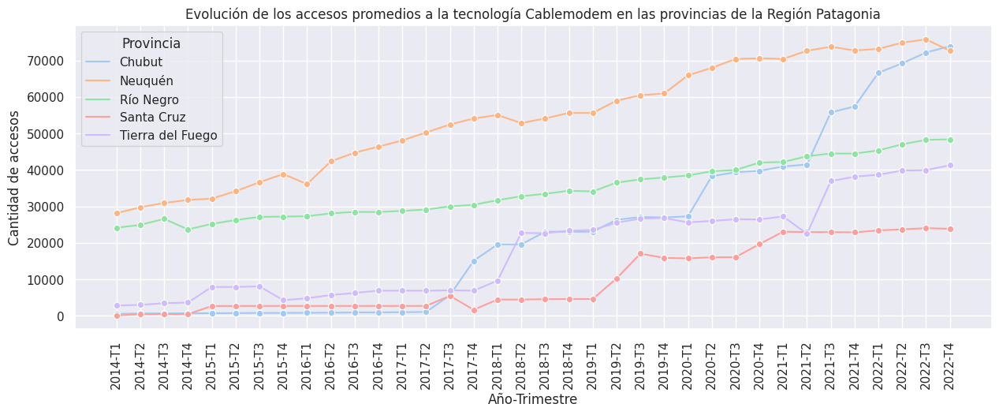

In [84]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Cablemodem"
df_promedio = patagonia.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Cablemodem'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Cablemodem', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología Cablemodem en las provincias de la Región Patagonia')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

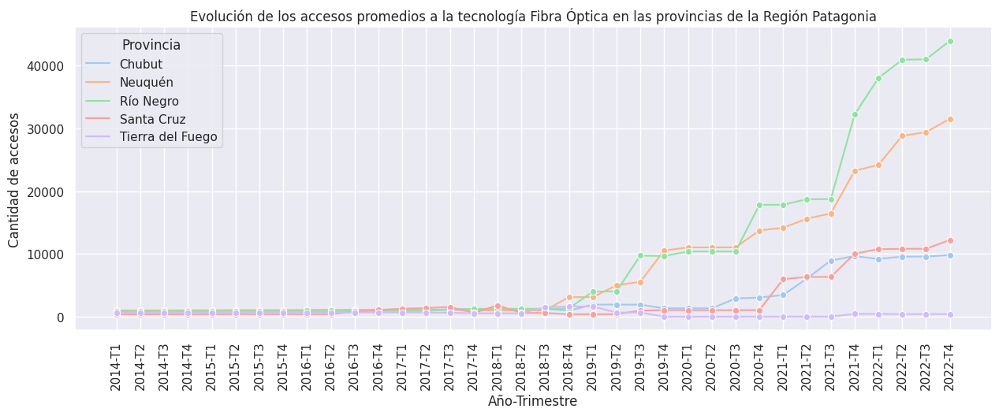

In [85]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Fibra óptica"
df_promedio = patagonia.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Fibra óptica'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Fibra óptica', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología Fibra Óptica en las provincias de la Región Patagonia')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

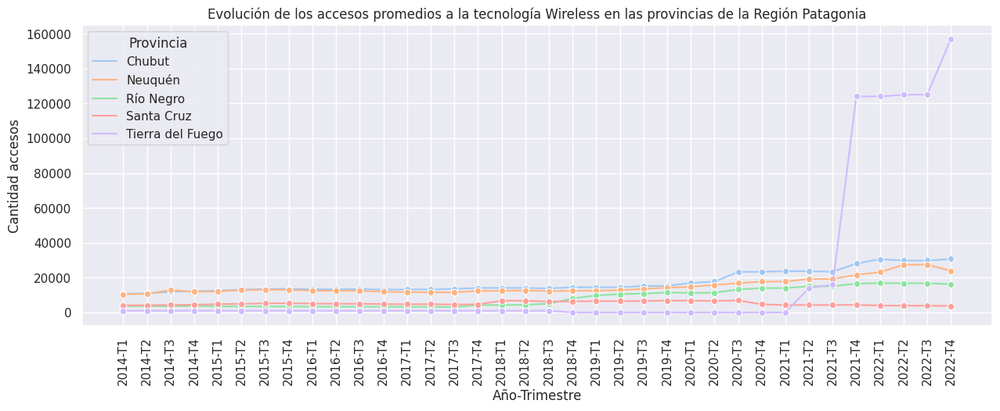

In [86]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Wireless"
df_promedio = patagonia.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Wireless'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Wireless', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología Wireless en las provincias de la Región Patagonia')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

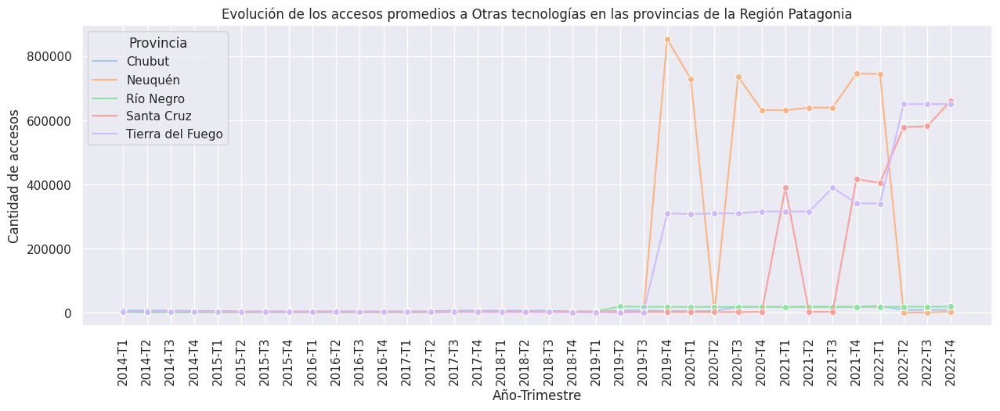

In [87]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Otros"
df_promedio = patagonia.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Otros'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Otros', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a Otras tecnologías en las provincias de la Región Patagonia')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- A pesar de que hasta el año 2019 la tecnología ADSL fue la que mayor cantidad de accesos tuvo en esta región. La tecnología más utilizada para los años 2021 y 2022 es el cablemodem. En la mayoría de las provincias de la región, el cablemodem representa la mayor cantidad de accesos a la tecnología, seguido de ADSL y wireless.

- Mientras que la tecnología menos utilizada en la región Patagonia en los años 2021 y 2022 es la fibra óptica. En algunas provincias como Santa Cruz y Tierra del Fuego, la cantidad de accesos a la fibra óptica es muy baja en comparación con las demás tecnologías. Por ejemplo, en Tierra del Fuego, la fibra óptica solo representa 0.7% de todos los accesos a la tecnología, mientras que en Santa Cruz, la fibra óptica representa solo el 5.1% de todos los accesos.

- Por otro lado, la provincia que tiene la mayor cantidad total de accesos para todas las tecnologías en los años 2021 y 2022 es Chubut, con un total de 1.2 millones de accesos en ambos años. En cambio, la provincia que tiene la menor cantidad total de accesos para todas las tecnologías en los años 2021 y 2022 es Tierra del Fuego, con un total de 154 mil accesos en ambos años.



##### Región de Cuyo

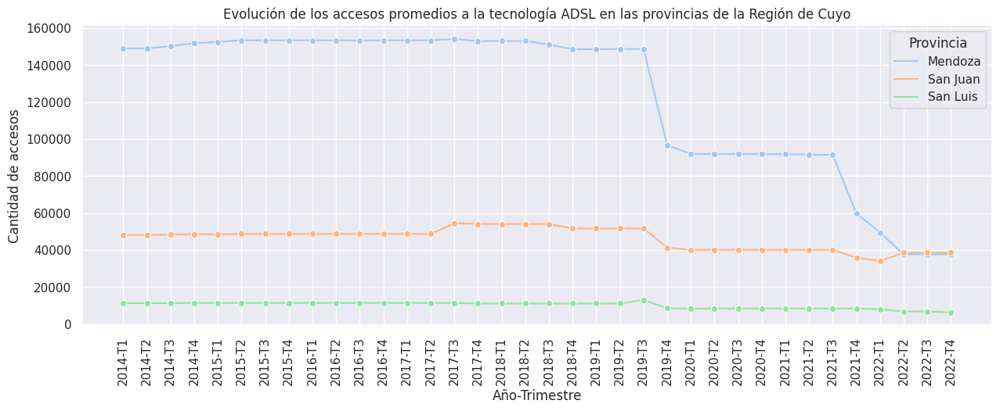

In [88]:
# Agrupar los datos por provincia y trimestre y calcular la media de "ADSL"
df_promedio = cuyo.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['ADSL'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='ADSL', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología ADSL en las provincias de la Región de Cuyo')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

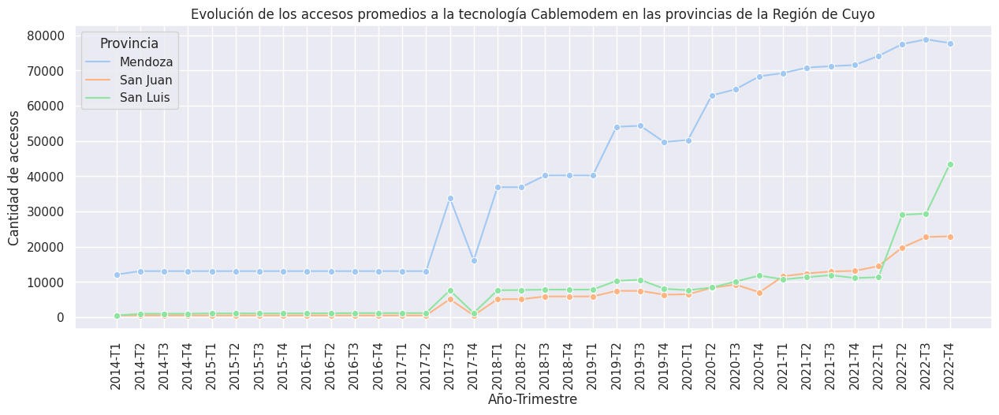

In [89]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Cablemodem"
df_promedio = cuyo.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Cablemodem'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Cablemodem', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología Cablemodem en las provincias de la Región de Cuyo')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

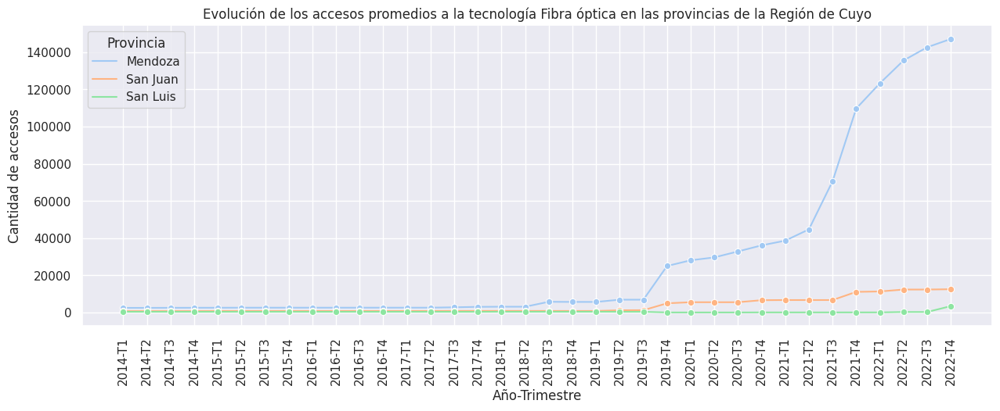

In [90]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Fibra óptica"
df_promedio = cuyo.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Fibra óptica'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Fibra óptica', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología Fibra óptica en las provincias de la Región de Cuyo')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

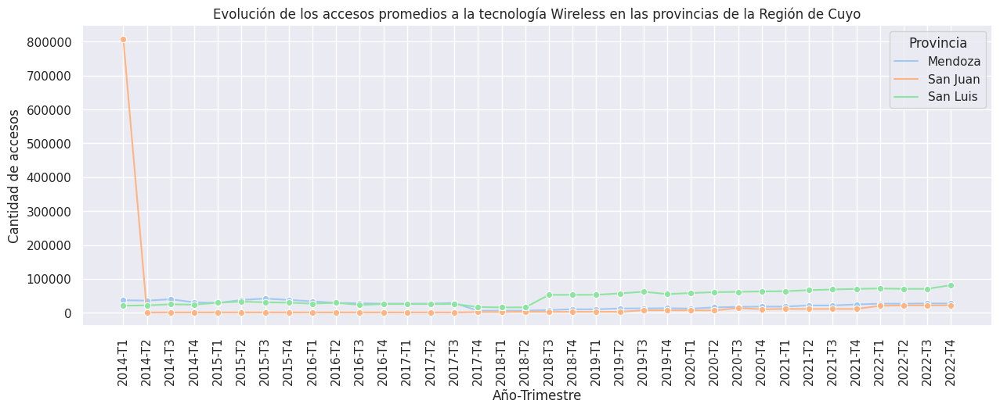

In [91]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Wireless"
df_promedio = cuyo.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Wireless'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Wireless', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología Wireless en las provincias de la Región de Cuyo')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

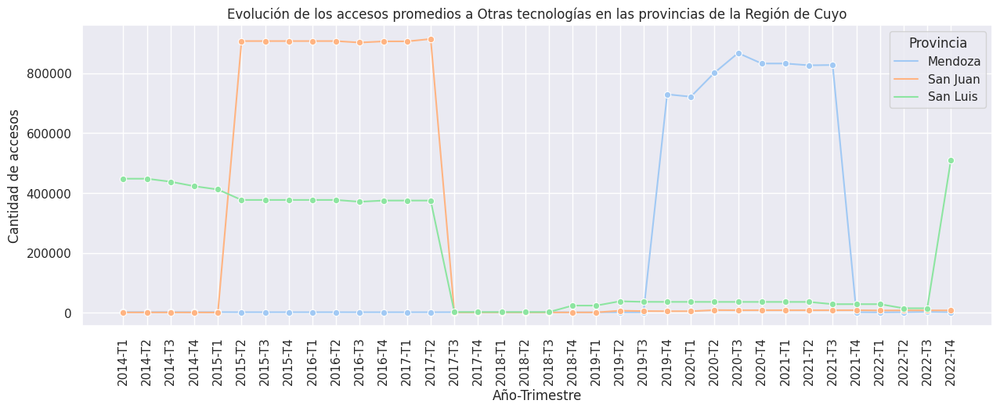

In [92]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Otros"
df_promedio = cuyo.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Otros'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Otros', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a Otras tecnologías en las provincias de la Región de Cuyo')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- La tecnología más utilizada en la región es la ADSL. En la mayoría de las provincias, el ADSL representa la mayor cantidad de accesos a la tecnología, seguido del cablemodem y wireless.

- Mientras que la tecnología menos utilizada en la región Patagonia en los años 2021 y 2022 es la fibra óptica. En todas las tres provincias de la región, la cantidad de accesos a la fibra óptica es muy baja en comparación con las demás tecnologías. Por ejemplo, en la provincia de Mendoza, la fibra óptica solo representa el 8.9% de todos los accesos a la tecnología, mientras que en San Juan representa solo el 4.6% y en San Luis representa solo el 0.1%.

- Por otro lado, la provincia que tiene la mayor cantidad total de accesos para todas las tecnologías en los años 2021 y 2022 es Mendoza, con un total de 1.6 millones de accesos en ambos años. Por otro lado, la provincia que tiene la menor cantidad total de accesos para todas las tecnologías en los años 2021 y 2022 es San Luis, con un total de 481  mil accesos en ambos años.



##### Región Pampeana

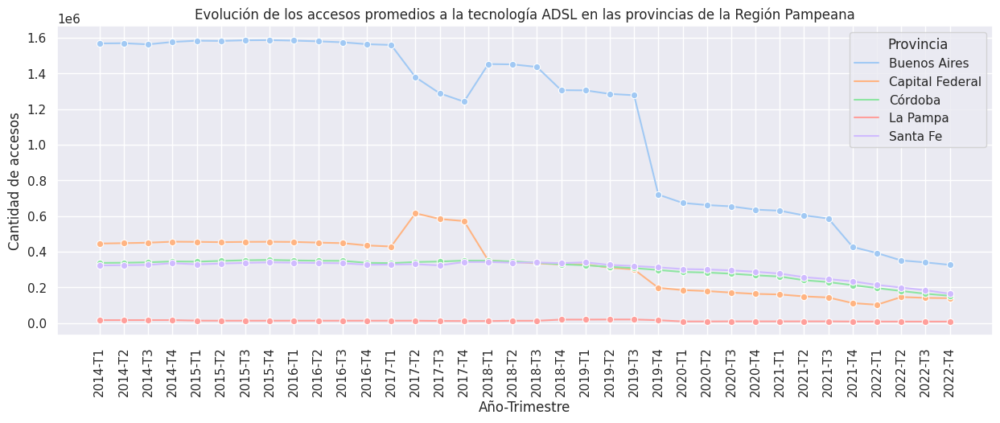

In [93]:
# Agrupar los datos por provincia y trimestre y calcular la media de "ADSL"
df_promedio = pampeana.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['ADSL'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='ADSL', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología ADSL en las provincias de la Región Pampeana')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

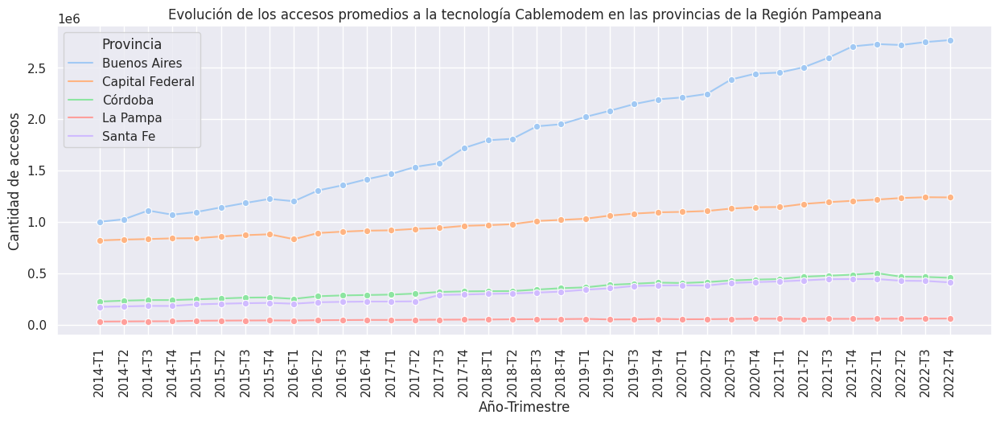

In [94]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Cablemodem"
df_promedio = pampeana.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Cablemodem'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Cablemodem', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología Cablemodem en las provincias de la Región Pampeana')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

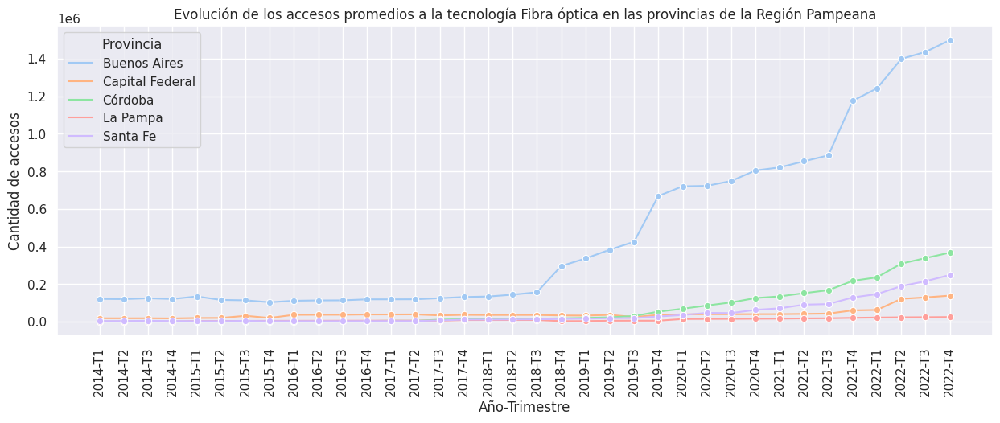

In [95]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Fibra óptica"
df_promedio = pampeana.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Fibra óptica'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Fibra óptica', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología Fibra óptica en las provincias de la Región Pampeana')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

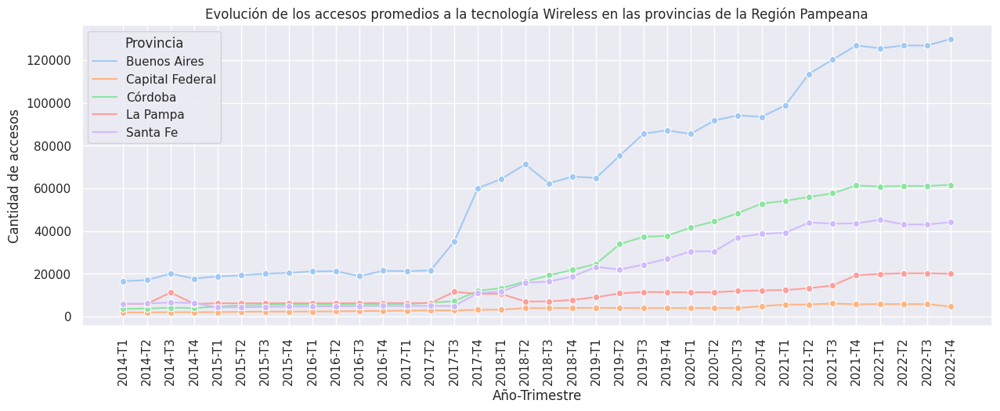

In [96]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Wireless"
df_promedio = pampeana.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Wireless'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Wireless', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología Wireless en las provincias de la Región Pampeana')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

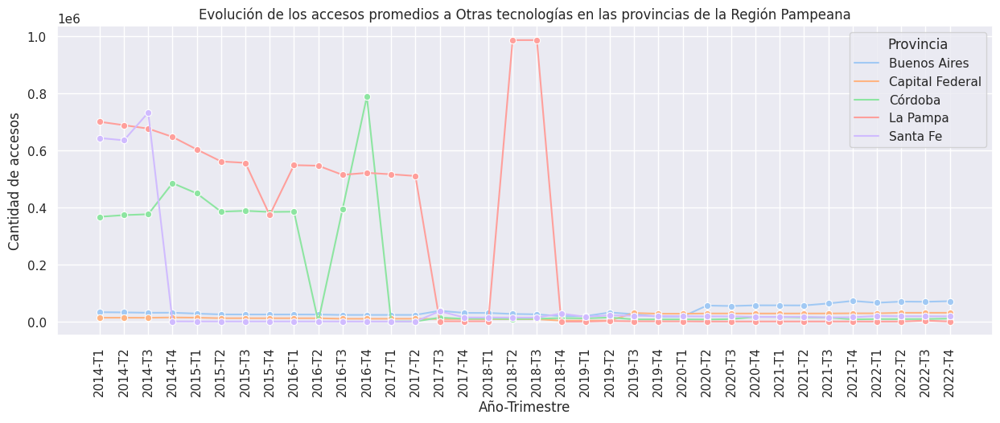

In [97]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Otros"
df_promedio = pampeana.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Otros'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Otros', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a Otras tecnologías en las provincias de la Región Pampeana')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- La tecnología más utilizada en la región pampeana en los años 2021 y 2022 es el cablemodem, seguida por la fibra óptica y el ADSL. La tecnología menos utilizada en la región pampeana durante esos años es la Wireless y las que corresponden a las categorías Otros.

- Por otro lado, la provincia que tiene la mayor cantidad total de accesos para todas las tecnologías en los años 2021 y 2022 es Buenos Aires, con un total de 24.6 millones de accesos en ambos años. Por otro lado, la provincia que tiene la menor cantidad total de accesos para todas las tecnologías en los años 2021 y 2022 es La Pampa, con un total de 1.2 millones de accesos en ambos años.



##### Región Noroeste

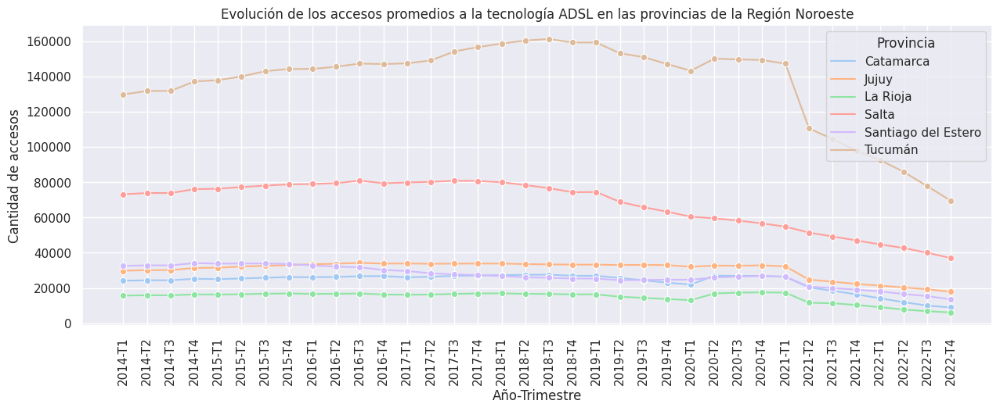

In [98]:
# Agrupar los datos por provincia y trimestre y calcular la media de "ADSL"
df_promedio = noroeste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['ADSL'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='ADSL', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología ADSL en las provincias de la Región Noroeste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

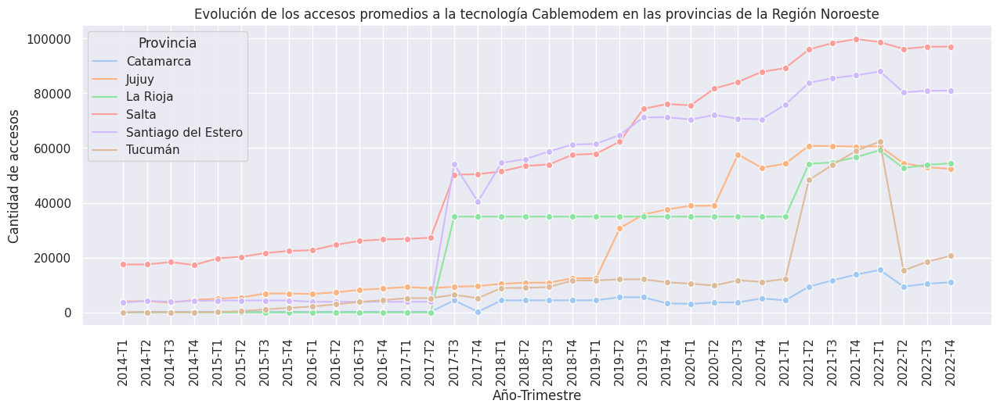

In [99]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Cablemodem"
df_promedio = noroeste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Cablemodem'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Cablemodem', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología Cablemodem en las provincias de la Región Noroeste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

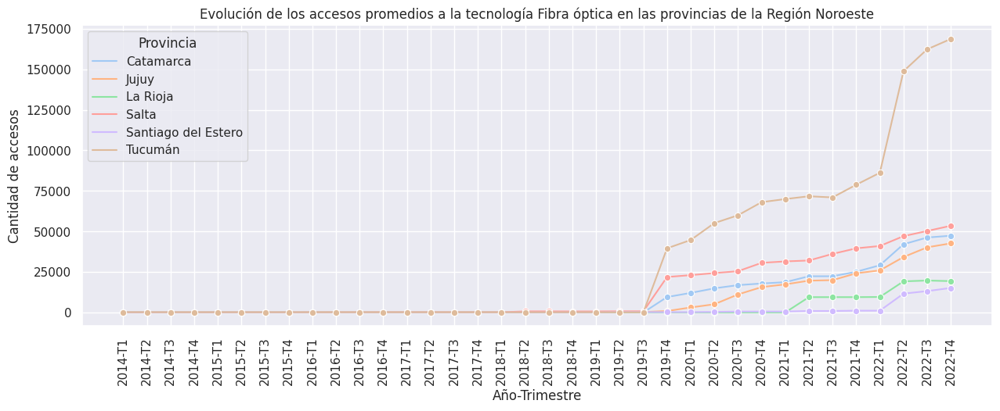

In [100]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Fibra óptica"
df_promedio = noroeste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Fibra óptica'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Fibra óptica', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología Fibra óptica en las provincias de la Región Noroeste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

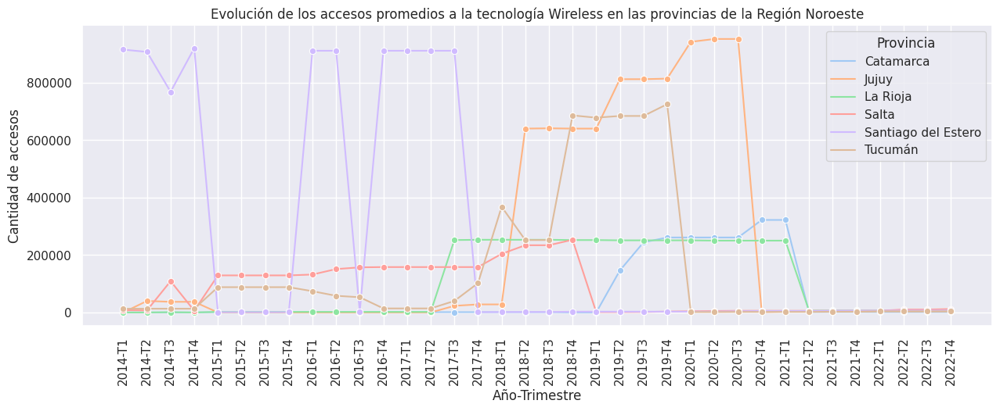

In [101]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Wireless"
df_promedio = noroeste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Wireless'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Wireless', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología Wireless en las provincias de la Región Noroeste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

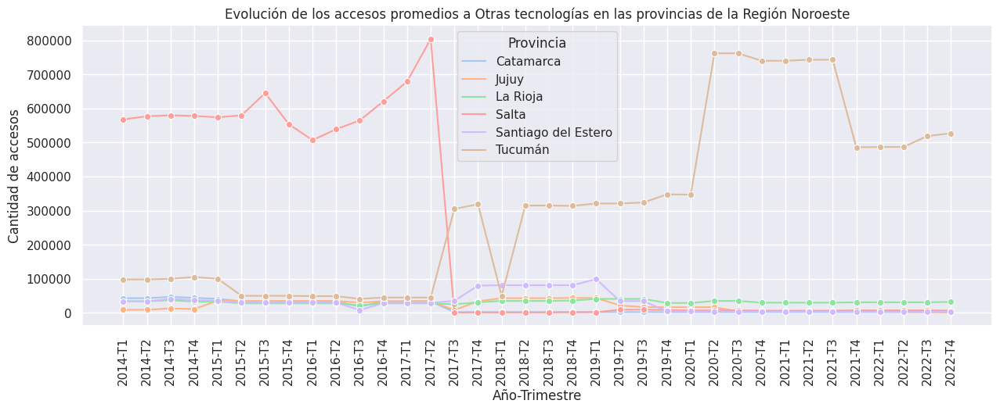

In [102]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Otros"
df_promedio = noroeste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Otros'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Otros', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a Otras tecnologías en las provincias de la Región Noroeste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- La tecnología Cablemodem es la tecnología más utilizada en la región noroeste de Argentina tanto en 2021 como en 2022 representando aproximadamente el 40% del total de los accesos para esta región, seguida por ADSL y la fibra óptica. Por otro lado, el wireless es la tecnología menos utilizada en ambas fechas representando menos del 1% del total de accesos.

- Por otro lado, la provincia con mayor cantidad de accesos para todas las tecnologías en 2021 y 2022 es Tucumán, seguida de la provincia de Salta. Mientras que la provincia con menor cantidad de accesos es Catamarca.

##### Región Noreste

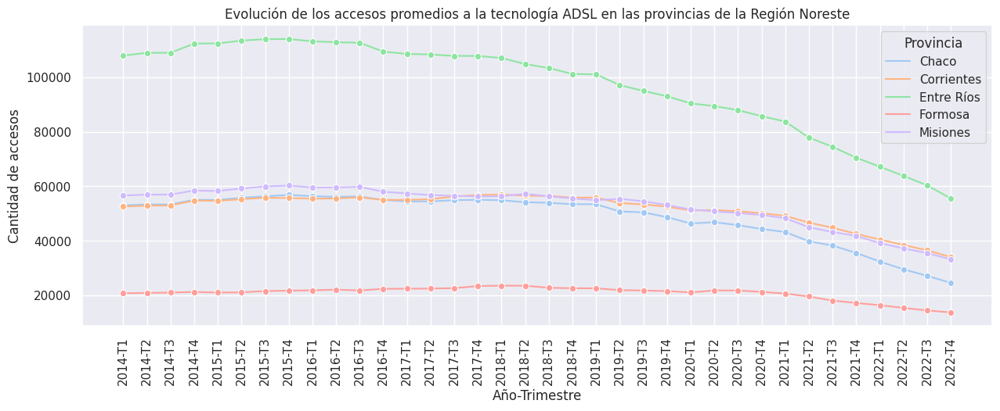

In [103]:
# Agrupar los datos por provincia y trimestre y calcular la media de "ADSL"
df_promedio = noreste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['ADSL'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='ADSL', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología ADSL en las provincias de la Región Noreste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

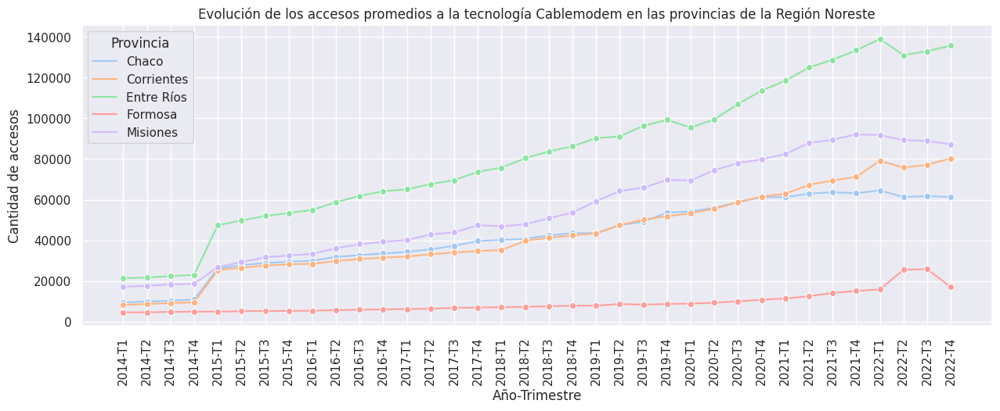

In [104]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Cablemodem"
df_promedio = noreste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Cablemodem'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Cablemodem', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología Cablemodem en las provincias de la Región Noreste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

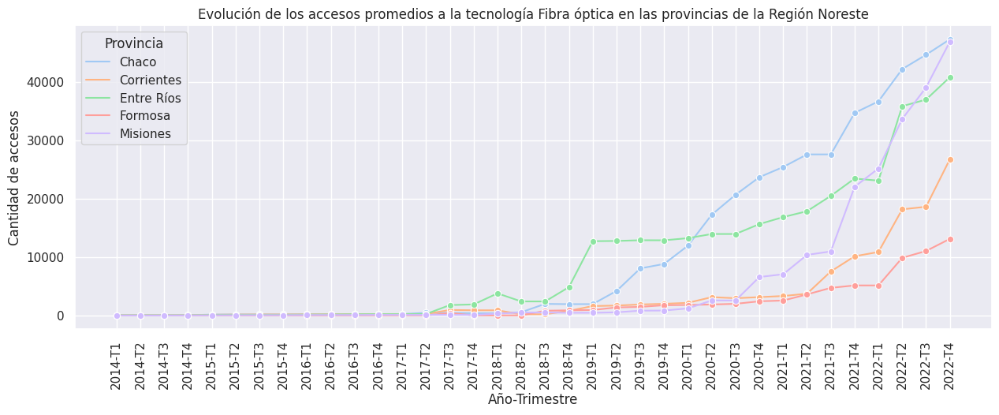

In [105]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Fibra óptica"
df_promedio = noreste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Fibra óptica'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Fibra óptica', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología Fibra óptica en las provincias de la Región Noreste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

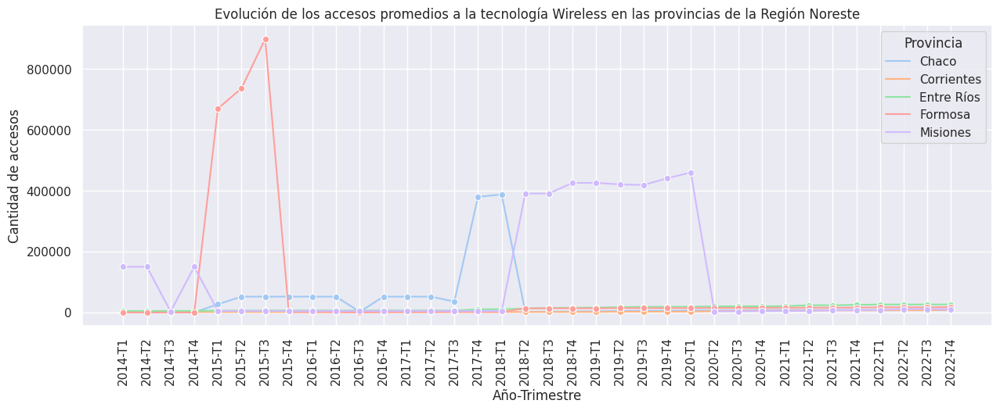

In [106]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Wireless"
df_promedio = noreste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Wireless'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Wireless', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a la tecnología Wireless en las provincias de la Región Noreste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

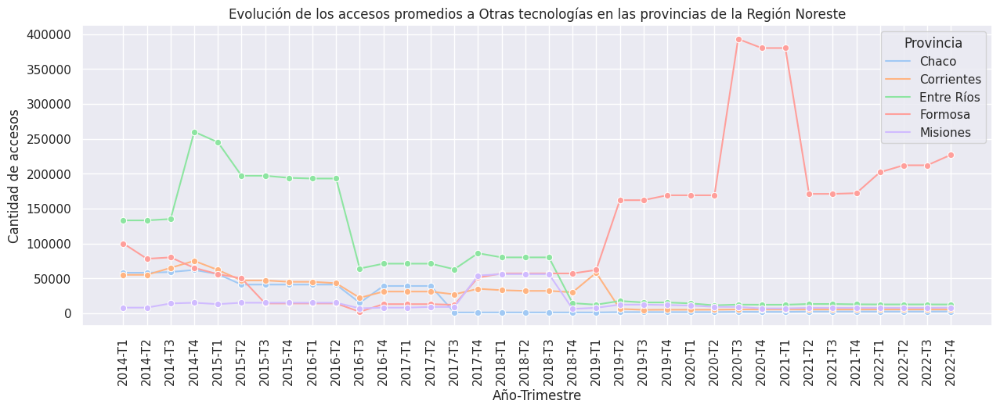

In [107]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Otros"
df_promedio = noreste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Otros'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize=(15, 5))
sns.lineplot(data=df_promedio, x='Año-Trimestre', y='Otros', hue='Provincia', style='Provincia', dashes=False,
             palette='pastel', marker = 'o')
# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución de los accesos promedios a Otras tecnologías en las provincias de la Región Noreste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- La tecnología más utilizada en la región noreste es el Cablemodem, seguida por ADSL y Wireless, y la tecnología menos utilizada es la Fibra óptica. Esto sugiere que la infraestructura de redes de banda ancha en la región noreste todavía tiene un largo camino por recorrer en términos de adoptar tecnologías de mayor velocidad y capacidad, como la Fibra óptica.

- Por otro lado, la provincia con mayor cantidad de accesos para todas las tecnologías en 2021 y 2022 es es Entre Ríos con un total de 1 millón de accesos. Mientras que la provincia con menor cantidad de accesos es Formosa, con un total de 264 mil accesos.

## Velocidad Media de bajada de Internet fijo
Serie histórica de la velocidad media de descarga de Internet nacional (trimestral)

In [39]:
# Definir la URL de la API y tu API key
url = "http://api.datosabiertos.enacom.gob.ar/api/v2/datastreams/VELOC-PROME-DE-BAJAD-51733/data.csv"
api_key = "5EBQMGTfMImArsNkwhQIuatPXtYfRNlAuSTuybbB"

# Realizar la solicitud a la API
response = requests.get(url, params={"auth_key": api_key, "limit": 3150})

# Verificar si la solicitud fue exitosa
if response.status_code == 200:
  # Leer el contenido del archivo CSV en memoria como una cadena de texto
  csv_data = response.content.decode("utf-8")

  # Crear un objeto DataFrame a partir de la cadena de texto
  velocidad_media_nacional = pd.read_csv(io.StringIO(csv_data))

else:
  # Mostrar un mensaje de error si la solicitud falló
  print("Error al hacer la solicitud a la API")

In [40]:
# Imprimir las primeras 5 filas de "velocidad_media_nacional"
velocidad_media_nacional.head()

,Año,Trimestre,Mbps (Media de bajada),Trimestre.1
0,2022,4,"106,56",Oct-Dic 2022
1,2022,3,"62,46",Jul-Sept 2022
2,2022,2,"58,44",Abr-Jun 2022
3,2022,1,"55,11",Ene-Mar 2022
4,2021,4,"52,34",Oct-Dic 2021


In [41]:
# Mostrar información del número de columnas, filas, tipos de datos y valores faltantes presentes en "velocidad_media_nacional"
velocidad_media_nacional.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36 entries, 0 to 35
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Año                     36 non-null     int64 
 1   Trimestre               36 non-null     int64 
 2   Mbps (Media de bajada)  36 non-null     object
 3   Trimestre.1             36 non-null     object
dtypes: int64(2), object(2)
memory usage: 1.2+ KB


Hay variables que no parecen estar en el formato correcto pero no hay valores nulos.

### Transformaciones en los datos

In [42]:
# Valores únicos en la columna "Año"
velocidad_media_nacional['Año'].unique()

array([2022, 2021, 2020, 2019, 2018, 2017, 2016, 2015, 2014])

In [43]:
# Renombrando algunas columnas de "velocidad_media_nacional"
velocidad_media_nacional.rename(columns = {'Trimestre.1': 'Periodo'}, inplace = True)
# Verificar que los cambios se realizaron correctamente
velocidad_media_nacional.columns

Index(['Año', 'Trimestre', 'Mbps (Media de bajada)', 'Periodo'], dtype='object')

In [44]:
# Reemplazar la abreviatura de Septiembre en la columna "Periodo"
velocidad_media_nacional['Periodo'] = velocidad_media_nacional['Periodo'].str.replace('Sept', 'Sep')
# Reemplazar filas de "velocidad_media_nacional" en las que las columnas 'Mbps (Media de bajada)' tengan ','
velocidad_media_nacional['Mbps (Media de bajada)'] = velocidad_media_nacional['Mbps (Media de bajada)'].str.replace(',', '.').astype(float)
# Verificar que los cambios se realizaron correctamente
velocidad_media_nacional.head(1)

,Año,Trimestre,Mbps (Media de bajada),Periodo
0,2022,4,106.56,Oct-Dic 2022


In [45]:
# Se crea una columna 'Fecha' combinando 'Año' y 'Trimestre' en un objeto de fecha
velocidad_media_nacional['Fecha'] = pd.to_datetime(velocidad_media_nacional['Año'].astype(str) + 'Q' + velocidad_media_nacional['Trimestre'].astype(str))

### Resumen Estadístico

In [46]:
# Mostrar un resumen estadístico de las columnas numériocas de "velocidad_media_nacional"
velocidad_media_nacional.describe()

,Año,Trimestre,Mbps (Media de bajada)
count,36.000000,36.000000,36.000000
mean,2018.000000,2.500000,24.180833
std,2.618615,1.133893,23.636605
min,2014.000000,1.000000,3.620000
25%,2016.000000,1.750000,5.335000
50%,2018.000000,2.500000,14.605000
75%,2020.000000,3.250000,41.092500
max,2022.000000,4.000000,106.560000


**Apreciaciones:**

- La velocidad media de bajada ha ido aumentando a lo largo del tiempo, desde un mínimo de 3.62 Mbps en 2014 hasta un máximo de 106.56 Mbps para el año 2022.

- La velocidad media de bajada en Argentina es relativamente baja en comparación con los estándares internacionales, ya que la media es de 24.18 Mbps.

- La velocidad media de bajada presenta una gran variabilidad, con una desviación estándar de 23.63 Mbps. Esto sugiere que hay una amplia gama de velocidades disponibles en el mercado, y que la calidad de la conexión a Internet puede ser muy diferente de un usuario a otro.

- El valor mediano de la velocidad media de bajada (14.6 Mbps) es significativamente menor que la media, lo que indica que hay una cantidad significativa de conexiones más lentas que arrastran el promedio hacia abajo.

### Análisis Univariable

A continuación, se realizarán algunas visualizaciones para explorar el conjunto de datos con más detalle. Primero, se observará la distribución de la velocidad media de bajada (Mbps):

#### ```Mbps (Media dde bajada)```

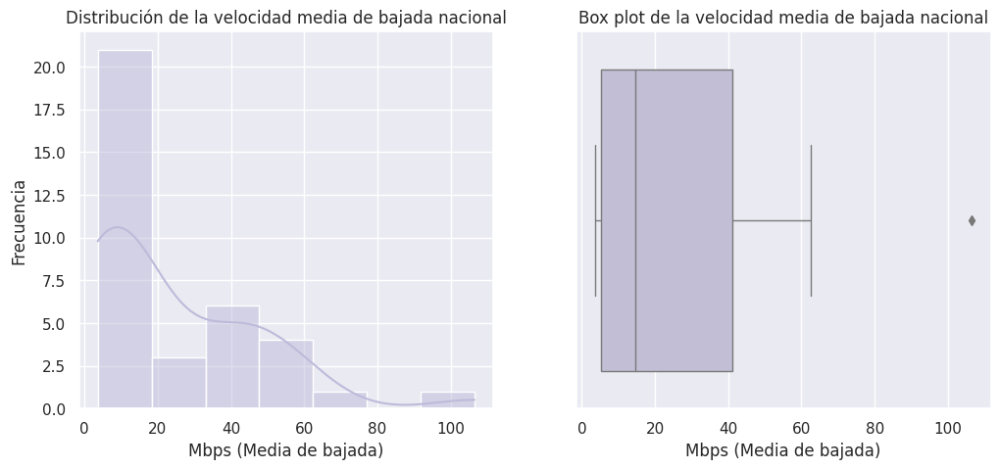

In [47]:
# Crear la figura con dos subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

# Histograma en el subplot de la izquierda "Mbps (Media de bajada)"
sns.histplot(data = velocidad_media_nacional, x = 'Mbps (Media de bajada)', kde =  True, color = '#BEBADA', ax = ax1)
ax1.set_title('Distribución de la velocidad media de bajada nacional')
ax1.set_xlabel('Mbps (Media de bajada)')
ax1.set_ylabel('Frecuencia')

# Box plot en el subplot de la derecha
sns.boxplot(data = velocidad_media_nacional, x = 'Mbps (Media de bajada)', color = '#BEBADA', linewidth = 1, ax = ax2)
ax2.set_title('Box plot de la velocidad media de bajada nacional')
ax2.set_xlabel('Mbps (Media de bajada)')

# Mostrar la figura
plt.show()

**Apreciación:**

- La distribución no es simétrica, lo que sugiere que hay una cantidad significativa de conexiones más lentas que arrastran el promedio hacia abajo, lo que lleva a que la mayoría de las velocidades de bajada se encuentren por debajo de los 30 Mbps. Aún así la distribución sugiere que hay relativamente pocas observaciones en el extremo derecho (más de 65 Mbps).

#### ```Trimestre```

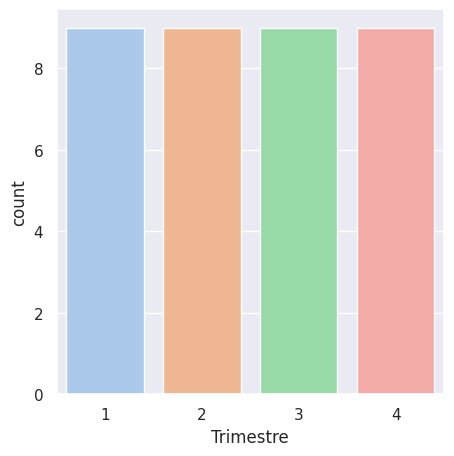

In [48]:
# Gráfico de barras de los trimestres
plt.figure(figsize = (5,5))
sns.countplot(data = velocidad_media_nacional, x = 'Trimestre')
# Mostrar la figura
plt.show()

**Apreciación:**

- El número de registros está distribuido de manera equitativa entre los cuatro trimestres, para cada uno de los años.

### Análisis Bivariable

#### ```Año``` vs ```Mbps (Media de bajada)```

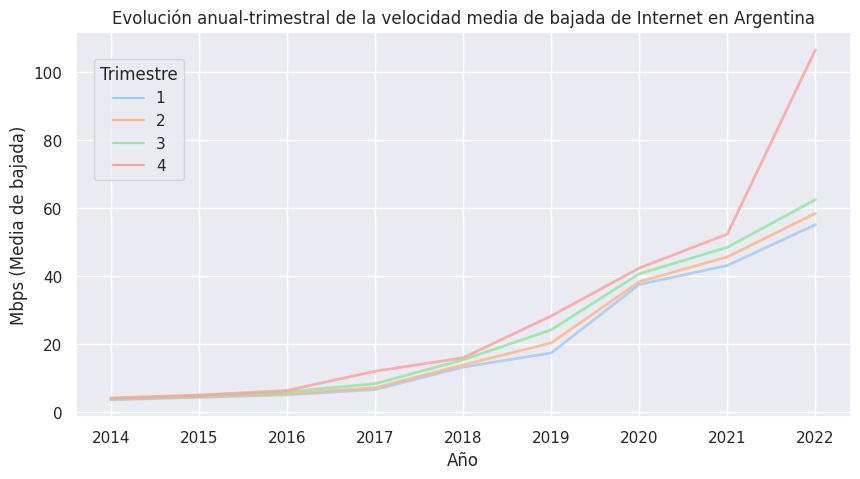

In [49]:
# Tamaño del gráfico
plt.figure(figsize  = (10, 5))

# Crear un gráfico de línea de la penetración del internet fijo por año y trimestre
sns.lineplot(x = 'Año', y = 'Mbps (Media de bajada)', hue = 'Trimestre', data = velocidad_media_nacional,
             palette = 'pastel', linewidth = 2, alpha = 0.8)

# Agregar etiquetas y leyenda
plt.title('Evolución anual-trimestral de la velocidad media de bajada de Internet en Argentina')
plt.xlabel('Año')
plt.ylabel('Mbps (Media de bajada)')
plt.legend(title = 'Trimestre', loc = 'upper right', bbox_to_anchor = (0.15, 0.95))

# Mostrar el gráfico completo
plt.show()

**Apreciaciones:**

- La velocidad media de bajada tiende a ser más alta en el tercer y cuarto trimestre de cada año, alcanzando su punto máximo en el cuarto trimestre de 2022 con una velocidad media por encima de los 100 Mbps.

- En contraste, la velocidad media de bajada tiende a ser más baja en el primer trimestre de cada año, con una velocidad media mínima de alrededor de los 55 Mbps en el primer trimestre de 2022.

- También se puede observar cierta variabilidad intertrimestral en la velocidad media de bajada, con aumentos y disminuciones en la velocidad media entre trimestres consecutivos.

- El cuaarto trimestre de 2022 muestra una velocidad media de bajada alrededor de los 105 MB, lo que representa un aumento significativo con respecto al mismo trimestre del año anterior (+50 MB) y sugiere que la tendencia al alza en la velocidad media de bajada continúa.

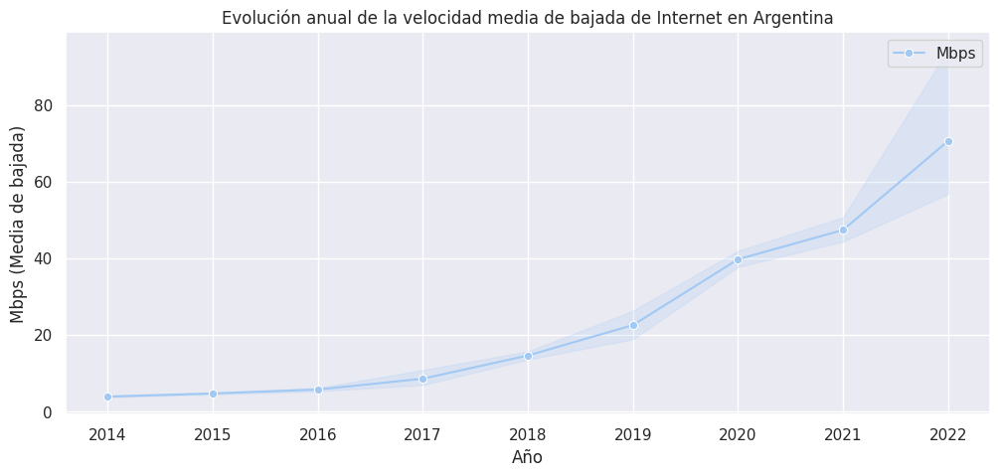

In [50]:
# Tamaño del gráfico
plt.figure(figsize = (12, 5))

# Graficar la evolución del Acceso al Internet fijo por Mbps (Media de bajada)
sns.lineplot(x = 'Año', y = 'Mbps (Media de bajada)', data = velocidad_media_nacional, label = 'Mbps', marker = 'o')

# Añade etiquetas a los ejes y al gráfico
plt.xlabel('Año')
plt.ylabel('Mbps (Media de bajada)')
plt.title('Evolución anual de la velocidad media de bajada de Internet en Argentina')

# Muestra el gráfico
plt.show()

**Apreciaciones:**

- Si bien la velocidad media de bajada de Internet fijo en Argentina ha ido aumentando constantemente desde 2014-2022, pero siendo mucho más significativo desde 2017 hasta 2022.

- La velocidad media de bajada en Argentina ha superado los 70 Mbps en el en 2022, lo que sugiere que se han producido mejoras significativas en la calidad de la conexión a Internet en los últimos años.

- La gráfica sugiere que la velocidad media de bajada en Argentina todavía está por debajo de los estándares internacionales, pero está mejorando constantemente.

#### ```Fecha``` vs ```Mbps (Media de bajada)```

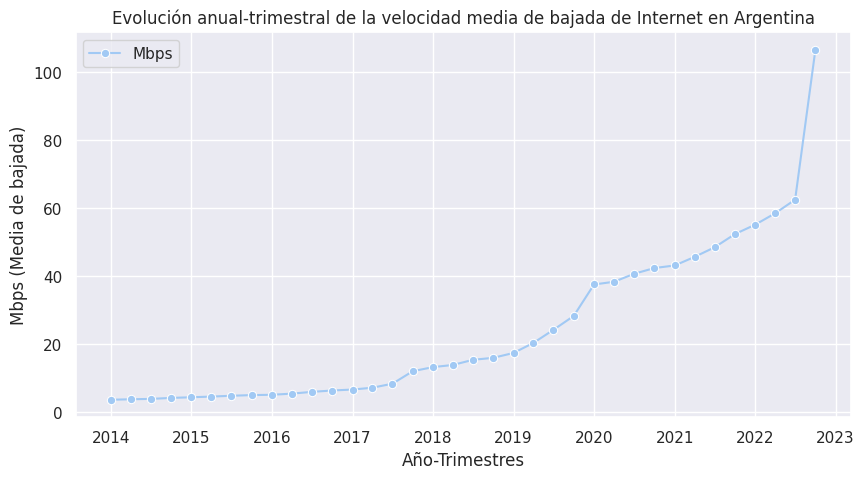

In [51]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(10, 5))

# Graficar la evolución del Acceso al Internet fijo por Mbps (Media de bajada)
sns.lineplot(x = 'Fecha', y = 'Mbps (Media de bajada)', data = velocidad_media_nacional, label = 'Mbps', marker = 'o')

# Agregar etiquetas de eje y título del gráfico
plt.xlabel("Año-Trimestres")
plt.ylabel("Mbps (Media de bajada)")
plt.title("Evolución anual-trimestral de la velocidad media de bajada de Internet en Argentina")

# Mostrar la figura
plt.show()

**Apreciaciones:**

- Del año 2014 al 2018: Se observa un aumento gradual en la velocidad media de bajada durante este período, pasando de alrededor de 4 Mbps en el primer trimestre de 2014 a alrededor de 20 Mbps en el cuarto trimestre de 2018. Aunque el aumento fue constante, la velocidad media de bajada en este período todavía estaba muy por debajo de los estándares internacionales.

- Del 2019 al 2020: En este período, se produjo un aumento significativo en la velocidad media de bajada. La velocidad media de bajada pasó de alrededor de 20 Mbps en el primer trimestre de 2019 a alrededor de 40 Mbps en el primer trimestre de 2020.

- Del 2020 al 2022: Durante este período, la velocidad media de bajada continuó aumentando significativamente, pasando de +40 Mbps en el tercer trimestre de 2020 a más de 60 Mbps en el tercer trimestre de 2022. Pero con un aumento exponencial del tercero al cuarto trimestre superon los 100 MB. Este período de dos años ha sido testigo de un aumento en la velocidad media de bajada de más de 100%.

## Velocidad media de bajada de Internet fijo por provincia

Serie histórica de la velocidad media de descarga de Internet por provincia (trimestral)

In [ ]:
# Definir la URL de la API y tu API key
url = "http://api.datosabiertos.enacom.gob.ar/api/v2/datastreams/VELOC-PROME-DE-BAJAD-DE/data.csv"
api_key = "5EBQMGTfMImArsNkwhQIuatPXtYfRNlAuSTuybbB"

# Realizar la solicitud a la API
response = requests.get(url, params={"auth_key": api_key, "limit": 3150})

# Verificar si la solicitud fue exitosa
if response.status_code == 200:
  # Leer el contenido del archivo CSV en memoria como una cadena de texto
  csv_data = response.content.decode("utf-8")

  # Crear un objeto DataFrame a partir de la cadena de texto
  velocidad_media_provincia = pd.read_csv(io.StringIO(csv_data))

else:
  # Mostrar un mensaje de error si la solicitud falló
  print("Error al hacer la solicitud a la API")

In [53]:
# Imprimir las primeras 5 filas de "velocidad_media_provincia"
velocidad_media_provincia.head()

,Año,Trimestre,Provincia,Mbps (Media de bajada)
0,2022,4,Buenos Aires,111.00
1,2022,4,Capital Federal,182.86
2,2022,4,Catamarca,83.33
3,2022,4,Chaco,104.02
4,2022,4,Chubut,15.92


In [54]:
# Mostrar información del número de columnas, filas, tipos de datos y valores faltantes presentes en "velocidad_media_provincia"
velocidad_media_provincia.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 864 entries, 0 to 863
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Año                     864 non-null    int64  
 1   Trimestre               864 non-null    int64  
 2   Provincia               864 non-null    object 
 3   Mbps (Media de bajada)  864 non-null    float64
dtypes: float64(1), int64(2), object(1)
memory usage: 27.1+ KB


La variable ```Mbps (Media de bajada)``` parece no estar en el formato correcto. Sin embargo, no hay valores nulos en el DataFrame.

### Transformaciones en los datos

In [55]:
velocidad_media_provincia['Provincia'].unique()

array(['Buenos Aires', 'Capital Federal', 'Catamarca', 'Chaco', 'Chubut',
       'Córdoba', 'Corrientes', 'Entre Ríos', 'Formosa', 'Jujuy',
       'La Pampa', 'La Rioja', 'Mendoza', 'Misiones', 'Neuquén',
       'Río Negro', 'Salta', 'San Juan', 'San Luis', 'Santa Cruz',
       'Santa Fe', 'Santiago del Estero', 'Tierra del Fuego', 'Tucumán'],
      dtype=object)

In [56]:
# Modificar algunos nombres de las provincias para mantener la uniformidad con los demás Dataframes
velocidad_media_provincia['Provincia'] = velocidad_media_provincia['Provincia'].str.replace('Santiago Del', 'Santiago del')
velocidad_media_provincia['Provincia'] = velocidad_media_provincia['Provincia'].str.replace('Tierra Del', 'Tierra del')

In [58]:
# Se crea una columna 'Fecha' combinando 'Año' y 'Trimestre' en un objeto de fecha
velocidad_media_provincia['Fecha'] = pd.to_datetime(velocidad_media_provincia['Año'].astype(str) + 'Q' + velocidad_media_provincia['Trimestre'].astype(str))

### Resumen estadístico

In [59]:
# Mostrar un resumen estadístico de las columnas numériocas de "velocidad_media_provincia"
velocidad_media_provincia.describe()

,Año,Trimestre,Mbps (Media de bajada)
count,864.000000,864.000000,864.000000
mean,2018.000000,2.500000,15.375150
std,2.583484,1.118682,18.321009
min,2014.000000,1.000000,2.570000
25%,2016.000000,1.750000,4.317500
50%,2018.000000,2.500000,7.415000
75%,2020.000000,3.250000,19.710000
max,2022.000000,4.000000,182.860000


**Apreciaciones:**

- La media de la velocidad de bajada de internet en las provincias de Argentina es de alrededor de 15.37 Mbps. Sin embargo, la desviación estándar es relativamente alta (18.32 Mbps), lo que indica que hay una gran variabilidad en los datos. Esto significa que algunas provincias pueden tener velocidades de internet mucho más altas o más bajas que la media.

- El valor mínimo observado en la columna "Mbps (Media de bajada)" es de 2.57 Mbps, lo que sugiere que algunas provincias pueden estar experimentando velocidades de internet muy bajas. El valor máximo observado es de 182.86 Mbps, lo que indica que algunas provincias tienen velocidades de internet muy altas.

- La mediana (percentil 50) de la velocidad de bajada es de 7.41 Mbps, lo que sugiere que la mitad de las observaciones están por debajo de este valor y la otra mitad están por encima. Esto ratifica que hay una gran cantidad de provincias que tienen velocidades de internet relativamente bajas.

- El percentil 75 de la velocidad de bajada es de 19.71 Mbps, lo que sugiere que el 75% de las observaciones están por debajo de este valor. Esto indica que hay algunas provincias con velocidades de internet relativamente altas, pero la mayoría de las provincias se encuentran por debajo de este valor.

### Análisis Univariable

A continuación, se realizarán algunas visualizaciones para explorar el conjunto de datos con más detalle. Primero, se observará la distribución de la cantidad velocidad media de bajada (Mbps):

#### ```Mbps (Media de bajada)```

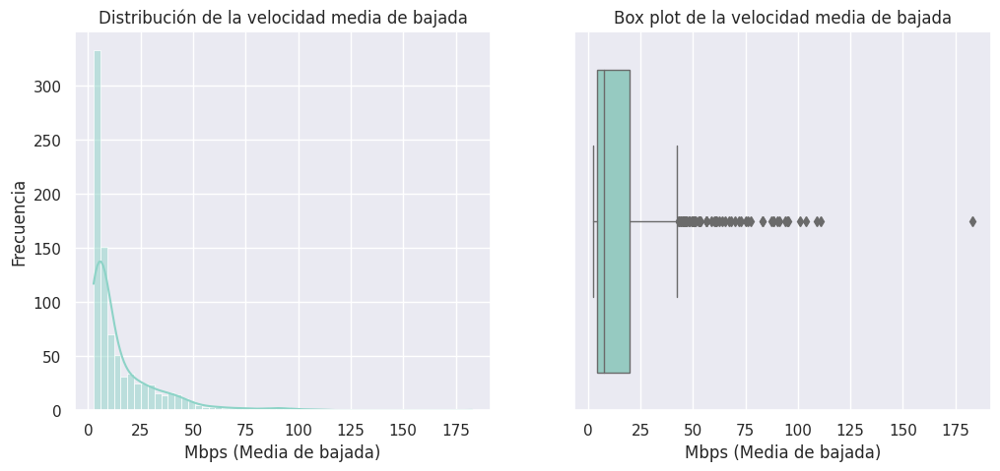

In [60]:
# Crear la figura con dos subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

# Histograma en el subplot de la izquierda "Mbps (Media de bajada)"
sns.histplot(data = velocidad_media_provincia, x = 'Mbps (Media de bajada)', kde =  True, color = '#8DD3C7', ax = ax1)
ax1.set_title('Distribución de la velocidad media de bajada')
ax1.set_xlabel('Mbps (Media de bajada)')
ax1.set_ylabel('Frecuencia')

# Box plot en el subplot de la derecha
sns.boxplot(data = velocidad_media_provincia, x = 'Mbps (Media de bajada)', color = '#8DD3C7', linewidth = 1, ax = ax2)
ax2.set_title('Box plot de la velocidad media de bajada')
ax2.set_xlabel('Mbps (Media de bajada)')

# Mostrar la figura
plt.show()

**Apreciaciones:**

- La distribución de la velocidad media de bajada está sesgada hacia la derecha, lo que sugiere que hay más provincias con velocidades de bajada de internet bajas que con velocidades de bajada de internet altas. Además, la distribución parece tener una cola larga hacia la derecha, lo que indica que hay algunas provincias con velocidades de bajada de internet muy altas.

- El boxplot a su vez indica que la mayoría de las observaciones se encuentran en el rango de 0 a 40 Mbps, con algunas observaciones que se extienden hasta más de 80 Mbps. Además, hay algunos valores atípicos por encima de 80 Mbps. Esto ratifica lo anterior expuesto con respecto a que aunque la mayoría de las provincias tienen velocidades de internet relativamente bajas, hay algunas provincias que tienen velocidades de internet muy altas.

- En general, este gráfico sugiere que la brecha digital entre las provincias puede ser muy amplia.

### Análisis Bivariable

#### ```Provincia``` vs ```Mbps (Media de bajada)```

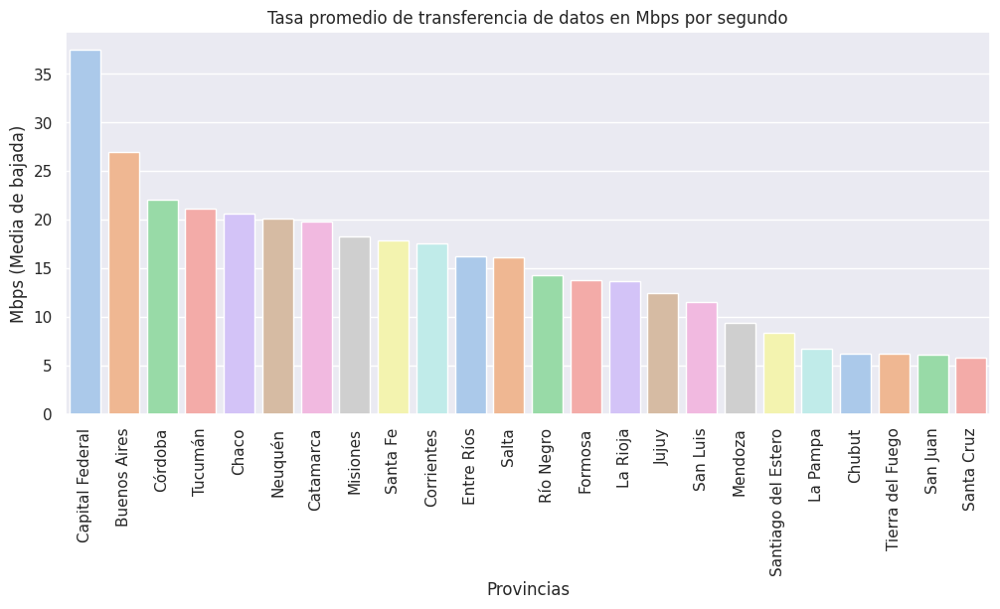

In [61]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(12, 5))

# Gráfico de barras de la columna "Provincia" vs "Mbps (Media de bajada)"
df_provincias = velocidad_media_provincia.groupby('Provincia')['Mbps (Media de bajada)'].mean().reset_index()
df_provincias = df_provincias.sort_values('Mbps (Media de bajada)', ascending = False)
sns.barplot(data=df_provincias, x='Provincia', y='Mbps (Media de bajada)', palette = 'pastel')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Tasa promedio de transferencia de datos en Mbps por segundo')
plt.xlabel('Provincias')
plt.ylabel('Mbps (Media de bajada)')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar la figura
plt.show()

**Apreciaciones:**

Este gráfico permite identificar fácilmente las diferencias en la calidad del servicio de Internet fijo en cada una de ellas:

- Se puede observar que la Capital Federal tiene la velocidad media de bajada más alta, seguida de la provincia de Buenos Aires. Estas dos provincias tienen velocidades de internet significativamente más altas que las demás provincias superando los 25 Mbps. Seguidas de 4 provincias con velocidades por encima de los 20 MB, pero están muy por debajo de las dos provincias principales mencionadas anteriormente.

- Por otro lado, las provincias de Mendoza, Santiago del Estero, La Pampa, Chubut, Tierra del Fuego, San Juan y Santa Cruz tienen las velocidades de internet más bajas, con valores de velocidad de bajada entre los 5-10 Mbps. Estas provincias tienen velocidades de internet significativamente más bajas que las demás provincias.

- En general, se puede observar que hay una gran variabilidad en la velocidad de internet en las diferentes provincias de Argentina, lo que sugiere que la brecha digital entre las provincias puede ser muy amplia. Además, la velocidad de internet varía significativamente entre la provincia con la velocidad más alta y la provincia con la velocidad más baja.

Hay que tomar en cuenta que este análisis, es sin considerar un año en particular.

### Análisis Multivariable

Para facilitar el análisis en cada una de las provincias, se procede a explorar los datos por regiones. Es importante tener en cuenta que, aunque estas divisiones se utilizarán para fines estadísticos y de análisis, no son necesariamente oficiales y pueden variar según la fuente que se consulte. Además que cada una de estas regiones tienen sus propias características y particularidades, y que pueden haber diferencias significativas en términos de acceso a la tecnología y otros indicadores socioeconómicos entre las provincias y regiones dentro de cada una de ellas.

#### ```Año``` vs ```Trimestre``` vs ```Provincia``` vs ```Mbps (Media de bajada)```

In [62]:
# Región Patagonia de Argentina
patagonia = velocidad_media_provincia[velocidad_media_provincia['Provincia'].isin(['Tierra del Fuego', 'Santa Cruz',
                                                                                 'Chubut', 'Neuquén', 'Río Negro'])]

# Región de Cuyo de Argentina
cuyo = velocidad_media_provincia[velocidad_media_provincia['Provincia'].isin(['Mendoza', 'San Luis', 'San Juan'])]

# Región Pampeana de Argentina
pampeana = velocidad_media_provincia[velocidad_media_provincia['Provincia'].isin(['Buenos Aires', 'Capital Federal',
                                                                                'Santa Fe', 'Córdoba', 'La Pampa'])]

# Región Noroeste de Argentina
noroeste = velocidad_media_provincia[velocidad_media_provincia['Provincia'].isin(['La Rioja', 'Catamarca', 'Tucumán',
                                                                                'Santiago del Estero', 'Salta', 'Jujuy'])]

# Región Noreste de Argentina
noreste = velocidad_media_provincia[velocidad_media_provincia['Provincia'].isin(['Chaco', 'Formosa', 'Corrientes',
                                                                               'Entre Ríos', 'Misiones'])]

##### Región Patagonia

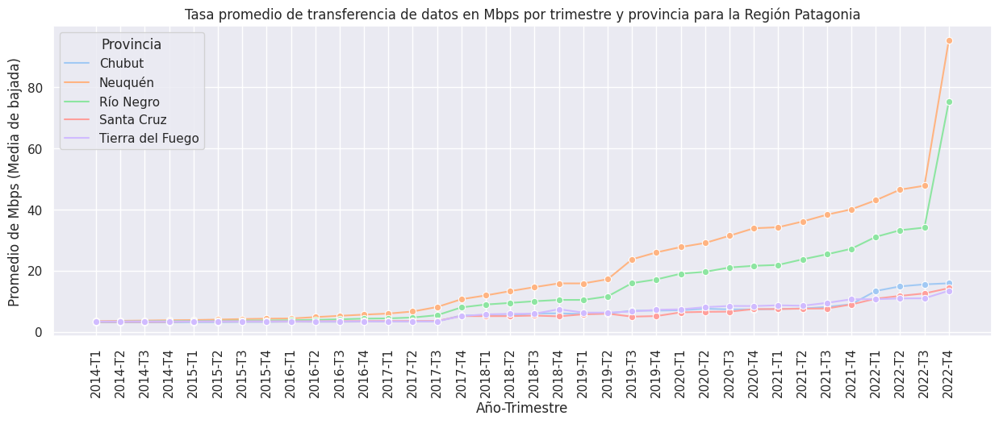

In [63]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Mbps (Media de bajada)"
df_promedio = patagonia.groupby(['Año','Trimestre','Provincia'], as_index=False)['Mbps (Media de bajada)'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y =  'Mbps (Media de bajada)', hue = 'Provincia',
             style = 'Provincia', dashes =  False, marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Tasa promedio de transferencia de datos en Mbps por trimestre y provincia para la Región Patagonia')
plt.xlabel('Año-Trimestre')
plt.ylabel('Promedio de Mbps (Media de bajada)')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
plt.show()

**Apreciaciones:**

- Se puede observar que la provincia de Neuquén tiene la tasa promedio de transferencia de datos más alta de la región Patagonia con +80 MBps, seguida de cerca por la provincia de Río Negro con +70 MBps. Las provincias de Chubut, Santa Cruz y Tierra del Fuego tienen tasas promedio de transferencia de datos relativamente similares, pero todas están por debajo de las dos provincias principales mencionadas anteriormente con menos de 20 MBps.

- Además, se puede observar que la tasa promedio de transferencia de datos en todas las provincias de la región Patagonia tiende a fluctuar a lo largo del tiempo. En general, la tasa promedio de transferencia de datos presentó un alto crecimiento a raíz del tercer trimestre del año 2019 hacia el tercer trimestre del año 2022 específicamente en las provincias de Neuquén y Río Negro. Sumado a que presentaron un crecimiento significativo en el cuarto trimestre del año 2022 aumentando más de 35 MBps en sólo 3 meses.

##### Región de Cuyo

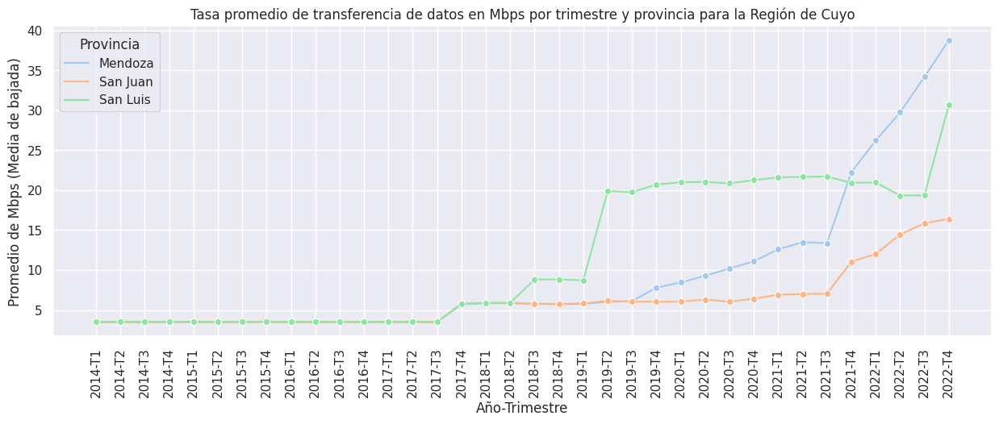

In [64]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Mbps (Media de bajada)"
df_promedio = cuyo.groupby(['Año','Trimestre','Provincia'], as_index=False)['Mbps (Media de bajada)'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y =  'Mbps (Media de bajada)', hue = 'Provincia',
             style = 'Provincia', dashes =  False, marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Tasa promedio de transferencia de datos en Mbps por trimestre y provincia para la Región de Cuyo')
plt.xlabel('Año-Trimestre')
plt.ylabel('Promedio de Mbps (Media de bajada)')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
plt.show()

**Apreciaciones:**

- Se puede observar que la provincia de San Luis desde el tercer trimestre del año 2018 presentó la tasa promedio de transferencia de datos más alta de la región de Cuyo, seguida de cerca por la provincia de Mendoza hasta el tercer trimestre del año 2021. Sin embargo, esto cambia a partir del cuarto trimestre del año 2021 cuando en la provincia de Mendoza la tasa promedio de transferencia de datos más alta de la región de Cuyo.

- La provincia de San Juan tiene la tasa promedio de transferencia de datos más baja de la región de Cuyo.

##### Región Pampeana

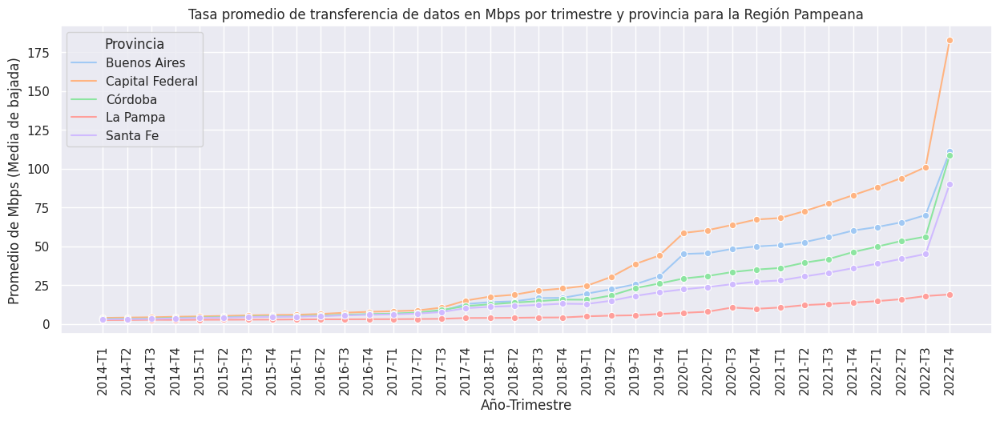

In [65]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Mbps (Media de bajada)"
df_promedio = pampeana.groupby(['Año','Trimestre','Provincia'], as_index=False)['Mbps (Media de bajada)'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y =  'Mbps (Media de bajada)', hue = 'Provincia',
             style = 'Provincia', dashes =  False, marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Tasa promedio de transferencia de datos en Mbps por trimestre y provincia para la Región Pampeana')
plt.xlabel('Año-Trimestre')
plt.ylabel('Promedio de Mbps (Media de bajada)')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
plt.show()

**Apreciaciones:**

- Se puede observar que la Capital Federal tiene la tasa promedio de transferencia de datos más alta de la región Pampeana para el cuarto trimestre del año 2022 con más de 175 MBps. Seguida por las provincias de Buenos Aires y Córdoba con más de 100 MBps, y la provincia de Santa Fe detrás ccon más de 75 MBps.

- La provincia de La Pampa es la que menor promedio de transferia de datos tiene con menos de 25 MBps.

- Además, se puede observar que la tasa promedio de transferencia de datos en todas las provincias de la región Pampeana tiende a fluctuar a lo largo del tiempo. En general, la tasa promedio de transferencia de datos comenzó a tener un mayor crecimiento a raíz del segundo trimestre del año 2019, siendo mucho más alto desde el primer trimestre del año 2020, lo que puede estar relacionado con el aumento de la demanda de internet debido a la pandemia de COVID-19.

##### Región Noroeste

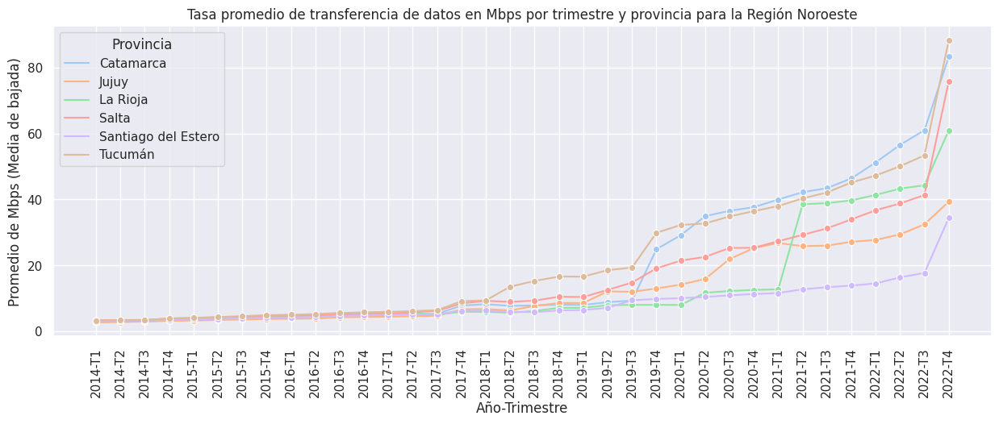

In [66]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Mbps (Media de bajada)"
df_promedio = noroeste.groupby(['Año','Trimestre','Provincia'], as_index=False)['Mbps (Media de bajada)'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y =  'Mbps (Media de bajada)', hue = 'Provincia',
             style = 'Provincia', dashes =  False, marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Tasa promedio de transferencia de datos en Mbps por trimestre y provincia para la Región Noroeste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Promedio de Mbps (Media de bajada)')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
plt.show()

**Apreciación:**

- Para el cuarto trimestre del año 2022 las provincias de Tucumán, Catamarca, Salta y La Rioja presentan una tasa promedio de transferencia de más de 60 MBps. Mientras que Jujuy y Santiago del Estero están por debajo de los 40 MBps.

- Un aspecto interesante es que todas las provincias parecen haber experimentado un aumento en la tasa promedio de transferencia de datos durante el segundo y tercer trimestre de 2019, presentando un aumento significado para el segundo trimestre del año 2020. Lo que puede estar relacionado con el aumento de la demanda de internet debido a la pandemia de COVID-19.

##### Región Noreste

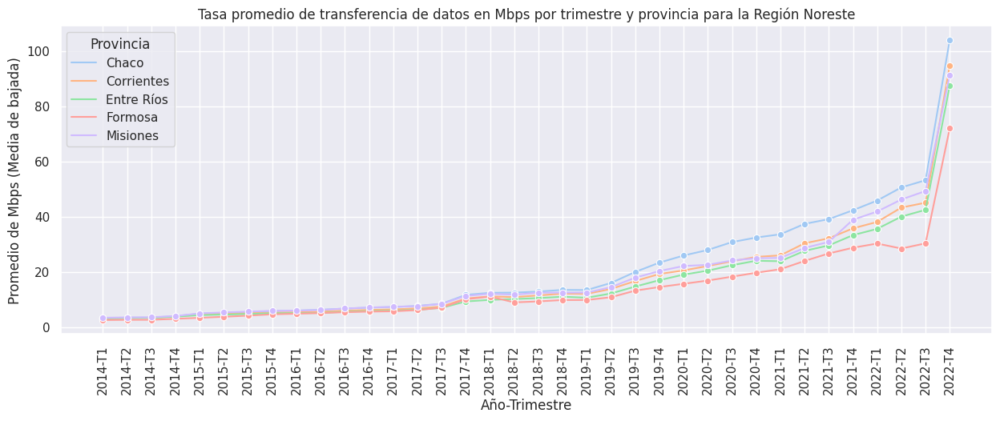

In [67]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Mbps (Media de bajada)"
df_promedio = noreste.groupby(['Año','Trimestre','Provincia'], as_index=False)['Mbps (Media de bajada)'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y =  'Mbps (Media de bajada)', hue = 'Provincia',
             style = 'Provincia', dashes =  False, marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Tasa promedio de transferencia de datos en Mbps por trimestre y provincia para la Región Noreste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Promedio de Mbps (Media de bajada)')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
plt.show()

**Apreciación:**

- Se puede observar que la provincia de Chaco tiene la tasa promedio de transferencia de datos más alta de la región Noreste, seguida de cerca por la provincia de Misiones, Corrientes y Entre Ríos. Pese a que todas las provincias superan los 30 Mbps, Formosa es la que presenta la tasa de transferencia mas baja.

#### ```Provincia``` vs ```Año``` vs ```Mbps (Media de bajada)```

**Mapa de accesos para tecnología Mbps (Media de bajada)**

Este mapa proporcionará un resumen de los años más recientes, específicamente 2021 y 2022. Aunque solo se tienen datos hasta el tercer trimestre del año 2022, estos años pueden brindar una imagen más precisa de la situación actual del mercado. Se presentará información clave sobre los niveles de acceso para la tecnología Mbps (Media de bajada) en Argentina para ambos años, lo que permitirá visualizar mejor la distribución del acceso a lo largo del país.

In [68]:
# Leer un archivo .csv con las latitudes y longitudes de cada una de las provincias de Argentina
geo_arg = pd.read_csv('geo_argentina.csv', encoding = 'ISO 8859-1')
# Se crea un dataframe con los datos correspondientes a los años 2021 y 2022
mbps = velocidad_media_provincia[velocidad_media_provincia['Año'] >= 2021][['Provincia', 'Año',
                                                                                       'Mbps (Media de bajada)']]

# Se unen los Dataframes "geo_arg" y "mbps" utilizando la columna "provincia" con punto de unión
data = pd.merge(geo_arg, mbps, on = 'Provincia')

# Se agrupan los datos por provincia y año conservando la latitud y longitud de cada provincia
mapa_accesos = data.groupby(['Provincia','Año'], as_index = False).agg({'Mbps (Media de bajada)': 'mean',
                                                                        'Latitud': 'first', 'Longitud': 'first'})
# Cargar el archivo geojson de provincias de Argentina
mapa = gpd.read_file('ProvinciasArgentina.geojson')

# Se fusionan los datos de acceso a las tecnologías por provincia con el archivo GeoJSON de las provincias de Argentina
provincias_accesos = mapa.merge(mapa_accesos, left_on = 'nombre',
                                           right_on = 'Provincia', how = 'outer')
# Se convierte el sistema de coordenadas a uno proyectado
provincias_accesos = provincias_accesos.to_crs(epsg = 3857)

# Se crean dos Dataframes con la data respectiva para cada año
data_2021 = provincias_accesos[provincias_accesos['Año'] == 2021].copy()
data_2022 = provincias_accesos[provincias_accesos['Año'] == 2022].copy()

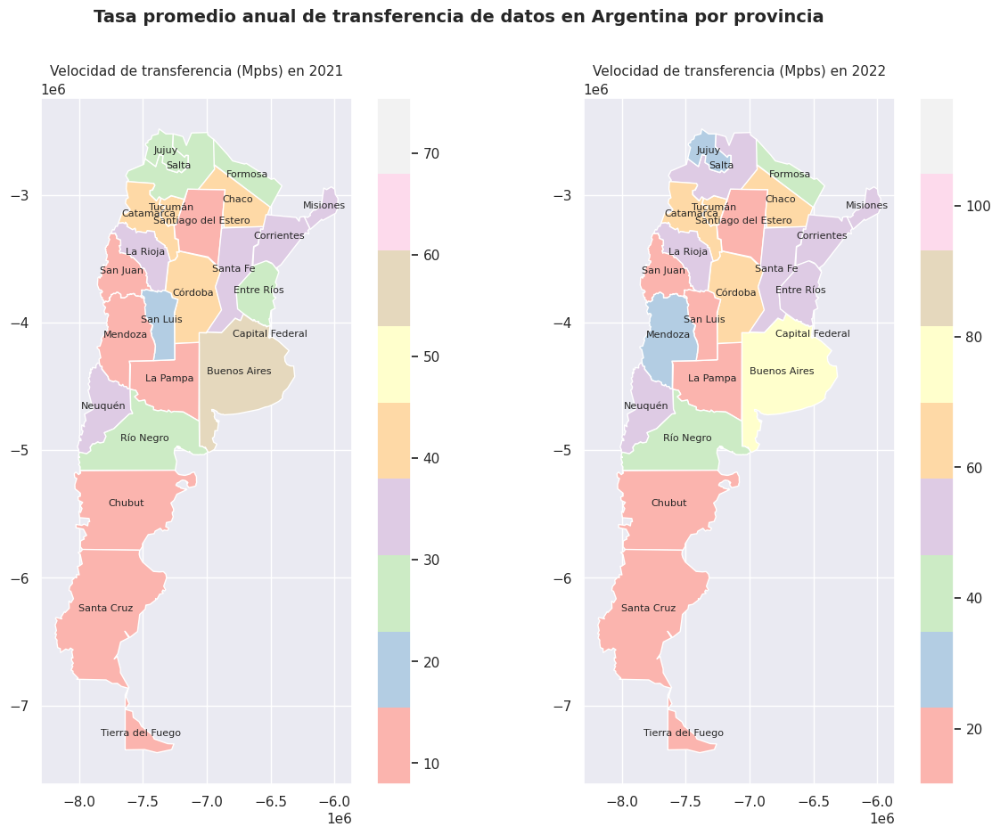

In [69]:
# Crear una figura con dos ejes
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (15, 10))

# Trazar el mapa para la columna Mbps (Media de bajada) en el eje izquierdo
data_2021.plot(column = 'Mbps (Media de bajada)', cmap = 'Pastel1', legend = True, ax = ax1)
ax1.set_title('Velocidad de transferencia (Mpbs) en 2021', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Mbps (Media de bajada)
data_2021['coords'] = data_2021['geometry'].centroid
for idx, row in data_2021.iterrows():
  ax1.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Trazar el mapa para la columna Mbps (Media de bajada) en el eje derecho
data_2022.plot(column = 'Mbps (Media de bajada)', cmap = 'Pastel1', legend = True, ax = ax2)
ax2.set_title('Velocidad de transferencia (Mpbs) en 2022', fontsize = 11)

# Mostrar los nombres de las provincias en el mapa de Mbps (Media de bajada)
data_2022['coords'] = data_2022['geometry'].centroid
for idx, row in data_2022.iterrows():
  ax2.annotate(text = row['nombre'], xy = row['coords'].coords[0], ha = 'center', fontsize = 8)

# Ajustar el espaciado entre los dos ejes
fig.subplots_adjust(wspace = 0.1)

# Agregar un título general a la figura
fig.suptitle('Tasa promedio anual de transferencia de datos en Argentina por provincia', fontsize = 14,
             fontweight = 'bold')

# Mostrar la figura
plt.show()

**Gráfico de barras agrupadas para la tasa promedio anual de transferencia de datos por provincia**

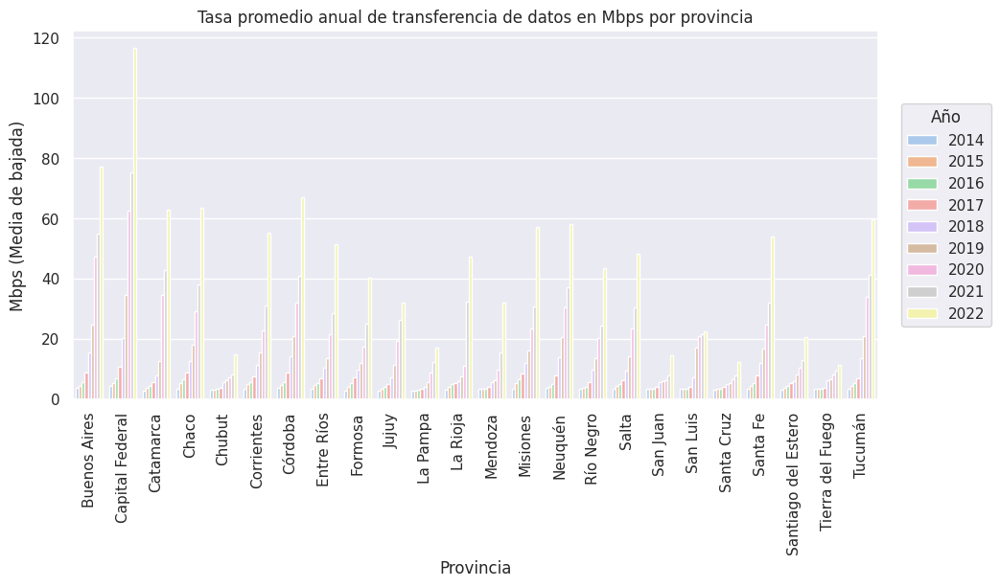

In [70]:
# Agrupar los datos por provincia y año y calcular la tasa promedio de transferencia de datos
df_resumen = velocidad_media_provincia.groupby(['Provincia', 'Año'])['Mbps (Media de bajada)'].mean().reset_index()

# Generar el gráfico de barras agrupadas con Seaborn
fig, ax = plt.subplots(figsize = (12, 5))
sns.barplot(x = 'Provincia', y = 'Mbps (Media de bajada)', hue = 'Año', data = df_resumen, ax = ax)

# Actualizar las opciones del diseño del gráfico
ax.set_title('Tasa promedio anual de transferencia de datos en Mbps por provincia')
ax.set_xlabel('Provincia')
ax.set_ylabel('Mbps (Media de bajada)')
ax.tick_params(axis = 'x', rotation = 90)

# Agregar título a la leyenda
ax.legend(title = 'Año', ncol = 1, bbox_to_anchor = (1.15, 0.5), loc = 'center right')
# Ajustar el espacio entre el gráfico y la leyenda
plt.subplots_adjust(left = 0.2)
# Mostrar el gráfico
plt.show()

**Apreciaciones finales:**

- En general, todas las provincias presentan una crecimiento en la velocidad media mostrando una tendencia constante al alza en los últimos años, principalmente para el año 2022.

- En base a los análisis realizados, se puede concluir que la tasa promedio de transferencia de datos en Mbps varía significativamente entre las provincias de Argentina y fluctúa a lo largo del tiempo. Además, para el año 2022 sólo 5 provincias superan los 60 Mbps de transferencia, mientras que 15 superan los 40.

- En contraste para el mismo año 5 provincias están por debajo de los 20 Mbps. Lo cual puede ser un dato interesante, ya que pueden ser provincias que requieran más inversión en infraestructura y un posible insight valioso para las empresas de telecomunicaciones y para otros actores interesados en el desarrollo digital de las regiones menos favorecidas.

## Distribución de los accesos totales nacionales a Internet fijo por velocidad

Distribución de los accesos totales nacionales a Internet fijo por velocidad de bajada (último trimestre disponible)

In [72]:
# Definir la URL de la API y tu API key
url = "http://api.datosabiertos.enacom.gob.ar/api/v2/datastreams/TOTAL-NACIO-DE-ACCES-32663/data.csv"
api_key = "5EBQMGTfMImArsNkwhQIuatPXtYfRNlAuSTuybbB"

# Realizar la solicitud a la API
response = requests.get(url, params={"auth_key": api_key, "limit": 3150})

# Verificar si la solicitud fue exitosa
if response.status_code == 200:
  # Leer el contenido del archivo CSV en memoria como una cadena de texto
  csv_data = response.content.decode("utf-8")

  # Crear un objeto DataFrame a partir de la cadena de texto
  acceso_nacional_velocidad = pd.read_csv(io.StringIO(csv_data))

else:
  # Mostrar un mensaje de error si la solicitud falló
  print("Error al hacer la solicitud a la API")

In [73]:
# Imprimir las primeras 5 filas de "penetracion_internet_fijo"
acceso_nacional_velocidad.head()

,Año,Trimestre,Hasta 512 kbps,Entre 512 Kbps y 1 Mbps,Entre 1 Mbps y 6 Mbps,Entre 6 Mbps y 10 Mbps,Entre 10 Mbps y 20 Mbps,Entre 20 Mbps y 30 Mbps,Más de 30 Mbps,OTROS,Total,Unnamed: 11
0,2022,4,31.981,85.668,1.075.272,1.109.421,765.015,335.573,7.410.902,394.282,11.208.114,NaN
1,2022,3,33.013,96.727,1.161.370,1.151.906,823.505,479.822,6.995.750,349.035,11.091.128,NaN
2,2022,2,33.667,99.498,1.193.090,1.197.030,856.562,485.321,6.741.922,351.594,10.958.684,NaN
3,2022,1,34.890,104.840,1.263.273,1.209.148,967.508,509.830,6.336.187,198.333,10.624.009,NaN
4,2021,4,41.262,28.521,1.413.208,1.245.333,976.539,558.358,6.032.322,194.251,10.489.794,NaN


In [74]:
# Mostrar información del número de columnas, filas, tipos de datos y valores faltantes en "acceso_nacional_velocidad"
acceso_nacional_velocidad.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36 entries, 0 to 35
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Año                      36 non-null     int64  
 1   Trimestre                36 non-null     int64  
 2   Hasta 512 kbps           36 non-null     float64
 3   Entre 512 Kbps y 1 Mbps  36 non-null     float64
 4   Entre 1 Mbps y 6 Mbps    36 non-null     object 
 5   Entre 6 Mbps y 10 Mbps   36 non-null     object 
 6   Entre 10 Mbps y 20 Mbps  36 non-null     object 
 7   Entre 20 Mbps y 30 Mbps  36 non-null     object 
 8   Más de 30 Mbps           36 non-null     object 
 9   OTROS                    36 non-null     float64
 10  Total                    36 non-null     object 
 11  Unnamed: 11              0 non-null      float64
dtypes: float64(4), int64(2), object(6)
memory usage: 3.5+ KB


Las variables parecen estar en el formato correcto y no hay valores nulos.

### Transformación en los datos

In [75]:
# Valores únicos en la columna "Año"
acceso_nacional_velocidad['Año'].unique()

array([2022, 2021, 2020, 2019, 2018, 2017, 2016, 2015, 2014])

In [76]:
# Valores únicos en la columna "Trimestre"
acceso_nacional_velocidad['Trimestre'].unique()

array([4, 3, 2, 1])

In [77]:
acceso_nacional_velocidad.drop(columns="Unnamed: 11", inplace = True)

In [78]:
# Renombrando algunas columnas de "acceso_nacional_velocidad"
acceso_nacional_velocidad.rename(columns = {'OTROS':'Otros'}, inplace = True)
# Verificar que los cambios se realizaron correctamente
acceso_nacional_velocidad.columns

Index(['Año', 'Trimestre', 'Hasta 512 kbps', 'Entre 512 Kbps y 1 Mbps',
       'Entre 1 Mbps y 6 Mbps', 'Entre 6 Mbps y 10 Mbps',
       'Entre 10 Mbps y 20 Mbps', 'Entre 20 Mbps y 30 Mbps', 'Más de 30 Mbps',
       'Otros', 'Total'],
      dtype='object')

In [79]:
# Convertir la columna "Dial upHasta 512 kbps" a tipo de dato int
acceso_nacional_velocidad['Hasta 512 kbps'] = (acceso_nacional_velocidad['Hasta 512 kbps'] * 1000).astype(int)
# Convertir la columna "Entre 512 Kbps y 1 Mbps" a tipo de dato int
acceso_nacional_velocidad['Entre 512 Kbps y 1 Mbps'] = (acceso_nacional_velocidad['Entre 512 Kbps y 1 Mbps'] * 1000).astype(int)
# Convertir la columna "Otros" a tipo de dato int
acceso_nacional_velocidad['Otros'] = (acceso_nacional_velocidad['Otros'] * 1000).astype(int)

In [80]:
# Convertir la columna "Entre 1 Mbps y 6 Mbps" a numérica
acceso_nacional_velocidad['Entre 1 Mbps y 6 Mbps'] = acceso_nacional_velocidad['Entre 1 Mbps y 6 Mbps'].replace('[^0-9]', '', regex=True).astype(int)
# Convertir la columna "Entre 6 Mbps y 10 Mbps" a numérica
acceso_nacional_velocidad['Entre 6 Mbps y 10 Mbps'] = acceso_nacional_velocidad['Entre 6 Mbps y 10 Mbps'].replace('[^0-9]', '', regex=True).astype(int)
# Convertir la columna "Entre 10 Mbps y 20 Mbps" a numérica
acceso_nacional_velocidad['Entre 10 Mbps y 20 Mbps'] = acceso_nacional_velocidad['Entre 10 Mbps y 20 Mbps'].replace('[^0-9]', '', regex=True).astype(int)
# Convertir la columna "Entre 20 Mbps y 30 Mbps" a numérica
acceso_nacional_velocidad['Entre 20 Mbps y 30 Mbps'] = acceso_nacional_velocidad['Entre 20 Mbps y 30 Mbps'].replace('[^0-9]', '', regex=True).astype(int)
# Convertir la columna "Más de 30 Mbps" a numérica
acceso_nacional_velocidad['Más de 30 Mbps'] = acceso_nacional_velocidad['Más de 30 Mbps'].replace('[^0-9]', '', regex=True).astype(int)
# Convertir la columna "Total" a numérica
acceso_nacional_velocidad['Total'] = acceso_nacional_velocidad['Total'].replace('[^0-9]', '', regex=True).astype(int)

In [81]:
# Se crea una columna 'Fecha' combinando 'Año' y 'Trimestre' en un objeto de fecha
acceso_nacional_velocidad['Fecha'] = pd.to_datetime(acceso_nacional_velocidad['Año'].astype(str) + 'Q' + acceso_nacional_velocidad['Trimestre'].astype(str))

### Resumen estadístico

In [82]:
# Mostrar un resumen estadístico de las columnas numériocas de "acceso_nacional_velocidad"
acceso_nacional_velocidad.describe()

,Año,Trimestre,Hasta 512 kbps,Entre 512 Kbps y 1 Mbps,Entre 1 Mbps y 6 Mbps,Entre 6 Mbps y 10 Mbps,Entre 10 Mbps y 20 Mbps,Entre 20 Mbps y 30 Mbps,Más de 30 Mbps,Otros,Total
count,36.000000,36.000000,36.000000,36.000000,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,3.600000e+01,36.000000,3.600000e+01
mean,2018.000000,2.500000,49571.638889,239046.083333,3.552501e+06,9.034036e+05,9.147367e+05,4.990417e+05,2.053382e+06,126059.500000,8.337742e+06
std,2.618615,1.133893,52406.958667,198205.544715,1.342734e+06,2.453029e+05,4.818186e+05,4.658192e+05,2.498904e+06,120429.285661,1.504414e+06
min,2014.000000,1.000000,5675.000000,28521.000000,1.075272e+06,2.891820e+05,1.011270e+05,3.450000e+02,1.159500e+04,0.000000,6.272846e+06
25%,2016.000000,1.750000,28412.500000,74491.750000,2.634148e+06,7.884982e+05,6.803692e+05,6.239875e+04,2.761000e+04,0.000000,7.085635e+06
50%,2018.000000,2.500000,38879.500000,216701.500000,3.415018e+06,9.781860e+05,8.111225e+05,4.975755e+05,4.845840e+05,155810.000000,8.228740e+06
75%,2020.000000,3.250000,41184.000000,389368.250000,4.970678e+06,1.065288e+06,1.139898e+06,6.358098e+05,4.099905e+06,199011.250000,9.410040e+06
max,2022.000000,4.000000,241713.000000,687619.000000,5.153437e+06,1.245333e+06,2.068087e+06,1.688748e+06,7.410902e+06,394282.000000,1.120811e+07


**Apreciaciones:**

- En promedio, la mayoría de los accesos nacionales a Internet fijo están en el rango de velocidad de 1 Mbps a 6 Mbps, con una media de 3.5 millones de accesos trimestrales. La velocidad más baja (hasta 512 kbps) tiene una media significativa de 49 mil accesos trimestrales.

- La velocidad de acceso más alta (más de 30 Mbps) tiene una media de 2 millones de accesos trimestrales, que es significativamente menor que la media de los accesos en el rango de velocidad de 1 Mbps a 6 Mbps con 3.5 millones.

Estos datos sugieren que la mayoría de los accesos nacionales a Internet fijo en Argentina tienen velocidades de acceso en el rango de 1 Mbps a 6 Mbps, y que la cantidad de accesos totales nacionales ha aumentado significativamente con el tiempo.

### Análisis Univariable

A continuación, se realizarán algunas visualizaciones para explorar el conjunto de datos con más detalle. Primero, se observará las distribuciones de los rangos de velocidades:

#### ```Hasta 512 kbps```, ```Entre 512 Kbps y 1 Mbps```, ```Entre 1 Mbps y 6 Mbps```

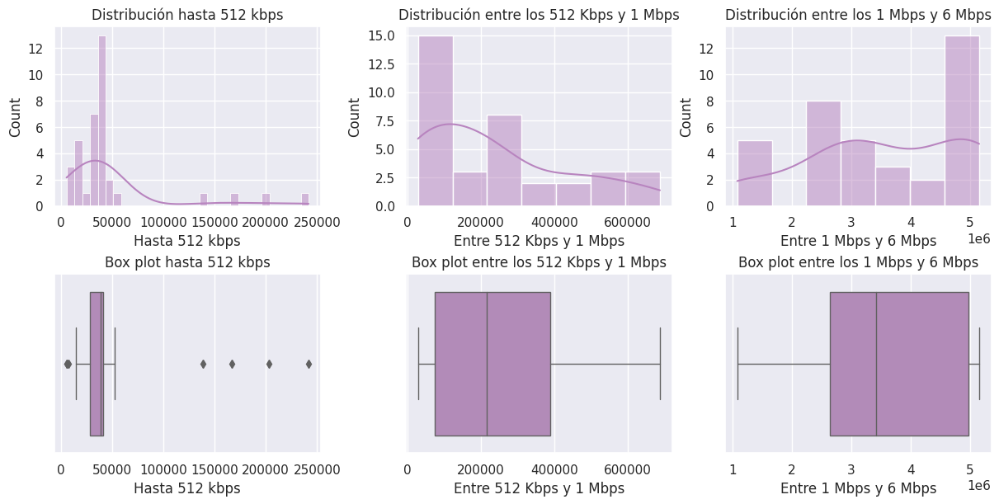

In [83]:
# Observando la distribución de los datos
fig, axes = plt.subplots(2, 3, figsize=(12, 6), constrained_layout = True)

# Histograma y boxplot de la columna 'Hasta 512 kbps'
sns.histplot(data = acceso_nacional_velocidad, x = 'Hasta 512 kbps', kde = True, color = '#B884BF', ax = axes[0,0])
ax = axes[0,0].set_title('Distribución hasta 512 kbps')
sns.boxplot(data = acceso_nacional_velocidad, x='Hasta 512 kbps', linewidth = 1, color = '#B884BF', ax = axes[1,0])
axes[1,0].set_title('Box plot hasta 512 kbps')
# Histograma y boxplot de la columna 'Entre 512 Kbps y 1 Mbps'
sns.histplot(data = acceso_nacional_velocidad, x='Entre 512 Kbps y 1 Mbps', kde = True, color = '#B884BF', ax = axes[0,1])
axes[0,1].set_title('Distribución entre los 512 Kbps y 1 Mbps')
sns.boxplot(data = acceso_nacional_velocidad, x='Entre 512 Kbps y 1 Mbps', linewidth = 1, color = '#B884BF', ax = axes[1,1])
axes[1,1].set_title('Box plot entre los 512 Kbps y 1 Mbps')
# Histograma y boxplot de la columna 'Entre 1 Mbps y 6 Mbps'
sns.histplot(data = acceso_nacional_velocidad, x = 'Entre 1 Mbps y 6 Mbps', kde = True, color = '#B884BF', ax = axes[0,2])
axes[0,2].set_title('Distribución entre los 1 Mbps y 6 Mbps')
sns.boxplot(data = acceso_nacional_velocidad, x='Entre 1 Mbps y 6 Mbps', linewidth = 1, color = '#B884BF', ax = axes[1,2])
axes[1,2].set_title('Box plot entre los 1 Mbps y 6 Mbps')

# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- En el caso de velocidades de transferencia de datos de hasta 512 Kbps, se observa que, la distribución indica que hay años donde la mayor cantidad de accesos al internet fijo estuvo alrededor de los 50 mil. Sin embargo, el sesgo hacia la derecha sugiere que en años siguientes la cantidad de accesos a través de estas velocidades comenzó a aumentar

- Mientras que para las velocidades de transferencia de datos de 512 Kpbs hasta 1 Mbps presenta una distribución menos sesgada y con mayor cantidad de accesos al internet fijo entre los 200 mil

- Por su parte, para las velocidades de transferencia de datos de 1 Mpbs hasta 6 Mbps la distribución presenta un leve sesgo hacia a la izquierda, y esto sugiere que hay una mayor cantidad de accesos al internet fijo superando los 3 millones

#### ```Entre 6 Mbps y 10 Mbps```, ```Entre 10 Mbps y 20 Mbps```, ```Entre 20 Mbps y 30 Mbps```

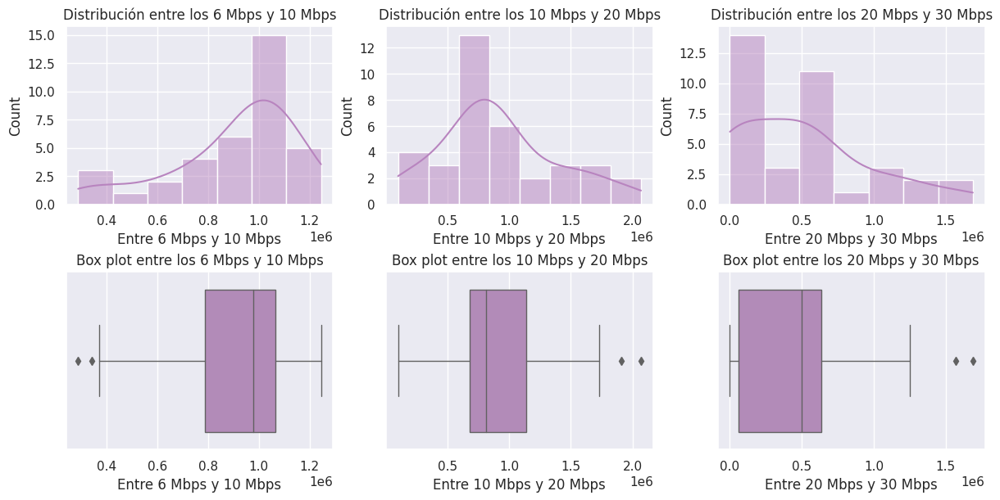

In [84]:
# Observando la distribución de los datos
fig, axes = plt.subplots(2, 3, figsize=(12, 6), constrained_layout = True)

# Histograma y boxplot de la columna 'Entre 6 Mbps y 10 Mbps'
sns.histplot(data = acceso_nacional_velocidad, x = 'Entre 6 Mbps y 10 Mbps', kde = True, color = '#B884BF', ax = axes[0,0])
ax = axes[0,0].set_title('Distribución entre los 6 Mbps y 10 Mbps')
sns.boxplot(data = acceso_nacional_velocidad, x='Entre 6 Mbps y 10 Mbps', linewidth = 1, color = '#B884BF', ax = axes[1,0])
axes[1,0].set_title('Box plot entre los 6 Mbps y 10 Mbps')
# Histograma y boxplot de la columna 'Entre 10 Mbps y 20 Mbps'
sns.histplot(data = acceso_nacional_velocidad, x='Entre 10 Mbps y 20 Mbps', kde = True, color = '#B884BF', ax = axes[0,1])
axes[0,1].set_title('Distribución entre los 10 Mbps y 20 Mbps')
sns.boxplot(data = acceso_nacional_velocidad, x='Entre 10 Mbps y 20 Mbps', linewidth = 1, color = '#B884BF', ax = axes[1,1])
axes[1,1].set_title('Box plot entre los 10 Mbps y 20 Mbps')
# Histograma y boxplot de la columna 'Entre 20 Mbps y 30 Mbps'
sns.histplot(data = acceso_nacional_velocidad, x = 'Entre 20 Mbps y 30 Mbps', kde = True, color = '#B884BF', ax = axes[0,2])
axes[0,2].set_title('Distribución entre los 20 Mbps y 30 Mbps')
sns.boxplot(data = acceso_nacional_velocidad, x='Entre 20 Mbps y 30 Mbps', linewidth = 1, color = '#B884BF', ax = axes[1,2])
axes[1,2].set_title('Box plot entre los 20 Mbps y 30 Mbps')

# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- En el caso de las velocidades de transferencia de datos de 6 Mbps hasta los 10 Mbps, se observa una interesante distribución en los datos, con una media ligeramente por encima del promedio debido a los valores atípicos presentes en el diagrama de caja. Este sesgo hacia la izquierda puede deberse a que en los primeros años de este conjunto de datos existía muy poco acceso al internet fijo a través de estas velocidades, y que con el transcurso del tiempo estas velocidades fueron más requeridas, superando el millón de accesos.

- Mientras que para las velocidades de transferencia de datos de 10 Mbps hasta 20 Mbps presenta una distribución sesgada hacia la derecha. Dado que la cantidad de accesos para determinados años superó los 2 millones.

- Por su parte, para las velocidades de transferencia de datos de 20 Mpbs hasta 30 Mbps a pesar de presentar igualmente un sesgo hacia la derecha, la mayor cantidad de acceso supera los 500 mil. Esto puede deberse a las siguientes razones: las otras velocidades tenien un costo más accesible para la mayoría de los hogares, hay menos demanda para velocidades superiores a los 20 Mbps o que la infraestructura de internet en algunas áreas no sea capaz de soportar velocidades de transferencia de datos superiores a los 20 Mbps.

#### ```Más de 30 Mbps```, ```OTROS```, ```Total```

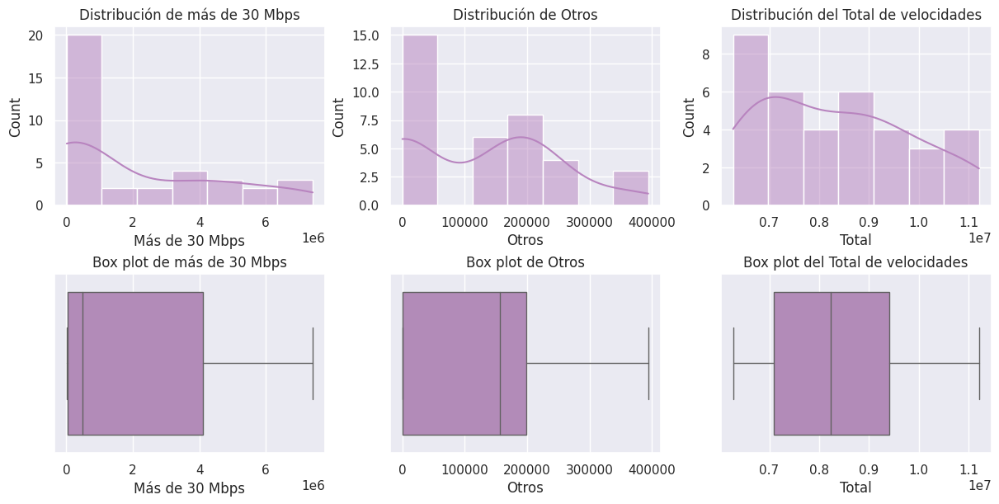

In [85]:
# Observando la distribución de los datos
fig, axes = plt.subplots(2, 3, figsize=(12, 6), constrained_layout = True)

# Histograma y boxplot de la columna 'Más de 30 Mbps'
sns.histplot(data = acceso_nacional_velocidad, x = 'Más de 30 Mbps', kde = True, color = '#B884BF', ax = axes[0,0])
ax = axes[0,0].set_title('Distribución de más de 30 Mbps')
sns.boxplot(data = acceso_nacional_velocidad, x='Más de 30 Mbps', linewidth = 1, color = '#B884BF', ax = axes[1,0])
axes[1,0].set_title('Box plot de más de 30 Mbps')
# Histograma y boxplot de la columna 'Otros'
sns.histplot(data = acceso_nacional_velocidad, x='Otros', kde = True, color = '#B884BF', ax = axes[0,1])
axes[0,1].set_title('Distribución de Otros')
sns.boxplot(data = acceso_nacional_velocidad, x='Otros', linewidth = 1, color = '#B884BF', ax = axes[1,1])
axes[1,1].set_title('Box plot de Otros')
# Histograma y boxplot de la columna 'Total'
sns.histplot(data = acceso_nacional_velocidad, x = 'Total', kde = True, color = '#B884BF', ax = axes[0,2])
axes[0,2].set_title('Distribución del Total de velocidades')
sns.boxplot(data = acceso_nacional_velocidad, x='Total', linewidth = 1, color = '#B884BF', ax = axes[1,2])
axes[1,2].set_title('Box plot del Total de velocidades')

# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- En el caso de las velocidades de transferencia por encima ratifica lo antes expuesto con respecto a las velocidades de 20 hasta 30 Mbps. Hay mucha variabilidad en la cantidad de los accesos estando por debajo del millón.

- Para el total de los accesos al servicio de internet fijo, la distribución de refleja que estos han aumentado significativamente con el tiempo generando una distribución parcialmente normal.

#### ```Trimestre```

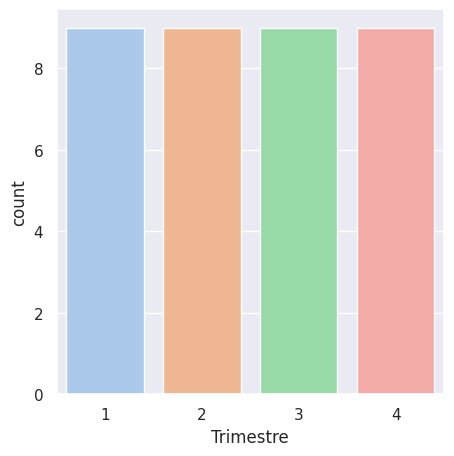

In [86]:
# Gráfico de barras de los trimestres
plt.figure(figsize = (5,5))
sns.countplot(data = acceso_nacional_velocidad, x = 'Trimestre')
# Mostrar la figura
plt.show()

**Apreciación:**

- El número de registros no está distribuido de manera equitativa entre los cuatro trimestres, para cada uno de los años.

### Análisis Bivariable

#### ```Año``` vs velocidad del internet

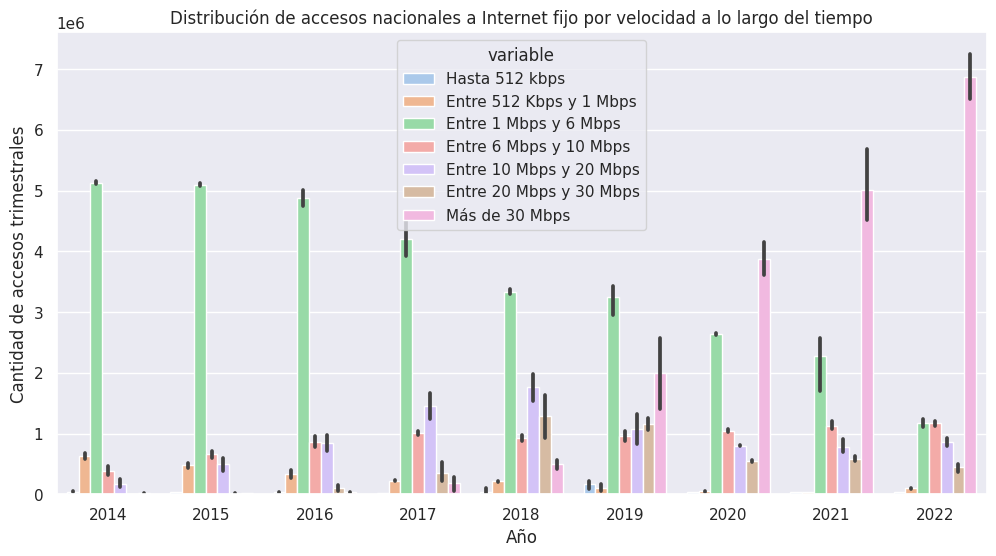

In [87]:
# Gráfico de barras apiladas para visualizar la distribución de accesos nacionales a Internet fijo
# por velocidad a lo largo del tiempo

# Cambiar el tamaño del gráfico
plt.figure(figsize=(12, 6))

columns = ['Hasta 512 kbps', 'Entre 512 Kbps y 1 Mbps', 'Entre 1 Mbps y 6 Mbps', 'Entre 6 Mbps y 10 Mbps',
           'Entre 10 Mbps y 20 Mbps', 'Entre 20 Mbps y 30 Mbps', 'Más de 30 Mbps']

sns.barplot(x='Año', y='value', hue='variable', data = pd.melt(acceso_nacional_velocidad,
                                                               id_vars = ['Año'], value_vars = columns ))
# Agregar etiquetas y leyenda
plt.title('Distribución de accesos nacionales a Internet fijo por velocidad a lo largo del tiempo')
plt.xlabel('Año')
plt.ylabel('Cantidad de accesos trimestrales')
# Mostrar grafico completo
plt.show()

**Apreciaciones:**

- Se observa un aumento en la cantidad de accesos totales por velocidad de acceso a lo largo del tiempo. La categoría de velocidad de acceso de más de 30 Mbps es la que tiene la mayor cantidad de accesos para el año 2022 con más de 7 millones, seguida de la categoría de velocidad de acceso entre 1 a 6 Mbps con más de 5 millones para el año 2014.

- Entre los años 2020 y 2022, se aprecia una reducción en la cantidad de accesos en la categoría de velocidad de accesos entre 1 Mbps y 6 Mbps, pasando a repuntar la cantidad de accesos con más de 30 Mbps de velocidad. Además la cantidad de accesos por velocidades hasta 512 Kbps disminuyó significativamente sugiere que esta categoría está prácticamente en desuso en la actualidad.

## Acceso a Internet Fijo por rangos de velocidad de bajada y provincia

Número de accesos al servicio de Internet fijo por velocidad de bajada en cada provincia (trimestral)

In [88]:
# Definir la URL de la API y tu API key
url = "http://api.datosabiertos.enacom.gob.ar/api/v2/datastreams/ACCES-A-INTER-FIJO-23248/data.csv"
api_key = "5EBQMGTfMImArsNkwhQIuatPXtYfRNlAuSTuybbB"

# Realizar la solicitud a la API
response = requests.get(url, params={"auth_key": api_key, "limit": 900})

# Verificar si la solicitud fue exitosa
if response.status_code == 200:
  # Leer el contenido del archivo CSV en memoria como una cadena de texto
  csv_data = response.content.decode("utf-8")

  # Crear un objeto DataFrame a partir de la cadena de texto
  acceso_velocidad_provincia = pd.read_csv(io.StringIO(csv_data))

else:
  # Mostrar un mensaje de error si la solicitud falló
  print("Error al hacer la solicitud a la API")

Error al hacer la solicitud a la API


In [89]:
# Imprimir las primeras 5 filas de "acceso_velocidad_provincia"
acceso_velocidad_provincia.head()

NameError: ignored

In [ ]:
# Mostrar información del número de columnas, filas, tipos de datos y valores faltantes en "acceso_velocidad_provincia"
acceso_velocidad_provincia.info()

Las variables no parecen estar en el formato correcto y hay valores nulos.

### Transformaciones de los datos

In [ ]:
# Cantidad de valores faltantes por columna en "acceso_velocidad_provincia"
missing_values_count = acceso_velocidad_provincia.isnull().sum()
columns = acceso_velocidad_provincia.shape[1]
missing_values_count[0:columns]

In [ ]:
# Mostrar las filas que tienen valores faltantes para identificar a que año-trimestre corresponden
filas_con_faltantes = acceso_velocidad_provincia.isna().sum(axis=1) > 0
acceso_velocidad_provincia[filas_con_faltantes]

In [ ]:
# Verificar si hay una inconsistencia en esta variable
acceso_velocidad_provincia['OTROS'].min()

In [ ]:
# Valores únicos en la columna "Año"
acceso_velocidad_provincia['Año'].unique()

In [ ]:
# Valores únicos en la columna "Provincia"
acceso_velocidad_provincia['Provincia'].unique()

In [ ]:
# Modificar algunos nombres de las provincias para mantener la uniformidad con los demás Dataframes
acceso_velocidad_provincia['Provincia'] = acceso_velocidad_provincia['Provincia'].str.replace('Santiago Del', 'Santiago del')
acceso_velocidad_provincia['Provincia'] = acceso_velocidad_provincia['Provincia'].str.replace('Tierra Del', 'Tierra del')

In [ ]:
# Renombrando algunas columnas de "acceso_nacional_velocidad"
acceso_velocidad_provincia.rename(columns = {'HASTA 512 kbps':'Hasta 512 kbps',
                                            '+ 512 Kbps - 1 Mbps':'Entre 512 Kbps y 1 Mbps',
                                            '+ 1 Mbps - 6 Mbps':'Entre 1 Mbps y 6 Mbps',
                                            '+ 6 Mbps - 10 Mbps':'Entre 6 Mbps y 10 Mbps',
                                            '+ 10 Mbps - 20 Mbps':'Entre 10 Mbps y 20 Mbps',
                                            '+ 20 Mbps - 30 Mbps':'Entre 20 Mbps y 30 Mbps',
                                            '+ 30 Mbps':'Más de 30 Mbps',
                                            'OTROS':'Otros'}, inplace = True)
# Verificar que los cambios se realizaron correctamente
acceso_velocidad_provincia.columns

In [ ]:
# Para facilitar el análisis de los demás datos sin caer
acceso_velocidad_provincia['Otros'] = acceso_velocidad_provincia['Otros'].fillna(0)

In [ ]:
# Convertir la columna "Hasta 512 kbps" a tipo de dato int
acceso_velocidad_provincia['Hasta 512 kbps'] = (acceso_velocidad_provincia['Hasta 512 kbps'] * 1000).astype(int)
# Convertir la columna "Entre 512 Kbps y 1 Mbps" a tipo de dato int
acceso_velocidad_provincia['Entre 512 Kbps y 1 Mbps'] = (acceso_velocidad_provincia['Entre 512 Kbps y 1 Mbps'] * 1000).astype(int)
# Convertir la columna "Entre 6 Mbps y 10 Mbps" a tipo de dato int
acceso_velocidad_provincia['Entre 6 Mbps y 10 Mbps'] = (acceso_velocidad_provincia['Entre 6 Mbps y 10 Mbps'] * 1000).astype(int)
# Convertir la columna "Entre 10 Mbps y 20 Mbps" a tipo de dato int
acceso_velocidad_provincia['Entre 10 Mbps y 20 Mbps'] = (acceso_velocidad_provincia['Entre 10 Mbps y 20 Mbps'] * 1000).astype(int)
# Convertir la columna "Entre 20 Mbps y 30 Mbps" a tipo de dato int
acceso_velocidad_provincia['Entre 20 Mbps y 30 Mbps'] = (acceso_velocidad_provincia['Entre 20 Mbps y 30 Mbps'] * 1000).astype(int)

In [ ]:
# Cambiar el tipo de dato a str para facilitar las transformaciones
acceso_velocidad_provincia['Otros'] = acceso_velocidad_provincia['Otros'].astype(str)
# Reemplazar filas de "acceso_velocidad_provincia" en las que la columna 'Otros' tenga '-' por ''
acceso_velocidad_provincia['Otros'] = acceso_velocidad_provincia['Otros'].str.replace('-', '', regex=True)
# Reemplazar filas de "acceso_velocidad_provincia" en las que la columna 'Otros' tenga '.' por '' y cambiar el tipo a int
acceso_velocidad_provincia['Otros'] = acceso_velocidad_provincia['Otros'].str.replace('.', '', regex=True).astype(int)
# Reemplazar filas de "acceso_velocidad_provincia" en las que la columna 'Total' tenga '.' por '' y cambiar el tipo a int
acceso_velocidad_provincia['Total'] = acceso_velocidad_provincia['Total'].str.replace('.', '', regex=True).astype(int)
# Reemplazar filas de "acceso_velocidad_provincia" en las que la columna 'Entre 1 Mbps y 6 Mbps' tenga '.' por '' y cambiar el tipo a int
acceso_velocidad_provincia['Entre 1 Mbps y 6 Mbps'] = acceso_velocidad_provincia['Entre 1 Mbps y 6 Mbps'].str.replace('.', '', regex=True).astype(int)
# Reemplazar filas de "acceso_velocidad_provincia" en las que la columna 'Más de 30 Mbps' tenga '.' por '' y cambiar el tipo a int
acceso_velocidad_provincia['Más de 30 Mbps'] = acceso_velocidad_provincia['Más de 30 Mbps'].str.replace('.', '', regex=True).astype(int)

In [ ]:
# Se crea una columna 'Fecha' combinando 'Año' y 'Trimestre' en un objeto de fecha
acceso_velocidad_provincia['Fecha'] = pd.to_datetime(acceso_velocidad_provincia['Año'].astype(str) + 'Q' + acceso_velocidad_provincia['Trimestre'].astype(str))

In [ ]:
# Verificar los cambios realizados en el dataset 'acceso_velocidad_provincia'
acceso_velocidad_provincia.head()

### Resumen estadístico

In [ ]:
# Mostrar un resumen estadístico de las columnas numériocas de "acceso_velocidad_provincia"
acceso_velocidad_provincia.describe()

**Apreciaciones:**

- La cantidad de accesos a Internet fijo varía ampliamente según la categoría de velocidad de descarga. La categoría "Entre 1 Mbps y 6 Mbps" tiene la mayor cantidad de accesos en promedio, seguida de "Más de 30 Mbps" y "Entre 6 Mbps y 10 Mbps". La categoría "Hasta 512 kbps" tiene la menor cantidad de accesos en promedio.
- La desviación estándar es bastante alta para todas las categorías de velocidad de descarga, lo que sugiere que hay una gran variabilidad en la cantidad de accesos en cada trimestre y provincia.
- La cantidad de accesos en la categoría "Otros" es relativamente baja en promedio, lo que sugiere que la mayoría de los accesos se pueden clasificar en las categorías de velocidad de descarga especificadas.
- La cantidad de accesos ha aumentado en promedio a lo largo del tiempo para la mayoría de las categorías de velocidad de descarga, lo que sugiere una mayor adopción de Internet fijo en general. Sin embargo, la cantidad de accesos en la categoría "Hasta 512 kbps" ha disminuido significativamente en los últimos años, lo que sugiere que esta categoría está prácticamente en desuso en la actualidad.

### Análisis Univariable

A continuación, se realizarán algunas visualizaciones para explorar el conjunto de datos con más detalle. Primero, se observará la distribución de los accesos al servicio de Internet fijo para las distintas velocidades de bajada

#### ```Hasta 512 kbps```, ```Entre 512 Kbps y 1 Mbps```, ```Entre 1 Mbps y 6 Mbps```

In [ ]:
# Observando la distribución de los datos
fig, axes = plt.subplots(2, 3, figsize=(12, 6), constrained_layout = True)

# Histograma y boxplot de la columna 'Hasta 512 kbps'
sns.histplot(data = acceso_velocidad_provincia, x = 'Hasta 512 kbps', kde = True, color = '#F2A35E', ax = axes[0,0])
ax = axes[0,0].set_title('Distribución hasta 512 kbps')
sns.boxplot(data = acceso_velocidad_provincia, x='Hasta 512 kbps', linewidth = 1, color = '#F2A35E', ax = axes[1,0])
axes[1,0].set_title('Box plot hasta 512 kbps')
# Histograma y boxplot de la columna 'Entre 512 Kbps y 1 Mbps'
sns.histplot(data = acceso_velocidad_provincia, x='Entre 512 Kbps y 1 Mbps', kde = True, color = '#F2A35E', ax = axes[0,1])
axes[0,1].set_title('Distribución entre los 512 Kbps y 1 Mbps')
sns.boxplot(data = acceso_velocidad_provincia, x='Entre 512 Kbps y 1 Mbps', linewidth = 1, color = '#F2A35E', ax = axes[1,1])
axes[1,1].set_title('Box plot entre los 512 Kbps y 1 Mbps')
# Histograma y boxplot de la columna 'Entre 1 Mbps y 6 Mbps'
sns.histplot(data = acceso_velocidad_provincia, x = 'Entre 1 Mbps y 6 Mbps', kde = True, color = '#F2A35E', ax = axes[0,2])
axes[0,2].set_title('Distribución entre los 1 Mbps y 6 Mbps')
sns.boxplot(data = acceso_velocidad_provincia, x='Entre 1 Mbps y 6 Mbps', linewidth = 1, color = '#F2A35E', ax = axes[1,2])
axes[1,2].set_title('Box plot entre los 1 Mbps y 6 Mbps')

# Mostrar gráfico completo
plt.show()

#### ```Entre 6 Mbps y 10 Mbps```, ```Entre 10 Mbps y 20 Mbps```, ```Entre 20 Mbps y 30 Mbps```

In [ ]:
# Observando la distribución de los datos
fig, axes = plt.subplots(2, 3, figsize=(12, 6), constrained_layout = True)

# Histograma y boxplot de la columna 'Entre 6 Mbps y 10 Mbps'
sns.histplot(data = acceso_velocidad_provincia, x = 'Entre 6 Mbps y 10 Mbps', kde = True, color = '#F2A35E', ax = axes[0,0])
ax = axes[0,0].set_title('Distribución entre los 6 Mbps y 10 Mbps')
sns.boxplot(data = acceso_velocidad_provincia, x='Entre 6 Mbps y 10 Mbps', linewidth = 1, color = '#F2A35E', ax = axes[1,0])
axes[1,0].set_title('Box plot entre los 6 Mbps y 10 Mbps')
# Histograma y boxplot de la columna 'Entre 10 Mbps y 20 Mbps'
sns.histplot(data = acceso_velocidad_provincia, x='Entre 10 Mbps y 20 Mbps', kde = True, color = '#F2A35E', ax = axes[0,1])
axes[0,1].set_title('Distribución entre los 10 Mbps y 20 Mbps')
sns.boxplot(data = acceso_velocidad_provincia, x='Entre 10 Mbps y 20 Mbps', linewidth = 1, color = '#F2A35E', ax = axes[1,1])
axes[1,1].set_title('Box plot entre los 10 Mbps y 20 Mbps')
# Histograma y boxplot de la columna 'Entre 20 Mbps y 30 Mbps'
sns.histplot(data = acceso_velocidad_provincia, x = 'Entre 20 Mbps y 30 Mbps', kde = True, color = '#F2A35E', ax = axes[0,2])
axes[0,2].set_title('Distribución entre los 20 Mbps y 30 Mbps')
sns.boxplot(data = acceso_velocidad_provincia, x='Entre 20 Mbps y 30 Mbps', linewidth = 1, color = '#F2A35E', ax = axes[1,2])
axes[1,2].set_title('Box plot entre los 20 Mbps y 30 Mbps')

# Mostrar gráfico completo
plt.show()

#### ```Más de 30 Mbps```, ```OTROS```, ```Total```

In [ ]:
# Observando la distribución de los datos
fig, axes = plt.subplots(2, 3, figsize=(12, 6), constrained_layout = True)

# Histograma y boxplot de la columna 'Más de 30 Mbps'
sns.histplot(data = acceso_velocidad_provincia, x = 'Más de 30 Mbps', kde = True, color = '#F2A35E', ax = axes[0,0])
ax = axes[0,0].set_title('Distribución de más de 30 Mbps')
sns.boxplot(data = acceso_velocidad_provincia, x='Más de 30 Mbps', linewidth = 1, color = '#F2A35E', ax = axes[1,0])
axes[1,0].set_title('Box plot de más de 30 Mbps')
# Histograma y boxplot de la columna 'Otros'
sns.histplot(data = acceso_velocidad_provincia, x='Otros', kde = True, color = '#F2A35E', ax = axes[0,1])
axes[0,1].set_title('Distribución de Otros')
sns.boxplot(data = acceso_velocidad_provincia, x='Otros', linewidth = 1, color = '#F2A35E', ax = axes[1,1])
axes[1,1].set_title('Box plot de Otros')
# Histograma y boxplot de la columna 'Total'
sns.histplot(data = acceso_velocidad_provincia, x = 'Total', kde = True, color = '#F2A35E', ax = axes[0,2])
axes[0,2].set_title('Distribución del Total de velocidades')
sns.boxplot(data = acceso_velocidad_provincia, x='Total', linewidth = 1, color = '#F2A35E', ax = axes[1,2])
axes[1,2].set_title('Box plot del Total de velocidades')

# Mostrar gráfico completo
plt.show()

**Apreciaciones para todas las distribuciones:**


En todas las distribuciones para cada uno de los rangos de velocidades de transferencia de los datos se puede apreciar un sesgo hacia la derecha ratificandolo los diagramas de cajas mostrando la presencia de valores atípicos o extremadamente altos en las distribuciones, esto podría deberse a los siguientes motivos:

- La mayoría de los hogares tienen velocidades de transferencia de datos más bajas, mientras que un pequeño porcentaje de hogares tienen velocidades mucho más altas.

- Otro posible factor que podría estar influenciando el sesgo hacia la derecha es la demanda creciente de velocidades de transferencia de datos más altas. Con el aumento de la cantidad de hogares que utilizan internet para una variedad de tareas, incluyendo el trabajo remoto, el entretenimiento en línea y la educación en línea, es posible que la demanda de velocidades de transferencia de datos más altas esté aumentando con el tiempo.


### Análisis Bivariable

#### ```Año``` vs velocidades de descarga

Se calcula el porcentaje de cambio entre cada año y el año anterior para cada una de las velocidades

In [ ]:
# Agrupar los datos por año y calcular la suma de los accesos a las velocidades de descarga
accesos_por_año = acceso_velocidad_provincia.groupby('Año')[['Hasta 512 kbps',
       'Entre 512 Kbps y 1 Mbps', 'Entre 1 Mbps y 6 Mbps',
       'Entre 6 Mbps y 10 Mbps', 'Entre 10 Mbps y 20 Mbps',
       'Entre 20 Mbps y 30 Mbps', 'Más de 30 Mbps', 'Otros', 'Total']].sum()

# Calcular el porcentaje de cambio entre cada año y el año anterior para las velocidades de descarga
accesos_por_año['Cambio Hasta 512 kbps'] = accesos_por_año['Hasta 512 kbps'].pct_change() * 100
accesos_por_año['Cambio Entre 512 Kbps y 1 Mbps'] = accesos_por_año['Entre 512 Kbps y 1 Mbps'].pct_change() * 100
accesos_por_año['Cambio Entre 1 Mbps y 6 Mbps'] = accesos_por_año['Entre 1 Mbps y 6 Mbps'].pct_change() * 100
accesos_por_año['Cambio Entre 6 Mbps y 10 Mbps'] = accesos_por_año['Entre 6 Mbps y 10 Mbps'].pct_change() * 100
accesos_por_año['Cambio Entre 10 Mbps y 20 Mbps'] = accesos_por_año['Entre 10 Mbps y 20 Mbps'].pct_change() * 100
accesos_por_año['Cambio Entre 20 Mbps y 30 Mbps'] = accesos_por_año['Entre 20 Mbps y 30 Mbps'].pct_change() * 100
accesos_por_año['Cambio Más de 30 Mbps'] = accesos_por_año['Más de 30 Mbps'].pct_change() * 100
accesos_por_año['Cambio Otros'] = accesos_por_año['Otros'].pct_change() * 100
accesos_por_año['Cambio Total'] = accesos_por_año['Total'].pct_change() * 100

# Imprimir los resultados
accesos_por_año[['Cambio Hasta 512 kbps', 'Cambio Entre 512 Kbps y 1 Mbps', 'Cambio Entre 1 Mbps y 6 Mbps',
                 'Cambio Entre 6 Mbps y 10 Mbps', 'Cambio Entre 10 Mbps y 20 Mbps', 'Cambio Entre 20 Mbps y 30 Mbps',
                 'Cambio Más de 30 Mbps', 'Cambio Otros', 'Cambio Total']]

**Apreciaciones:**

- Los cambios porcentuales en la cantidad de accesos varían ampliamente según la categoría de velocidad de descarga. En general, las categorías de velocidad de descarga más altas (como "Más de 30 Mbps") han experimentado un mayor crecimiento porcentual en la cantidad de accesos en comparación con las categorías de velocidad de descarga más bajas (como "Hasta 512 kbps").
- En algunos años, ciertas categorías de velocidad de descarga han experimentado una disminución porcentual significativa en la cantidad de accesos en comparación con el año anterior. Por ejemplo, en 2018, la cantidad de accesos en la categoría "Hasta 512 kbps" disminuyó en un 35.2% en comparación con el año anterior.
- Los cambios porcentuales en la cantidad de accesos pueden variar significativamente de un año a otro y de una categoría de velocidad de descarga a otra. Por ejemplo, en 2015, la cantidad de accesos en la categoría "Entre 20 Mbps y 30 Mbps" aumentó en un 146%, mientras que en 2018, la cantidad de accesos en la misma categoría aumentó solo un 56%.
- En algunos casos, los cambios porcentuales son muy altos o muy bajos, lo que puede deberse a la base de comparación (es decir, la cantidad de accesos en el año anterior). Por ejemplo, en 2017, el cambio porcentual en la cantidad de accesos en la categoría "Otros" fue "infinito", lo que sugiere que la cantidad de accesos en el año anterior era muy baja o cero.
- En general, los cambios porcentuales sugieren que la cantidad de accesos a Internet fijo está aumentando en la mayoría de las categorías de velocidad de descarga y provincias, aunque a diferentes tasas de crecimiento. Esto puede ser una indicación de una mayor adopción de Internet fijo en general.

### Análisis Multivariable

#### Tasa de velocidad de descarga promedio anual-trimestral por provincia

```Año``` vs ```Trimestre``` vs ```Provincia``` vs rango de velocidad (Mbps)

Para facilitar el análisis en cada una de las provincias, se procede a explorar los datos por regiones. Es importante tener en cuenta que, aunque estas divisiones se utilizarán para fines estadísticos y de análisis, no son necesariamente oficiales y pueden variar según la fuente que se consulte. Además que cada una de estas regiones tienen sus propias características y particularidades, y que pueden haber diferencias significativas en términos de acceso a la tecnología y otros indicadores socioeconómicos entre las provincias y regiones dentro de cada una de ellas.

In [ ]:
# Región Patagonia de Argentina
patagonia = acceso_velocidad_provincia[acceso_velocidad_provincia['Provincia'].isin(['Tierra Del Fuego', 'Santa Cruz',
                                                                                     'Chubut', 'Neuquén', 'Río Negro'])]

# Región de Cuyo de Argentina
cuyo = acceso_velocidad_provincia[acceso_velocidad_provincia['Provincia'].isin(['Mendoza', 'San Luis', 'San Juan'])]

# Región Pampeana de Argentina
pampeana = acceso_velocidad_provincia[acceso_velocidad_provincia['Provincia'].isin(['Buenos Aires', 'Capital Federal',
                                                                                    'Santa Fe', 'Córdoba', 'La Pampa'])]

# Región Noroeste de Argentina
noroeste = acceso_velocidad_provincia[acceso_velocidad_provincia['Provincia'].isin(['La Rioja', 'Catamarca', 'Tucumán',
                                                                      'Santiago Del Estero', 'Salta', 'Jujuy'])]

# Región Noreste de Argentina
noreste = acceso_velocidad_provincia[acceso_velocidad_provincia['Provincia'].isin(['Chaco', 'Formosa', 'Corrientes',
                                                                                   'Entre Ríos', 'Misiones'])]

##### Región Patagonia

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Hasta 512 kbps"
df_promedio = patagonia.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Hasta 512 kbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Hasta 512 kbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia hasta 512 kbps en las provincias de la Región Patagonia')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 512 Kbps y 1 Mbps"
df_promedio = patagonia.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 512 Kbps y 1 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 512 Kbps y 1 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 512 Kbps y 1 Mbps en las provincias de la Región Patagonia')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 1 Mbps y 6 Mbps"
df_promedio = patagonia.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 1 Mbps y 6 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 1 Mbps y 6 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 1 Mbps y 6 Mbps en las provincias de la Región Patagonia')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 6 Mbps y 10 Mbps"
df_promedio = patagonia.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 6 Mbps y 10 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 6 Mbps y 10 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 6 Mbps y 10 Mbps en las provincias de la Región Patagonia')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 10 Mbps y 20 Mbps"
df_promedio = patagonia.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 10 Mbps y 20 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 10 Mbps y 20 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 10 Mbps y 20 Mbps en las provincias de la Región Patagonia')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 20 Mbps y 30 Mbps"
df_promedio = patagonia.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 20 Mbps y 30 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 20 Mbps y 30 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 20 Mbps y 30 Mbps en las provincias de la Región Patagonia')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Más de 30 Mbps"
df_promedio = patagonia.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Más de 30 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Más de 30 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia más de 30 Mbps en las provincias de la Región Patagonia')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- Se observa que la provincia de Neuquén es la que mayor cantidad de accesos o demanda tiene en cuanto a las velocidades de transferencia de datos. Principalmente para las velocidades de entre 512 Kbps a 1 Mbps con 1 millón de accesos y seguido de más de 30 Mbps con 80 mil accesos. Hay extremos en la provincia con velocidades muy bajas o muy altas.

- Mientras que por el contratrio la provincia con menor cantidad de de accesos a internet fijo a a través de los rangos de velocidades de transferencia de datos que se están analizando es Santa Cruz

##### Región de Cuyo

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Hasta 512 kbps"
df_promedio = cuyo.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Hasta 512 kbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Hasta 512 kbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia hasta 512 kbps en las provincias de la Región de Cuyo')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 512 Kbps y 1 Mbps"
df_promedio = cuyo.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 512 Kbps y 1 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 512 Kbps y 1 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 512 Kbps y 1 Mbps en las provincias de la Región de Cuyo')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 1 Mbps y 6 Mbps"
df_promedio = cuyo.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 1 Mbps y 6 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 1 Mbps y 6 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 1 Mbps y 6 Mbps en las provincias de la Región de Cuyo')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 6 Mbps y 10 Mbps"
df_promedio = cuyo.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 6 Mbps y 10 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 6 Mbps y 10 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 6 Mbps y 10 Mbps en las provincias de la Región de Cuyo')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 10 Mbps y 20 Mbps"
df_promedio = cuyo.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 10 Mbps y 20 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 10 Mbps y 20 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 10 Mbps y 20 Mbps en las provincias de la Región de Cuyo')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 20 Mbps y 30 Mbps"
df_promedio = cuyo.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 20 Mbps y 30 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 20 Mbps y 30 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 20 Mbps y 30 Mbps en las provincias de la Región de Cuyo')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Más de 30 Mbps"
df_promedio = cuyo.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Más de 30 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Más de 30 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia más de 30 Mbps en las provincias de la Región de Cuyo')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- Se observa que la provincia de Mendoza es la que mayor cantidad de accesos o demanda tiene en cuanto a las velocidades de transferencia de datos. Principalmente para las velocidades que superan los 30 Mbps.

- La provincia de Mendoza es la que mayor cantidad de accesos a los velocidades de 512 Kbps a 1 Mbps tiene superando los 300 mil

##### Región Pampeana

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Hasta 512 kbps"
df_promedio = pampeana.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Hasta 512 kbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Hasta 512 kbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia hasta 512 kbps en las provincias de la Región Pampeana')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 512 Kbps y 1 Mbps"
df_promedio = pampeana.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 512 Kbps y 1 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 512 Kbps y 1 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 512 Kbps y 1 Mbps en las provincias de la Región Pampeana')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 1 Mbps y 6 Mbps"
df_promedio = pampeana.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 1 Mbps y 6 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 1 Mbps y 6 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 1 Mbps y 6 Mbps en las provincias de la Región Pampeana')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 6 Mbps y 10 Mbps"
df_promedio = pampeana.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 6 Mbps y 10 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 6 Mbps y 10 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia Entre 6 Mbps y 10 Mbps en las provincias de la Región Pampeana')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 10 Mbps y 20 Mbps"
df_promedio = pampeana.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 10 Mbps y 20 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 10 Mbps y 20 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 10 Mbps y 20 Mbps en las provincias de la Región Pampeana')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 20 Mbps y 30 Mbps"
df_promedio = pampeana.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 20 Mbps y 30 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 20 Mbps y 30 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 20 Mbps y 30 Mbps en las provincias de la Región Pampeana')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Más de 30 Mbps"
df_promedio = pampeana.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Más de 30 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Más de 30 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia más de 30 Mbps en las provincias de la Región Pampeana')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- Se observa que la provincia de Buenos Aires es la que mayor cantidad de accesos o demanda tiene en cuanto a las velocidades de transferencia de datos. Principalmente para las velocidades que superan los 30 Mbps, superando los 3.5 millones de accesos.

- La provincia de La Pampa es la que menor cantidad de accesos a los rangos de velocidades analizados tiene, sólo presentando significamente una cantidad de accesos por debajo a los 100 mil con velocidades muy bajas de hasta 512 Kbps

##### Región Noroeste

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Hasta 512 kbps"
df_promedio = noroeste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Hasta 512 kbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Hasta 512 kbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia hasta 512 kbps en las provincias de la Región Noroeste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 512 Kbps y 1 Mbps"
df_promedio = noroeste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 512 Kbps y 1 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 512 Kbps y 1 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 512 Kbps y 1 Mbps en las provincias de la Región Noroeste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 1 Mbps y 6 Mbps"
df_promedio = noroeste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 1 Mbps y 6 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 1 Mbps y 6 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 1 Mbps y 6 Mbps en las provincias de la Región Noroeste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 6 Mbps y 10 Mbps"
df_promedio = noroeste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 6 Mbps y 10 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 6 Mbps y 10 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 6 Mbps y 10 Mbps en las provincias de la Región Noroeste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 10 Mbps y 20 Mbps"
df_promedio = noroeste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 10 Mbps y 20 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 10 Mbps y 20 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 10 Mbps y 20 Mbps en las provincias de la Región Noroeste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 20 Mbps y 30 Mbps"
df_promedio = noroeste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 20 Mbps y 30 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 20 Mbps y 30 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 20 Mbps y 30 Mbps en las provincias de la Región Noroeste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Más de 30 Mbps"
df_promedio = noroeste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Más de 30 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Más de 30 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia más de 30 Mbps en las provincias de la Región Noroeste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- Se observa que las provincias de La Rioja y Catamarca tienen una cantidad de accesos al internet fijo por encima de los 400 mil en cuanto a las velocidades de transferencia de datos que rondan entre los 512 Kbps hasta 1 Mbps.

- Por su parte la provincia de Jujuy tiene una cantidad de accesos al internet fijo por encima de los 500 mil en cuanto a las velocidades de transferencia de datos que rondan entre los 20 Mbps hasta 30 Mbps.

- La provincia de Tucumán supera los 30 Mbps de velocidades de transferencia con más de 160 mil accesos.

##### Región Noreste

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Hasta 512 kbps"
df_promedio = noreste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Hasta 512 kbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Hasta 512 kbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia hasta 512 kbps en las provincias de la Región Noreste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 512 Kbps y 1 Mbps"
df_promedio = noreste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 512 Kbps y 1 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 512 Kbps y 1 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 512 Kbps y 1 Mbps en las provincias de la Región Noreste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 1 Mbps y 6 Mbps"
df_promedio = noreste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 1 Mbps y 6 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 1 Mbps y 6 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 1 Mbps y 6 Mbps en las provincias de la Región Noreste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 6 Mbps y 10 Mbps"
df_promedio = noreste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 6 Mbps y 10 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 6 Mbps y 10 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 6 Mbps y 10 Mbps en las provincias de la Región Noreste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 10 Mbps y 20 Mbps"
df_promedio = noreste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 10 Mbps y 20 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 10 Mbps y 20 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 10 Mbps y 20 Mbps en las provincias de la Región Noreste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Entre 20 Mbps y 30 Mbps"
df_promedio = noreste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Entre 20 Mbps y 30 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Entre 20 Mbps y 30 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia entre 20 Mbps y 30 Mbps en las provincias de la Región Noreste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

In [ ]:
# Agrupar los datos por provincia y trimestre y calcular la media de "Más de 30 Mbps"
df_promedio = noreste.groupby(['Año', 'Trimestre', 'Provincia'], as_index=False)['Más de 30 Mbps'].mean()

# Crear una nueva columna con el formato "Año-Trimestre"
df_promedio['Año-Trimestre'] = df_promedio['Año'].astype(str) + '-T' + df_promedio['Trimestre'].astype(str)

# Crear un gráfico de línea con la variable "hue" y "style" asignadas correctamente
plt.figure(figsize = (15, 5))
sns.lineplot(data = df_promedio, x = 'Año-Trimestre', y = 'Más de 30 Mbps', hue = 'Provincia', style = 'Provincia',
             dashes = False, palette = 'pastel', marker = 'o')

# Agregar etiquetas de ejes y título del gráfico
plt.title('Evolución del acceso al Internet fijo con velocidades de transferencia más de 30 Mbps en las provincias de la Región Noreste')
plt.xlabel('Año-Trimestre')
plt.ylabel('Cantidad promedio de accesos')
plt.xticks(rotation = 90) # Rotar los nombres en el eje x
# Mostrar gráfico completo
plt.show()

**Apreciaciones:**

- Se observa que la provincia de Chaco tiene una cantidad de accesos al internet fijo por encima de los 400 mil en cuanto a las velocidades de transferencia de datos que rondan hasta los 512 Kbps y 1 millón de accesos en cuanto a velocidades que rondan entre los 512 Kbps hasta 1 Mbps.

- Por su parte la provincia de Formosa tiene una cantidad de accesos al internet fijo por encima de los 300 mil en cuanto a las velocidades de transferencia de datos que rondan entre los 512 Kbps hasta 1 Mbps y los 500 mil accesos entre los 20 Mbps hasta 30 Mbps.

- La provincia de Entre Ríos supera los 30 Mbps de velocidades de transferencia con más de 100 mil accesos.

## Ingresos trimestrales por la prestación del servicio de Internet fijo

Ingresos trimestrales de los operadores por el servicio de Internet fijo

In [90]:
# Definir la URL de la API y tu API key
url = "http://api.datosabiertos.enacom.gob.ar/api/v2/datastreams/INGRE-POR-LA-OPERA-DEL/data.csv"
api_key = "5EBQMGTfMImArsNkwhQIuatPXtYfRNlAuSTuybbB"

# Realizar la solicitud a la API
response = requests.get(url, params={"auth_key": api_key, "limit": 500})

# Verificar si la solicitud fue exitosa
if response.status_code == 200:
  # Leer el contenido del archivo CSV en memoria como una cadena de texto
  csv_data = response.content.decode("utf-8")

  # Crear un objeto DataFrame a partir de la cadena de texto
  ingresos_trimestral = pd.read_csv(io.StringIO(csv_data))

else:
  # Mostrar un mensaje de error si la solicitud falló
  print("Error al hacer la solicitud a la API")

In [91]:
# Imprimir las primeras 5 filas de "ingresos_trimestral"
ingresos_trimestral.head()

,Año,Trimestre,Ingresos (miles de pesos),Periodo
0,2022,4,72.443.483,Oct-Dic 2022
1,2022,3,64.086.784,Jul-Sept 2022
2,2022,2,60.419.501,Abr-Jun 2022
3,2022,1,55.219.313,Ene-Mar 2022
4,2021,4,45.467.887,Oct-Dic 2021


In [92]:
# Mostrar información del número de columnas, filas, tipos de datos y valores faltantes presentes en "ingresos_trimestral"
ingresos_trimestral.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36 entries, 0 to 35
Data columns (total 4 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   Año                        36 non-null     int64 
 1   Trimestre                  36 non-null     int64 
 2   Ingresos (miles de pesos)  36 non-null     object
 3   Periodo                    36 non-null     object
dtypes: int64(2), object(2)
memory usage: 1.2+ KB


Las variables no parecen estar en el formato correcto y no hay valores nulos.

### Transformación de los datos

In [93]:
# Convertir la columna "Ingresos (miles de pesos)" a numérica
ingresos_trimestral['Ingresos (miles de pesos)'] = ingresos_trimestral['Ingresos (miles de pesos)'].replace('[^0-9]', '', regex=True).astype(int)

In [94]:
# Renombrar la columna 'Ingresos (miles de pesos)' a 'Ingresos (Pesos ARS)'
ingresos_trimestral.rename(columns={'Ingresos (miles de pesos)': 'Ingresos (Pesos ARS)'}, inplace = True)

In [95]:
# Crear una columna 'Fecha' combinando 'Año' y 'Trimestre' en un objeto de fecha
ingresos_trimestral['Fecha'] = pd.to_datetime(ingresos_trimestral['Año'].astype(str) + 'Q' + ingresos_trimestral['Trimestre'].astype(str))

### Resumen estadístico

In [96]:
# Mostrar un resumen estadístico de las columnas numériocas de "ingresos_trimestral"
ingresos_trimestral.describe()

,Año,Trimestre,Ingresos (Pesos ARS)
count,36.000000,36.000000,3.600000e+01
mean,2018.000000,2.500000,2.193842e+07
std,2.618615,1.133893,1.930189e+07
min,2014.000000,1.000000,2.984054e+06
25%,2016.000000,1.750000,6.384892e+06
50%,2018.000000,2.500000,1.486522e+07
75%,2020.000000,3.250000,3.246178e+07
max,2022.000000,4.000000,7.244348e+07


**Apreciaciones:**

- El conjunto de datos incluye 36 observaciones en total. La media de ingresos trimestrales es de 21.9 millones de pesos ARS, con una desviación estándar de 19.3 millones de pesos ARS. El ingreso mínimo registrado fue de 2.9 millones de pesos ARS, mientras que el ingreso máximo registrado fue de 72.4 millones de pesos ARS.

- Los datos también muestran que el primer trimestre del año 2014 fue el más bajo en términos de ingresos, con un mínimo de 2.9 millones de pesos ARS. El año 2022 fue el de mayor ingreso, con un máximo de 72 millones de pesos ARS. Además, el 50% de los ingresos trimestrales se encuentra en el rango de los 14.3 millones de pesos ARS.

### Análisis Univariable

A continuación, se realizarán algunas visualizaciones para explorar el conjunto de datos con más detalle. Primero, se observará la distribución de la cantidad de ingresos (Pesos ARS):

#### ```Ingresos (Pesos ARS)```

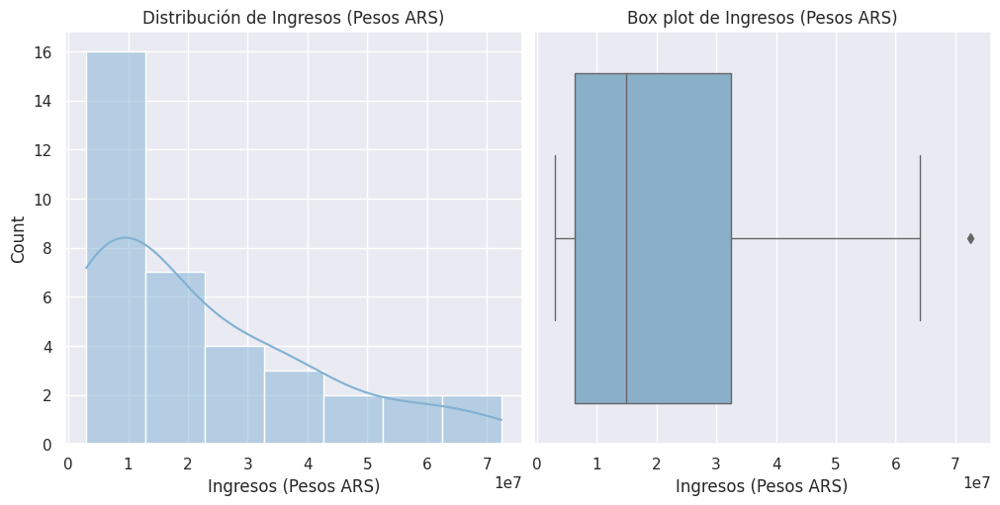

In [97]:
# Observando la distribución de los datos
fig, axes = plt.subplots(1, 2, figsize=(10, 5), constrained_layout = True)

# Histograma de la columna 'Ingresos (Pesos ARS)'
sns.histplot(data = ingresos_trimestral, x = 'Ingresos (Pesos ARS)', kde = True, color = '#80B1D3', ax = axes[0])
axes[0].set_title('Distribución de Ingresos (Pesos ARS)')

# Boxplot de la columna 'Ingresos (Pesos ARS)'
sns.boxplot(data = ingresos_trimestral, x='Ingresos (Pesos ARS)', linewidth = 1, color = '#80B1D3', ax = axes[1])
axes[1].set_title('Box plot de Ingresos (Pesos ARS)')
# Mostrar gráfico completo
plt.show()

**Apreciación:**

- Este histograma muestra una distribución sesgada hacia la derecha, ya que los ingresos tienden a aumentar a lo largo del tiempo y la mayor parte de los ingresos se centran a la izquierda, es decir, en los ingresos más bajos de la distribución. Mientras que el boxplot no refleja ningún tipo de valor atípico.

#### ```Trimestre```

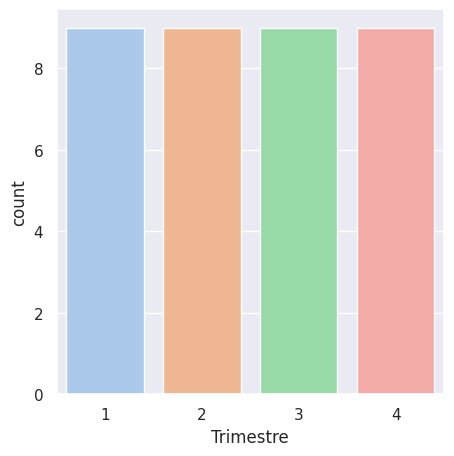

In [98]:
# Gráfico de barras de los trimestres
plt.figure(figsize = (5,5))
sns.countplot(data = ingresos_trimestral, x = 'Trimestre')
# Mostrar la figura
plt.show()

**Apreciación:**

- El número de registros no está distribuido de manera equitativa entre los cuatro trimestres, para cada uno de los años.

### Análisis Multivariable

#### ```Año``` vs ```Ingresos (Pesos ARS)```

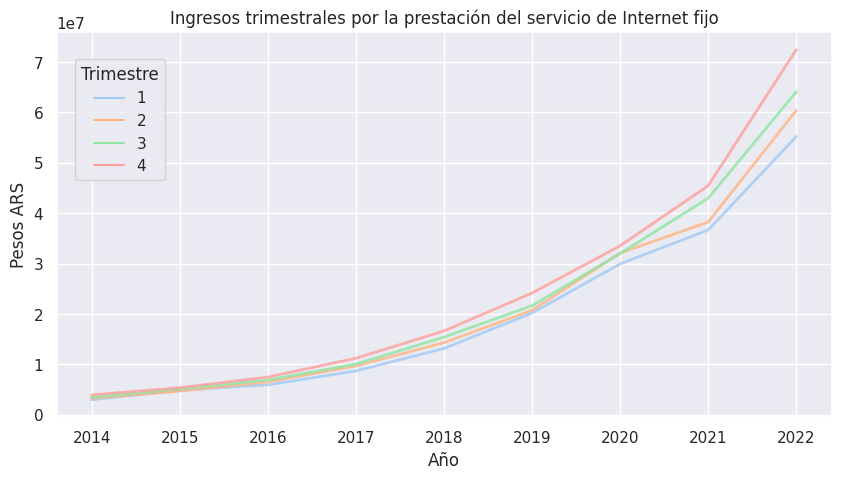

In [99]:
# Tamaño del gráfico
plt.figure(figsize  = (10, 5))

# Crear un gráfico de línea de los ingresos en pesos argentinos por año y trimestre
sns.lineplot(x = 'Año', y = 'Ingresos (Pesos ARS)', hue = 'Trimestre', data = ingresos_trimestral,
             palette = 'pastel', linewidth = 2, alpha = 0.8)

# Agregar etiquetas y leyenda
plt.title('Ingresos trimestrales por la prestación del servicio de Internet fijo')
plt.xlabel('Año')
plt.ylabel('Pesos ARS')
plt.legend(title = 'Trimestre', loc = 'upper right', bbox_to_anchor = (0.15, 0.95))

# Mostrar el gráfico completo
plt.show()

**Apreciación:**

- Hay un crecimiento exponencial en cada uno de los trimestres, sin embargo, es notorio que el último trimestre de cada año suele ser el de mayor ingreso, mientras que el primer trimestre de cada año suele ser el de menor ingreso.

- El primer trimestre del año incluye los meses de enero, febrero y marzo, que son meses en los que muchas personas suelen estar de vacaciones o ausentes de sus hogares. En este sentido, es posible que durante estos meses disminuya la demanda de servicios de internet fijo, lo que podría explicar la caída en los ingresos trimestrales.

- Por otro lado, el cuarto trimestre del año incluye los meses de octubre, noviembre y diciembre, que son meses en los que se celebran las fiestas de fin de año y se realizan compras navideñas. Es posible que durante este trimestre aumente la demanda de servicios de internet fijo debido a que muchas personas realizan compras en línea o se comunican con sus seres queridos a través de internet, lo que podría explicar el aumento en los ingresos trimestrales.

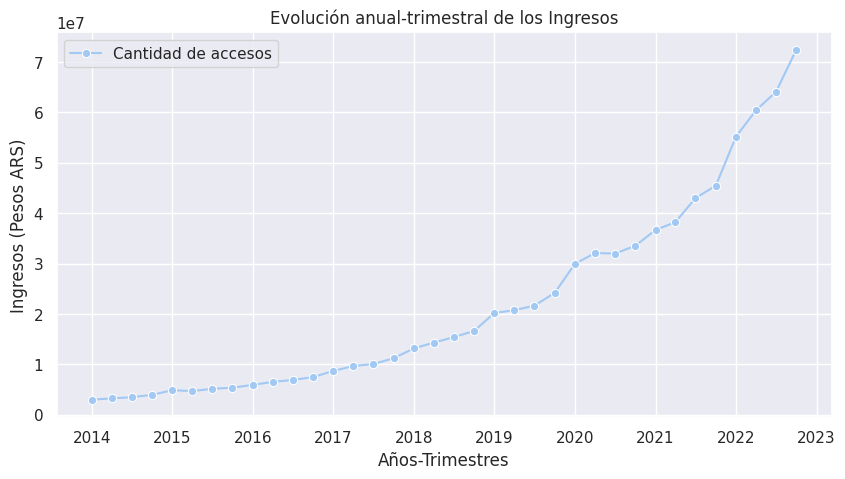

In [100]:
# Cambiar el tamaño del gráfico
plt.figure(figsize=(10, 5))

# Graficar la evolución de los Ingresos en pesos argentinos
sns.lineplot(x ='Fecha', y = 'Ingresos (Pesos ARS)', data = ingresos_trimestral, label = 'Cantidad de accesos', marker = 'o')
# Agregar etiquetas de eje y título del gráfico
plt.xlabel("Años-Trimestres")
plt.ylabel("Ingresos (Pesos ARS)")
plt.title("Evolución anual-trimestral de los Ingresos")

# Mostrar gráfico completo
plt.show()

In [101]:
# Agrupar los datos por año y sumar los ingresos trimestrales
ingresos_anual = ingresos_trimestral.groupby('Año').agg({'Ingresos (Pesos ARS)': 'sum'})

# Calcular el porcentaje de cambio anual de los ingresos
ingresos_anual['Cambio Ingresos'] = ingresos_anual['Ingresos (Pesos ARS)'].pct_change() * 100

# Imprimir los resultados
ingresos_anual

,Ingresos (Pesos ARS),Cambio Ingresos
Año,,
2014,13683949,NaN
2015,20108814,46.951834
2016,26867508,33.610605
2017,39671973,47.657807
2018,59539594,50.079740
2019,86772531,45.739205
2020,127585840,47.034826
2021,163383869,28.057995
2022,252169081,54.341480


**Apreciaciones:**

- Los ingresos trimestrales aumentaron en promedio alrededor del 45% al 50% anualmente en los primeros años del período analizado, de 2014 a 2018.

- En 2019, los ingresos trimestrales aumentaron en un 45,7%, una tasa ligeramente inferior a la media del período.

- En 2020, los ingresos trimestrales aumentaron en un 47%, una tasa similar a la media del período, a pesar de que fue un año complicado debido a la pandemia de COVID-19.

- En 2021, los ingresos trimestrales aumentaron en un 28%, una tasa significativamente inferior a la media del período, lo que podría indicar un impacto económico en la industria de servicios de internet fijo en Argentina.

- Sin embargo, en 2022 los ingresos trimestrales aumentaron en un 54%, una tasa mayor a la media del período y la más alta desde 2015.


# Datasets finales

Considerando la principal actividad de la empresa prestadora de servicios de telecomunicaciones que es el acceso a Internet, sugiero utilizar los siguientes datasets de la ENACOM:

- **Penetración de Internet fijo por hogares a nivel nacional**: Este conjunto de datos proporcionará información sobre la cantidad de hogares que tienen acceso a Internet fijo en todo el país y cómo ha evolucionado con el tiempo. Esto permitirá a la empresa comprender la penetración actual del servicio en el mercado y cómo esta penetración ha cambiado a lo largo del tiempo. Es posible que se complemente en el dashboard con Penetración de Internet fijo (accesos por cada 100 hogares)

- **Total nacional de accesos a Internet fijo por banda ancha y banda angosta**: Este conjunto de datos permitirá a la empresa comprender la proporción de accesos a Internet fijo que se realizan a través de banda ancha y banda angosta. Esto puede ayudar a la empresa a comprender mejor las necesidades de sus clientes y a ofrecer servicios personalizados que satisfagan esas necesidades. Es posible que se complemente en el dashboard con accesos a banda ancha y banda angosta por provincia

- **Acceso a Internet fijo por tecnología nacional**: Este conjunto de datos permitirá a la empresa comprender las preferencias de los clientes en cuanto a la tecnología utilizada para acceder a Internet fijo a nivel nacional. Es posible que se complemente en el dashboard con accesos a banda ancha y banda angosta por provincia, ya que esto puede ayudar a la empresa a personalizar sus ofertas de servicios

- **Velocidad media de bajada de Internet por provincia**: Este conjunto de datos permitirá a la empresa comprender la velocidad media de descarga del servicio de Internet fijo en diferentes provincias. Esto puede ayudar a la empresa a identificar áreas de mejora en la calidad del servicio y enfocar sus esfuerzos en esas áreas.

- **Accesos a Internet fijo por velocidad de bajada y provincia**: Este conjunto de datos permitirá a la empresa comprender la distribución de los accesos a Internet fijo por velocidad de descarga en diferentes provincias. Esto puede ayudar a la empresa a comprender mejor las necesidades de los clientes en cuanto a la velocidad de descarga y ofrecer planes de servicio personalizados que satisfagan esas necesidades.

- **Ingresos trimestrales por la prestación del servicio de Internet fijo**: Este conjunto de datos puede ser muy útil para la empresa prestadora de servicios de telecomunicaciones ya que puede ser útil para evaluar la rentabilidad del servicio de Internet fijo y para identificar oportunidades de crecimiento en el mercado. La empresa podría utilizar esta información para ajustar su estrategia de precios y para desarrollar nuevos planes de servicio que satisfagan las necesidades de los clientes y aumenten los ingresos.

In [ ]:
# Se exporta toda la data ya analizada en formato .csv
penetracion_internet_fijo.to_csv('penetracion_internet_fijo.csv', sep = ',', index = False)
# Se exporta toda la data ya analizada en formato .csv
penetracion_hogares_prov.to_csv('penetracion_hogares_provincia.csv', sep = ',', index = False, encoding = 'ISO 8859-1')

# Se exporta toda la data ya analizada en formato .csv
internet_baf.to_csv('internet_baf.csv', sep = ',', index = False)
# Se exporta toda la data ya analizada en formato .csv
inter_baf_provincia.to_csv('inter_baf_provincia.csv', sep = ',', index = False, encoding = 'ISO 8859-1')

# Se exporta toda la data ya analizada en formato .csv
acceso_internet_tecnologia.to_csv('acceso_internet_tecnologia.csv', sep = ',', index = False)
# Se exporta toda la data ya analizada en formato .csv
acceso_tecnologia_provincia.to_csv('acceso_tecnologia_provincia.csv', sep = ',', index = False, encoding = 'ISO 8859-1')

# Se exporta toda la data ya analizada en formato .csv
velocidad_media_nacional.to_csv('velocidad_media_nacional.csv', sep = ',', index = False)
# Se exporta toda la data ya analizada en formato .csv
velocidad_media_provincia.to_csv('velocidad_media_provincia.csv', sep = ',', index = False, encoding = 'ISO 8859-1')

In [102]:
# Se exporta toda la data ya analizada en formato .csv
acceso_nacional_velocidad.to_csv('acceso_nacional_velocidad.csv', sep = ',', index = False)
# Se exporta toda la data ya analizada en formato .csv
# acceso_velocidad_provincia.to_csv('acceso_velocidad_provincia.csv', sep = ',', index = False, encoding = 'ISO 8859-1')

# Se exporta toda la data ya analizada en formato .csv
ingresos_trimestral.to_csv('ingresos_trimestral.csv', sep = ',', index = False)